In [5]:
#Import stuff
import uproot4
import numpy as np
import awkward as ak
from scipy.stats import norm
from scipy.optimize import curve_fit
import os
import copy

import tensorflow.keras as keras
import tensorflow as tf
import tensorflow_model_optimization as tfmot

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, Sequential, load_model

from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.model_selection import train_test_split

import optparse
import importlib
import pathlib
from keras import optimizers


import hist
from hist import Hist

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.pyplot import cm
import mplhep as hep
plt.style.use(hep.style.ROOT)

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'medium',
         'ytick.labelsize':'medium'}
pylab.rcParams.update(params)

#line thickness
import matplotlib as mpl
mpl.rcParams['lines.linewidth'] = 5

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],[tf.config.experimental.VirtualDeviceConfiguration(memory_limit=500)])
    except RuntimeError as e:
        print(e)

model_name = '../models/merged_pt_regress_jet_ID.h5'


import random

random.seed(420365)
tf.random.set_seed(420365)
np.random.seed(420365)

def create_train_test_data(dir_path, del_percent, test_index=400000, train = True):
        
    #Might have to change the version for other ntuple files
    sig = uproot4.open(dir_path+"/test_sig_v12_emseed.root")
    bkg = uproot4.open(dir_path+"/test_bkg_v12_emseed.root")
    qcd = uproot4.open(dir_path+"/test_qcd_v12_emseed.root")
    
    if train:
        sig_input = sig['ntuplePupSingle']['tree']['m_inputs'].array()[:test_index]
        bkg_input = bkg['ntuplePupSingle']['tree']['m_inputs'].array()[:test_index]
        qcd_input = qcd['ntuplePupSingle']['tree']['m_inputs'].array()

        truth_pt_sig = np.asarray(sig['ntuplePupSingle']['tree']['genpt1'].array()[:test_index])
        truth_pt_bkg = np.asarray(bkg['ntuplePupSingle']['tree']['genpt1'].array()[:test_index])
        truth_pt_qcd = np.asarray(qcd['ntuplePupSingle']['tree']['genpt1'].array())

        reco_pt_sig = sig['ntuplePupSingle']['tree']['pt'].array()[:test_index]
        deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[:test_index]
        eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[:test_index]
        selection_sig = (reco_pt_sig > 0.) & (abs(deltaR_sig) < 0.4) & (abs(eta_sig) < 2.4)
        y_sig_pT = truth_pt_sig[selection_sig]

        reco_pt_bkg = bkg['ntuplePupSingle']['tree']['pt'].array()[:test_index]
    else:
        sig_input = sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
        bkg_input = bkg['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
        qcd_input = qcd['ntuplePupSingle']['tree']['m_inputs'].array()

        truth_pt_sig = np.asarray(sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:])
        truth_pt_bkg = np.asarray(bkg['ntuplePupSingle']['tree']['genpt1'].array()[test_index:])
        truth_pt_qcd = np.asarray(qcd['ntuplePupSingle']['tree']['genpt1'].array())
        reco_pt_sig = sig['ntuplePupSingle']['tree']['pt'].array()[test_index:]
        deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
        eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]
        selection_sig = (reco_pt_sig > 0.) & (abs(deltaR_sig) < 0.4) & (abs(eta_sig) < 2.4)
        y_sig_pT = truth_pt_sig[selection_sig]

        reco_pt_bkg = bkg['ntuplePupSingle']['tree']['pt'].array()[test_index:]
        
    
    selection_bkg = reco_pt_bkg > 10
    y_bkg_pT = truth_pt_bkg[selection_bkg]
    reco_pt_qcd = qcd['ntuplePupSingle']['tree']['pt'].array()
    selection_qcd = reco_pt_qcd > 10
    y_qcd_pT = truth_pt_qcd[selection_qcd]
        
    #Inputs: pt, eta, phi, particle id(one hot encoded)
    X_sig = np.nan_to_num(np.asarray(sig_input[selection_sig]))
    y_sig = np.full(X_sig.shape[0], 1.)
    sig_pt = np.asarray(reco_pt_sig[selection_sig])
    
    X_bkg = np.nan_to_num(np.asarray(bkg_input)[selection_bkg])
    y_bkg = np.full(X_bkg.shape[0], 0.)
    bkg_pt = np.asarray(reco_pt_bkg[selection_bkg])
    
    X_qcd = np.nan_to_num(np.asarray(qcd_input)[selection_qcd])
    y_qcd = np.full(X_qcd.shape[0], 0.)
    qcd_pt = np.asarray(reco_pt_qcd[selection_qcd])
    
    background_pt = np.concatenate([bkg_pt, qcd_pt])
    
    print(y_sig, y_bkg, y_qcd)
    
    if train:
        X_bkg = list(X_bkg)
        y_bkg = list(y_bkg)
        y_bkg_pT = list(y_bkg_pT)
        percent = del_percent
        for _ in range(int(percent*len(X_bkg))):
            n = len(X_bkg)
            random_ind = random.randint(0, n - 1)
            del X_bkg[random_ind]
            del y_bkg[random_ind]
            del y_bkg_pT[random_ind]
        X_bkg = np.asarray(X_bkg)
        y_bkg = np.asarray(y_bkg)
        y_bkg_pT = np.asarray(y_bkg_pT)
        
        X_qcd = list(X_qcd)
        y_qcd = list(y_qcd)
        y_qcd_pT = list(y_qcd_pT)
        for _ in range(int(percent*len(X_qcd))):
            n = len(X_qcd)
            random_ind = random.randint(0, n - 1)
            del X_qcd[random_ind]
            del y_qcd[random_ind]
            del y_qcd_pT[random_ind]
        X_qcd = np.asarray(X_qcd)
        y_qcd = np.asarray(y_qcd)
        y_qcd_pT = np.asarray(y_qcd_pT)

    X_train = np.concatenate([X_sig, X_bkg, X_qcd])
    y_train_jetID = np.concatenate([y_sig, y_bkg, y_qcd])
    MinBias_pT_1 = [1 for i in y_bkg_pT]
    qcd_pT_1 = [1 for i in y_qcd_pT]
#     y_train_pT = np.concatenate([y_sig_pT / sig_pt, y_bkg_pT / bkg_pT, y_qcd_pT / qcd_pt])
    y_train_pT = np.concatenate([y_sig_pT / sig_pt, MinBias_pT_1, qcd_pT_1])
    pt_array = np.concatenate([sig_pt, bkg_pt, qcd_pt])
    
    X_train[abs(X_train) > 1e+9] = 0.
    
    assert not np.any(np.isnan(X_train))
    assert not np.any(np.isnan(y_train_jetID))
    assert not np.any(np.isnan(y_train_pT))
    
    return X_train, y_train_jetID, y_train_pT


def merged_model():

    inputs = tf.keras.layers.Input(shape=(80,), name='model_input')
    
    main_branch = tf.keras.layers.Dense(25, activation = "LeakyReLU", name='Dense1')(inputs)
    main_branch = tf.keras.layers.Dense(25, activation = "LeakyReLU", name='Dense2')(main_branch)
    main_branch = tf.keras.layers.Dense(15, activation = "LeakyReLU", name='Dense3')(main_branch)
    main_branch = tf.keras.layers.Dense(15, activation = "LeakyReLU", name='Dense4')(main_branch)
    main_branch = tf.keras.layers.Dense(10, activation = "LeakyReLU", name='Dense5')(main_branch)

    jetID_branch = tf.keras.layers.Dense(1, activation='sigmoid', name='jetID_output')(main_branch)

    pT_branch = tf.keras.layers.Dense(1, name='pT_output')(main_branch)

    model = tf.keras.Model(inputs = inputs, outputs = [jetID_branch, pT_branch])
    
    return model

# Coupling Loss Functions

def compile_model(model, gamma):
    opt = optimizers.Adam()
    model.compile(optimizer=opt,
                  loss={'jetID_output': 'binary_crossentropy', 
                        'pT_output': 'mean_squared_error'},
                  loss_weights={'jetID_output': gamma, 
                                'pT_output': 1 - gamma}, 
                  metrics=['accuracy'])
        
    return model


import time
# FIT BATCH OF MODELS

def fit_batch(gamma_values):
    
    history = list()
    trained_models = list()
    
    print('Starting training on batch of models for gamma values ', gamma_values, '\n\n')
    
    for gamma in gamma_values:
        callback = tf.keras.callbacks.EarlyStopping(verbose = 1, patience=5)
        print('Training model for gamma equal to ', gamma)
        #quantize_annotate_layer = tfmo.quantization.keras.quantize_annotate_layer
        model = merged_model()
        # Quantize the entire model.
        #model = tfmot.quantization.keras.quantize_model(model)
        model = compile_model(model, gamma)
        model.summary()
        
        start = time.time()
        model_history = model.fit({'model_input': X_train},
                            {'jetID_output': y_train_jetID, 'pT_output': y_train_pT_regress},
                            epochs=20, batch_size=256, verbose=2, validation_split=0.20, callbacks = [callback])
        print(f'Training time: {time.time() - start}\n')
        history.append(model_history)
        trained_models.append(model)
        
    return history, trained_models

X_test_jetID, y_test_jetID, y_test_pT_regress = create_train_test_data("../../ntuples/Jan_25_2023", 
                                                                           minbias_percent,
                                                                           train=False)
X_test = X_test_jetID
y_test = y_test_pT_regress

for minbias_percent in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
    
    X_train_jetID, y_train_jetID,y_train_pT_regress = create_train_test_data("../../ntuples/Jan_25_2023", 
                                                                             minbias_percent,
                                                                             train=True)
    
    X_train = X_train_jetID
    y_train = y_train_pT_regress
    

    
    # PLOTTING PUPPI ===============================================================================================

    model_id_name = '../../models/Feb_4_2023_JetMetTalk_v1_pTShape_EMSeed.h5'
    model_id = load_model(model_id_name)
    minbias_path = "../../ntuples/Jan_25_2023/test_bkg_v12_emseed.root"
    sig_path = "../../ntuples/Jan_25_2023/test_sig_v12_emseed.root"
    TreeName='ntuplePupSingle'

    modelID = load_model(model_id_name)

    truth_sig_pt_cut=75,
    minbias_pt_cut_value=75
    test_index=400000

    #Load the data
    MinBias = uproot4.open(minbias_path)
    sig = uproot4.open(sig_path)

    #Signal data prep
    truth_pt_sig = sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    truth_deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    truth_eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection_sig = (truth_pt_sig > truth_sig_pt_cut) & (abs(truth_deltaR_sig) < 0.4) &(abs(truth_eta_sig) < 2.4)

    sig_id = np.asarray(sig['ntuplePupSingle']['tree']['event'].array()[test_index:][selection_sig])
    sig_pt = np.asarray(sig['ntuplePupSingle']['tree']['pt'].array()[test_index:][selection_sig])
    sig_input = np.asarray(sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][selection_sig])      

    #Pick out unique events
    minbias_id, minbias_index = np.unique(np.asarray(MinBias[TreeName]['tree']['event'].array()[test_index:]), return_index=True)
    sig_id_temp, sig_index_temp = np.unique(sig_id, return_index=True)

    true_sig_id, _, true_signal_index = np.intersect1d(np.unique(minbias_id), np.unique(sig_id_temp), return_indices=True)

    #True signal data preparation (these are events that actually overlaps with MinBias)
    true_sig_pt = sig_pt[sig_index_temp][true_signal_index]
    true_sig_input = sig_input[sig_index_temp][true_signal_index]
    true_sig_score = modelID.predict(true_sig_input).flatten()

    minbias_pt = MinBias['ntuplePupSingle']['tree']['pt'].array()[test_index:][minbias_index]
    minbias_input = np.asarray(MinBias['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][minbias_index])
    minbias_input[abs(minbias_input) > 1e+9] = 0.

    minbias_score = modelID.predict(minbias_input).flatten()

    #
    sig_pt_cut = true_sig_pt > minbias_pt_cut_value
    minbias_pt_cut = minbias_pt > minbias_pt_cut_value

    true_sig_score_pt = true_sig_score[sig_pt_cut]
    minbias_score_pt = minbias_score[minbias_pt_cut]

    #Now apply correction
    model_regress = load_model("../models/pt_regress_v1_bestest.h5")

    minbias_pt_corrected_ratio = model_regress.predict(minbias_input).flatten()
    minbias_pt_corrected = np.multiply(minbias_pt, minbias_pt_corrected_ratio)

    true_sig_pt_corrected_ratio = model_regress.predict(true_sig_input).flatten()
    true_sig_pt_corrected = np.multiply(true_sig_pt, true_sig_pt_corrected_ratio)

    sig_pt_cut_corrected = true_sig_pt_corrected > minbias_pt_cut_value
    minbias_pt_cut_corrected = minbias_pt_corrected > minbias_pt_cut_value

    true_sig_score_pt_corrected = true_sig_score[sig_pt_cut_corrected]
    minbias_score_pt_corrected = minbias_score[minbias_pt_cut_corrected]

    n_event = minbias_index.shape[0]
    n_sig_event = true_sig_id.shape[0]

    ##LOOP to calculate the ROC curves
    tau_score_edges = [round(i,2) for i in np.arange(0, 0.8, 0.01).tolist()]+\
                  [round(i,4) for i in np.arange(0.9, 1, 0.0001)] + [1]

    sig_list = []
    bkg_list = []

    for tau_score_cut in tau_score_edges:

        bkg_pass = sum(minbias_score_pt>tau_score_cut)
        sig_pass = sum(true_sig_score_pt>tau_score_cut)

        sig_list.append(sig_pass/n_sig_event)
        bkg_list.append(bkg_pass/n_event)


    bkg_list_scaled = [i*(32e+3) for i in bkg_list]

    sig_list_corrected = []
    bkg_list_corrected = []

    for tau_score_cut in tau_score_edges:
        bkg_pass = sum(minbias_score_pt_corrected>tau_score_cut)
        sig_pass = sum(true_sig_score_pt_corrected>tau_score_cut)

        sig_list_corrected.append(sig_pass/n_sig_event)
        bkg_list_corrected.append(bkg_pass/n_event)

    bkg_list_scaled_corrected = [i*(32e+3) for i in bkg_list_corrected]
    sig_list_corrected_separate = sig_list_corrected
    bkg_list_scaled_corrected_separate = bkg_list_scaled_corrected

    #plt.plot(sig_list, bkg_list_scaled, label=r'No $p_T$ Correction',linewidth=5)
    #plt.plot(sig_list_corrected, bkg_list_scaled_corrected, label=r'ID + $p_T$ correction separate',linewidth=5)

















    #Load the data
    MinBias = uproot4.open(minbias_path)
    sig = uproot4.open(sig_path)

    #Signal data prep
    truth_pt_sig = sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    truth_deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    truth_eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection_sig = (truth_pt_sig > truth_sig_pt_cut) & (abs(truth_deltaR_sig) < 0.4) &(abs(truth_eta_sig) < 2.4)

    sig_id = np.asarray(sig['ntuplePupSingle']['tree']['event'].array()[test_index:][selection_sig])
    sig_pt = np.asarray(sig['ntuplePupSingle']['tree']['pt'].array()[test_index:][selection_sig])
    sig_input = np.asarray(sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][selection_sig])      

    #Pick out unique events
    minbias_id, minbias_index = np.unique(np.asarray(MinBias[TreeName]['tree']['event'].array()[test_index:]), return_index=True)
    sig_id_temp, sig_index_temp = np.unique(sig_id, return_index=True)

    true_sig_id, _, true_signal_index = np.intersect1d(np.unique(minbias_id), np.unique(sig_id_temp), return_indices=True)

    #True signal data preparation (these are events that actually overlaps with MinBias)
    true_sig_pt = sig_pt[sig_index_temp][true_signal_index]
    true_sig_input = sig_input[sig_index_temp][true_signal_index]
    for i in range(1):
        if i == 0:
            modelID = load_model("../models/merged_11_gamma33.h5") # merged
            model_regress = load_model("../models/merged_11_gamma33.h5")
        #modelID = ModelNameID[i]
        true_sig_score = modelID.predict(true_sig_input)[0].flatten()

        minbias_pt = MinBias['ntuplePupSingle']['tree']['pt'].array()[test_index:][minbias_index]
        minbias_input = np.asarray(MinBias['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][minbias_index])
        minbias_input[abs(minbias_input) > 1e+9] = 0.

        minbias_score = modelID.predict(minbias_input)[0].flatten()

        #
        sig_pt_cut = true_sig_pt > minbias_pt_cut_value
        minbias_pt_cut = minbias_pt > minbias_pt_cut_value

        true_sig_score_pt = true_sig_score[sig_pt_cut]
        minbias_score_pt = minbias_score[minbias_pt_cut]

        #Now apply correction
    #     for i in range(len(ModelNameRegress)):
        #model_regress = load_model(ModelNameRegress)

        minbias_pt_corrected_ratio = model_regress.predict(minbias_input)[1].flatten()
        minbias_pt_corrected = np.multiply(minbias_pt, minbias_pt_corrected_ratio)

        true_sig_pt_corrected_ratio = model_regress.predict(true_sig_input)[1].flatten()
        true_sig_pt_corrected = np.multiply(true_sig_pt, true_sig_pt_corrected_ratio)

        sig_pt_cut_corrected = true_sig_pt_corrected > minbias_pt_cut_value
        minbias_pt_cut_corrected = minbias_pt_corrected > minbias_pt_cut_value

        true_sig_score_pt_corrected = true_sig_score[sig_pt_cut_corrected]
        minbias_score_pt_corrected = minbias_score[minbias_pt_cut_corrected]

        n_event = minbias_index.shape[0]
        n_sig_event = true_sig_id.shape[0]

        ##LOOP to calculate the ROC curves
        tau_score_edges = [round(i,2) for i in np.arange(0, 0.8, 0.01).tolist()]+\
                      [round(i,4) for i in np.arange(0.9, 1, 0.0001)] + [1]

        sig_list_corrected = []
        bkg_list_corrected = []

        for tau_score_cut in tau_score_edges:
            bkg_pass = sum(minbias_score_pt_corrected>tau_score_cut)
            sig_pass = sum(true_sig_score_pt_corrected>tau_score_cut)

            sig_list_corrected.append(sig_pass/n_sig_event)
            bkg_list_corrected.append(bkg_pass/n_event)

        bkg_list_scaled_corrected = [i*(32e+3) for i in bkg_list_corrected]
    sig_list_corrected_merged = sig_list_corrected
    bkg_list_scaled_corrected_merged = bkg_list_scaled_corrected

    def prep_rate_data(NormalModelID, 
                       ModelNameID,
                 ModelNameRegress,
                 truth_sig_pt_cut=50,
                 minbias_pt_cut_value=50,
                 minbias_path = "../../ntuples/Jan_25_2023/test_bkg_v12_emseed.root",
                 sig_path = "../../ntuples/Jan_25_2023/test_sig_v12_emseed.root",
                 TreeName='ntuplePupSingle',
                 test_index=400000):


        plt.plot(sig_list, bkg_list_scaled, label=r'Tau NN ID (No $p_T$ Correction)',linewidth=5)
        plt.plot(sig_list_corrected_separate, bkg_list_scaled_corrected_separate, label=r'ID + $p_T$ correction separate',linewidth=5)
        plt.plot(sig_list_corrected_merged, bkg_list_scaled_corrected_merged, label=r'Merged, $\gamma=0.3$',linewidth=5)


        #Load the data
        MinBias = uproot4.open(minbias_path)
        sig = uproot4.open(sig_path)

        #Signal data prep
        truth_pt_sig = sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
        truth_deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
        truth_eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

        selection_sig = (truth_pt_sig > truth_sig_pt_cut) & (abs(truth_deltaR_sig) < 0.4) &(abs(truth_eta_sig) < 2.4)

        sig_id = np.asarray(sig['ntuplePupSingle']['tree']['event'].array()[test_index:][selection_sig])
        sig_pt = np.asarray(sig['ntuplePupSingle']['tree']['pt'].array()[test_index:][selection_sig])
        sig_input = np.asarray(sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][selection_sig])      

        #Pick out unique events
        minbias_id, minbias_index = np.unique(np.asarray(MinBias[TreeName]['tree']['event'].array()[test_index:]), return_index=True)
        sig_id_temp, sig_index_temp = np.unique(sig_id, return_index=True)

        true_sig_id, _, true_signal_index = np.intersect1d(np.unique(minbias_id), np.unique(sig_id_temp), return_indices=True)

        #True signal data preparation (these are events that actually overlaps with MinBias)
        true_sig_pt = sig_pt[sig_index_temp][true_signal_index]
        true_sig_input = sig_input[sig_index_temp][true_signal_index]
        for i in range(len(ModelNameID)):
            modelID = ModelNameID[i]
            true_sig_score = modelID.predict(true_sig_input)[0].flatten()

            minbias_pt = MinBias['ntuplePupSingle']['tree']['pt'].array()[test_index:][minbias_index]
            minbias_input = np.asarray(MinBias['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][minbias_index])
            minbias_input[abs(minbias_input) > 1e+9] = 0.

            minbias_score = modelID.predict(minbias_input)[0].flatten()

            #
            sig_pt_cut = true_sig_pt > minbias_pt_cut_value
            minbias_pt_cut = minbias_pt > minbias_pt_cut_value

            true_sig_score_pt = true_sig_score[sig_pt_cut]
            minbias_score_pt = minbias_score[minbias_pt_cut]

            #Now apply correction
        #     for i in range(len(ModelNameRegress)):
            #model_regress = load_model(ModelNameRegress)
            model_regress = ModelNameRegress[i]

            minbias_pt_corrected_ratio = model_regress.predict(minbias_input)[1].flatten()
            minbias_pt_corrected = np.multiply(minbias_pt, minbias_pt_corrected_ratio)

            true_sig_pt_corrected_ratio = model_regress.predict(true_sig_input)[1].flatten()
            true_sig_pt_corrected = np.multiply(true_sig_pt, true_sig_pt_corrected_ratio)

            sig_pt_cut_corrected = true_sig_pt_corrected > minbias_pt_cut_value
            minbias_pt_cut_corrected = minbias_pt_corrected > minbias_pt_cut_value

            true_sig_score_pt_corrected = true_sig_score[sig_pt_cut_corrected]
            minbias_score_pt_corrected = minbias_score[minbias_pt_cut_corrected]

            n_event = minbias_index.shape[0]
            n_sig_event = true_sig_id.shape[0]

            ##LOOP to calculate the ROC curves
            tau_score_edges = [round(i,2) for i in np.arange(0, 0.8, 0.01).tolist()]+\
                          [round(i,4) for i in np.arange(0.9, 1, 0.0001)] + [1]

            sig_list_corrected = []
            bkg_list_corrected = []

            for tau_score_cut in tau_score_edges:
                bkg_pass = sum(minbias_score_pt_corrected>tau_score_cut)
                sig_pass = sum(true_sig_score_pt_corrected>tau_score_cut)

                sig_list_corrected.append(sig_pass/n_sig_event)
                bkg_list_corrected.append(bkg_pass/n_event)

            bkg_list_scaled_corrected = [i*(32e+3) for i in bkg_list_corrected]

            plt.plot(sig_list_corrected, bkg_list_scaled_corrected, label=r'Tau NN ID, $\gamma=$' + str(round(gammas[i], 1)),linewidth=2)
            hep.cms.text("Phase 2 Simulation")
            hep.cms.lumitext("PU 200 (14 TeV)")

            plt.ylabel(r'$Single \tau_h$ Trigger Rate [kHz]')
            plt.xlabel(r'$\tau_h$ [$p_T^{gen} > % d$ GeV]' %int(truth_sig_pt_cut))

            plt.yscale('log')
            #plt.legend(loc='best',fontsize=20)
            plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

        plt.plot([],[], 'none', label=r'(MinBias $p_T^{reco (or~corrected)}$ >  % d GeV)'%int(minbias_pt_cut_value))
        plt.savefig('gridscan/qmerged_' + str(num_filters) + "_" + str(kernel_size) + "_"
                              + str(stride_length) + ".png", bbox_inches = "tight")
        plt.show()

        return n_event, n_sig_event, true_sig_score_pt, minbias_score_pt, true_sig_score_pt_corrected, minbias_score_pt_corrected




[1. 1. 1. ... 1. 1. 1.] [0. 0. 0. ... 0. 0. 0.] [0. 0. 0. ... 0. 0. 0.]
[1. 1. 1. ... 1. 1. 1.] [0. 0. 0. ... 0. 0. 0.] [0. 0. 0. ... 0. 0. 0.]


In [66]:
gammas = np.linspace(0, 1, 10)
training_history, trained_models = fit_batch(gammas)

Starting training on batch of models for gamma values  [0.         0.11111111 0.22222222 0.33333333 0.44444444 0.55555556
 0.66666667 0.77777778 0.88888889 1.        ] 


Training model for gamma equal to  0.0
Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 model_input (InputLayer)       [(None, 80)]         0           []                               
                                                                                                  
 Dense1 (Dense)                 (None, 25)           2025        ['model_input[0][0]']            
                                                                                                  
 Dense2 (Dense)                 (None, 25)           650         ['Dense1[0][0]']                 
                                                                               

                                                                                                  
 Dense5 (Dense)                 (None, 10)           160         ['Dense4[0][0]']                 
                                                                                                  
 jetID_output (Dense)           (None, 1)            11          ['Dense5[0][0]']                 
                                                                                                  
 pT_output (Dense)              (None, 1)            11          ['Dense5[0][0]']                 
                                                                                                  
Total params: 3,487
Trainable params: 3,487
Non-trainable params: 0
__________________________________________________________________________________________________
Epoch 1/20
646/646 - 2s - loss: 0.2738 - jetID_output_loss: 0.5306 - pT_output_loss: 0.2417 - jetID_output_accuracy: 0.7169 - pT_output_accu

Epoch 9/20
646/646 - 1s - loss: 0.1930 - jetID_output_loss: 0.3343 - pT_output_loss: 0.1526 - jetID_output_accuracy: 0.8533 - pT_output_accuracy: 0.3754 - val_loss: 0.1365 - val_jetID_output_loss: 0.4541 - val_pT_output_loss: 0.0458 - val_jetID_output_accuracy: 0.8207 - val_pT_output_accuracy: 0.9999 - 837ms/epoch - 1ms/step
Epoch 10/20
646/646 - 1s - loss: 0.1916 - jetID_output_loss: 0.3331 - pT_output_loss: 0.1512 - jetID_output_accuracy: 0.8535 - pT_output_accuracy: 0.3754 - val_loss: 0.1527 - val_jetID_output_loss: 0.4085 - val_pT_output_loss: 0.0796 - val_jetID_output_accuracy: 0.8265 - val_pT_output_accuracy: 0.9999 - 829ms/epoch - 1ms/step
Epoch 11/20
646/646 - 1s - loss: 0.1917 - jetID_output_loss: 0.3326 - pT_output_loss: 0.1514 - jetID_output_accuracy: 0.8534 - pT_output_accuracy: 0.3754 - val_loss: 0.1439 - val_jetID_output_loss: 0.4636 - val_pT_output_loss: 0.0526 - val_jetID_output_accuracy: 0.8157 - val_pT_output_accuracy: 0.9996 - 836ms/epoch - 1ms/step
Epoch 12/20
646/6

Epoch 15/20
646/646 - 1s - loss: 0.2088 - jetID_output_loss: 0.3302 - pT_output_loss: 0.1480 - jetID_output_accuracy: 0.8548 - pT_output_accuracy: 0.3753 - val_loss: 0.2246 - val_jetID_output_loss: 0.5282 - val_pT_output_loss: 0.0728 - val_jetID_output_accuracy: 0.7915 - val_pT_output_accuracy: 0.9995 - 833ms/epoch - 1ms/step
Epoch 16/20
646/646 - 1s - loss: 0.2083 - jetID_output_loss: 0.3297 - pT_output_loss: 0.1476 - jetID_output_accuracy: 0.8549 - pT_output_accuracy: 0.3753 - val_loss: 0.1998 - val_jetID_output_loss: 0.4668 - val_pT_output_loss: 0.0663 - val_jetID_output_accuracy: 0.8190 - val_pT_output_accuracy: 0.9999 - 833ms/epoch - 1ms/step
Epoch 17/20
646/646 - 1s - loss: 0.2079 - jetID_output_loss: 0.3297 - pT_output_loss: 0.1470 - jetID_output_accuracy: 0.8548 - pT_output_accuracy: 0.3754 - val_loss: 0.1898 - val_jetID_output_loss: 0.4550 - val_pT_output_loss: 0.0571 - val_jetID_output_accuracy: 0.8141 - val_pT_output_accuracy: 0.9997 - 826ms/epoch - 1ms/step
Epoch 17: early 

Epoch 2/20
646/646 - 1s - loss: 0.2791 - jetID_output_loss: 0.3606 - pT_output_loss: 0.1772 - jetID_output_accuracy: 0.8419 - pT_output_accuracy: 0.3749 - val_loss: 0.3122 - val_jetID_output_loss: 0.4993 - val_pT_output_loss: 0.0784 - val_jetID_output_accuracy: 0.8173 - val_pT_output_accuracy: 0.9965 - 822ms/epoch - 1ms/step
Epoch 3/20
646/646 - 1s - loss: 0.2649 - jetID_output_loss: 0.3421 - pT_output_loss: 0.1684 - jetID_output_accuracy: 0.8495 - pT_output_accuracy: 0.3752 - val_loss: 0.2081 - val_jetID_output_loss: 0.3236 - val_pT_output_loss: 0.0638 - val_jetID_output_accuracy: 0.8727 - val_pT_output_accuracy: 0.9961 - 824ms/epoch - 1ms/step
Epoch 4/20
646/646 - 1s - loss: 0.2602 - jetID_output_loss: 0.3374 - pT_output_loss: 0.1638 - jetID_output_accuracy: 0.8518 - pT_output_accuracy: 0.3751 - val_loss: 0.2964 - val_jetID_output_loss: 0.4768 - val_pT_output_loss: 0.0709 - val_jetID_output_accuracy: 0.8152 - val_pT_output_accuracy: 0.9983 - 821ms/epoch - 1ms/step
Epoch 5/20
646/646 

 Dense3 (Dense)                 (None, 15)           390         ['Dense2[0][0]']                 
                                                                                                  
 Dense4 (Dense)                 (None, 15)           240         ['Dense3[0][0]']                 
                                                                                                  
 Dense5 (Dense)                 (None, 10)           160         ['Dense4[0][0]']                 
                                                                                                  
 jetID_output (Dense)           (None, 1)            11          ['Dense5[0][0]']                 
                                                                                                  
 pT_output (Dense)              (None, 1)            11          ['Dense5[0][0]']                 
                                                                                                  
Total para

Epoch 8/20
646/646 - 1s - loss: 0.3116 - jetID_output_loss: 0.3294 - pT_output_loss: 0.1686 - jetID_output_accuracy: 0.8545 - pT_output_accuracy: 0.3751 - val_loss: 0.4068 - val_jetID_output_loss: 0.4504 - val_pT_output_loss: 0.0578 - val_jetID_output_accuracy: 0.8169 - val_pT_output_accuracy: 0.9958 - 821ms/epoch - 1ms/step
Epoch 8: early stopping
Training time: 7.223414182662964

Training model for gamma equal to  1.0
Model: "model_35"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 model_input (InputLayer)       [(None, 80)]         0           []                               
                                                                                                  
 Dense1 (Dense)                 (None, 25)           2025        ['model_input[0][0]']            
                                                               

In [67]:
# #Train the network
# callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', verbose=1, patience=5)
# X_train = X_train_jetID
# history = model.fit({'input': X_train},
#                             {'jetID_output': y_train_jetID, 'pT_output': y_train_pT_regress},
#                     epochs=20,
#                     batch_size=256,
#                     verbose=2,
#                     validation_split=0.20,
#                     callbacks = [callback])

In [68]:
# #Save the model
# model.save("../models/merged_error_test1.h5")

-----

## Evaluate the model 

So now that we trained for the ratio, let's plot it on the testing set!

**Now compare the truth pT distribution and the predicted distribution (just multiply it by the ratio)**

In [69]:
# # Get prediction for both tasks
# # (predictions will be done on the model trained with gamma=0.5)
# data = 
# for pred in trained_model.predict(data):
#     print('Task prediction: ', np.argmax(pred))


# make ROC curve for jetID
# pT distribution already have
# run for more gamma optimize (probably weight more on jetID?)
# all of the pT plots that we already did: eff, 95%, both rates
# 

In [70]:
# import matplotlib.pyplot as plt


# def plot_multitask_accuracies(gammas, training_history):
    
#     counter = 0

#     for history in training_history:

#         print(f'\nPlotting Accuracy vs Epochs for value of gamma number {gammas[counter]}\n')
#         plt.plot(range(len(history.history['jetID_output_accuracy'])), history.history['jetID_output_accuracy'], c='r', label='Task 1')
#         plt.plot(range(len(history.history['pT_output_accuracy'])), history.history['pT_output_accuracy'], c='b', label='Task 2')
#         plt.xlabel('Epochs')
#         plt.ylabel('Accuracy')
#         plt.legend()
#         plt.show()
#         counter += 1
    

In [71]:
# plot_multitask_accuracies(gammas, training_history)


In [72]:
#Load the pts and then plot the actual distributions

In [73]:
def load_and_predict_test(dir_path, model, test_index=400000):
    
    #Might have to change the version for other ntuple files
    data = uproot4.open(dir_path+"/test_sig_v12_emseed.root")
    inputs = data['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
    
    truth_pt = data['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    reco_pt = data['ntuplePupSingle']['tree']['pt'].array()[test_index:]
    deltaR = data['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    eta = data['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection = (reco_pt > 0.) & (abs(deltaR) < 0.4) & (abs(eta) < 2.4)
    
    truth_pt_selected = np.asarray(truth_pt[selection])
    reco_pt_selected = np.asarray(reco_pt[selection])
    
    X_test = np.asarray(inputs[selection])
    y_pred = model.predict(X_test)[1].flatten() # take the regression output
    print(y_pred)
    pred_pt = np.multiply(reco_pt_selected, y_pred)
    print(pred_pt)
    #Plot the pts
    plt.hist(truth_pt_selected, bins = 20, range = (0,300), density=True, histtype = 'step', label = 'Truth', linewidth=5)
    plt.hist(reco_pt_selected, bins = 20, range = (0,300), density=True, histtype = 'step', label = 'Reconstructed', linewidth=5)
    plt.hist(pred_pt, bins = 20, range = (0,300), density=True, histtype = 'step', label = 'NN Predicted', linewidth=5)

    plt.xlabel(r'$p_T$ [GeV]')
    plt.ylabel('a.u.')
    plt.legend()  
    plt.show()

2043/2043 [==============================] - 1s 544us/step
[1.1932046  1.1911297  0.63788366 ... 1.3725088  1.0165837  1.1619227 ]
[ 71.89058   46.156277 117.68954  ...  61.419765  73.95646   19.752686]


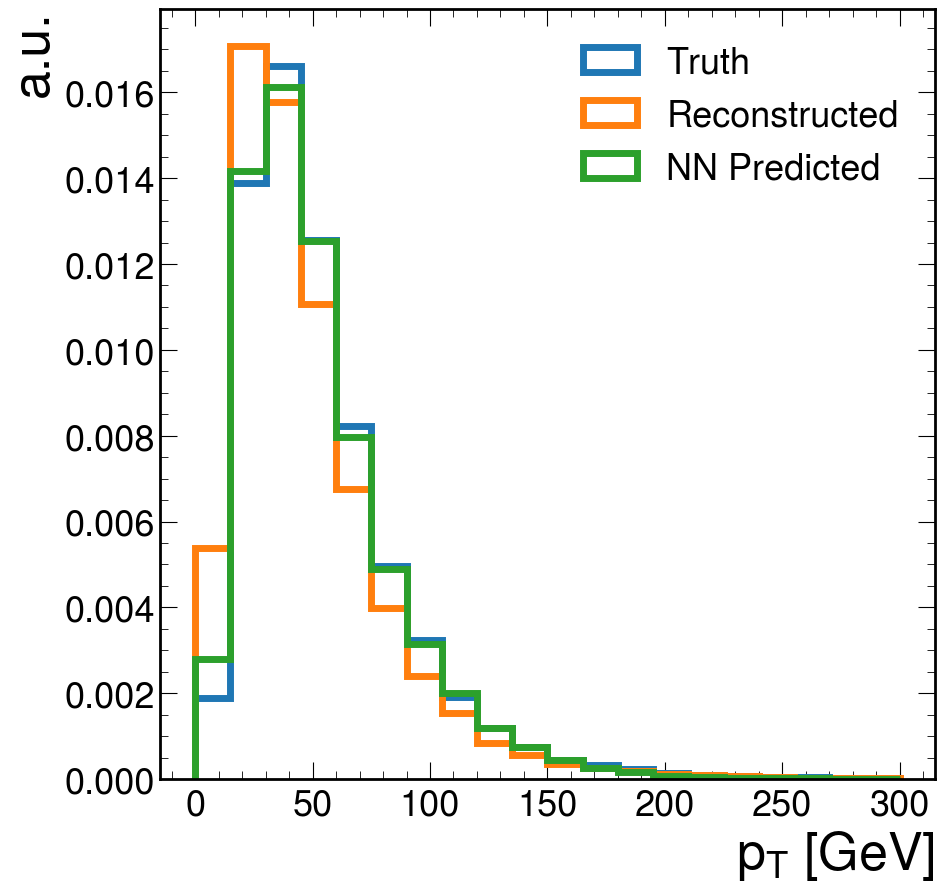

0.0
2043/2043 [==============================] - 1s 545us/step
[1.3065455 1.2637413 1.1674803 ... 1.3703203 1.1878945 1.2571722]
[ 78.71937   48.969975 215.40013  ...  61.321835  86.41932   21.371927]


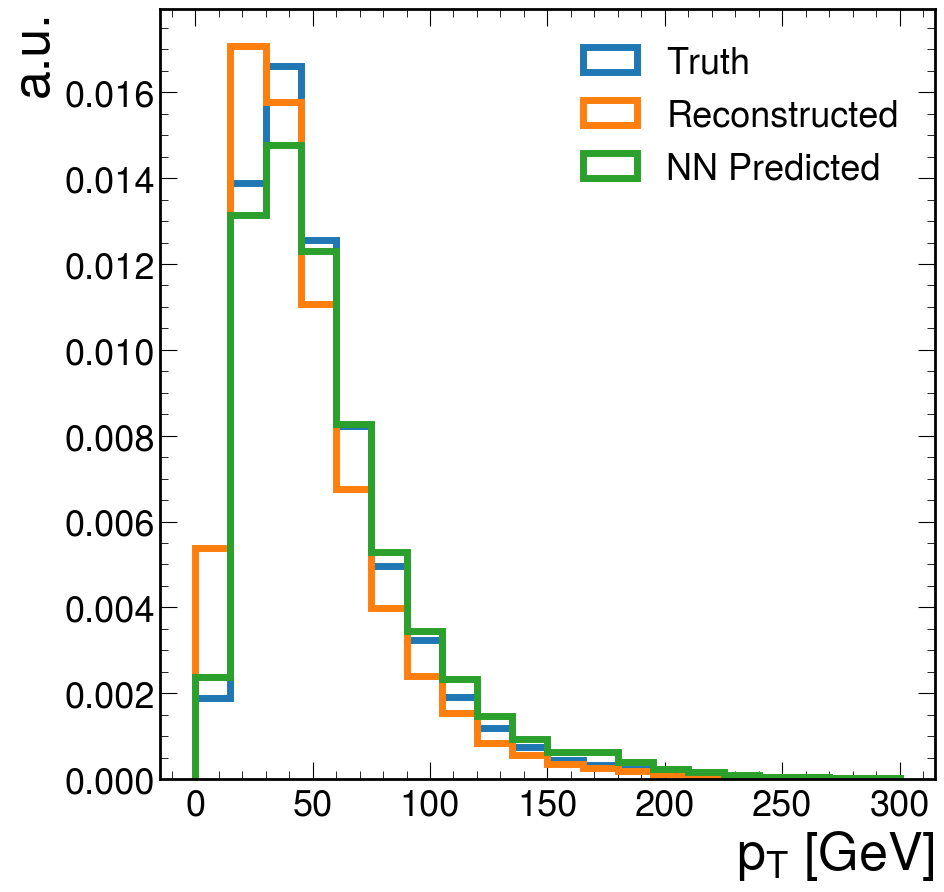

0.1111111111111111
2043/2043 [==============================] - 1s 547us/step
[1.0597495 1.3262378 1.4214544 ... 1.4238626 0.9932806 1.1533208]
[ 63.849907  51.391716 262.25833  ...  63.71785   72.26116   19.606453]


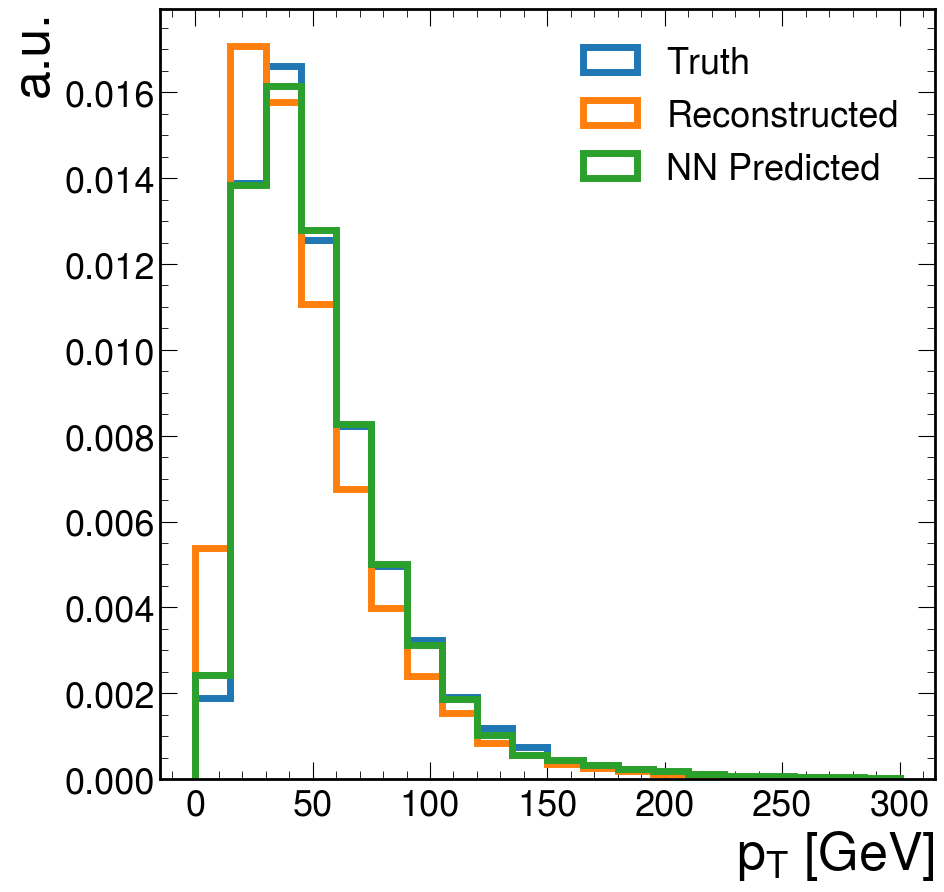

0.2222222222222222
2043/2043 [==============================] - 1s 545us/step
[1.1553707 1.2965164 0.9526832 ... 1.1691513 1.0061458 1.1817194]
[ 69.611084  50.240013 175.77005  ...  52.31952   73.19711   20.08923 ]


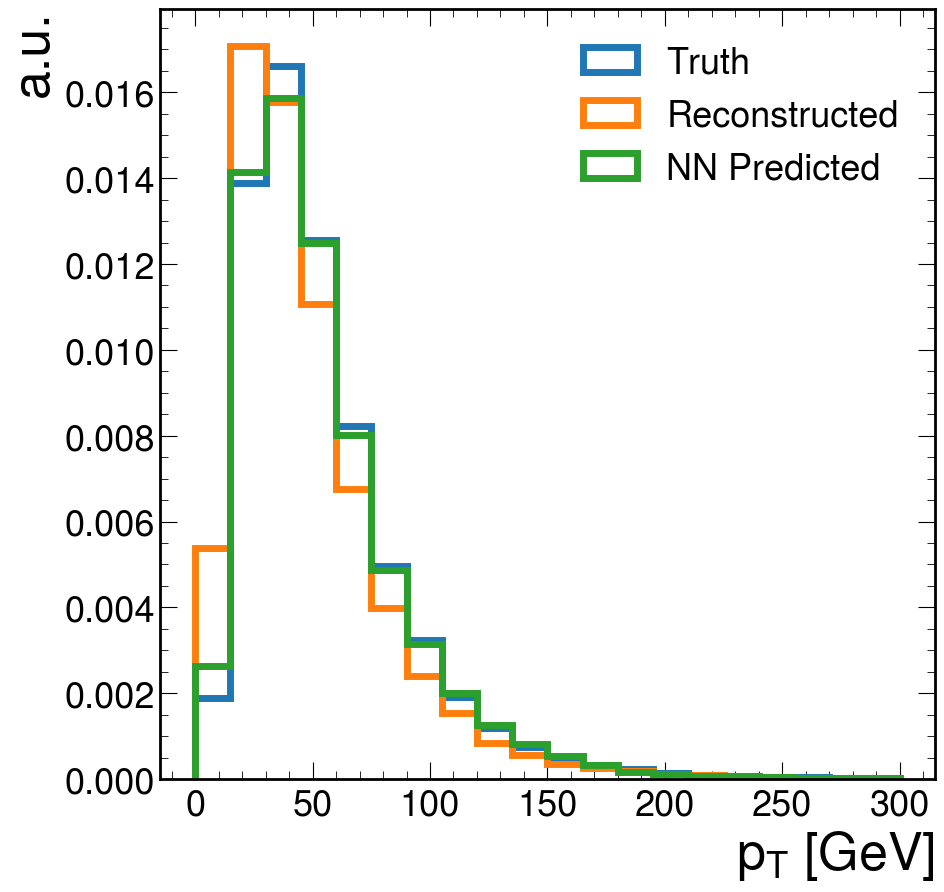

0.3333333333333333
2043/2043 [==============================] - 1s 543us/step
[1.2617594 1.3341154 1.0323004 ... 1.3169807 1.1323769 1.2187396]
[ 76.021     51.69697  190.45941  ...  58.934887  82.38042   20.718575]


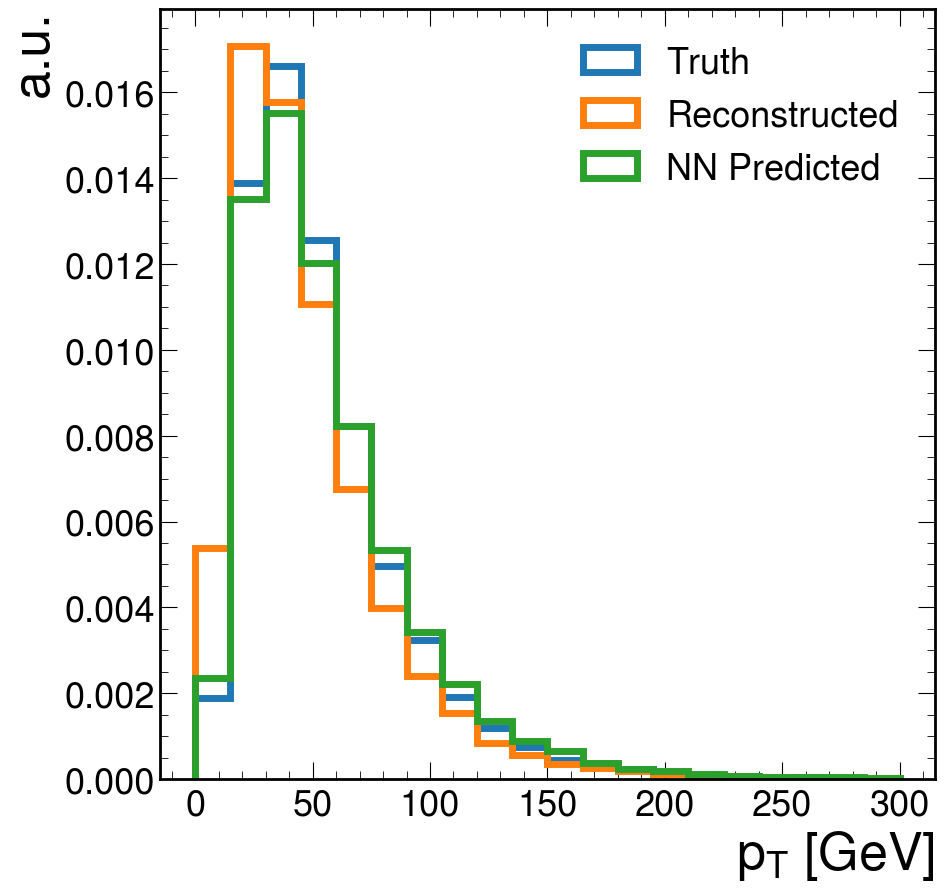

0.4444444444444444
2043/2043 [==============================] - 1s 544us/step
[1.3060125 1.3085546 1.0546525 ... 1.3875934 1.2689542 1.2902952]
[ 78.687256  50.706493 194.58337  ...  62.094803  92.316414  21.935019]


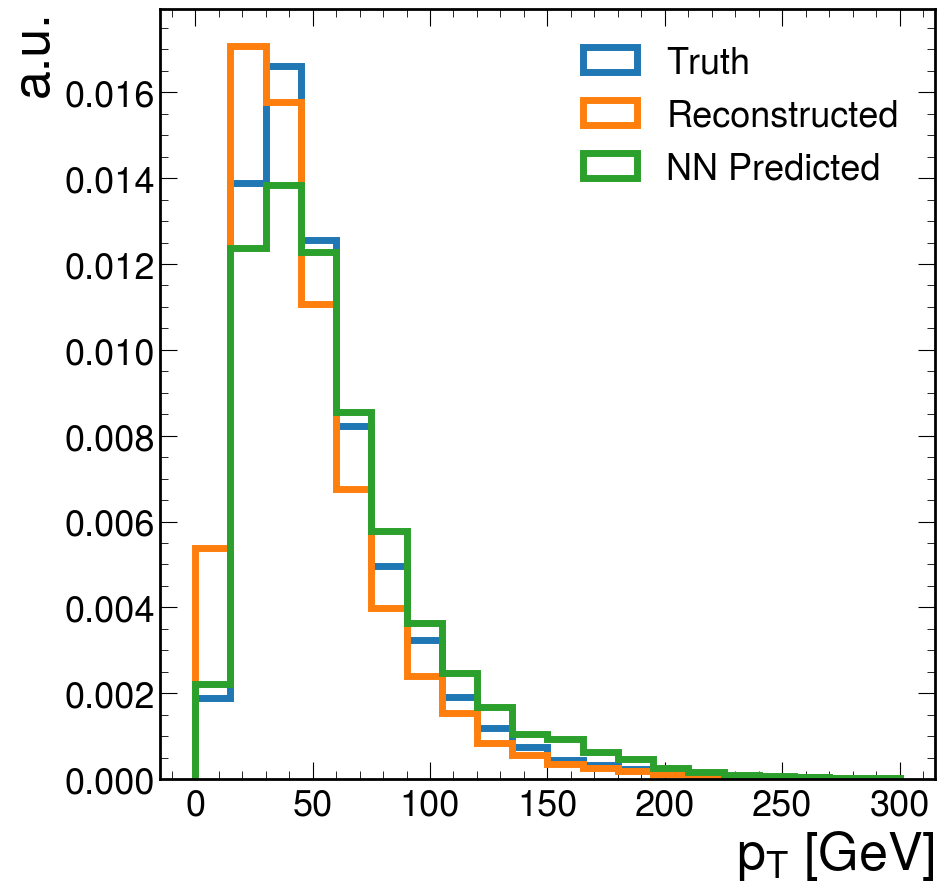

0.5555555555555556
2043/2043 [==============================] - 1s 547us/step
[1.2657044 1.2084533 0.9600394 ... 1.3897265 1.0355748 1.2201511]
[ 76.25869   46.827564 177.12726  ...  62.19026   75.338066  20.742569]


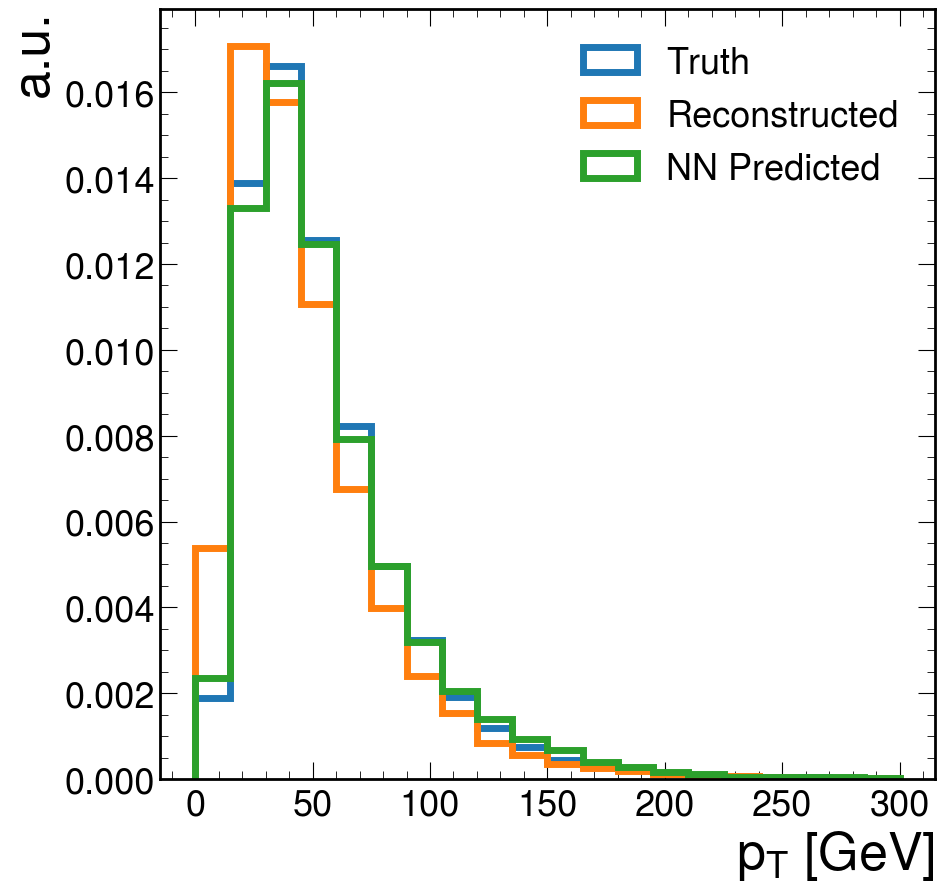

0.6666666666666666
2043/2043 [==============================] - 1s 553us/step
[1.2046812 1.161235  1.2926351 ... 1.2333742 0.9550374 1.1645389]
[ 72.58204   44.997856 238.49118  ...  55.193497  69.47897   19.797161]


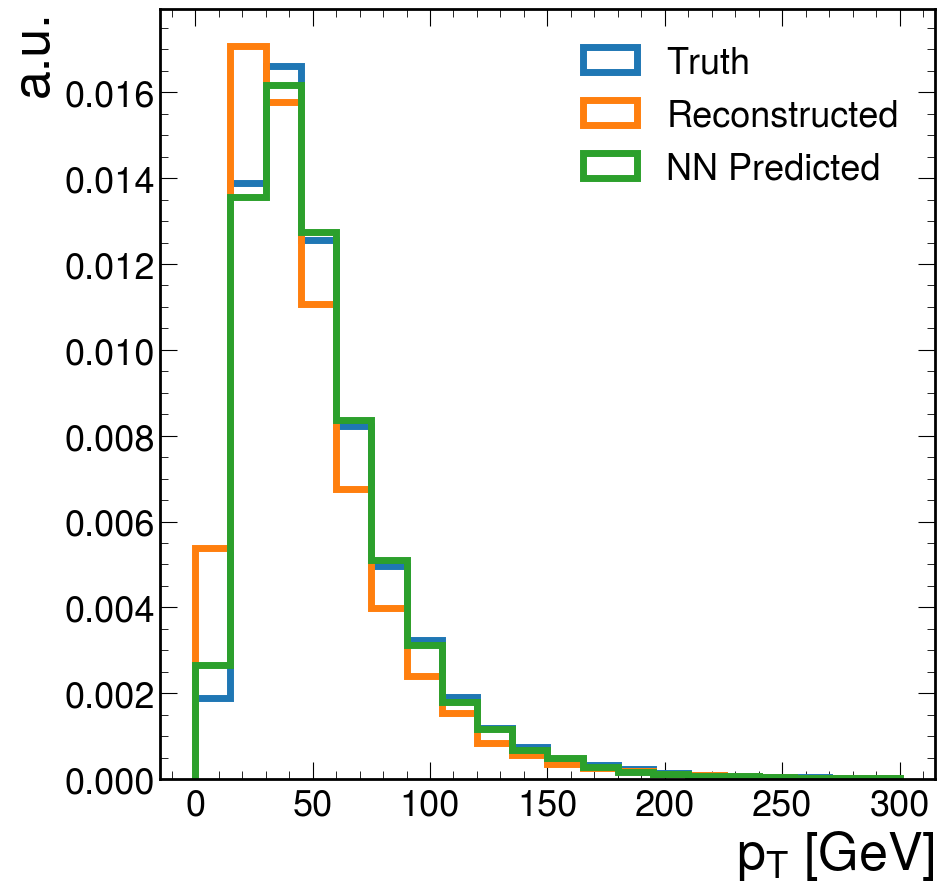

0.7777777777777777
2043/2043 [==============================] - 1s 565us/step
[1.1842563 1.1623939 1.2921236 ... 1.2144977 0.975369  1.1017922]
[ 71.35144   45.042767 238.39679  ...  54.34877   70.95809   18.730467]


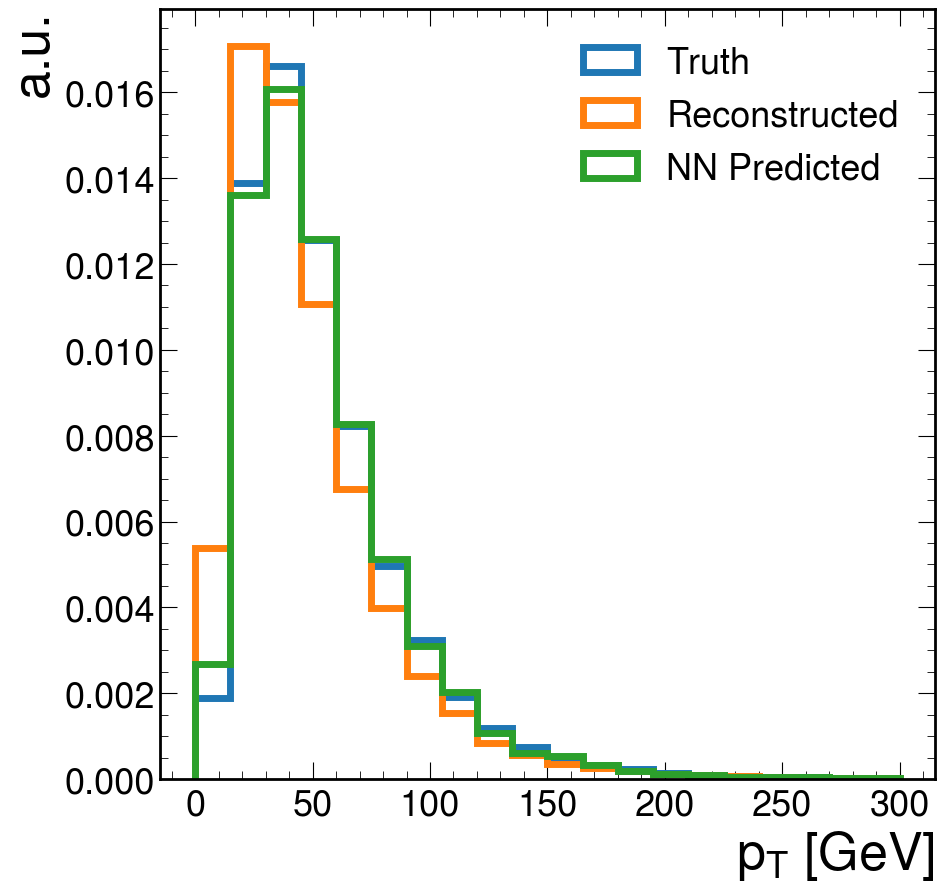

0.8888888888888888
2043/2043 [==============================] - 1s 542us/step
[ 1.6915846   0.87959373 -1.8802191  ...  1.2970327   1.6081244
  0.49669963]
[ 101.91797    34.084255 -346.90042  ...   58.042213  116.99105
    8.443893]


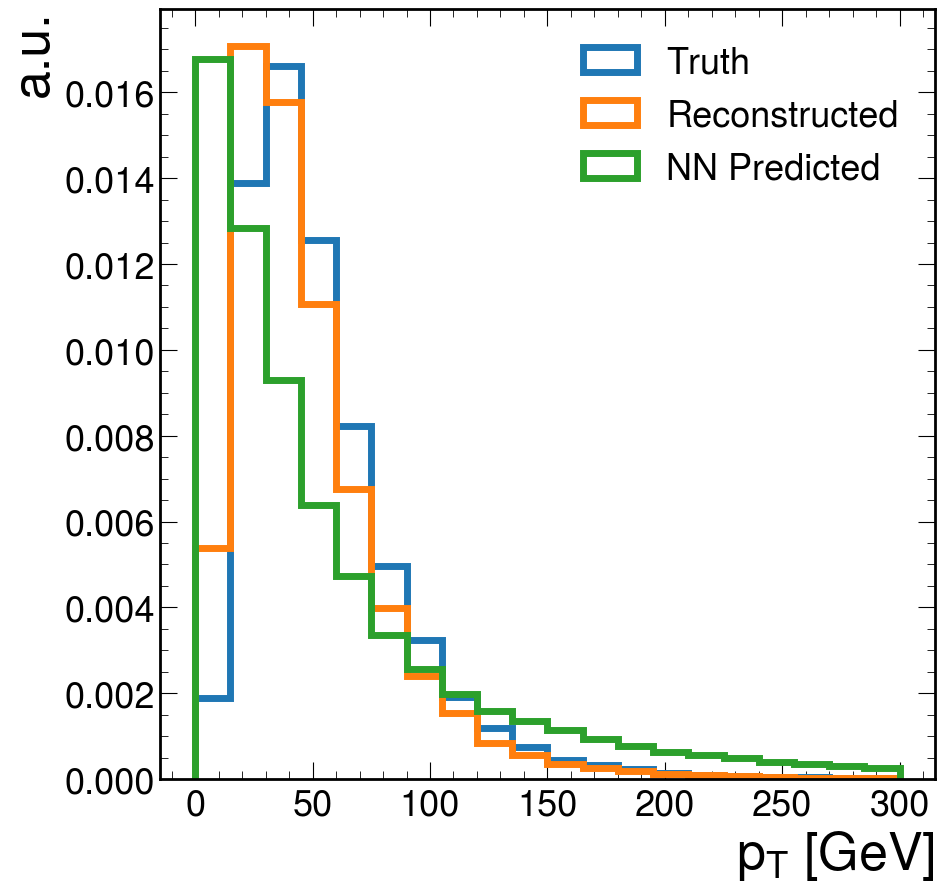

1.0


In [74]:
# load_and_predict_test("../../ntuples/Jan_25_2023", load_model("../models/merged_error_test1.h5"))
for i in range(len(trained_models)):
    load_and_predict_test("../../ntuples/Jan_25_2023", trained_models[i])
    print(gammas[i])

In [20]:
# Looking nice!! 

## Scanning Optimal Gamma using ROC Curve

In [21]:
model_id_name = '../../models/Feb_4_2023_JetMetTalk_v1_pTShape_EMSeed.h5'
model_pt_regress_name = '../models/merged_pt_regress_jet_ID.h5'
model_id = load_model(model_id_name)
#MinBias_nn_score_model = model_id.predict(MinBias_inputs)

model_regress = load_model(model_pt_regress_name)
#MinBias_nn_selected_pt_ratio = model_regress.predict(MinBias_inputs).flatten()

In [22]:
def prep_rate_data(NormalModelID, 
                   ModelNameID,
             ModelNameRegress,
             truth_sig_pt_cut=50,
             minbias_pt_cut_value=50,
             minbias_path = "../../ntuples/Jan_25_2023/test_bkg_v12_emseed.root",
             sig_path = "../../ntuples/Jan_25_2023/test_sig_v12_emseed.root",
             TreeName='ntuplePupSingle',
             test_index=400000):
    
    
    modelID = load_model(NormalModelID)
    
    #Load the data
    MinBias = uproot4.open(minbias_path)
    sig = uproot4.open(sig_path)
    
    #Signal data prep
    truth_pt_sig = sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    truth_deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    truth_eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection_sig = (truth_pt_sig > truth_sig_pt_cut) & (abs(truth_deltaR_sig) < 0.4) &(abs(truth_eta_sig) < 2.4)

    sig_id = np.asarray(sig['ntuplePupSingle']['tree']['event'].array()[test_index:][selection_sig])
    sig_pt = np.asarray(sig['ntuplePupSingle']['tree']['pt'].array()[test_index:][selection_sig])
    sig_input = np.asarray(sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][selection_sig])      
    
    #Pick out unique events
    minbias_id, minbias_index = np.unique(np.asarray(MinBias[TreeName]['tree']['event'].array()[test_index:]), return_index=True)
    sig_id_temp, sig_index_temp = np.unique(sig_id, return_index=True)
    
    true_sig_id, _, true_signal_index = np.intersect1d(np.unique(minbias_id), np.unique(sig_id_temp), return_indices=True)
    
    #True signal data preparation (these are events that actually overlaps with MinBias)
    true_sig_pt = sig_pt[sig_index_temp][true_signal_index]
    true_sig_input = sig_input[sig_index_temp][true_signal_index]
    true_sig_score = modelID.predict(true_sig_input).flatten()
    
    minbias_pt = MinBias['ntuplePupSingle']['tree']['pt'].array()[test_index:][minbias_index]
    minbias_input = np.asarray(MinBias['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][minbias_index])
    minbias_input[abs(minbias_input) > 1e+9] = 0.

    minbias_score = modelID.predict(minbias_input).flatten()
    
    #
    sig_pt_cut = true_sig_pt > minbias_pt_cut_value
    minbias_pt_cut = minbias_pt > minbias_pt_cut_value
    
    true_sig_score_pt = true_sig_score[sig_pt_cut]
    minbias_score_pt = minbias_score[minbias_pt_cut]
    
    #Now apply correction
    #model_regress = load_model(ModelNameRegress)
    
    #minbias_pt_corrected_ratio = model_regress.predict(minbias_input).flatten()
    #minbias_pt_corrected = np.multiply(minbias_pt, minbias_pt_corrected_ratio)

    #true_sig_pt_corrected_ratio = model_regress.predict(true_sig_input).flatten()
    #true_sig_pt_corrected = np.multiply(true_sig_pt, true_sig_pt_corrected_ratio)
    
    #sig_pt_cut_corrected = true_sig_pt_corrected > minbias_pt_cut_value
    #minbias_pt_cut_corrected = minbias_pt_corrected > minbias_pt_cut_value
    
    #true_sig_score_pt_corrected = true_sig_score[sig_pt_cut_corrected]
    #minbias_score_pt_corrected = minbias_score[minbias_pt_cut_corrected]
    
    n_event = minbias_index.shape[0]
    n_sig_event = true_sig_id.shape[0]
    
    ##LOOP to calculate the ROC curves
    tau_score_edges = [round(i,2) for i in np.arange(0, 0.8, 0.01).tolist()]+\
                  [round(i,4) for i in np.arange(0.9, 1, 0.0001)] + [1]

    sig_list = []
    bkg_list = []

    for tau_score_cut in tau_score_edges:
    
        bkg_pass = sum(minbias_score_pt>tau_score_cut)
        sig_pass = sum(true_sig_score_pt>tau_score_cut)
        
        sig_list.append(sig_pass/n_sig_event)
        bkg_list.append(bkg_pass/n_event)

    
    bkg_list_scaled = [i*(32e+3) for i in bkg_list]
    
    
    plt.plot(sig_list, bkg_list_scaled, label=r'Tau NN ID (No $p_T$ Correction)',linewidth=5)
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    #Load the data
    MinBias = uproot4.open(minbias_path)
    sig = uproot4.open(sig_path)
    
    #Signal data prep
    truth_pt_sig = sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    truth_deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    truth_eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection_sig = (truth_pt_sig > truth_sig_pt_cut) & (abs(truth_deltaR_sig) < 0.4) &(abs(truth_eta_sig) < 2.4)

    sig_id = np.asarray(sig['ntuplePupSingle']['tree']['event'].array()[test_index:][selection_sig])
    sig_pt = np.asarray(sig['ntuplePupSingle']['tree']['pt'].array()[test_index:][selection_sig])
    sig_input = np.asarray(sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][selection_sig])      
    
    #Pick out unique events
    minbias_id, minbias_index = np.unique(np.asarray(MinBias[TreeName]['tree']['event'].array()[test_index:]), return_index=True)
    sig_id_temp, sig_index_temp = np.unique(sig_id, return_index=True)
    
    true_sig_id, _, true_signal_index = np.intersect1d(np.unique(minbias_id), np.unique(sig_id_temp), return_indices=True)
    
    #True signal data preparation (these are events that actually overlaps with MinBias)
    true_sig_pt = sig_pt[sig_index_temp][true_signal_index]
    true_sig_input = sig_input[sig_index_temp][true_signal_index]
    for i in range(len(ModelNameID)):
        modelID = ModelNameID[i]
        true_sig_score = modelID.predict(true_sig_input)[0].flatten()

        minbias_pt = MinBias['ntuplePupSingle']['tree']['pt'].array()[test_index:][minbias_index]
        minbias_input = np.asarray(MinBias['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][minbias_index])
        minbias_input[abs(minbias_input) > 1e+9] = 0.

        minbias_score = modelID.predict(minbias_input)[0].flatten()

        #
        sig_pt_cut = true_sig_pt > minbias_pt_cut_value
        minbias_pt_cut = minbias_pt > minbias_pt_cut_value

        true_sig_score_pt = true_sig_score[sig_pt_cut]
        minbias_score_pt = minbias_score[minbias_pt_cut]

        #Now apply correction
    #     for i in range(len(ModelNameRegress)):
        #model_regress = load_model(ModelNameRegress)
        model_regress = ModelNameRegress[i]

        minbias_pt_corrected_ratio = model_regress.predict(minbias_input)[1].flatten()
        minbias_pt_corrected = np.multiply(minbias_pt, minbias_pt_corrected_ratio)

        true_sig_pt_corrected_ratio = model_regress.predict(true_sig_input)[1].flatten()
        true_sig_pt_corrected = np.multiply(true_sig_pt, true_sig_pt_corrected_ratio)

        sig_pt_cut_corrected = true_sig_pt_corrected > minbias_pt_cut_value
        minbias_pt_cut_corrected = minbias_pt_corrected > minbias_pt_cut_value

        true_sig_score_pt_corrected = true_sig_score[sig_pt_cut_corrected]
        minbias_score_pt_corrected = minbias_score[minbias_pt_cut_corrected]

        n_event = minbias_index.shape[0]
        n_sig_event = true_sig_id.shape[0]

        ##LOOP to calculate the ROC curves
        tau_score_edges = [round(i,2) for i in np.arange(0, 0.8, 0.01).tolist()]+\
                      [round(i,4) for i in np.arange(0.9, 1, 0.0001)] + [1]

        sig_list_corrected = []
        bkg_list_corrected = []

        for tau_score_cut in tau_score_edges:
            bkg_pass = sum(minbias_score_pt_corrected>tau_score_cut)
            sig_pass = sum(true_sig_score_pt_corrected>tau_score_cut)

            sig_list_corrected.append(sig_pass/n_sig_event)
            bkg_list_corrected.append(bkg_pass/n_event)

        bkg_list_scaled_corrected = [i*(32e+3) for i in bkg_list_corrected]

        plt.plot(sig_list_corrected, bkg_list_scaled_corrected, label=r'Tau NN ID, $\gamma=$' + str(round(gammas[i], 1)),linewidth=2)
        hep.cms.text("Phase 2 Simulation")
        hep.cms.lumitext("PU 200 (14 TeV)")

        plt.ylabel(r'$Single \tau_h$ Trigger Rate [kHz]')
        plt.xlabel(r'$\tau_h$ [$p_T^{gen} > % d$ GeV]' %int(truth_sig_pt_cut))

        plt.yscale('log')
        #plt.legend(loc='best',fontsize=20)
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    
    plt.plot([],[], 'none', label=r'(MinBias $p_T^{reco (or~corrected)}$ >  % d GeV)'%int(minbias_pt_cut_value))
    plt.show()

    return n_event, n_sig_event, true_sig_score_pt, minbias_score_pt, true_sig_score_pt_corrected, minbias_score_pt_corrected


115/115 [==============================] - 0s 537us/step


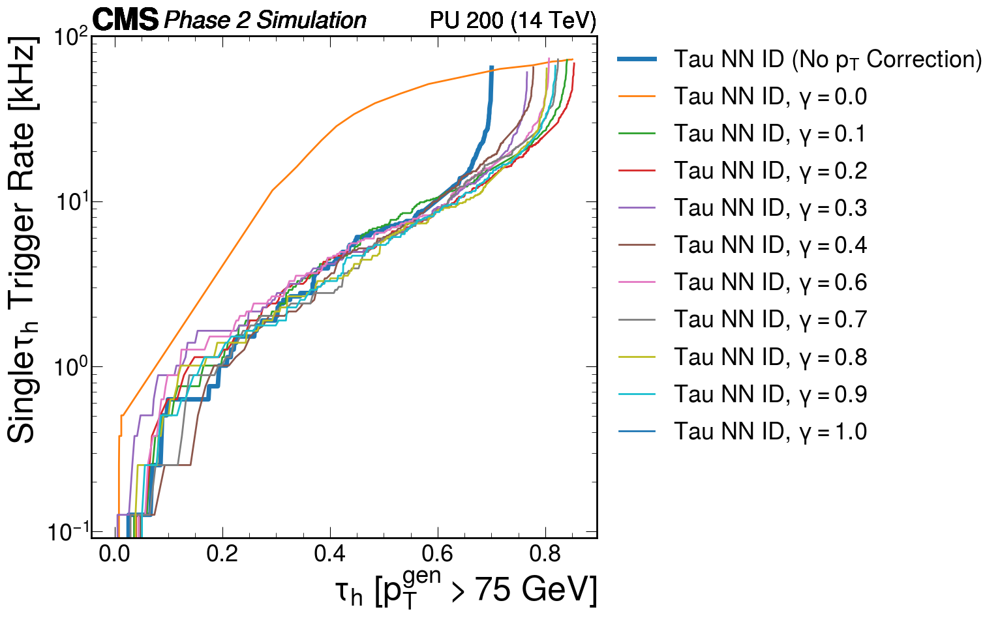

In [23]:
# n_event, n_sig_event, true_sig_score_pt, minbias_score_pt, true_sig_score_pt_corrected, minbias_score_pt_corrected = prep_rate_data(model_id_name,
#                                                                                                                                     trained_models,
#                                                                                                                                     truth_sig_pt_cut=75,
#                                                                                                                                     minbias_pt_cut_value=75)

n_event, n_sig_event, true_sig_score_pt, minbias_score_pt, true_sig_score_pt_corrected, minbias_score_pt_corrected = prep_rate_data(model_id_name,
                                                                                                                                    trained_models,
                                                                                                                                    trained_models,
                                                                                                                                    truth_sig_pt_cut=75,
                                                                                                                                    minbias_pt_cut_value=75)

## Optimal Gamma using different ROC Curve

11371/11371 [==============================] - 13s 1ms/step
[[0.12425907]
 [0.26197147]
 [0.26632652]
 ...
 [0.13711405]
 [0.3090749 ]
 [0.30924252]]
11371/11371 [==============================] - 13s 1ms/step
[[0.99880487]
 [0.95538163]
 [0.97807795]
 ...
 [0.11167382]
 [0.51007044]
 [0.49048573]]
11371/11371 [==============================] - 14s 1ms/step
[[0.99834   ]
 [0.90682167]
 [0.9590026 ]
 ...
 [0.05231007]
 [0.62173426]
 [0.4498778 ]]
11371/11371 [==============================] - 13s 1ms/step
[[0.9968819 ]
 [0.9851473 ]
 [0.9949064 ]
 ...
 [0.01823231]
 [0.7151783 ]
 [0.53951603]]
11371/11371 [==============================] - 14s 1ms/step
[[0.997724  ]
 [0.98528177]
 [0.98967266]
 ...
 [0.02665764]
 [0.71616834]
 [0.55994314]]
11371/11371 [==============================] - 14s 1ms/step
[[0.9984402 ]
 [0.9676642 ]
 [0.98080397]
 ...
 [0.01966513]
 [0.787862  ]
 [0.6320968 ]]
11371/11371 [==============================] - 17s 1ms/step
[[0.9984316 ]
 [0.9796876 ]
 [0.99828774

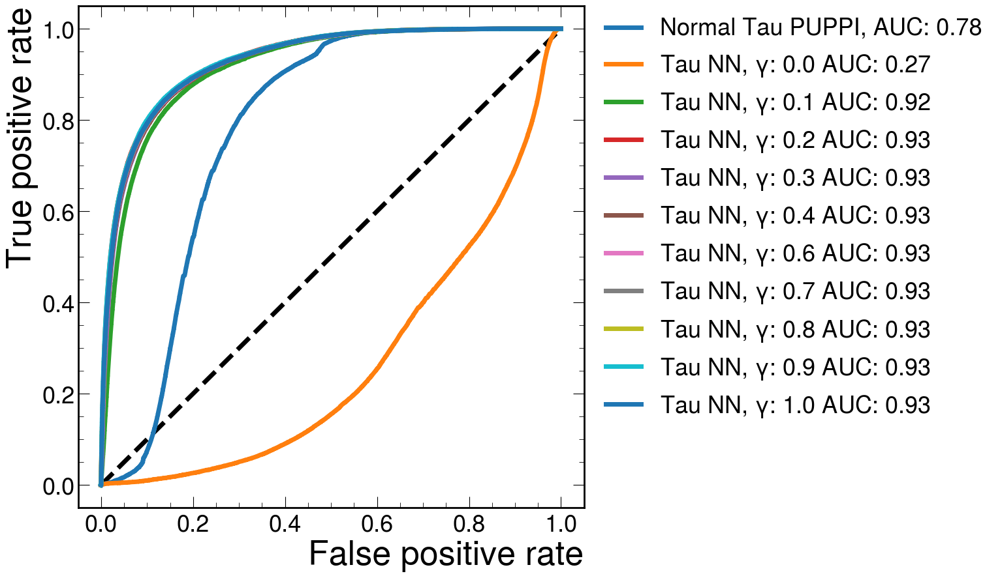

In [42]:
NormalModel = load_model('../../models/Feb_4_2023_JetMetTalk_v1_SigPtTruth20.h5')
#model_id_name = '../../models/Feb_4_2023_JetMetTalk_v1_SigPtTruth20.h5'
# model_pt_regress_name = '../models/merged_pt_regress_jet_ID.h5'
# #model_id = load_model(model_id_name)
# model_train_id = load_model(model_pt_regress_name)


y_pred_normal = NormalModel.predict(X_test)
fpr_normal, tpr_normal, _ = roc_curve(y_test_jetID,y_pred_normal)
#     auc_score_normal = round(auc(fpr_normal, tpr_normal),2)
auc_score_normal = round(auc(fpr_normal, tpr_normal), 2)
#Create plot for ROC
plt.figure(1)

plt.plot([0,1],[0,1],'k--')
plt.plot(fpr_normal, tpr_normal, label = 'Normal Tau PUPPI, AUC: {}'.format(auc_score_normal))
#Establish labels and save image
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')

    
for i in range(len(trained_models)):
    y_pred_mono = trained_models[i].predict(X_test)[0]
    print(y_pred_mono)
    fpr_mono, tpr_mono, _ = roc_curve(y_test_jetID, y_pred_mono)
#     auc_score_mono = round(auc(fpr_mono, tpr_mono),2)
    auc_score_mono = round(auc(fpr_mono, tpr_mono), 2)



   
    plt.plot(fpr_mono, tpr_mono, label = 'Tau NN, $\gamma$: ' + str(round(gammas[i], 1)) + ' AUC: {}'.format(auc_score_mono))

  
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

### Resolution + Response Plots

In [25]:
def bob(dir_path, model, test_index=400000):
    
    #Might have to change the version for other ntuple files
    data = uproot4.open(dir_path+"/test_sig_v12_emseed.root")
    inputs = data['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
    
    truth_pt = data['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    reco_pt = data['ntuplePupSingle']['tree']['pt'].array()[test_index:]
    deltaR = data['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    eta = data['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection = (reco_pt > 0.) & (abs(deltaR) < 0.4) & (abs(eta) < 2.4)
    
    truth_pt_selected = np.asarray(truth_pt[selection])
    reco_pt_selected = np.asarray(reco_pt[selection])
    
    X_test = np.asarray(inputs[selection])
    y_pred = model.predict(X_test)[1].flatten()
    pred_pt = np.multiply(reco_pt_selected, y_pred)
    
    residual = pred_pt - truth_pt_selected
    print(min(residual))
    print(max(residual))
    plot_bins = 200
    plot_range = (-125, 75)
    p_guess=[10, 0, 0.01]
    plt.hist(residual,
         bins = plot_bins,
         range = plot_range,
         density = True)
    def fit_function(x, A, mu, sig):
        return A*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

    bins = np.linspace(plot_range[0], plot_range[1], plot_bins+1)
    binscenters = np.array([0.5 * (bins[i] + bins[i+1]) for i in range(len(bins)-1)])
    
    data_entries, _ = np.histogram(residual, bins=bins,
                                   range = plot_range,
                                   density = True)
    
    mask = data_entries!=0
    #Fit the function to the histogram data.
    popt, pcov = curve_fit(fit_function,
                           xdata=binscenters[mask],
                           ydata=data_entries[mask],
                           sigma = np.sqrt(data_entries[mask]),
                           absolute_sigma = False)
    
    #Error for parameter estimations
    perr = np.sqrt(np.diag(pcov))
    print("Error for parameter esimations: ", perr)

    std_fit = np.abs(popt[2])
    mean_fit = popt[1]
    
    print("Standard deviation (fit) is", std_fit)
    print("Mean (fit) is", mean_fit)
    
    #Plot fitted gaussian
    plt.plot(bins,
             fit_function(bins, *popt),
             "r-",
             linewidth=4,
             label='Best fit')

    plt.plot([],[], 'none', label=r'$\mu=%.2f$'%popt[1])
    plt.plot([],[], 'none', label=r'$\sigma=%.4f$'%abs(popt[2]))
    
    plt.xlabel("$p_T^{corrected} - p_T^{gen}$ [GeV]", fontsize = 27)
    plt.ylabel('Normalized counts')

    plt.legend()
    plt.show()


2043/2043 [==============================] - 2s 1ms/step
-667.1027
4021.8855
Error for parameter esimations:  [0.00135565 0.25194506 0.22113826]
Standard deviation (fit) is 9.31754738713218
Mean (fit) is 2.3998067213573346


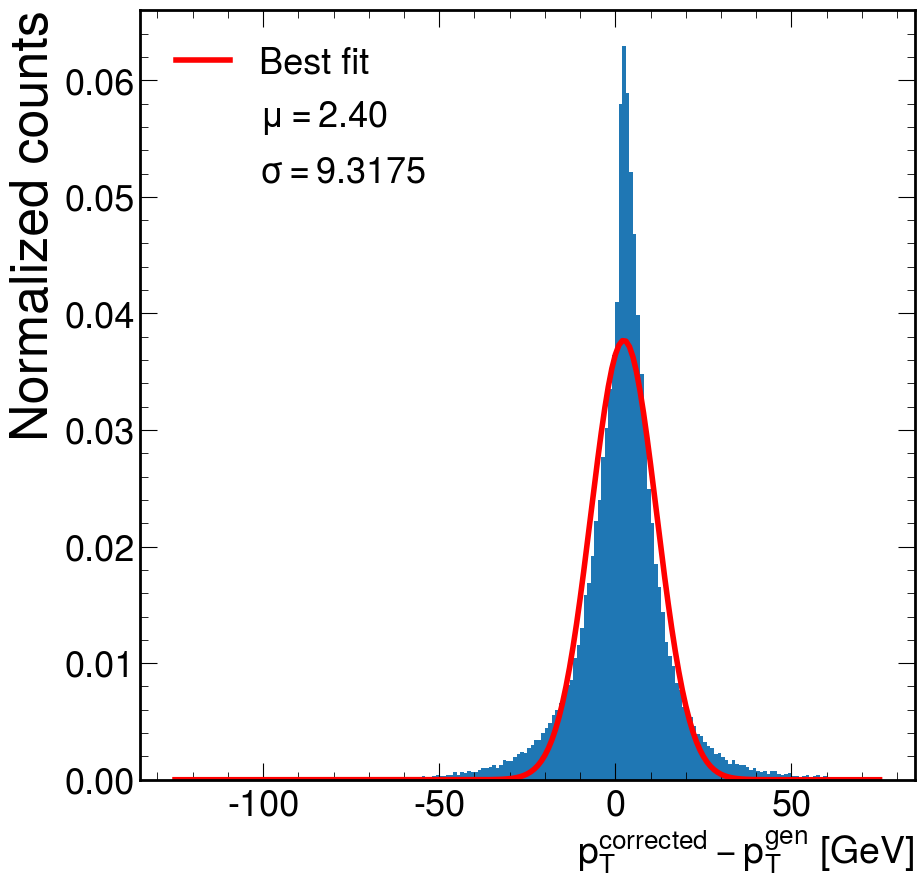

0.0
2043/2043 [==============================] - 2s 1ms/step
-477.4336
3942.7356
Error for parameter esimations:  [0.00171853 0.24917904 0.22118672]
Standard deviation (fit) is 8.098231391031275
Mean (fit) is -0.8540243628419074


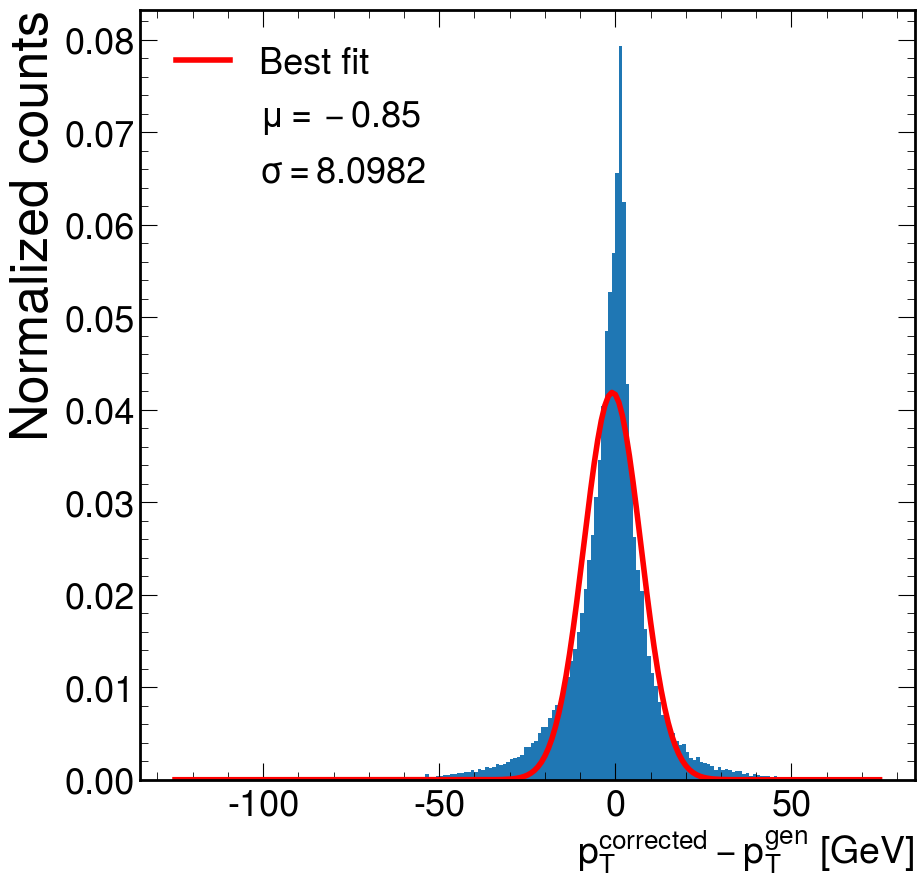

0.1111111111111111
2043/2043 [==============================] - 3s 1ms/step
-594.97437
4298.9136
Error for parameter esimations:  [0.00167239 0.23488138 0.20592146]
Standard deviation (fit) is 7.984191019700633
Mean (fit) is -0.0009862952770467394


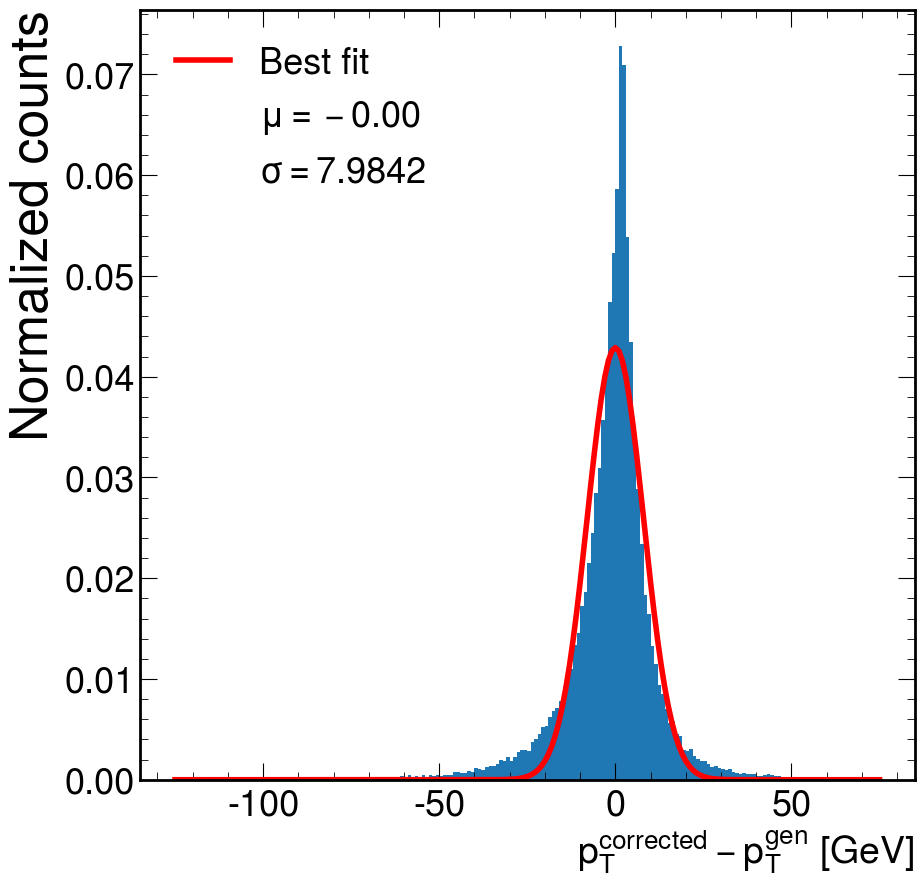

0.2222222222222222
2043/2043 [==============================] - 3s 1ms/step
-693.4375
4125.597
Error for parameter esimations:  [0.00168479 0.26036394 0.23112292]
Standard deviation (fit) is 8.344277479908538
Mean (fit) is 0.9555583178997151


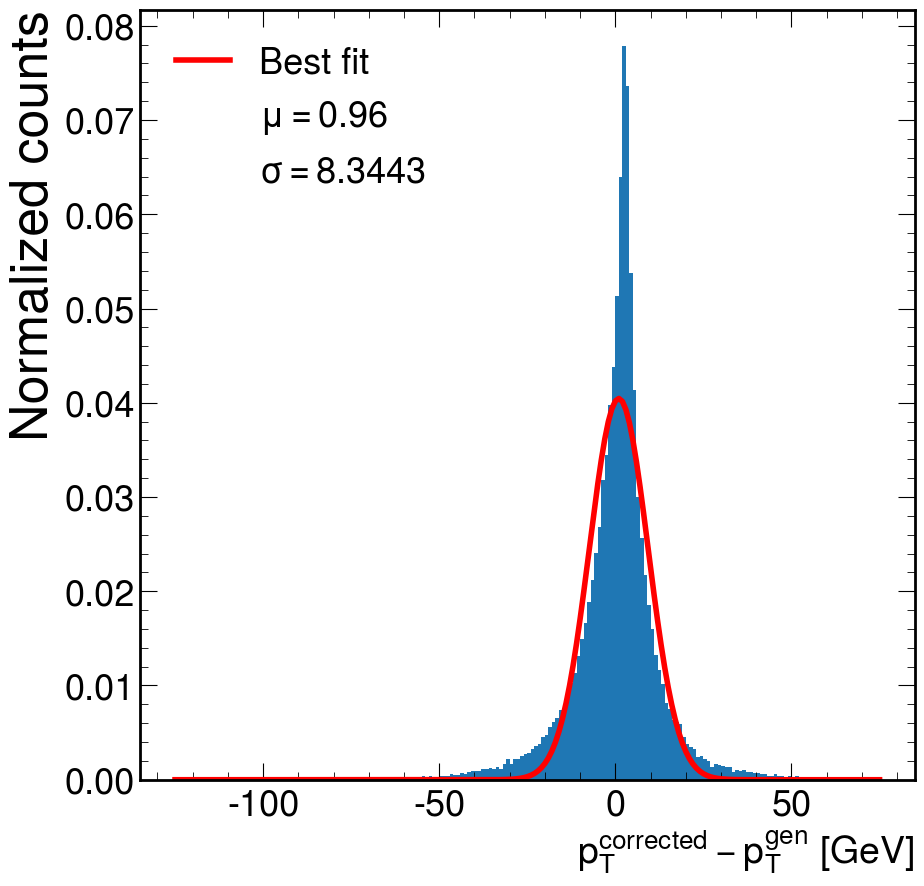

0.3333333333333333
2043/2043 [==============================] - 3s 2ms/step
-823.70087
3938.303
Error for parameter esimations:  [0.00138216 0.24216445 0.21090266]
Standard deviation (fit) is 9.010986716606286
Mean (fit) is 2.5648843905623866


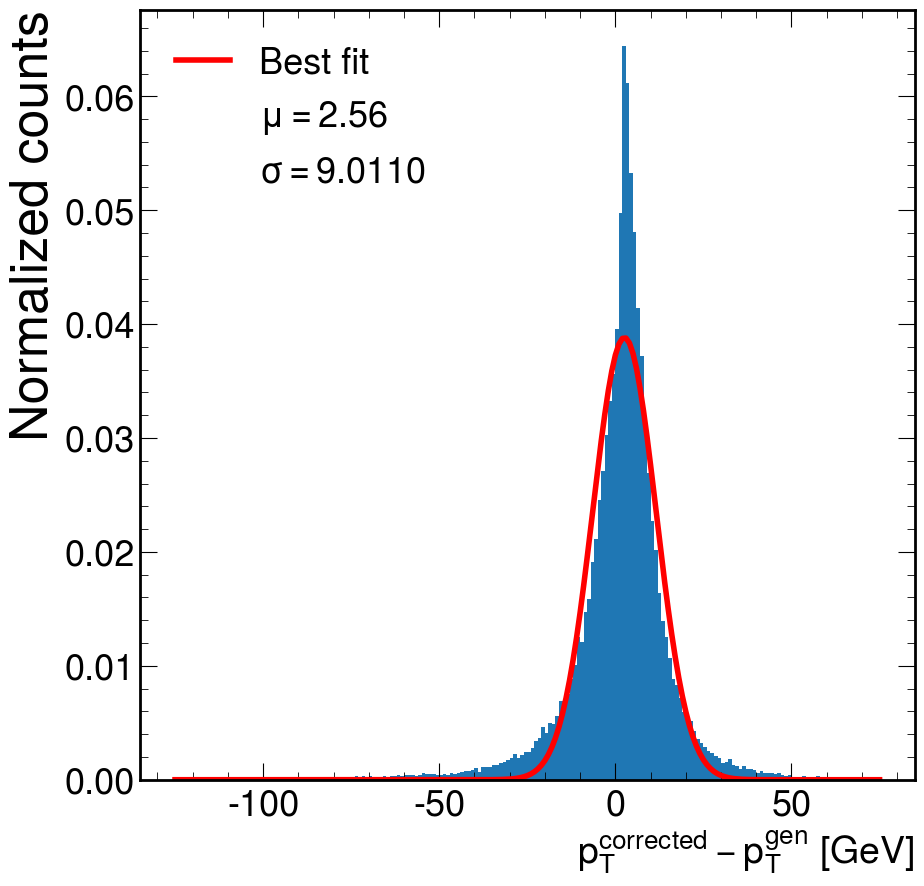

0.4444444444444444
2043/2043 [==============================] - 3s 1ms/step
-701.6961
3508.9165
Error for parameter esimations:  [0.00157062 0.25035298 0.21270908]
Standard deviation (fit) is 8.424804639457962
Mean (fit) is -2.5380477129972787


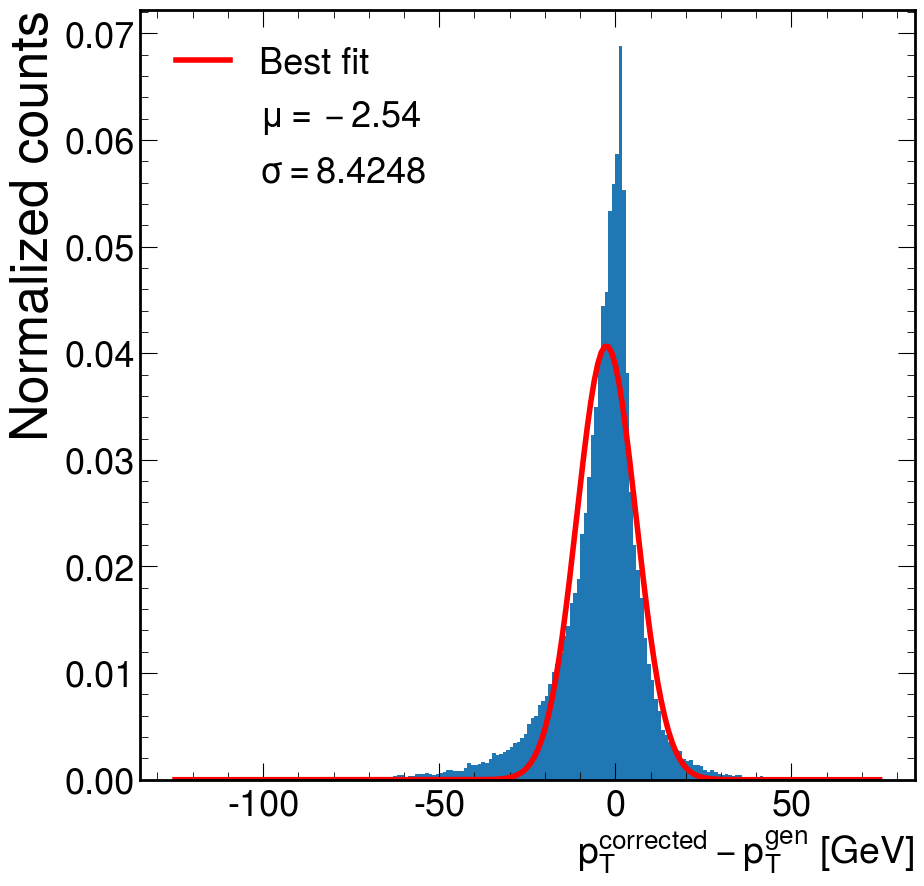

0.5555555555555556
2043/2043 [==============================] - 2s 1ms/step
-570.29297
4747.3213
Error for parameter esimations:  [0.00127509 0.23981723 0.20614497]
Standard deviation (fit) is 9.380046244357406
Mean (fit) is 1.9567257052647369


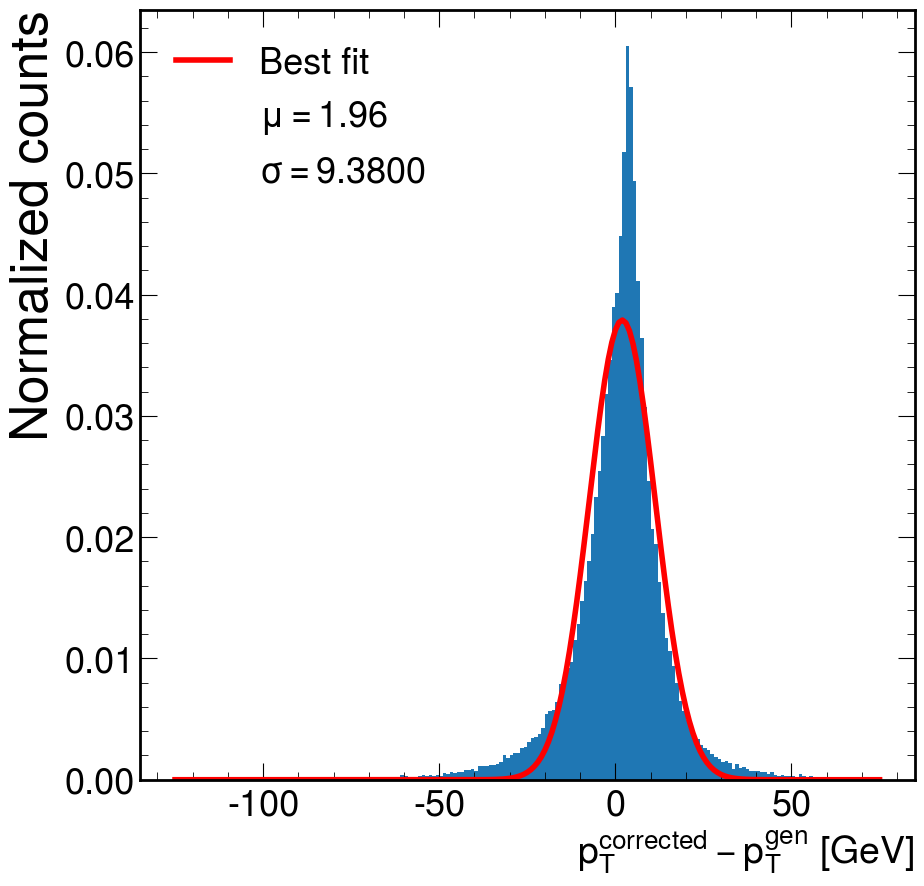

0.6666666666666666
2043/2043 [==============================] - 2s 1ms/step
-732.96326
4362.2026
Error for parameter esimations:  [0.00149956 0.24165587 0.21131879]
Standard deviation (fit) is 8.615840379355209
Mean (fit) is -0.2881384859309907


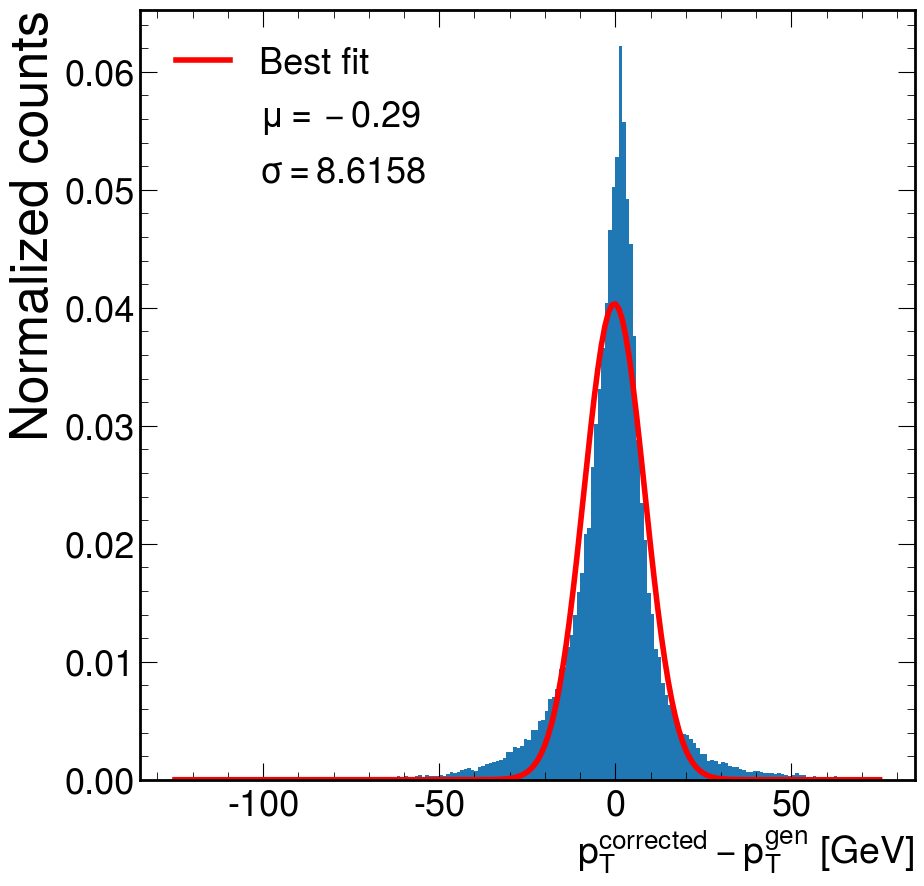

0.7777777777777777
2043/2043 [==============================] - 2s 1ms/step
-428.46814
4265.2217
Error for parameter esimations:  [0.00143603 0.29499758 0.2663502 ]
Standard deviation (fit) is 9.697836537682983
Mean (fit) is 1.0117159851475956


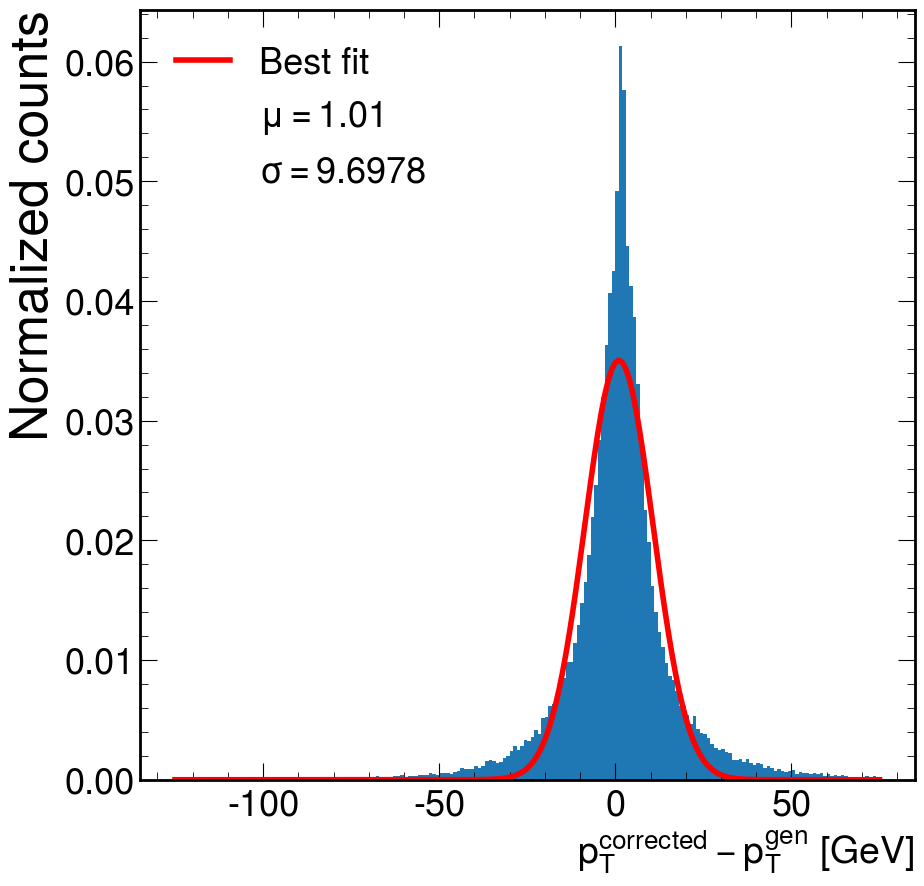

0.8888888888888888
2043/2043 [==============================] - 2s 1ms/step
-6219.67
1584.6162
Error for parameter esimations:  [5.48913670e-04 1.66718881e+00 9.79281329e-01]
Standard deviation (fit) is 29.278459357675004
Mean (fit) is -67.97939593476455


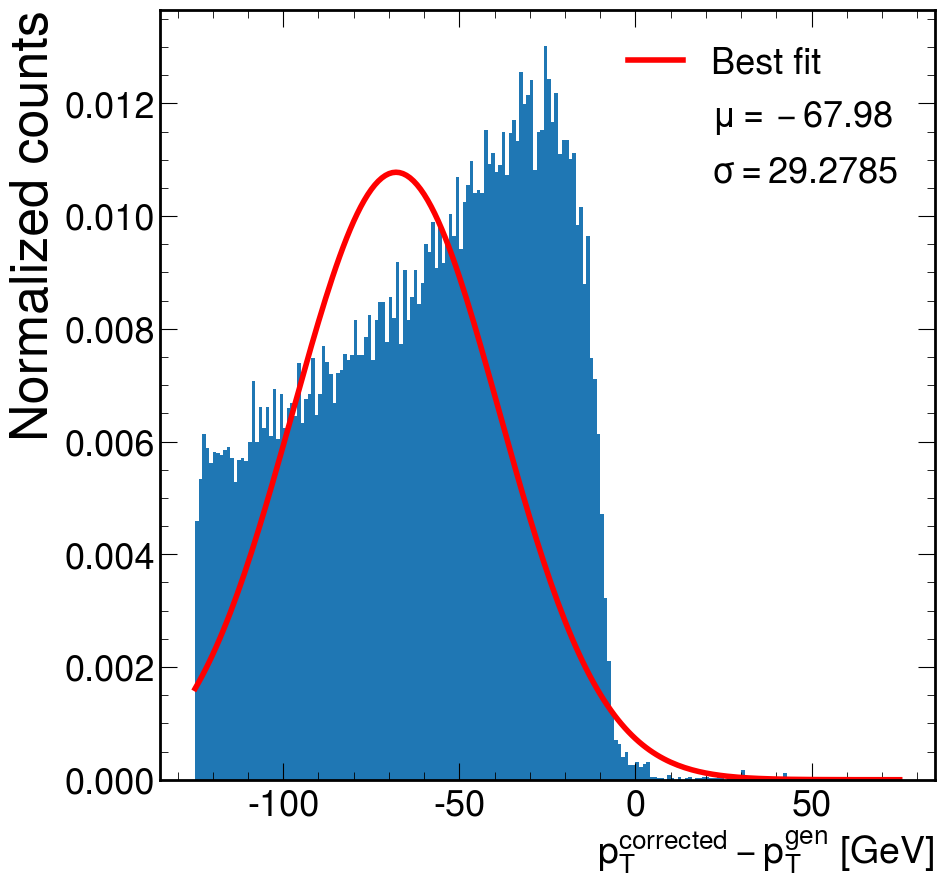

1.0


In [26]:
for i in range(len(trained_models)):
    bob("../../ntuples/Jan_25_2023", trained_models[i])
    print(gammas[i])

In [39]:
#trained_models[10].save('../models/merged_11_gamma1.h5')

IndexError: list index out of range

In [28]:
#print(trained_models[8]

### Combined ROC Curve

In [155]:
model_id_name = '../../models/Feb_4_2023_JetMetTalk_v1_pTShape_EMSeed.h5'
model_pt_regress_name = '../models/merged_pt_regress_jet_ID.h5'
model_id = load_model(model_id_name)
#MinBias_nn_score_model = model_id.predict(MinBias_inputs)

model_regress = load_model(model_pt_regress_name)
#MinBias_nn_selected_pt_ratio = model_regress.predict(MinBias_inputs).flatten()

In [156]:
def prep_rate_data(NormalModelID, 
                   ModelNameID,
             ModelNameRegress,
             truth_sig_pt_cut=50,
             minbias_pt_cut_value=50,
             minbias_path = "../../ntuples/Jan_25_2023/test_bkg_v12_emseed.root",
             sig_path = "../../ntuples/Jan_25_2023/test_sig_v12_emseed.root",
             TreeName='ntuplePupSingle',
             test_index=400000):
    
    
    modelID = load_model(model_id_name)
    
    #Load the data
    MinBias = uproot4.open(minbias_path)
    sig = uproot4.open(sig_path)
    
    #Signal data prep
    truth_pt_sig = sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    truth_deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    truth_eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection_sig = (truth_pt_sig > truth_sig_pt_cut) & (abs(truth_deltaR_sig) < 0.4) &(abs(truth_eta_sig) < 2.4)

    sig_id = np.asarray(sig['ntuplePupSingle']['tree']['event'].array()[test_index:][selection_sig])
    sig_pt = np.asarray(sig['ntuplePupSingle']['tree']['pt'].array()[test_index:][selection_sig])
    sig_input = np.asarray(sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][selection_sig])      
    
    #Pick out unique events
    minbias_id, minbias_index = np.unique(np.asarray(MinBias[TreeName]['tree']['event'].array()[test_index:]), return_index=True)
    sig_id_temp, sig_index_temp = np.unique(sig_id, return_index=True)
    
    true_sig_id, _, true_signal_index = np.intersect1d(np.unique(minbias_id), np.unique(sig_id_temp), return_indices=True)
    
    #True signal data preparation (these are events that actually overlaps with MinBias)
    true_sig_pt = sig_pt[sig_index_temp][true_signal_index]
    true_sig_input = sig_input[sig_index_temp][true_signal_index]
    true_sig_score = modelID.predict(true_sig_input).flatten()
    
    minbias_pt = MinBias['ntuplePupSingle']['tree']['pt'].array()[test_index:][minbias_index]
    minbias_input = np.asarray(MinBias['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][minbias_index])
    minbias_input[abs(minbias_input) > 1e+9] = 0.

    minbias_score = modelID.predict(minbias_input).flatten()
    
    #
    sig_pt_cut = true_sig_pt > minbias_pt_cut_value
    minbias_pt_cut = minbias_pt > minbias_pt_cut_value
    
    true_sig_score_pt = true_sig_score[sig_pt_cut]
    minbias_score_pt = minbias_score[minbias_pt_cut]
    
    #Now apply correction
    model_regress = load_model("../models/pt_regress_v1_bestest.h5")
    
    minbias_pt_corrected_ratio = model_regress.predict(minbias_input).flatten()
    minbias_pt_corrected = np.multiply(minbias_pt, minbias_pt_corrected_ratio)

    true_sig_pt_corrected_ratio = model_regress.predict(true_sig_input).flatten()
    true_sig_pt_corrected = np.multiply(true_sig_pt, true_sig_pt_corrected_ratio)
    
    sig_pt_cut_corrected = true_sig_pt_corrected > minbias_pt_cut_value
    minbias_pt_cut_corrected = minbias_pt_corrected > minbias_pt_cut_value
    
    true_sig_score_pt_corrected = true_sig_score[sig_pt_cut_corrected]
    minbias_score_pt_corrected = minbias_score[minbias_pt_cut_corrected]
    
    n_event = minbias_index.shape[0]
    n_sig_event = true_sig_id.shape[0]
    
    ##LOOP to calculate the ROC curves
    tau_score_edges = [round(i,2) for i in np.arange(0, 0.8, 0.01).tolist()]+\
                  [round(i,4) for i in np.arange(0.9, 1, 0.0001)] + [1]

    sig_list = []
    bkg_list = []

    for tau_score_cut in tau_score_edges:
    
        bkg_pass = sum(minbias_score_pt>tau_score_cut)
        sig_pass = sum(true_sig_score_pt>tau_score_cut)
        
        sig_list.append(sig_pass/n_sig_event)
        bkg_list.append(bkg_pass/n_event)

    
    bkg_list_scaled = [i*(32e+3) for i in bkg_list]
    
    sig_list_corrected = []
    bkg_list_corrected = []

    for tau_score_cut in tau_score_edges:
        bkg_pass = sum(minbias_score_pt_corrected>tau_score_cut)
        sig_pass = sum(true_sig_score_pt_corrected>tau_score_cut)

        sig_list_corrected.append(sig_pass/n_sig_event)
        bkg_list_corrected.append(bkg_pass/n_event)

    bkg_list_scaled_corrected = [i*(32e+3) for i in bkg_list_corrected]
    
    
    plt.plot([],[], 'none', label=r'(MinBias $p_T^{reco (or~corrected)}$ >  % d GeV)'%int(minbias_pt_cut_value))
    plt.plot(sig_list, bkg_list_scaled, label=r'No $p_T$ Correction',linewidth=5)
    plt.plot(sig_list_corrected, bkg_list_scaled_corrected, label=r'ID + $p_T$ correction separate',linewidth=5)
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    #Load the data
    MinBias = uproot4.open(minbias_path)
    sig = uproot4.open(sig_path)
    
    #Signal data prep
    truth_pt_sig = sig['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    truth_deltaR_sig = sig['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    truth_eta_sig = sig['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection_sig = (truth_pt_sig > truth_sig_pt_cut) & (abs(truth_deltaR_sig) < 0.4) &(abs(truth_eta_sig) < 2.4)

    sig_id = np.asarray(sig['ntuplePupSingle']['tree']['event'].array()[test_index:][selection_sig])
    sig_pt = np.asarray(sig['ntuplePupSingle']['tree']['pt'].array()[test_index:][selection_sig])
    sig_input = np.asarray(sig['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][selection_sig])      
    
    #Pick out unique events
    minbias_id, minbias_index = np.unique(np.asarray(MinBias[TreeName]['tree']['event'].array()[test_index:]), return_index=True)
    sig_id_temp, sig_index_temp = np.unique(sig_id, return_index=True)
    
    true_sig_id, _, true_signal_index = np.intersect1d(np.unique(minbias_id), np.unique(sig_id_temp), return_indices=True)
    
    #True signal data preparation (these are events that actually overlaps with MinBias)
    true_sig_pt = sig_pt[sig_index_temp][true_signal_index]
    true_sig_input = sig_input[sig_index_temp][true_signal_index]
    for i in range(2):
        if i == 0:
            modelID = load_model("../models/merged_11_gamma33.h5") # merged
            model_regress = load_model("../models/merged_11_gamma33.h5")
        elif i == 1:
            modelID = trained_models[3] # merged testing
            model_regress = trained_models[3]
        #modelID = ModelNameID[i]
        true_sig_score = modelID.predict(true_sig_input)[0].flatten()

        minbias_pt = MinBias['ntuplePupSingle']['tree']['pt'].array()[test_index:][minbias_index]
        minbias_input = np.asarray(MinBias['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:][minbias_index])
        minbias_input[abs(minbias_input) > 1e+9] = 0.

        minbias_score = modelID.predict(minbias_input)[0].flatten()

        #
        sig_pt_cut = true_sig_pt > minbias_pt_cut_value
        minbias_pt_cut = minbias_pt > minbias_pt_cut_value

        true_sig_score_pt = true_sig_score[sig_pt_cut]
        minbias_score_pt = minbias_score[minbias_pt_cut]

        #Now apply correction
    #     for i in range(len(ModelNameRegress)):
        #model_regress = load_model(ModelNameRegress)

        minbias_pt_corrected_ratio = model_regress.predict(minbias_input)[1].flatten()
        minbias_pt_corrected = np.multiply(minbias_pt, minbias_pt_corrected_ratio)

        true_sig_pt_corrected_ratio = model_regress.predict(true_sig_input)[1].flatten()
        true_sig_pt_corrected = np.multiply(true_sig_pt, true_sig_pt_corrected_ratio)

        sig_pt_cut_corrected = true_sig_pt_corrected > minbias_pt_cut_value
        minbias_pt_cut_corrected = minbias_pt_corrected > minbias_pt_cut_value

        true_sig_score_pt_corrected = true_sig_score[sig_pt_cut_corrected]
        minbias_score_pt_corrected = minbias_score[minbias_pt_cut_corrected]

        n_event = minbias_index.shape[0]
        n_sig_event = true_sig_id.shape[0]

        ##LOOP to calculate the ROC curves
        tau_score_edges = [round(i,2) for i in np.arange(0, 0.8, 0.01).tolist()]+\
                      [round(i,4) for i in np.arange(0.9, 1, 0.0001)] + [1]

        sig_list_corrected = []
        bkg_list_corrected = []

        for tau_score_cut in tau_score_edges:
            bkg_pass = sum(minbias_score_pt_corrected>tau_score_cut)
            sig_pass = sum(true_sig_score_pt_corrected>tau_score_cut)

            sig_list_corrected.append(sig_pass/n_sig_event)
            bkg_list_corrected.append(bkg_pass/n_event)

        bkg_list_scaled_corrected = [i*(32e+3) for i in bkg_list_corrected]

        plt.plot(sig_list_corrected, bkg_list_scaled_corrected, label=r'Merged, $\gamma=0.3$',linewidth=5)
        hep.cms.text("Phase 2 Simulation")
        hep.cms.lumitext("PU 200 (14 TeV)")

        plt.ylabel(r'$Single \tau_h$ Trigger Rate [kHz]')
        plt.xlabel(r'$\tau_h$ [$p_T^{gen} > % d$ GeV]' %int(truth_sig_pt_cut))

        plt.yscale('log')
        #plt.legend(loc='best',fontsize=20)
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    
    plt.plot([],[], 'none', label=r'(MinBias $p_T^{reco (or~corrected)}$ >  % d GeV)'%int(minbias_pt_cut_value))
    plt.show()
    
    total = 0
    for i in range(len(sig_list_corrected)):
        total += bkg_list_scaled_corrected[i] / bkg_list_scaled[i]
    print(total / len(sig_list_corrected))
    return n_event, n_sig_event, true_sig_score_pt, minbias_score_pt, true_sig_score_pt_corrected, minbias_score_pt_corrected


115/115 [==============================] - 0s 553us/step


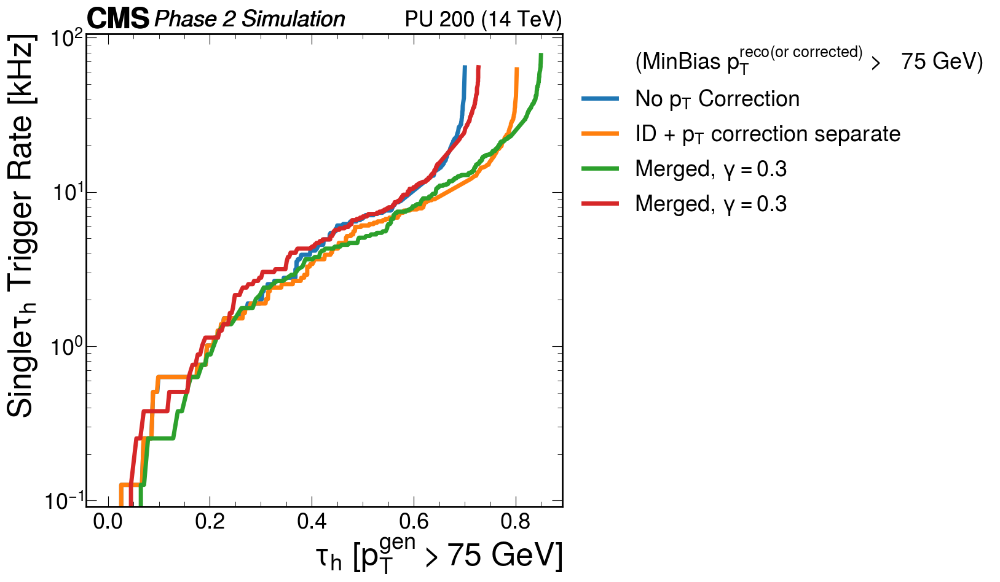

nan


/tmp/ipykernel_3321935/451349546.py:220: RuntimeWarning: divide by zero encountered in double_scalars
  total += bkg_list_scaled_corrected[i] / bkg_list_scaled[i]
/tmp/ipykernel_3321935/451349546.py:220: RuntimeWarning: invalid value encountered in double_scalars
  total += bkg_list_scaled_corrected[i] / bkg_list_scaled[i]


In [157]:
# n_event, n_sig_event, true_sig_score_pt, minbias_score_pt, true_sig_score_pt_corrected, minbias_score_pt_corrected = prep_rate_data(model_id_name,
#                                                                                                                                     trained_models,
#                                                                                                                                     truth_sig_pt_cut=75,
#                                                                                                                                     minbias_pt_cut_value=75)

n_event, n_sig_event, true_sig_score_pt, minbias_score_pt, true_sig_score_pt_corrected, minbias_score_pt_corrected = prep_rate_data(model_id_name,
                                                                                                                                    "b",
                                                                                                                                    "b",
                                                                                                                                    truth_sig_pt_cut=75,
                                                                                                                                    minbias_pt_cut_value=75)

### Combined 95% Plot

In [7]:
def plot_pt_eff_puppi(ModelName,
                      Model_Regress,
                      DataPath,
                      NN = True,
                      TreeName='ntuplePupSingle',
                      test_indx=400000,
                      corrected_pt_cut=1.,
                      cut_point = 0.21):
    '''
    cut_point = 0.21. We accept anything larger than this. 
    The corresponding corrected pT cut is 30 GeV.

    dir_path: directory path where the data is saved,
    '''

    sig = uproot4.open(DataPath)
    truth_tau_pt = sig[TreeName]['tree']['genpt1'].array()[test_indx:]
    reco_tau_pt = sig[TreeName]['tree']['pt'].array()[test_indx:]

    #Load model and select out the tau
    model_id = load_model(ModelName)
    model_pt_regress = Model_Regress

    #Get all the inputs
    sig_input = sig[TreeName]['tree']['m_inputs'].array()[test_indx:]

    reco_pt_sig = sig[TreeName]['tree']['pt'].array()[test_indx:]
    deltaR_sig = sig[TreeName]['tree']['gendr1'].array()[test_indx:]
    eta_sig = sig[TreeName]['tree']['geneta1'].array()[test_indx:]
    
    selection_deno = (truth_tau_pt > 1.) & (abs(eta_sig) < 2.1) #"genpt1 > 1. && abs(geneta1) < 2.1 "
    
    if NN: #if the flag for using pT correction or is True, correct for pT into corrected_pt_sig
        ratio_predict = model_pt_regress.predict(np.asarray(sig_input)).flatten()
        corrected_pt_sig = np.multiply(reco_pt_sig, ratio_predict)
        selection_num = selection_deno & (abs(deltaR_sig) < 0.4) & (corrected_pt_sig>corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
        #Originally (reco_pt_sig>1.) 
    else: #else, simply use reco_pt_sig
        selection_num = selection_deno & (abs(deltaR_sig) < 0.4) & (reco_pt_sig>corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
        
    #Selected out the tau pt with the basic cuts first
    truth_tau_pt_select = truth_tau_pt[selection_num]

    X_sig = np.asarray(sig_input[selection_num])
    y_sig = model_id.predict(np.nan_to_num(X_sig))

    nn_cut = y_sig.flatten() > cut_point
    tau_pt_nn = np.asarray(truth_tau_pt_select)[nn_cut]

    #Fill two plots and divide the two.
    pT_egdes = np.linspace(0, 150, 100) #200?
    pT_egdes = list(pT_egdes)
    pT_axis = hist.axis.Variable(pT_egdes, name = r"$ \tau_h$ $p_T^{gen}$")

    hist_all_tau = Hist(pT_axis)
    hist_selected_puppi = Hist(pT_axis)
    hist_selected_tau = Hist(pT_axis)

    hist_all_tau.fill(truth_tau_pt[selection_deno])
    hist_selected_puppi.fill(truth_tau_pt_select)
    hist_selected_tau.fill(tau_pt_nn)

    %matplotlib inline
    fig = plt.figure(figsize=(10, 12))
    _, eff_new_nn_artists = hist_selected_tau.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (New NN Score > {})".format(cut_point),
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    fig = plt.figure(figsize=(10, 12))
    _, eff_puppi_artists = hist_selected_puppi.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (PUPPI)",
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    #The real efficiency plot
    fig = plt.figure()

    eff_new_nn_x = [eff_new_nn_artists.bar.patches[i].get_x() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_y = [eff_new_nn_artists.bar.patches[i].get_y() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_err = [eff_new_nn_artists.bar.patches[i].get_height() for i in range(len(eff_new_nn_artists.bar.patches))]

    eff_puppi_x = [eff_puppi_artists.bar.patches[i].get_x() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_y = [eff_puppi_artists.bar.patches[i].get_y() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_err =  [eff_puppi_artists.bar.patches[i].get_height() for i in range(len(eff_puppi_artists.bar.patches))]
    plt.plot([],[], 'none', label=r'$p_T^{{corrected}}$ cut: {} [GeV]'.format(round(corrected_pt_cut)))
    plt.errorbar(eff_new_nn_x, eff_new_nn_y, yerr=eff_new_nn_err,
                fmt='o',
                linewidth=2,
                label = 'Retrained Tau NN (> {})'.format(cut_point))

    plt.errorbar(eff_puppi_x, eff_puppi_y, yerr=eff_puppi_err,
                fmt='o',
                linewidth=2,
                label = 'PUPPI')

    plt.hlines(1, 0, 150, linestyles='dashed', color='black', linewidth=3)
    plt.ylim([0.,1.1])
    plt.xlim([0,150])
    hep.cms.text("Phase 2 Simulation")
    hep.cms.lumitext("PU 200 (14 TeV)")
    plt.xlabel(r"$\tau_h$ $p_T^{gen}$ [GeV]")
    plt.ylabel(r"$\epsilon$(Di-$\tau_h$ trigger rate at 11 kHz)")
    plt.legend(loc = 'center right')
    plt.show()
    return (eff_new_nn_x, eff_new_nn_y)

def plot_pt_eff_puppi_merge(ModelName,
                      Model_Regress,
                      DataPath,
                      TreeName='ntuplePupSingle',
                      test_indx=400000,
                      corrected_pt_cut=1.,
                      cut_point = 0.21):
    '''
    cut_point = 0.21. We accept anything larger than this. 
    The corresponding corrected pT cut is 30 GeV.

    dir_path: directory path where the data is saved,
    '''

    sig = uproot4.open(DataPath)
    truth_tau_pt = sig[TreeName]['tree']['genpt1'].array()[test_indx:]
    reco_tau_pt = sig[TreeName]['tree']['pt'].array()[test_indx:]

    #Load model and select out the tau
    model_id = load_model(ModelName)
    model_pt_regress = load_model(Model_Regress)

    #Get all the inputs
    sig_input = sig[TreeName]['tree']['m_inputs'].array()[test_indx:]

    reco_pt_sig = sig[TreeName]['tree']['pt'].array()[test_indx:]
    deltaR_sig = sig[TreeName]['tree']['gendr1'].array()[test_indx:]
    eta_sig = sig[TreeName]['tree']['geneta1'].array()[test_indx:]

    ratio_predict = model_pt_regress.predict(np.asarray(sig_input))[1].flatten()
    corrected_pt_sig = np.multiply(reco_pt_sig, ratio_predict)

    selection_deno = (truth_tau_pt > 1.) & (abs(eta_sig) < 2.1) #"genpt1 > 1. && abs(geneta1) < 2.1 "
    selection_num = selection_deno & (abs(deltaR_sig) < 0.4) & (corrected_pt_sig>corrected_pt_cut) # " abs(gendr1) < 0.4 && pt > 1."
    #Originally (reco_pt_sig>1.) 

    #Selected out the tau pt with the basic cuts first
    truth_tau_pt_select = truth_tau_pt[selection_num]

    X_sig = np.asarray(sig_input[selection_num])
    y_sig = model_id.predict(np.nan_to_num(X_sig))[0]

    nn_cut = y_sig.flatten() > cut_point
    tau_pt_nn = np.asarray(truth_tau_pt_select)[nn_cut]

    #Fill two plots and divide the two.
    pT_egdes = np.linspace(0, 150, 100) #200?
    pT_egdes = list(pT_egdes)
    pT_axis = hist.axis.Variable(pT_egdes, name = r"$ \tau_h$ $p_T^{gen}$")

    hist_all_tau = Hist(pT_axis)
    hist_selected_puppi = Hist(pT_axis)
    hist_selected_tau = Hist(pT_axis)

    hist_all_tau.fill(truth_tau_pt[selection_deno])
    hist_selected_puppi.fill(truth_tau_pt_select)
    hist_selected_tau.fill(tau_pt_nn)

    %matplotlib inline
    fig = plt.figure(figsize=(10, 12))
    _, eff_new_nn_artists = hist_selected_tau.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (New NN Score > {})".format(cut_point),
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    fig = plt.figure(figsize=(10, 12))
    _, eff_puppi_artists = hist_selected_puppi.plot_ratio(
        hist_all_tau,
        rp_num_label=r"Selected Taus (PUPPI)",
        rp_denom_label=r"All Taus",
        rp_uncert_draw_type="bar",
        rp_uncertainty_type="efficiency",
    )


    #The real efficiency plot
    fig = plt.figure()

    eff_new_nn_x = [eff_new_nn_artists.bar.patches[i].get_x() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_y = [eff_new_nn_artists.bar.patches[i].get_y() for i in range(len(eff_new_nn_artists.bar.patches))]
    eff_new_nn_err = [eff_new_nn_artists.bar.patches[i].get_height() for i in range(len(eff_new_nn_artists.bar.patches))]

    eff_puppi_x = [eff_puppi_artists.bar.patches[i].get_x() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_y = [eff_puppi_artists.bar.patches[i].get_y() for i in range(len(eff_puppi_artists.bar.patches))]
    eff_puppi_err =  [eff_puppi_artists.bar.patches[i].get_height() for i in range(len(eff_puppi_artists.bar.patches))]
    plt.plot([],[], 'none', label=r'$p_T^{{corrected}}$ cut: {} [GeV]'.format(round(corrected_pt_cut)))
    plt.errorbar(eff_new_nn_x, eff_new_nn_y, yerr=eff_new_nn_err,
                fmt='o',
                linewidth=2,
                label = 'Retrained Tau NN (> {})'.format(cut_point))

    plt.errorbar(eff_puppi_x, eff_puppi_y, yerr=eff_puppi_err,
                fmt='o',
                linewidth=2,
                label = 'PUPPI')

    plt.hlines(1, 0, 150, linestyles='dashed', color='black', linewidth=3)
    plt.ylim([0.,1.1])
    plt.xlim([0,150])
    hep.cms.text("Phase 2 Simulation")
    hep.cms.lumitext("PU 200 (14 TeV)")
    plt.xlabel(r"$\tau_h$ $p_T^{gen}$ [GeV]")
    plt.ylabel(r"$\epsilon$(Di-$\tau_h$ trigger rate at 11 kHz)")
    plt.legend(loc = 'center right')
    plt.show()
    return (eff_new_nn_x, eff_new_nn_y)


In [8]:
def plot_95th(threshold_list, model_id_name, model_pT, DataPath, cut_point = 0.21):
    
    threshold_list = threshold_list

    # pT NN correction
    
    results = plot_pt_eff_puppi(model_id_name,
                                model_pT,
                                DataPath,
                                NN = True,
                                corrected_pt_cut=0,
                                cut_point = cut_point)
    no_cut_x = np.asarray(results[0])
    no_cut_y = np.asarray(results[1])


    gen_pT_list = []
    for i in threshold_list:
        result = plot_pt_eff_puppi(model_id_name,
                                model_pT,
                                DataPath,
                                NN = True,
                                corrected_pt_cut=i,
                                cut_point = cut_point)
        cut_x = np.asarray(result[0])
        cut_y = np.asarray(result[1])
        y_norm = np.divide(cut_y, no_cut_y)
        for i in range(10):
            if y_norm[i] == 1:
                y_norm[i] = 0
            else:
                break
        gen_pT_list.append(cut_x[y_norm > 0.95][0])
    gen_pT_list_nn = gen_pT_list
    
    # no pT NN correction
    
    results = plot_pt_eff_puppi(model_id_name,
                                model_pT,
                            DataPath,
                            NN = False,
                            corrected_pt_cut=0,
                            cut_point = cut_point)
    no_cut_x = np.asarray(results[0])
    no_cut_y = np.asarray(results[1])


    gen_pT_list = []
    for i in threshold_list:
        result = plot_pt_eff_puppi(model_id_name,
                                model_pT,
                                DataPath,
                                NN = False,
                                corrected_pt_cut=i,
                                cut_point = cut_point)
        cut_x = np.asarray(result[0])
        cut_y = np.asarray(result[1])
        y_norm = np.divide(cut_y, no_cut_y)
        for i in range(10):
            if y_norm[i] == 1:
                y_norm[i] = 0
            else:
                break
        gen_pT_list.append(cut_x[y_norm > 0.95][0])
    gen_pT_list_no_nn = gen_pT_list
    
    # merged
    model_name = '../models/merged_11_gamma33.h5'
    
    results = plot_pt_eff_puppi_merge(model_name,
                            model_name,
                            '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                            corrected_pt_cut=0,
                            cut_point = 0.21)
    no_cut_x = np.asarray(results[0])
    no_cut_y = np.asarray(results[1])


    threshold_list = [15, 20, 25,30,35,40,50,60,70,80]
    gen_pT_list = []
    for i in threshold_list:
        result = plot_pt_eff_puppi_merge(model_name,
                                model_name,
                                '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root',
                                corrected_pt_cut=i,
                                cut_point = 0.21)
        cut_x = np.asarray(result[0])
        cut_y = np.asarray(result[1])
        y_norm = np.divide(cut_y, no_cut_y)
        print(y_norm)
        for i in range(10):
            if y_norm[i] == 1:
                y_norm[i] = 0
            else:
                break
        gen_pT_list.append(cut_x[y_norm > 0.95][0])
    #gen_pT_list = [cut(i) for i in threshold_list]
    gen_pT_list_nn_merge = gen_pT_list
    
    # Plotting final plot
    
    a, b = np.polyfit(threshold_list, gen_pT_list_nn, 1)
    c, d = np.polyfit(threshold_list, gen_pT_list_no_nn, 1)
    e, f = np.polyfit(threshold_list, gen_pT_list_nn_merge, 1)
    fig = plt.figure()
    plt.plot(threshold_list, [a*i + b for i in threshold_list], "--", linewidth = 1)
    plt.plot(threshold_list, gen_pT_list_nn, "o-", fillstyle='none', linewidth = 1, label = "NN Corrected pT (y = " + str(round(a, 2)) + "x" + " + " + str(round(b, 2)) + ")", color = 'C0')
    plt.plot(threshold_list, [c*i + d for i in threshold_list], "--", linewidth = 1, color = 'r')
    plt.plot(threshold_list, gen_pT_list_no_nn, "o-", fillstyle='none', linewidth = 1, label = "PUPPI Reco pT (y = " + str(round(c, 2)) + "x" + " + " + str(round(d, 2)) + ")", color = 'r')
    plt.plot(threshold_list, [e*i + f for i in threshold_list], "--", linewidth = 1, color = 'g')
    plt.plot(threshold_list, gen_pT_list_nn_merge, "o-", fillstyle='none', linewidth = 1, label = "Merged (y = " + str(round(e, 2)) + "x" + " + " + str(round(f, 2)) + ")", color = 'g')
    #plt.xlim([20,85])
    #plt.xlim([20,85])
    #plt.xlim([20,85])
    hep.cms.text("Phase 2 Simulation")
    hep.cms.lumitext("PU 200 (14 TeV)")
    plt.xlabel(r"$p_T$ Cut Threshold [GeV]", fontsize = 25)
    plt.ylabel(r"$95\%$ Efficiency Point [GeV]", fontsize = 25)
    plt.legend(loc = 'upper left', fontsize = 18.5)
    #plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()


1905/1905 [==============================] - 2s 1ms/step


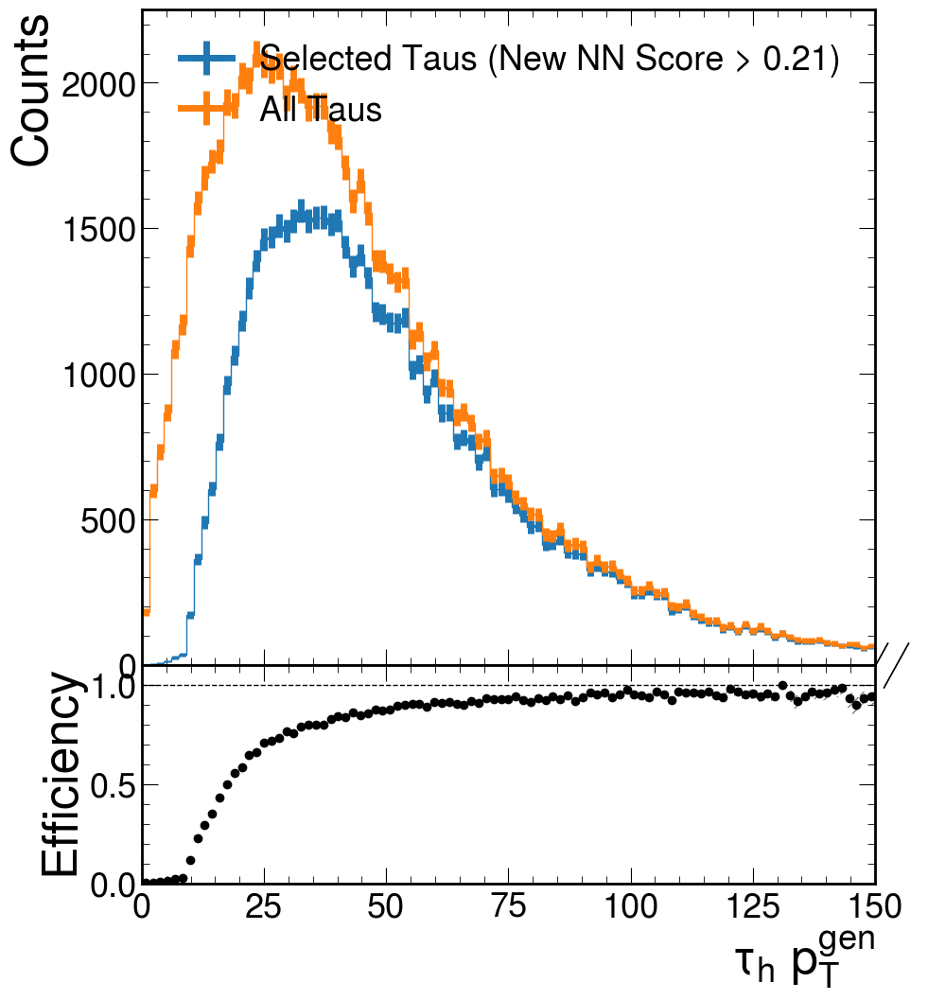

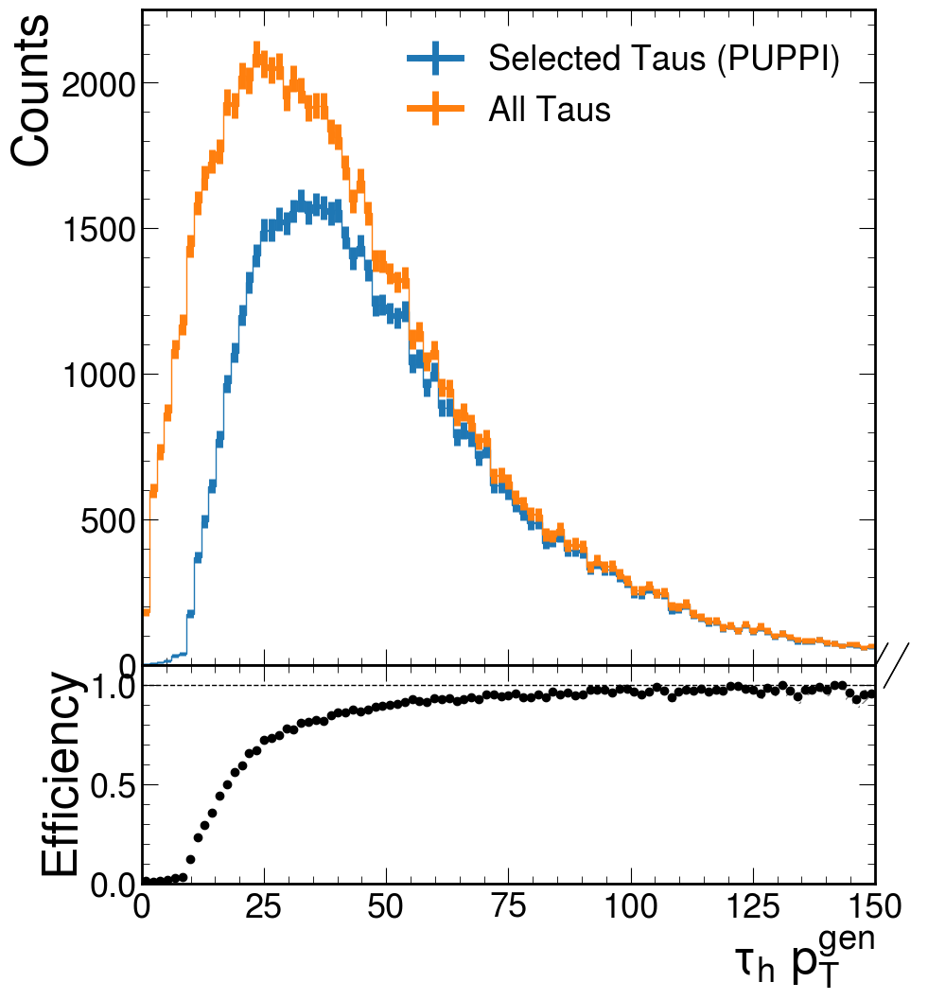

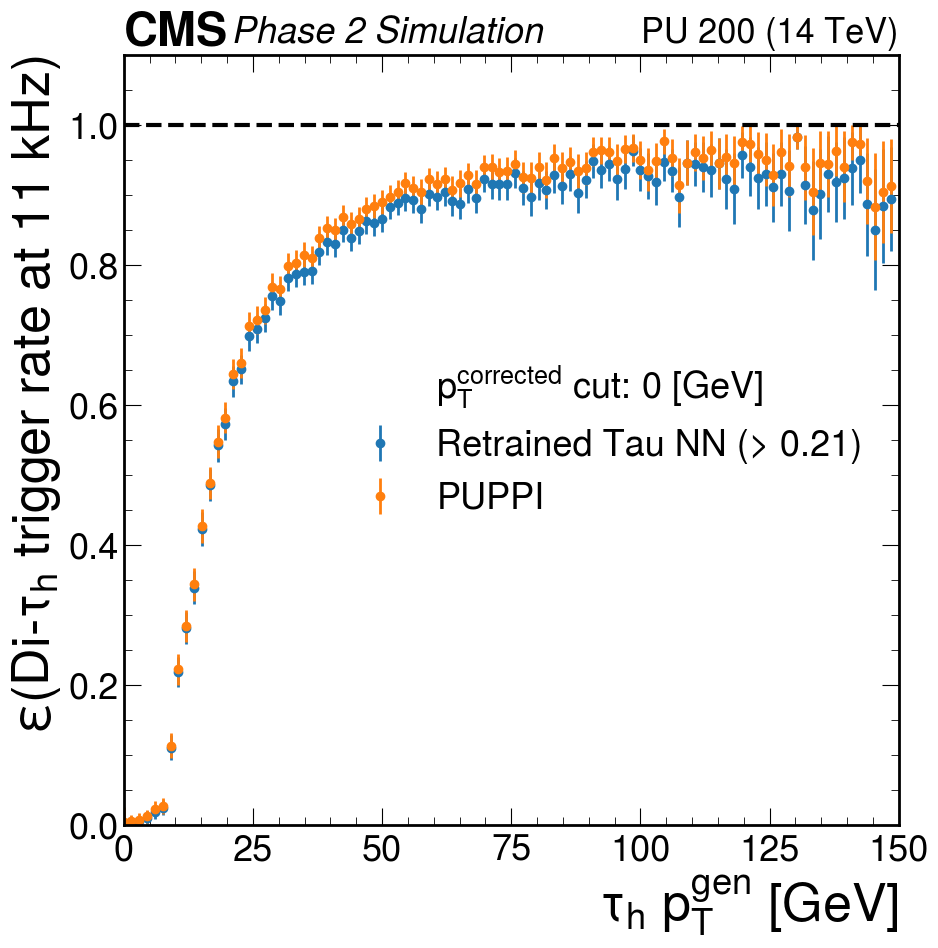

1831/1831 [==============================] - 2s 1ms/step


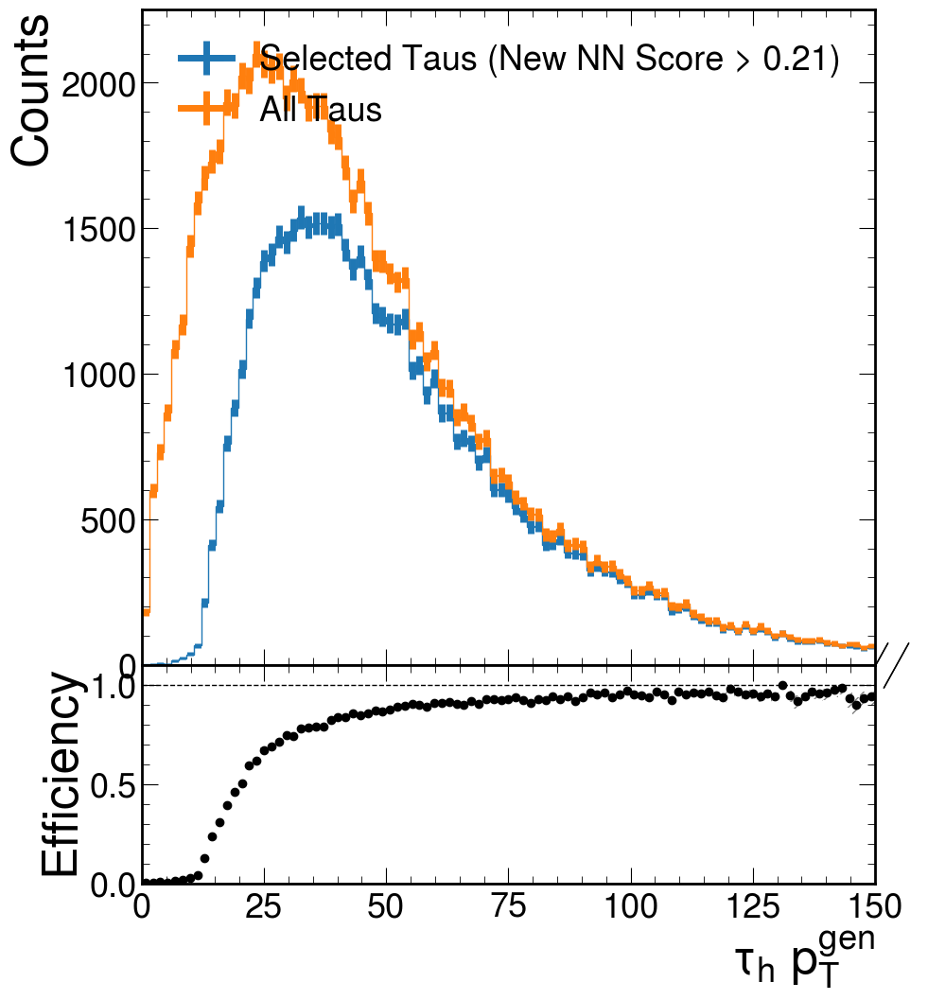

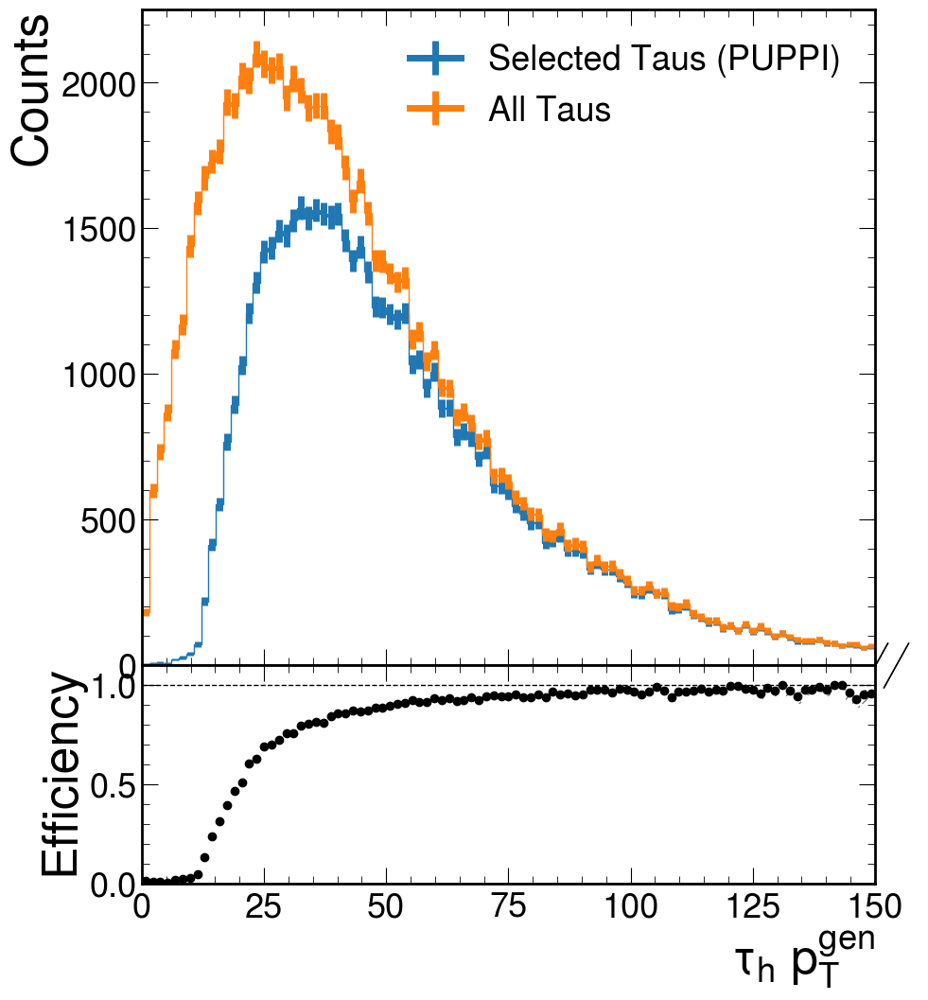

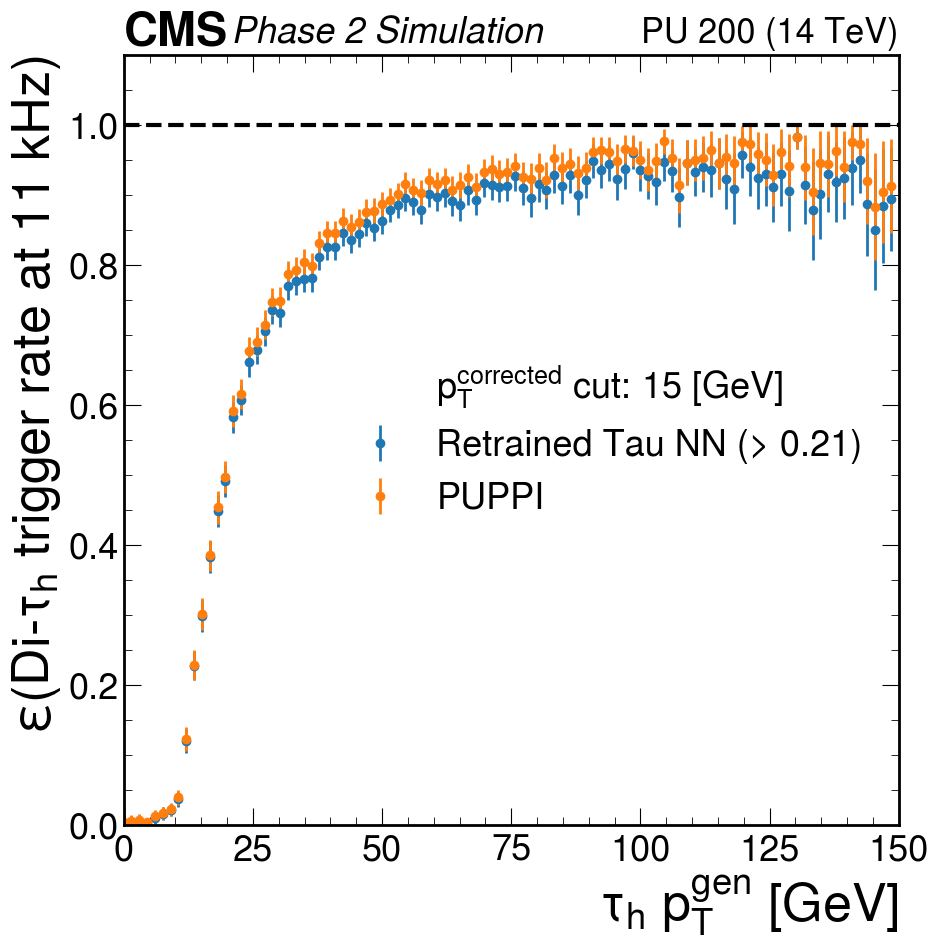

1706/1706 [==============================] - 2s 1ms/step


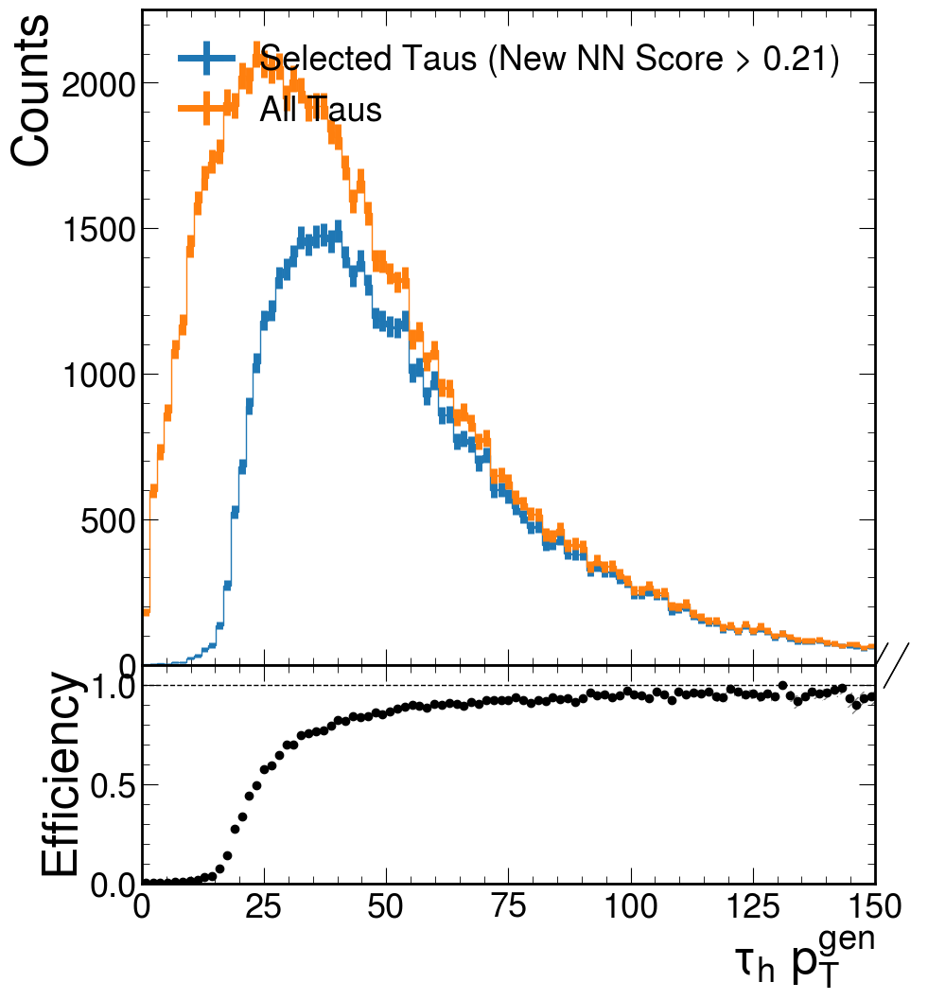

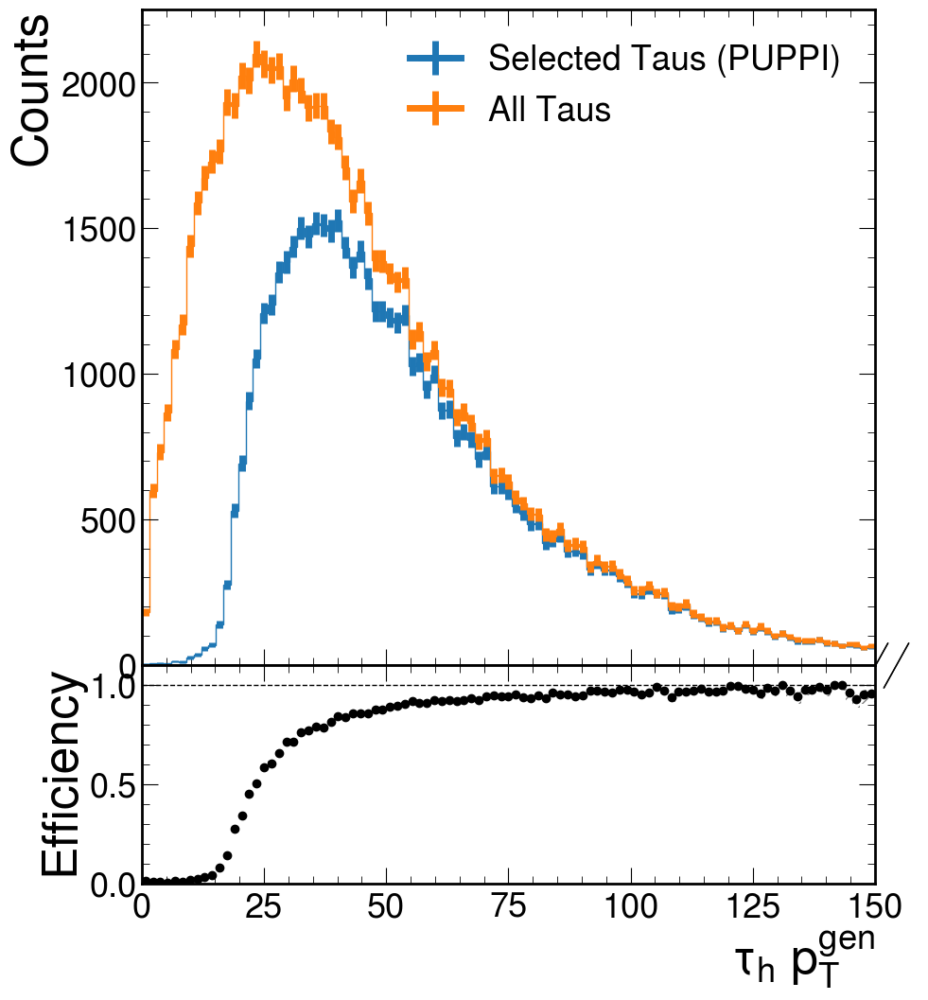

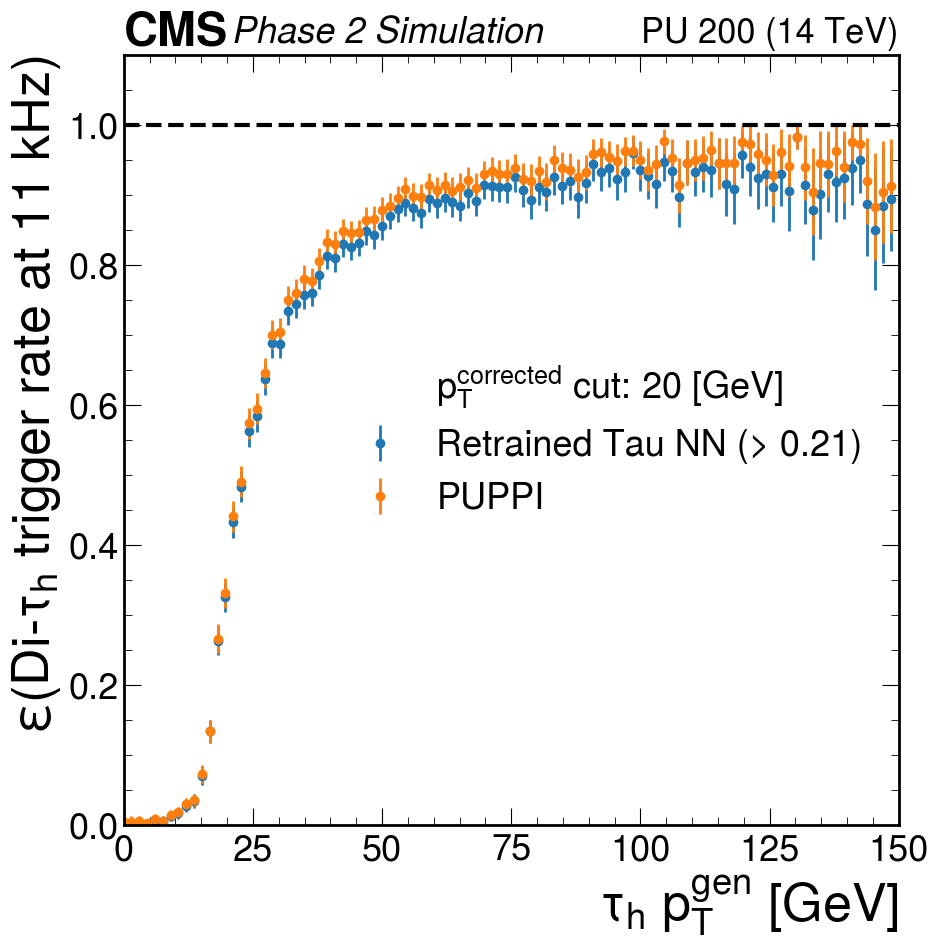

1576/1576 [==============================] - 2s 900us/step


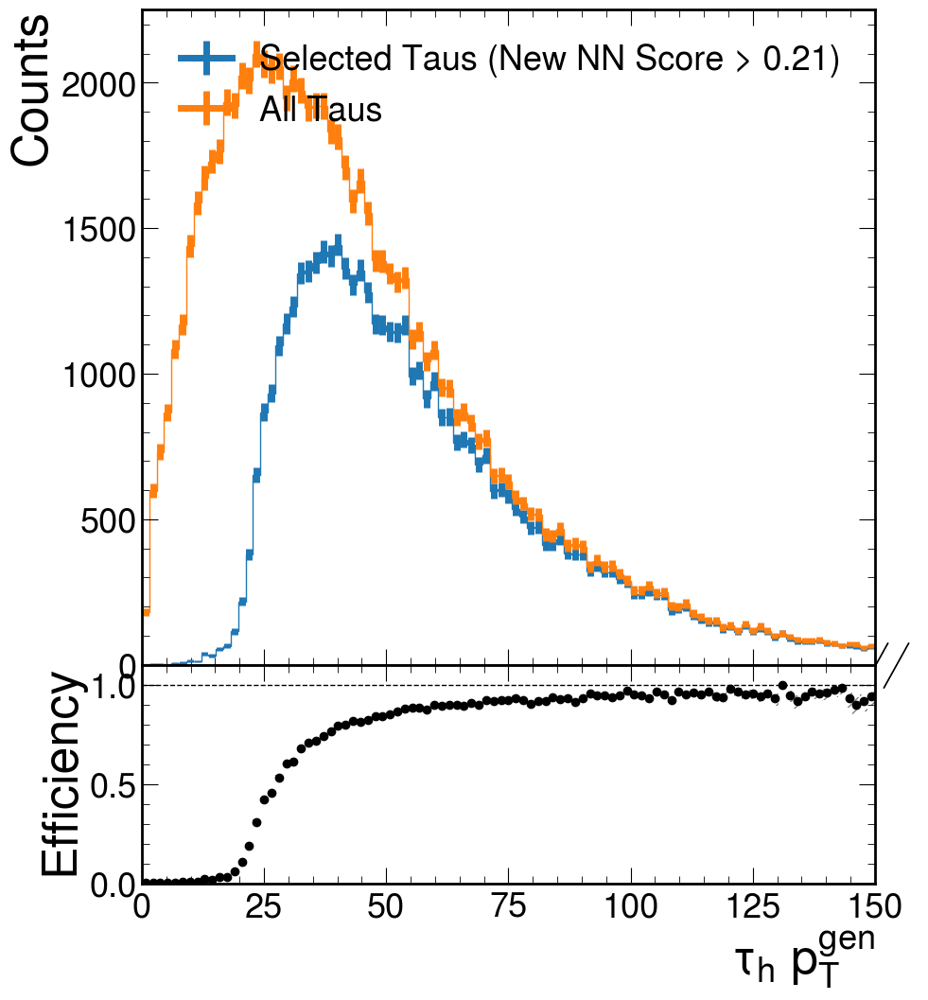

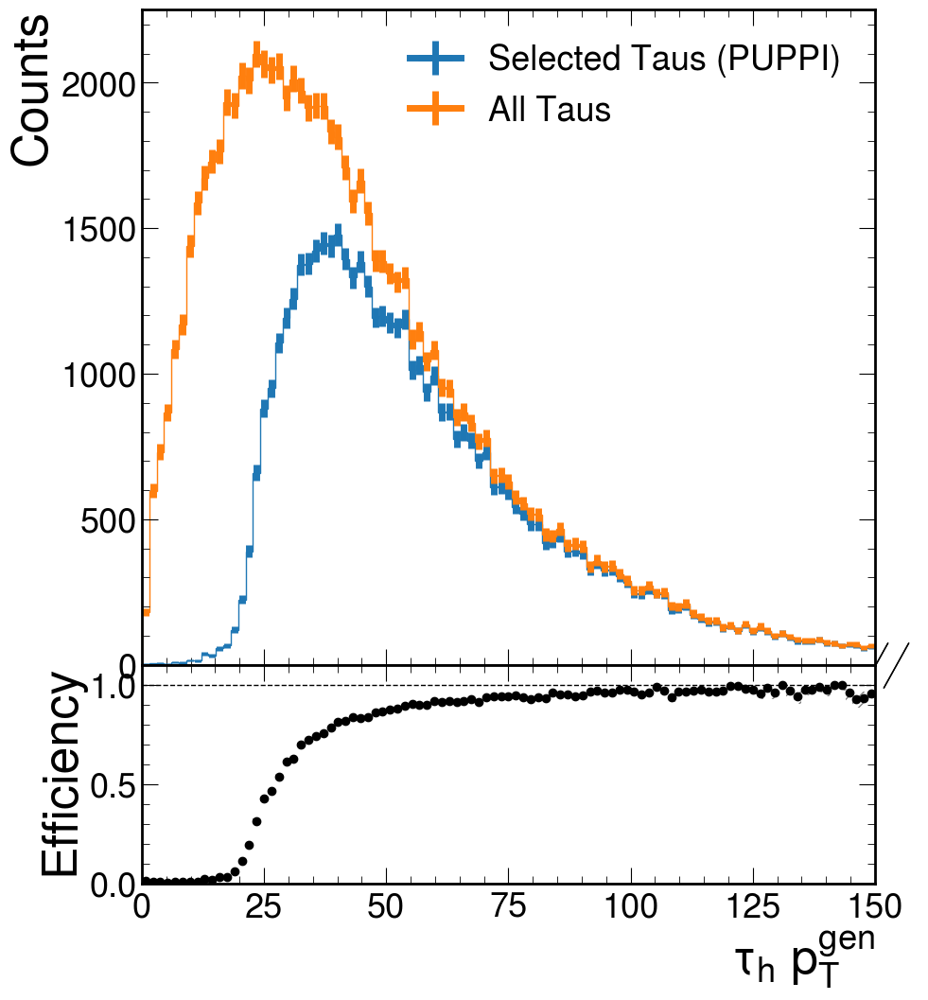

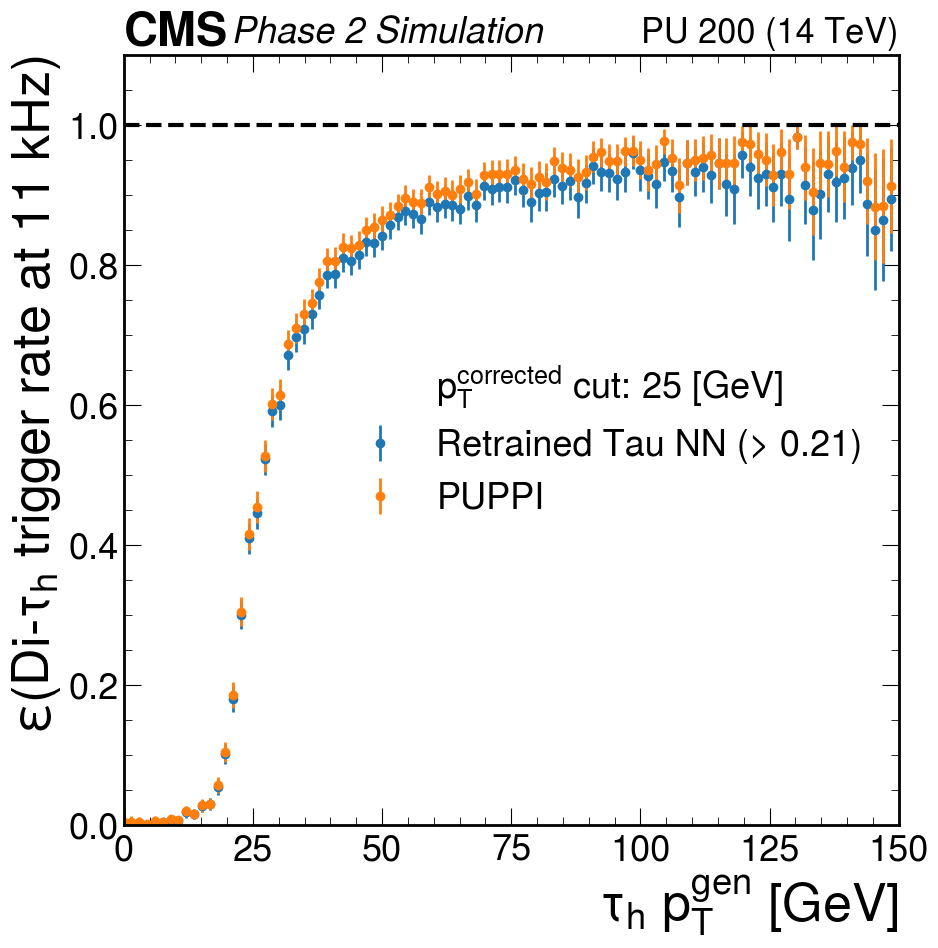

1432/1432 [==============================] - 2s 1ms/step


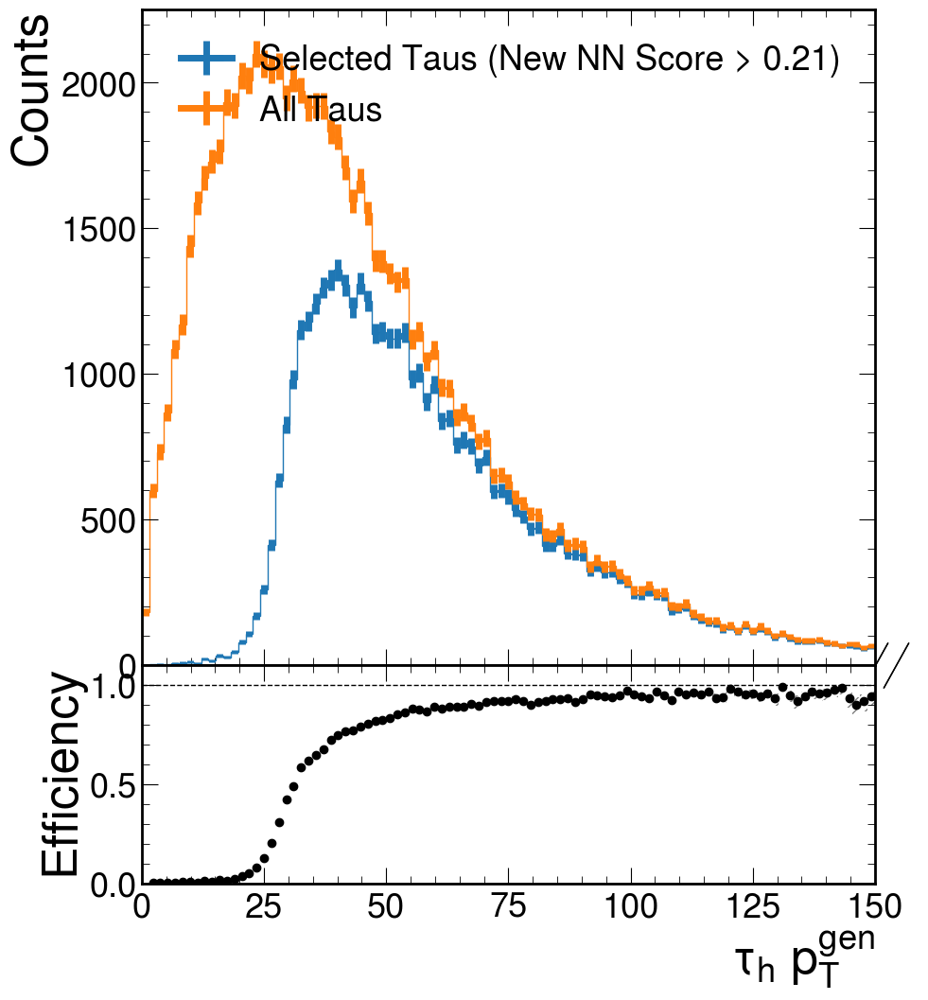

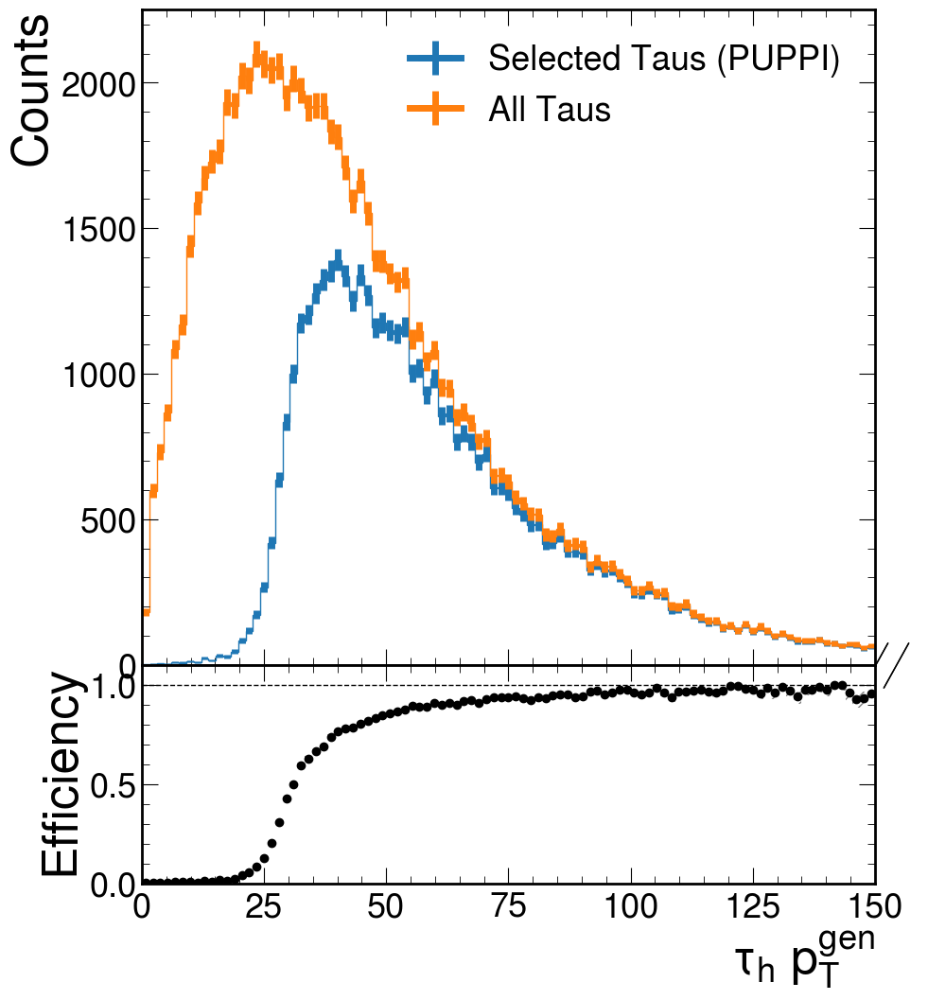

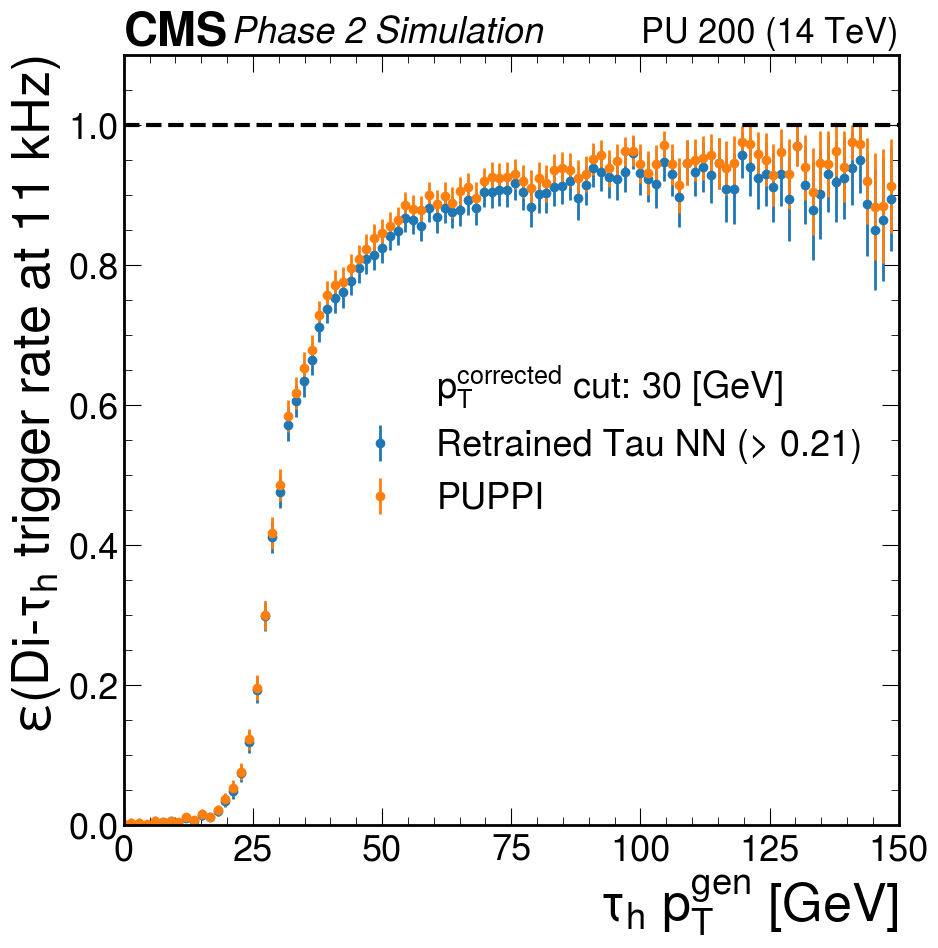

1279/1279 [==============================] - 1s 1ms/step


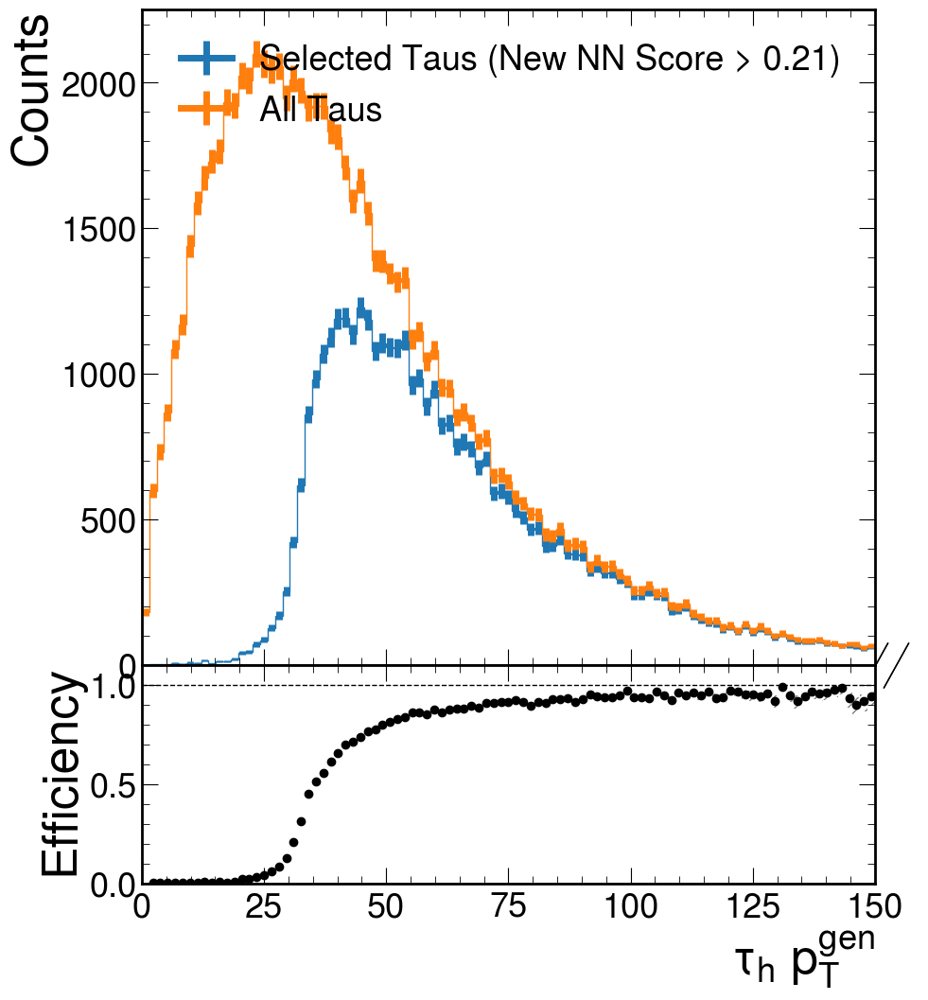

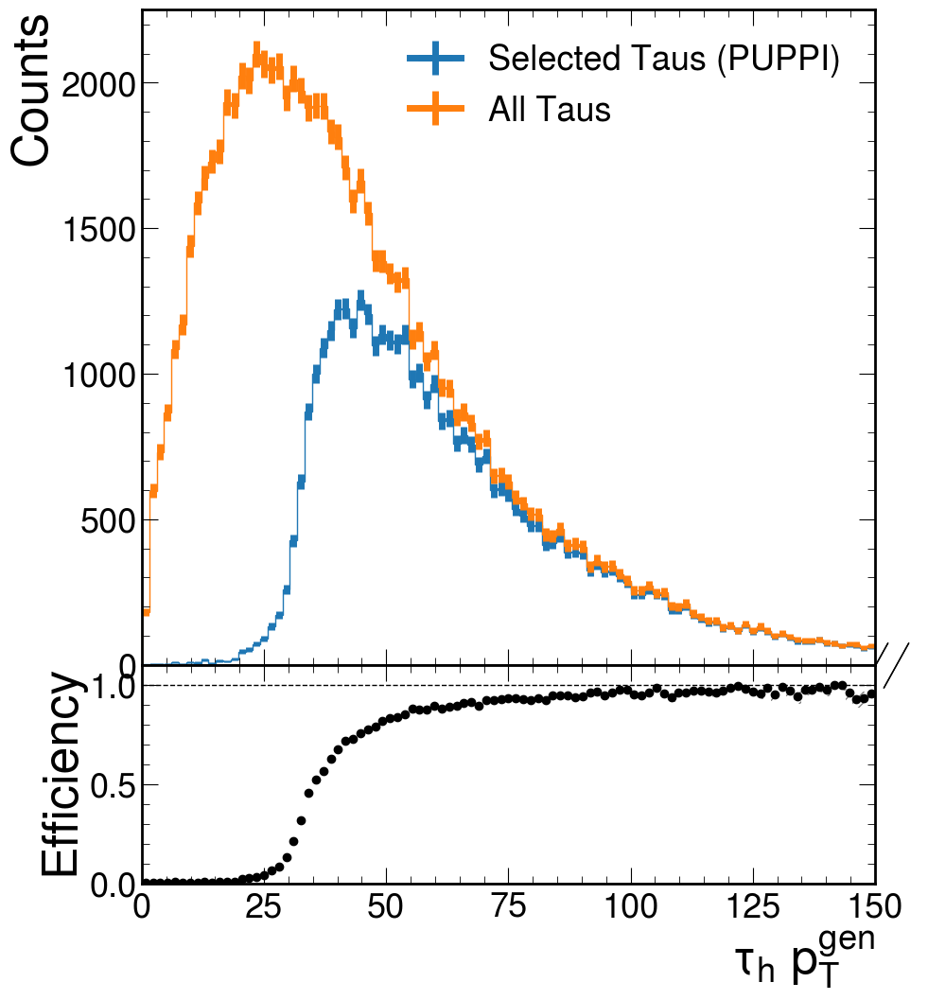

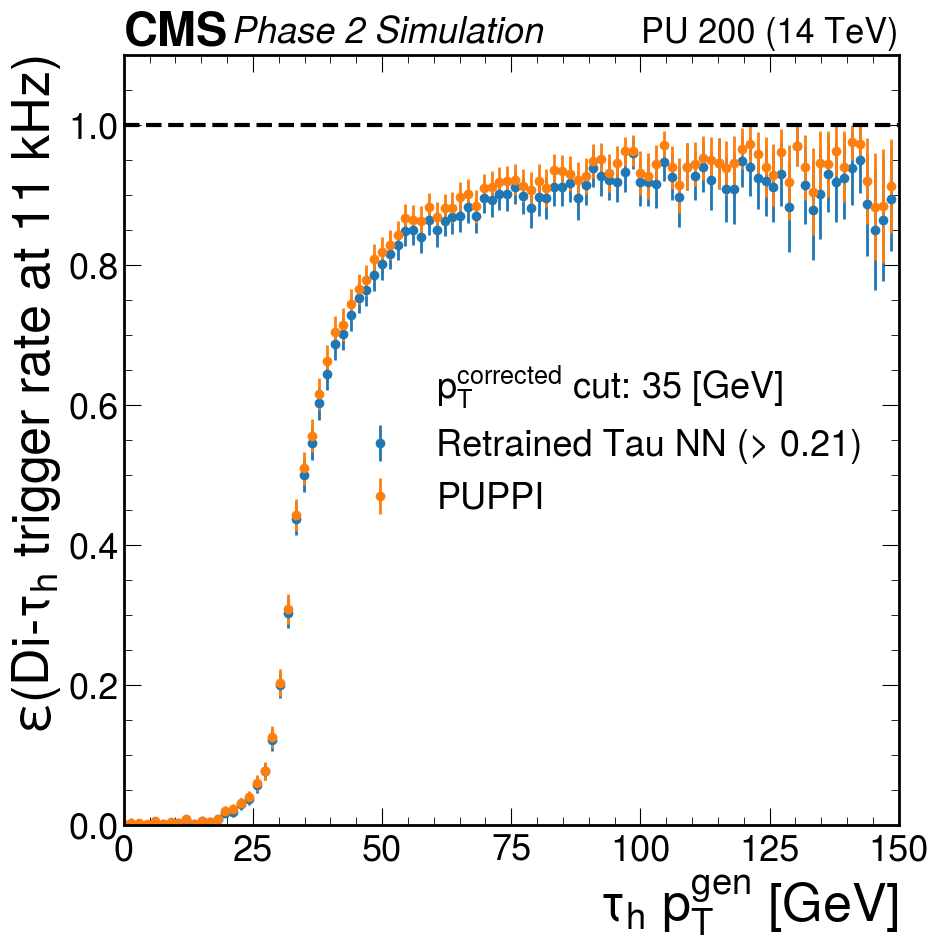

1124/1124 [==============================] - 1s 1ms/step


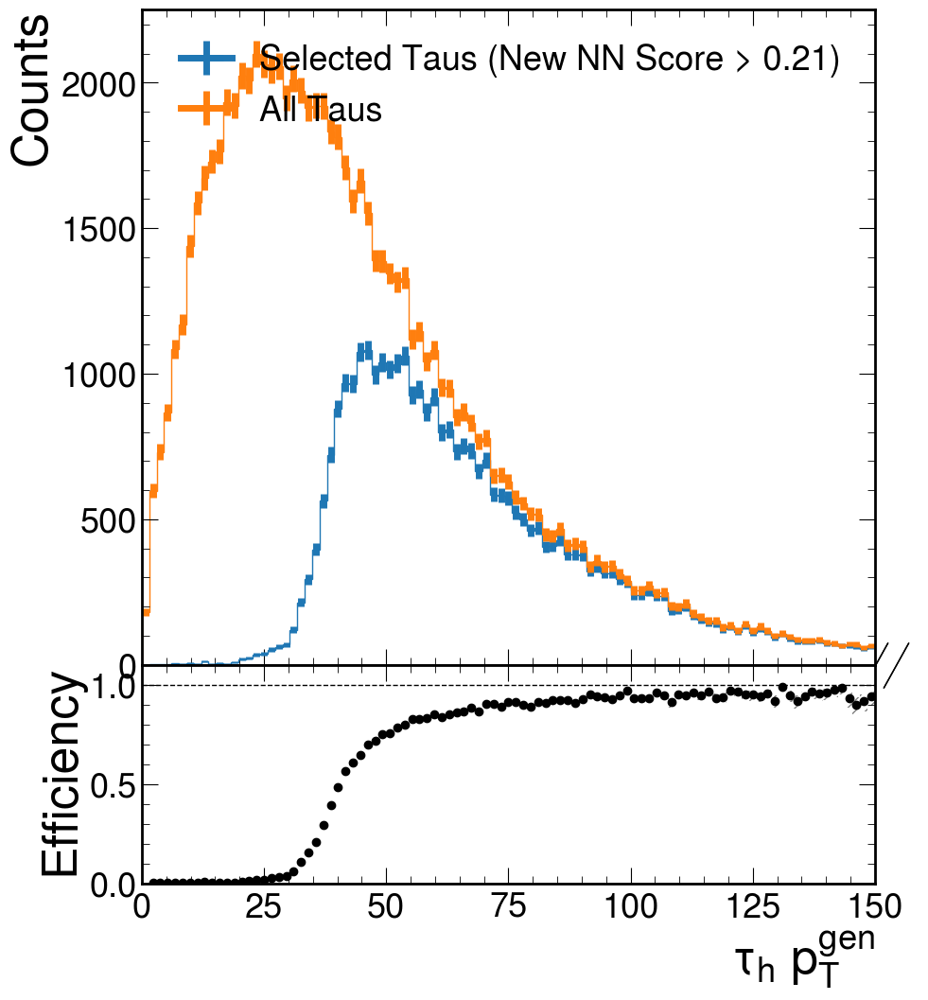

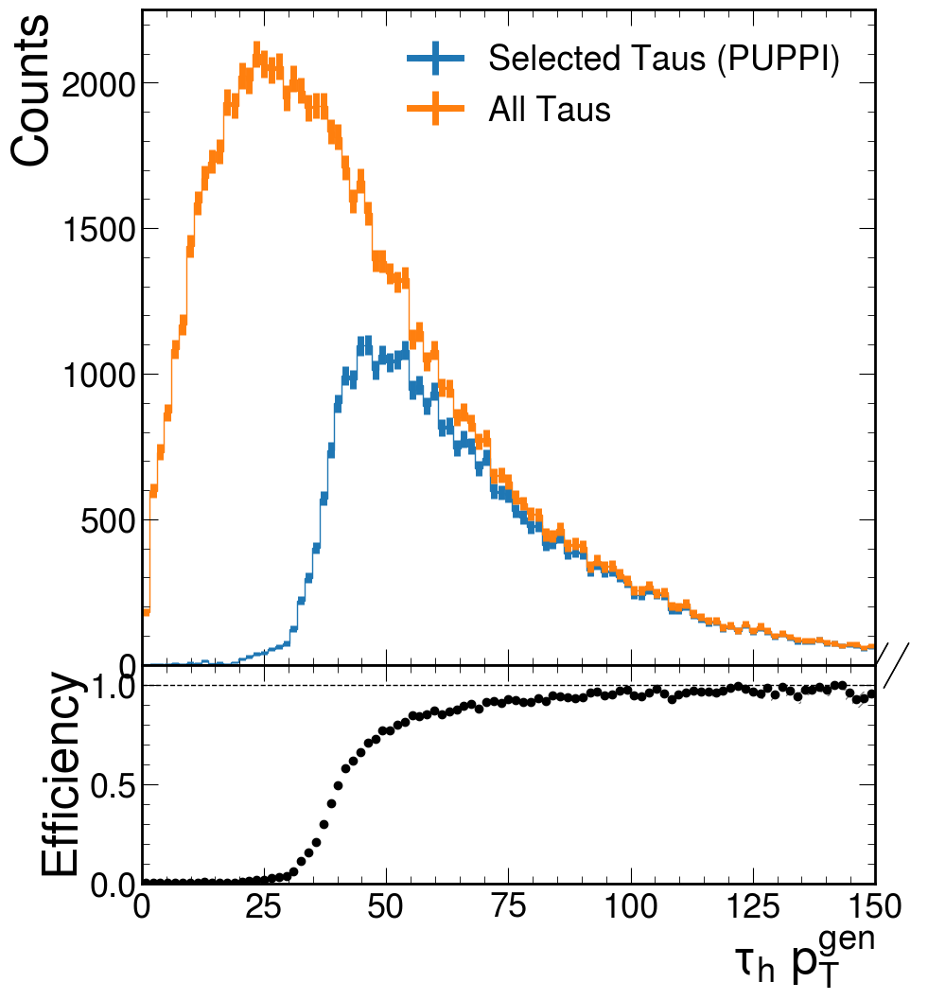

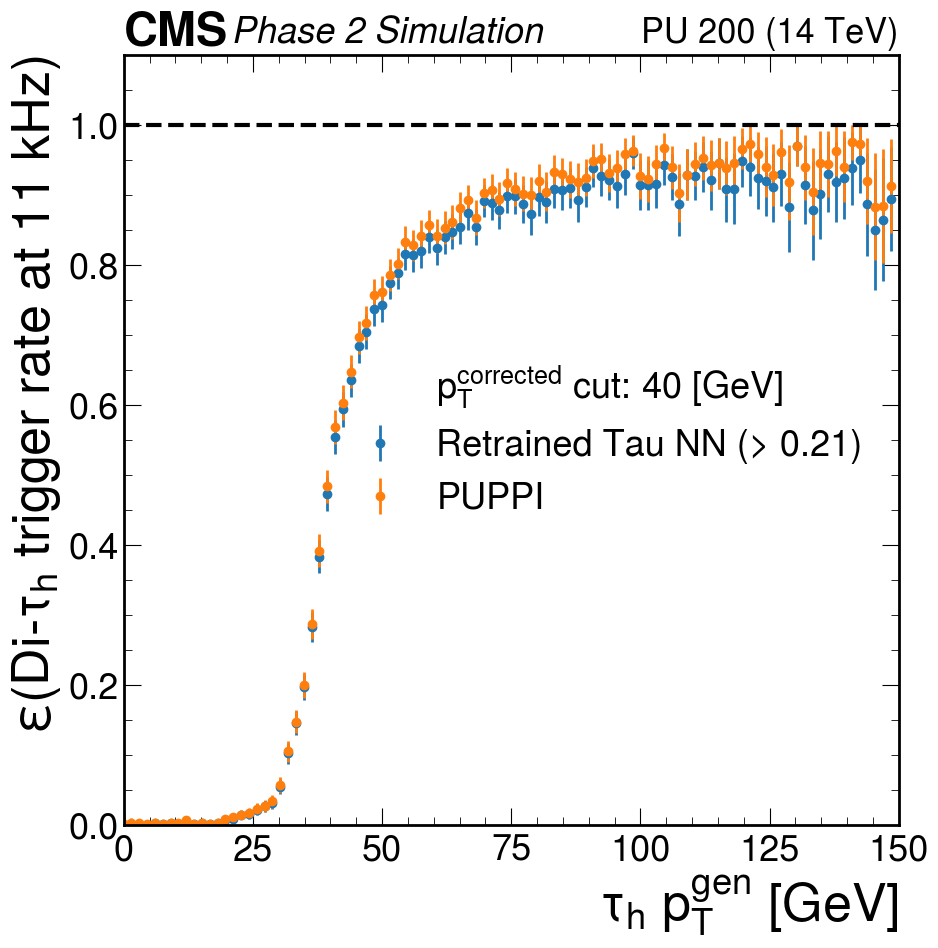

831/831 [==============================] - 1s 1ms/step


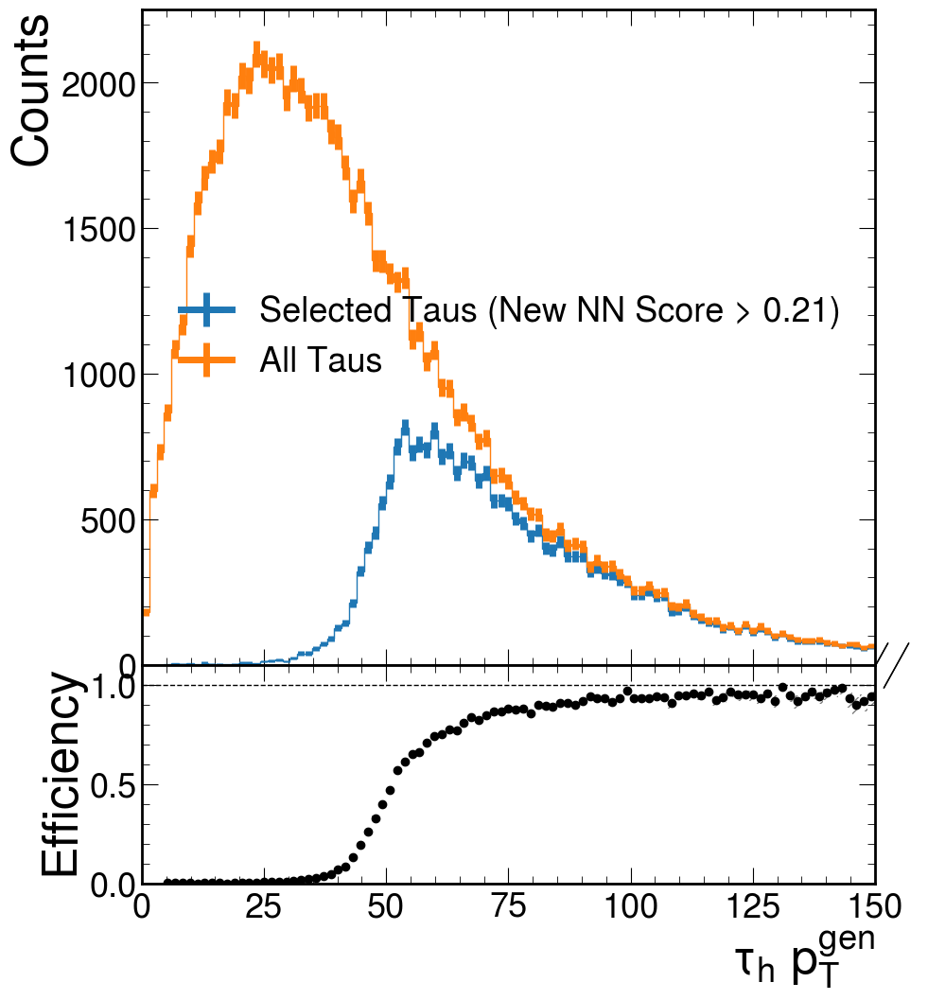

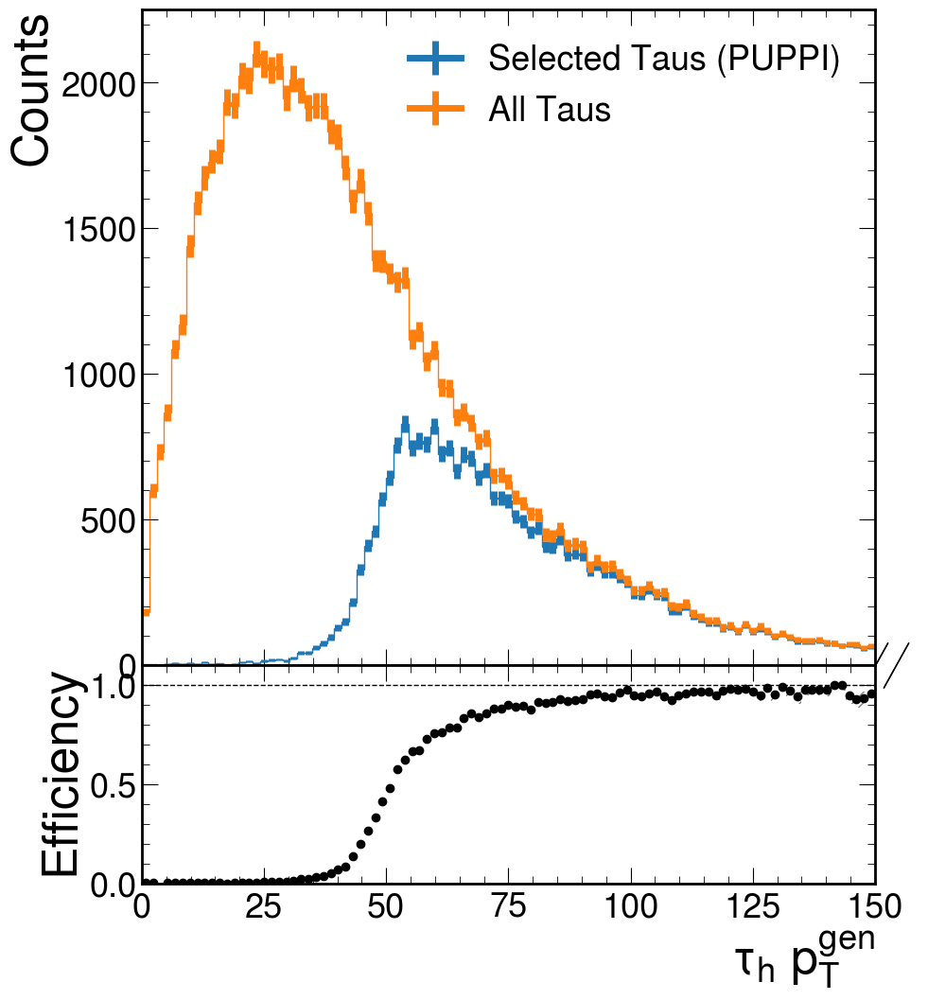

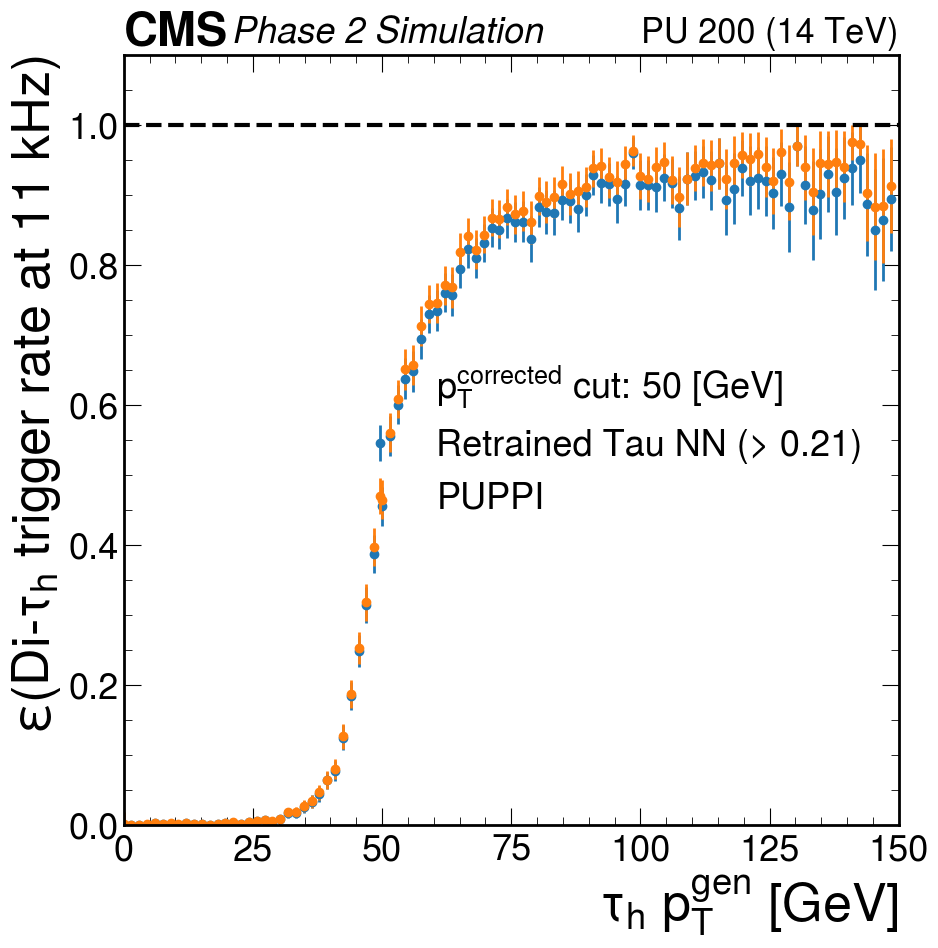

594/594 [==============================] - 1s 1ms/step


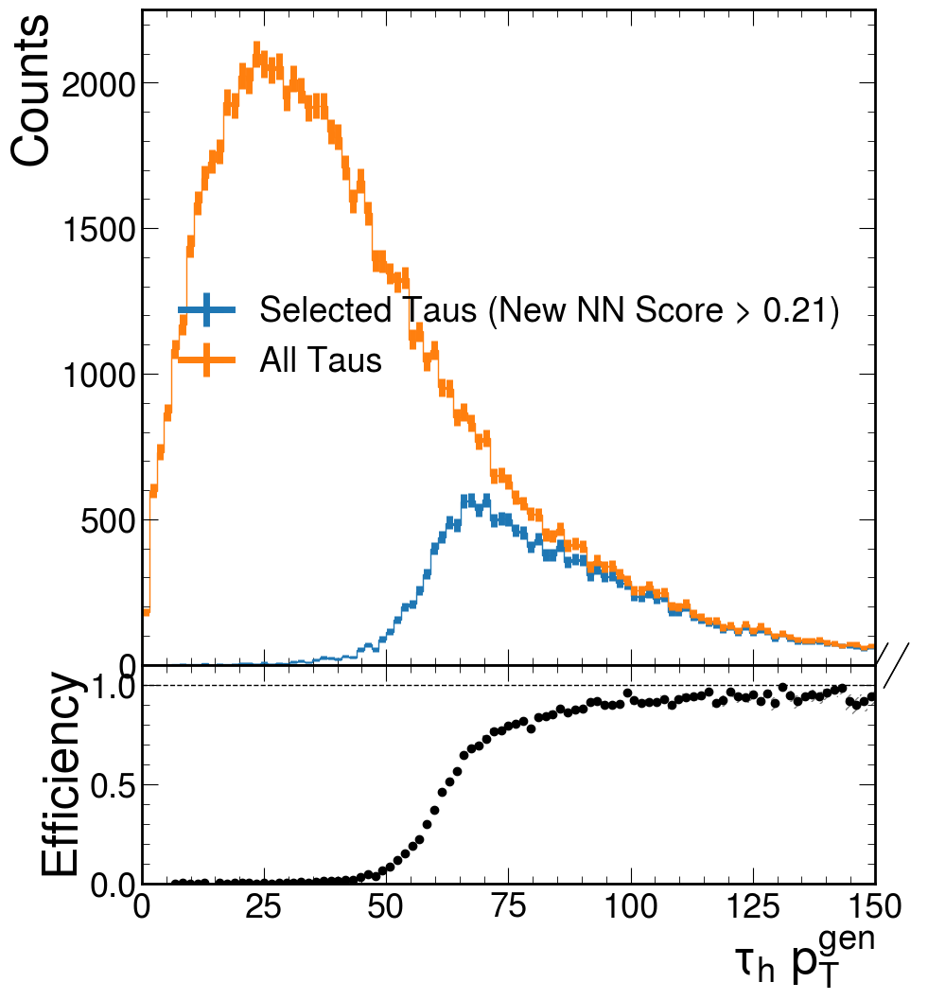

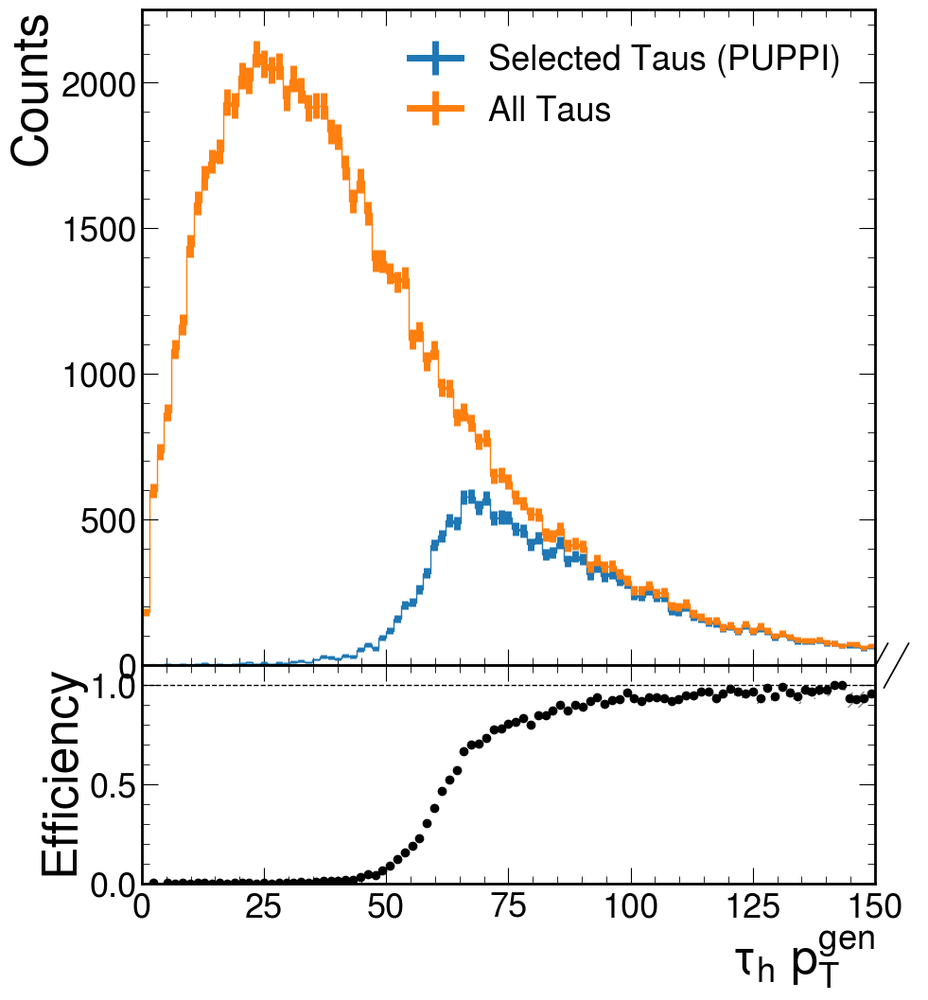

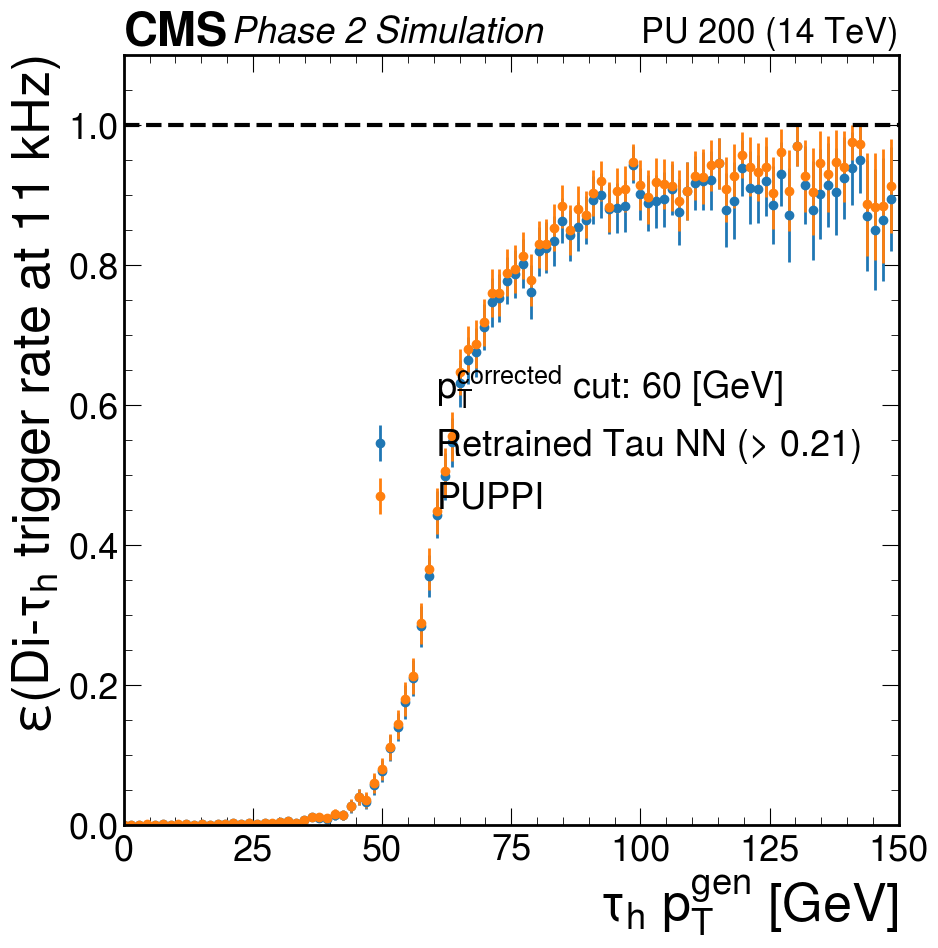

423/423 [==============================] - 1s 1ms/step


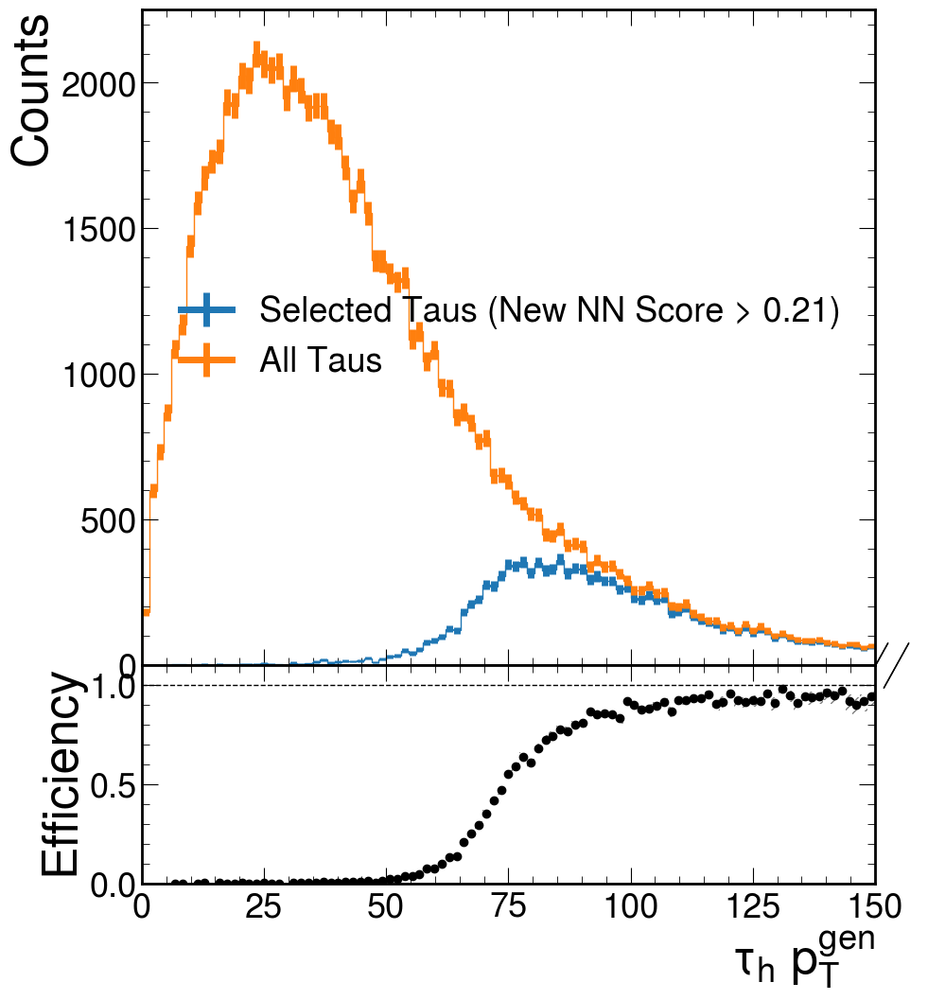

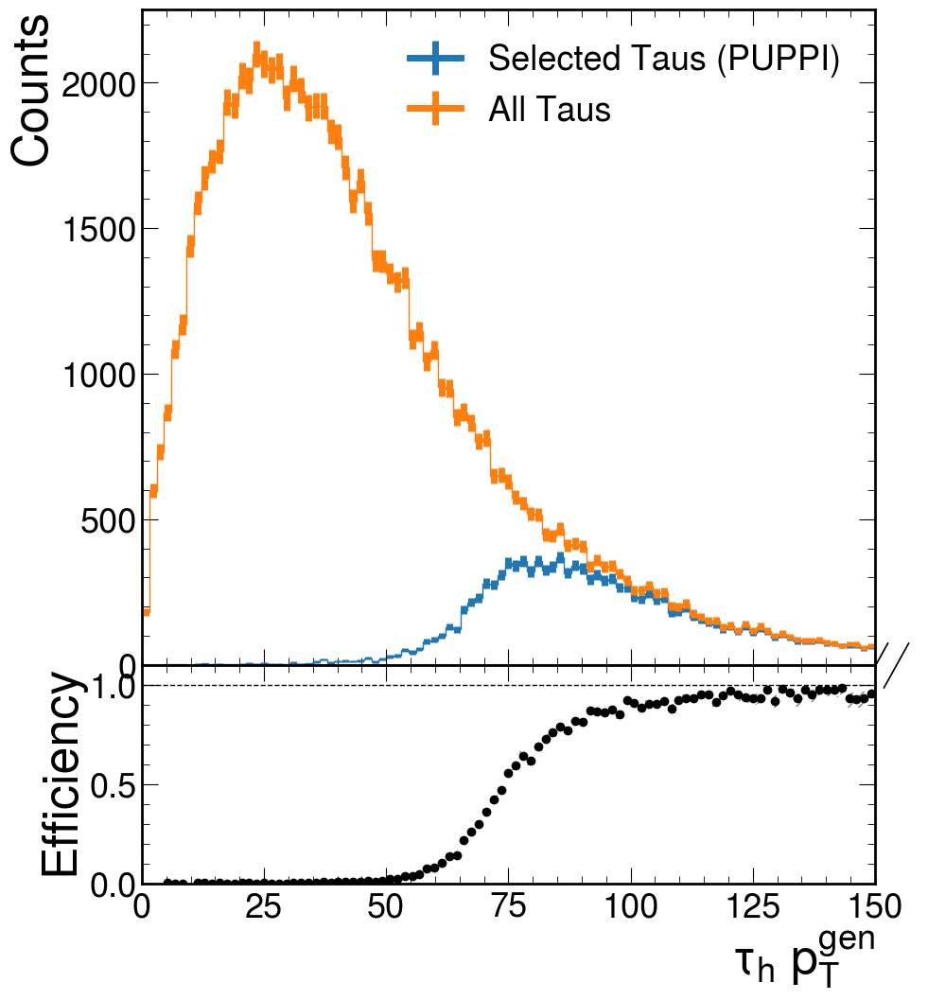

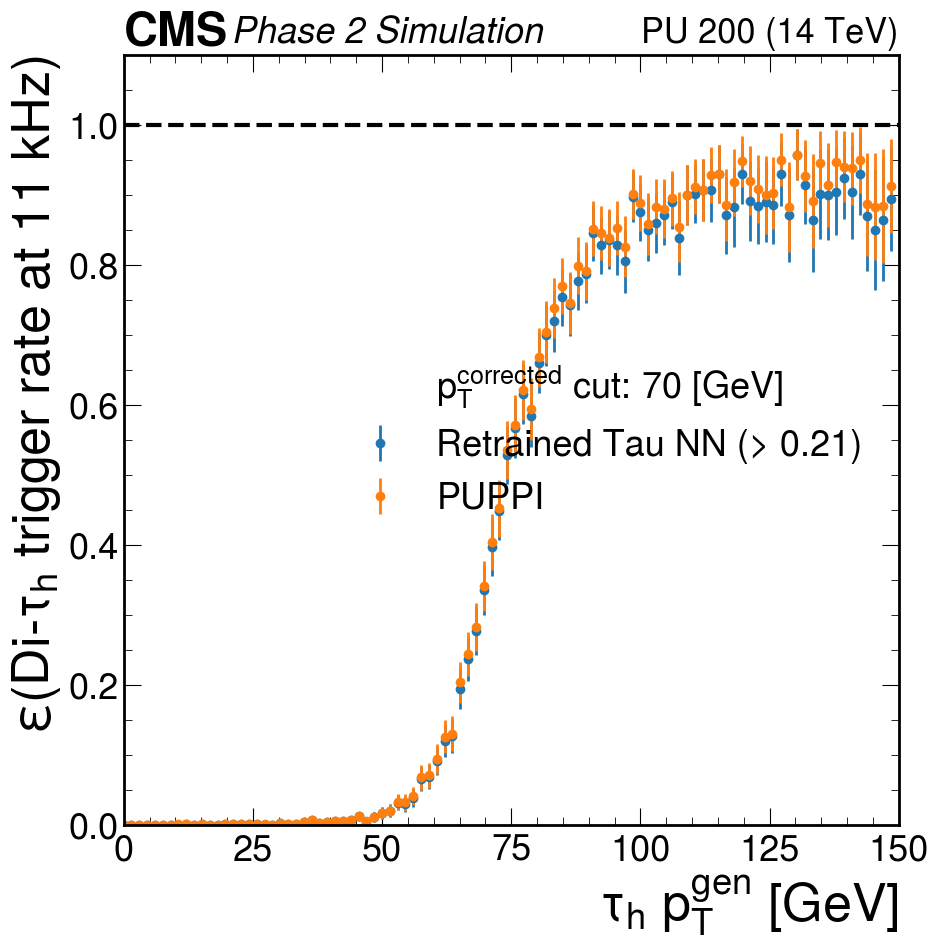

306/306 [==============================] - 0s 1ms/step


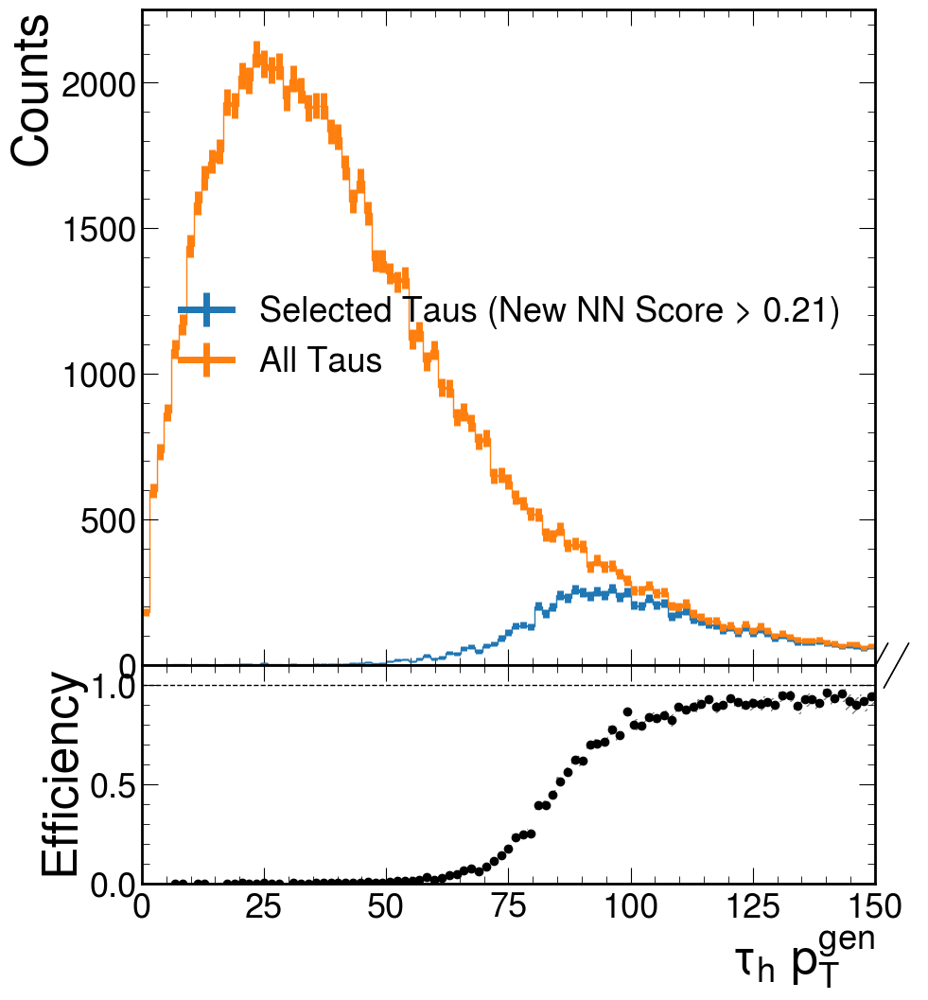

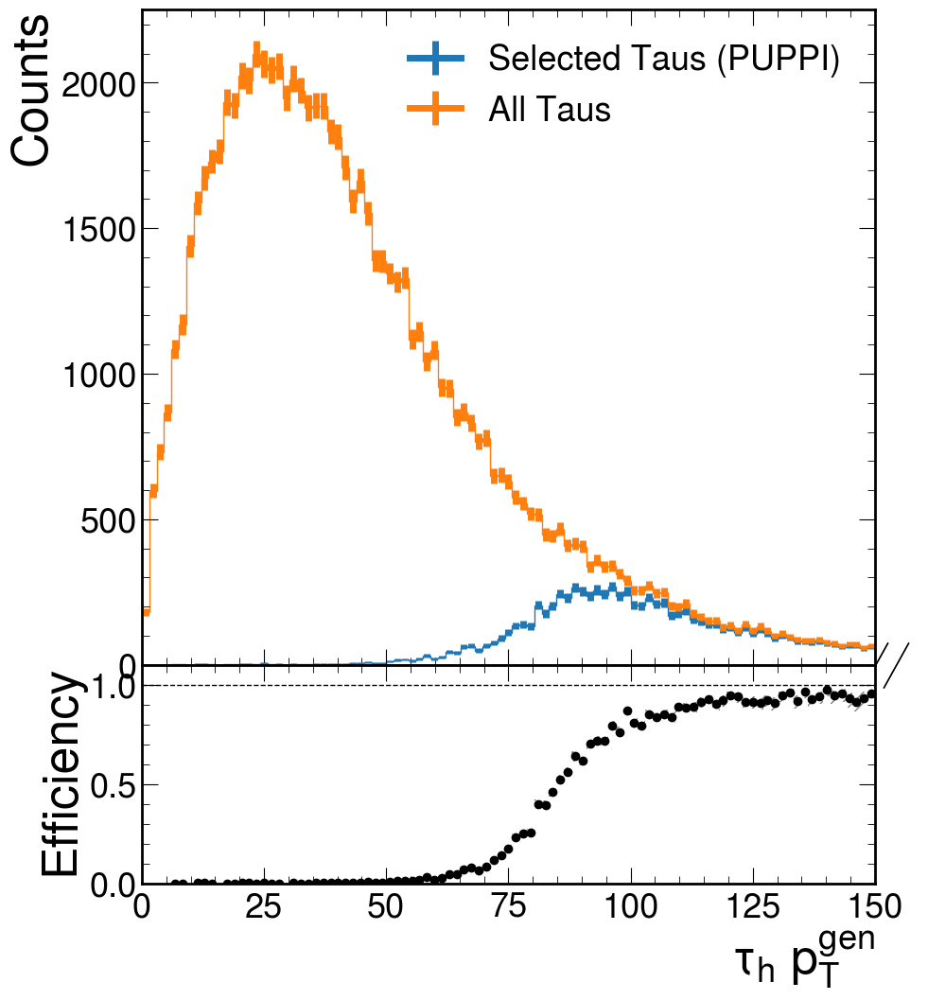

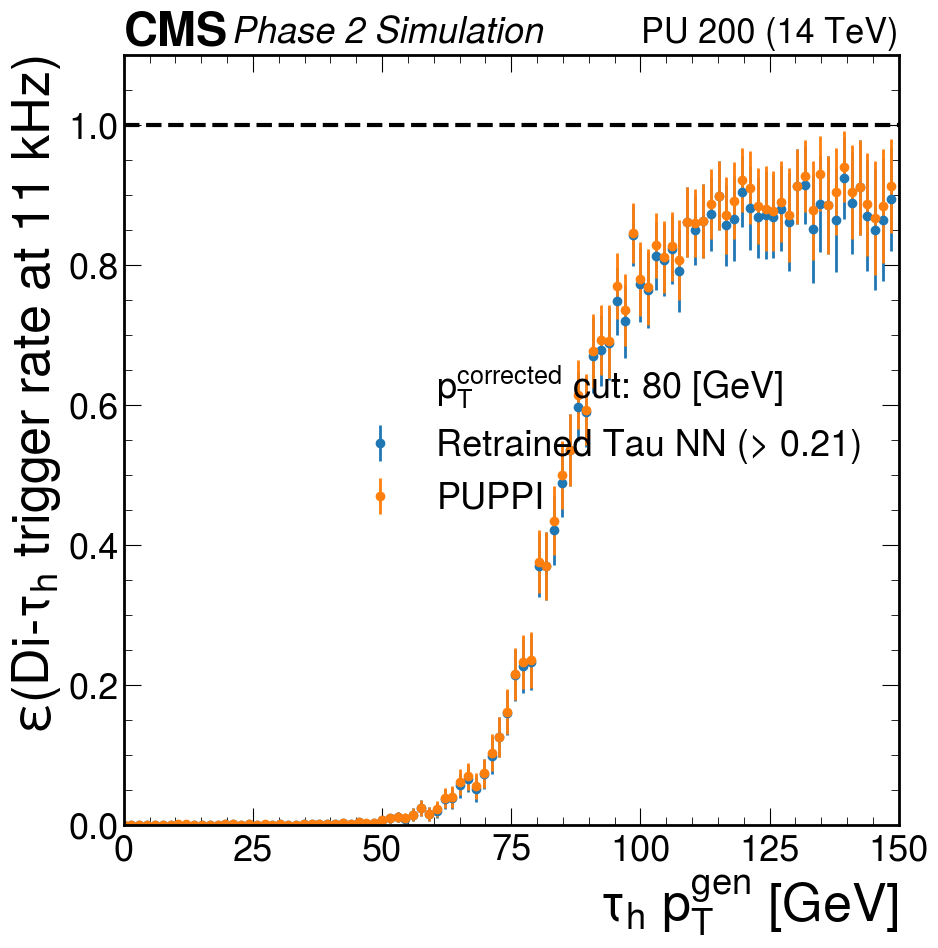

1905/1905 [==============================] - 2s 919us/step


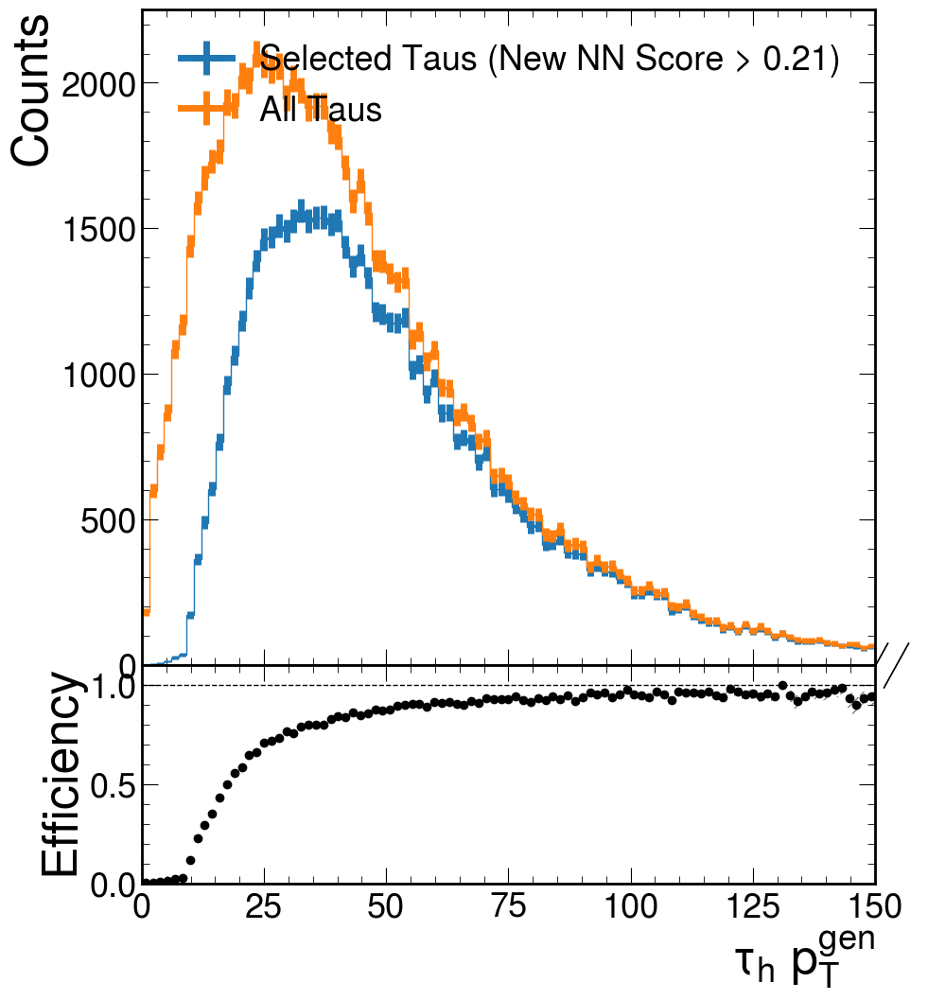

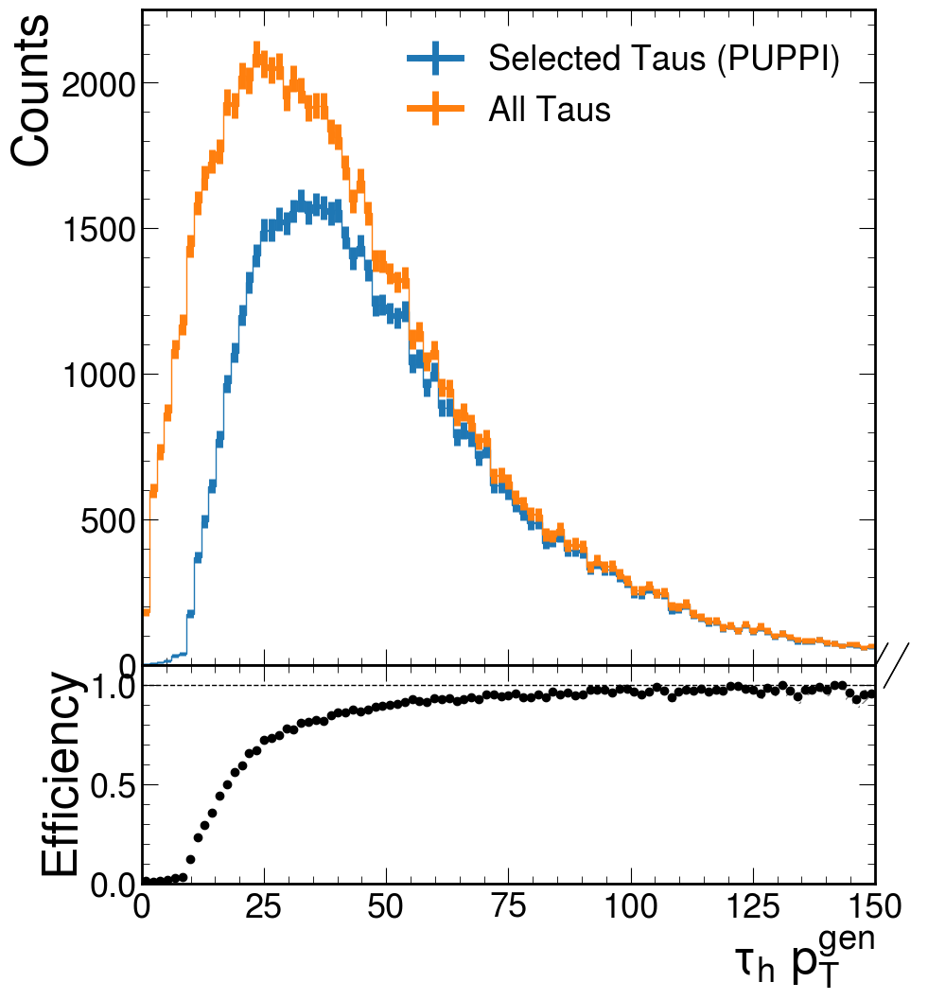

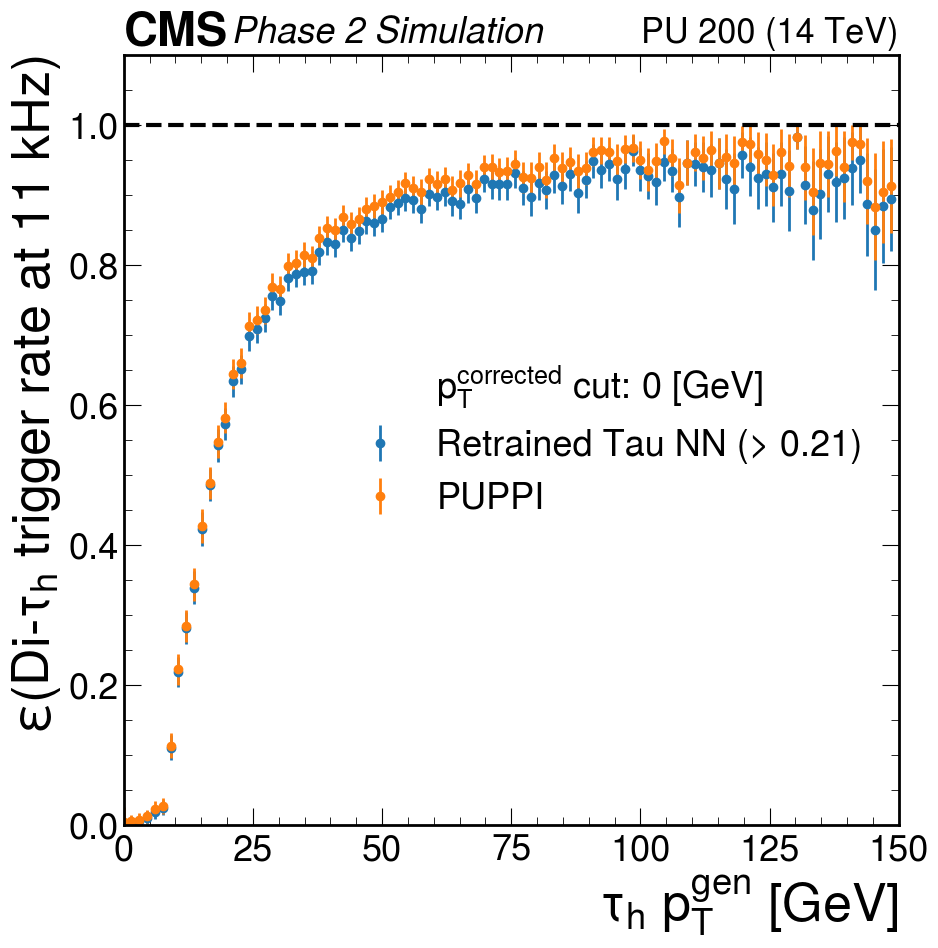

1743/1743 [==============================] - 2s 1ms/step


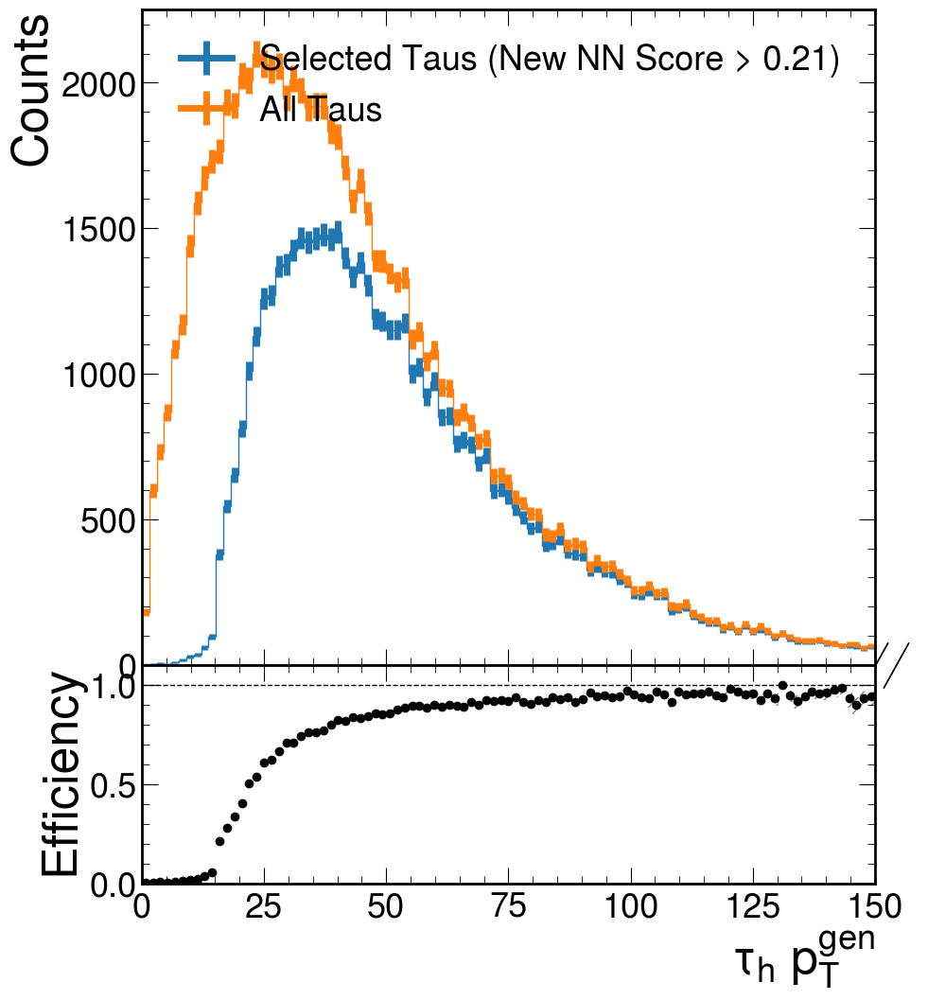

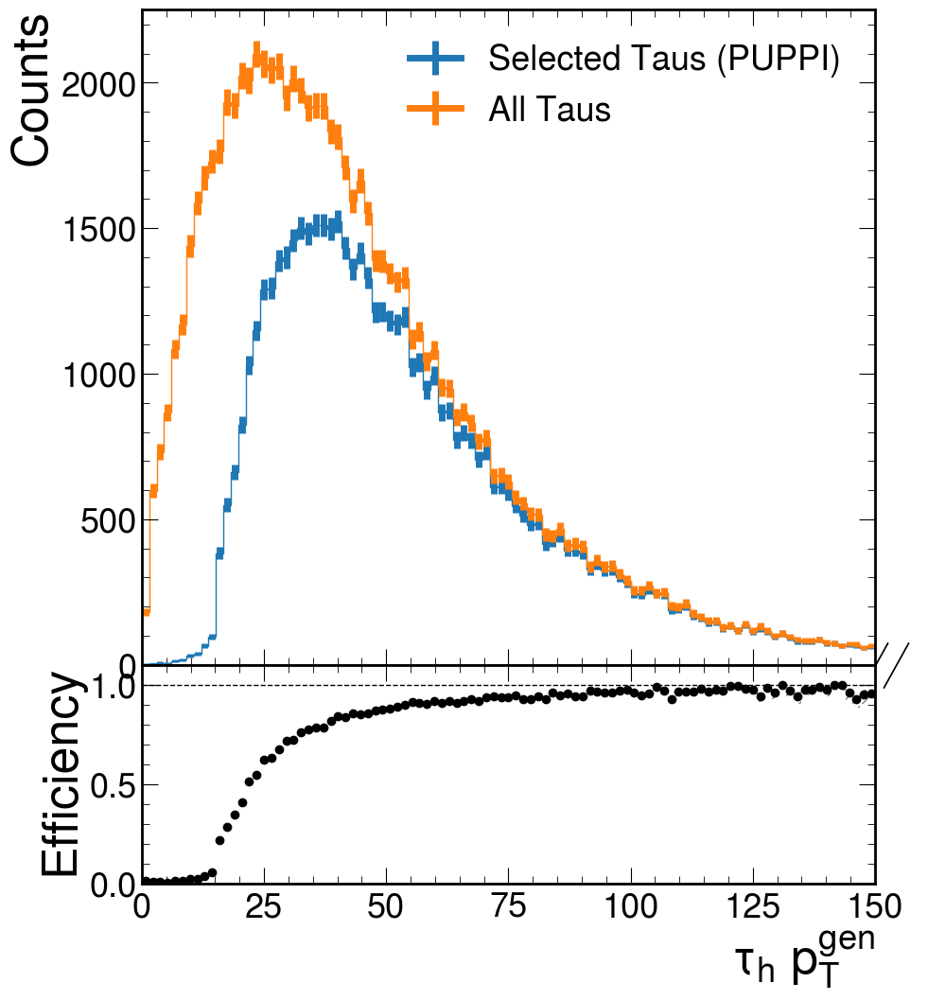

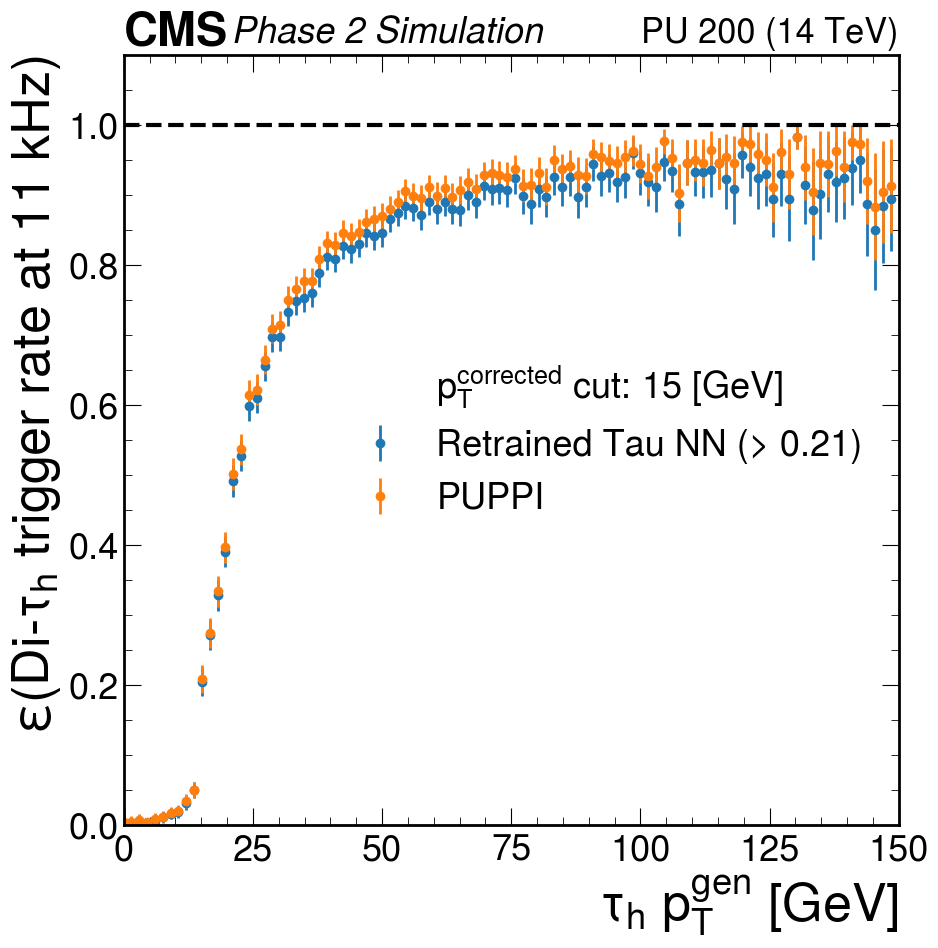

1585/1585 [==============================] - 2s 974us/step


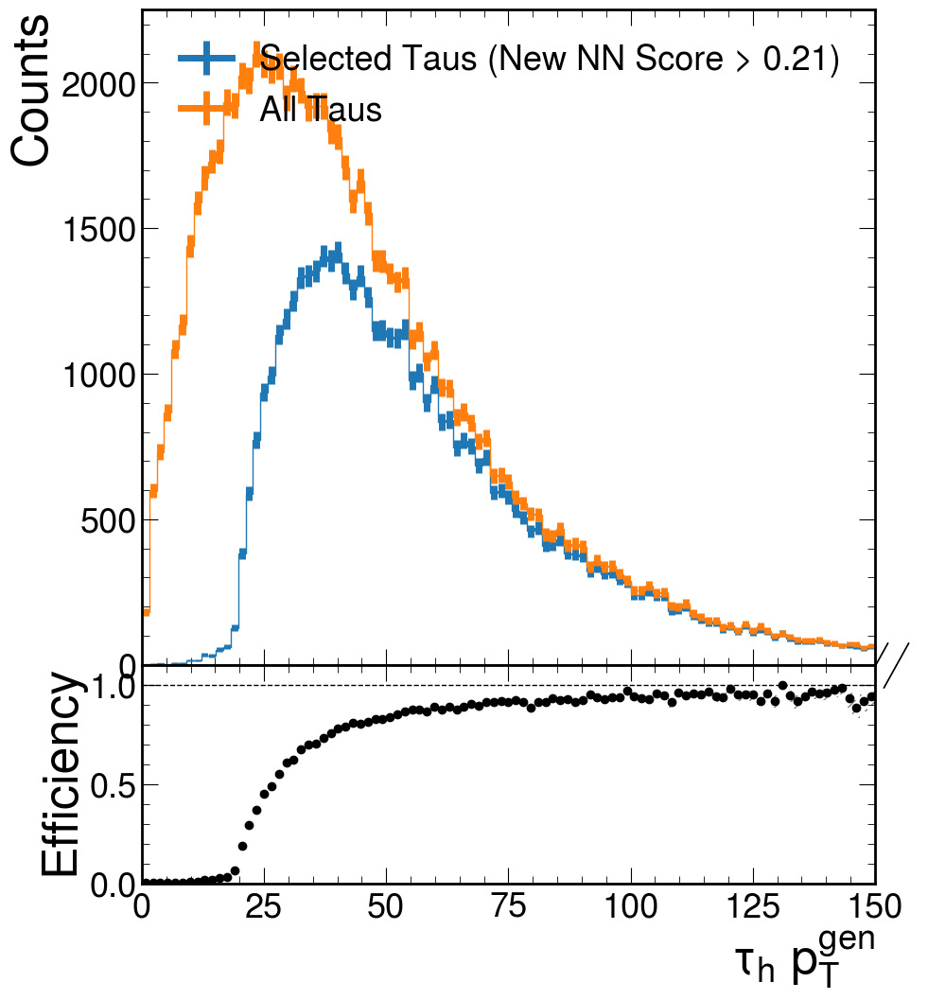

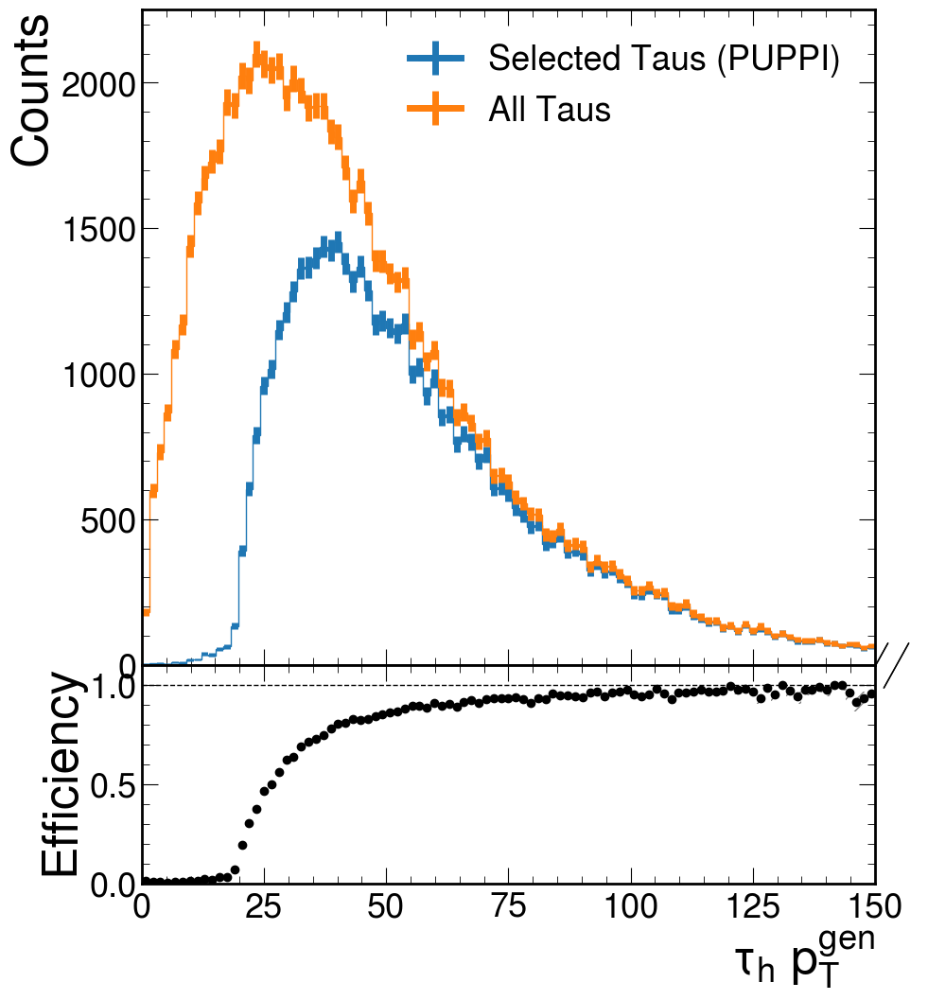

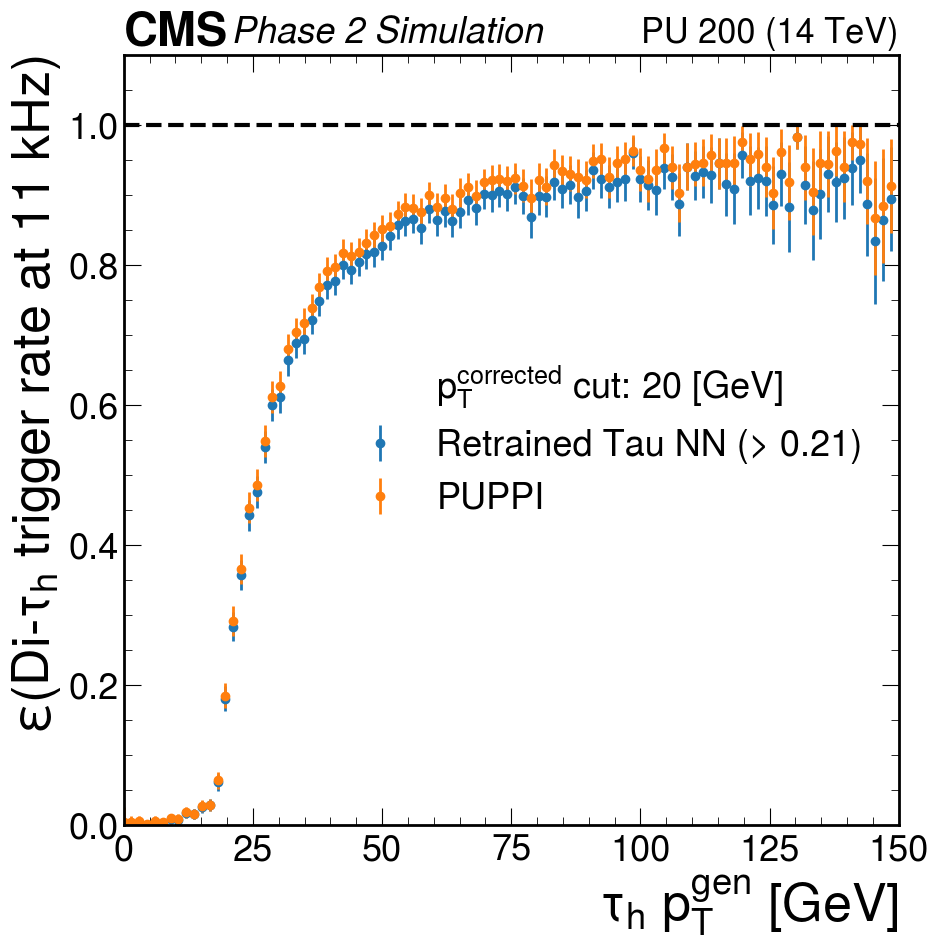

1421/1421 [==============================] - 1s 982us/step


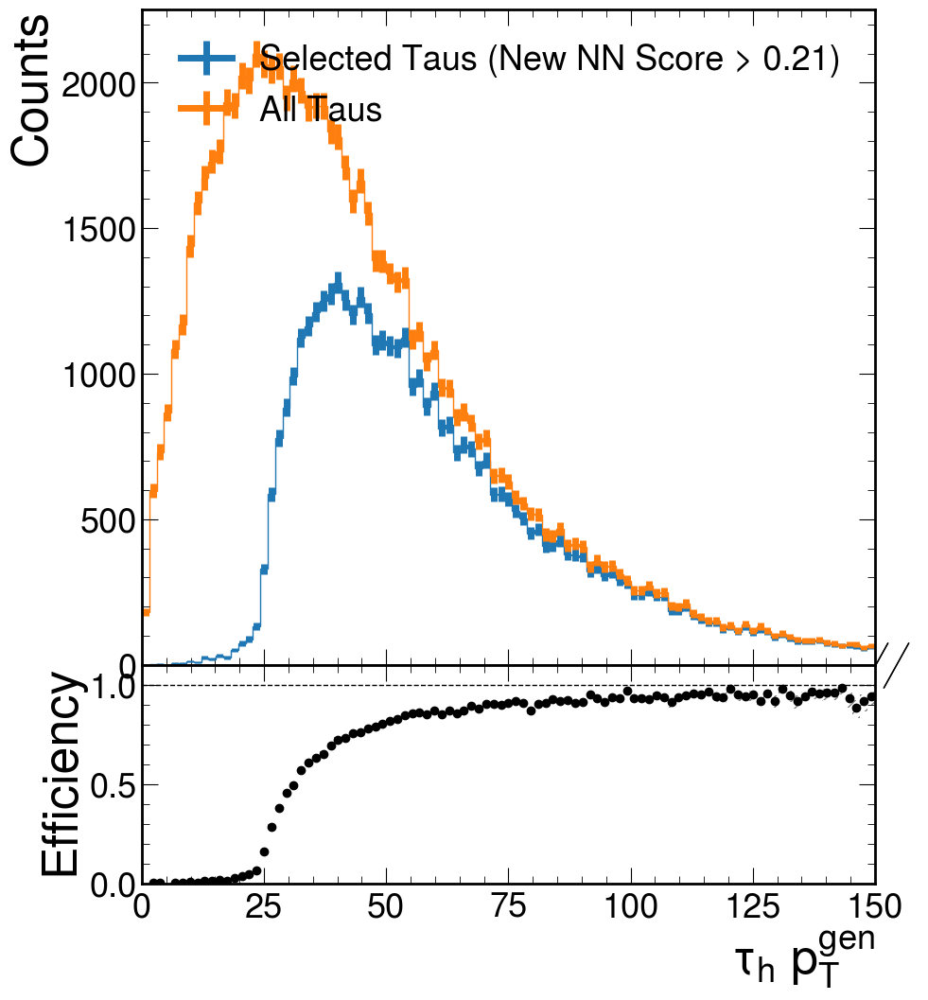

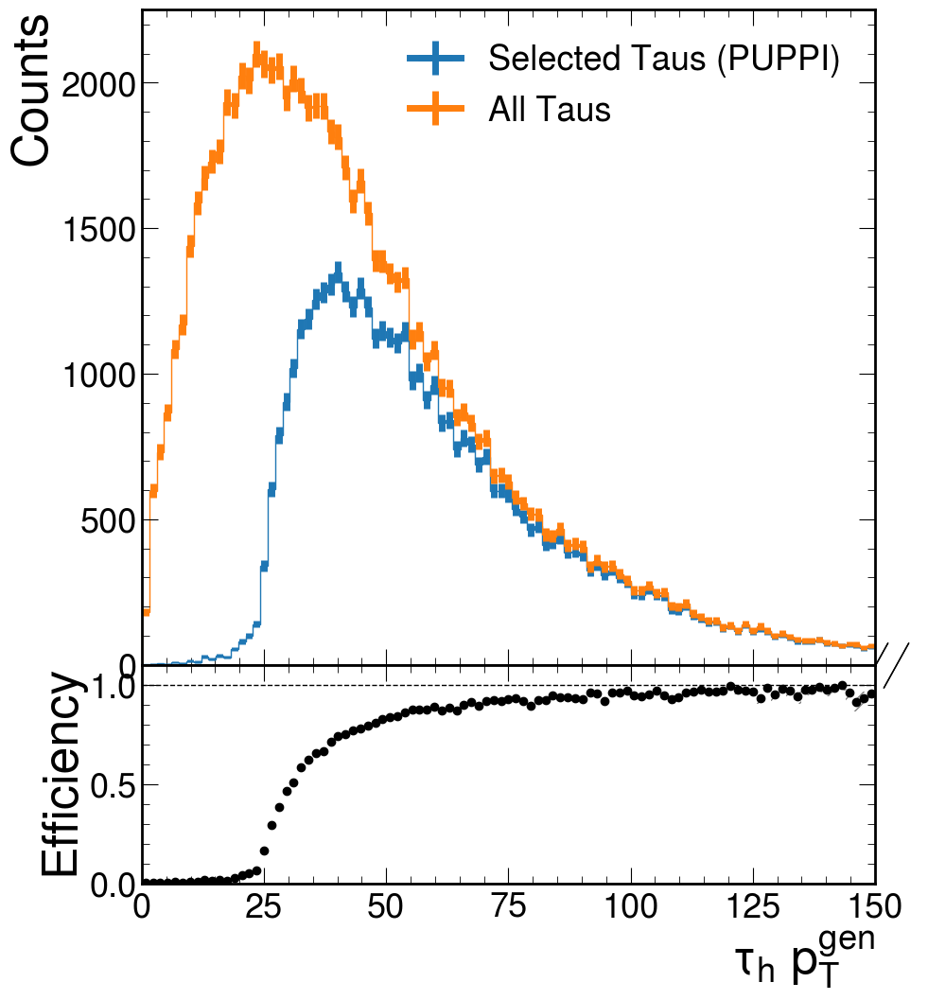

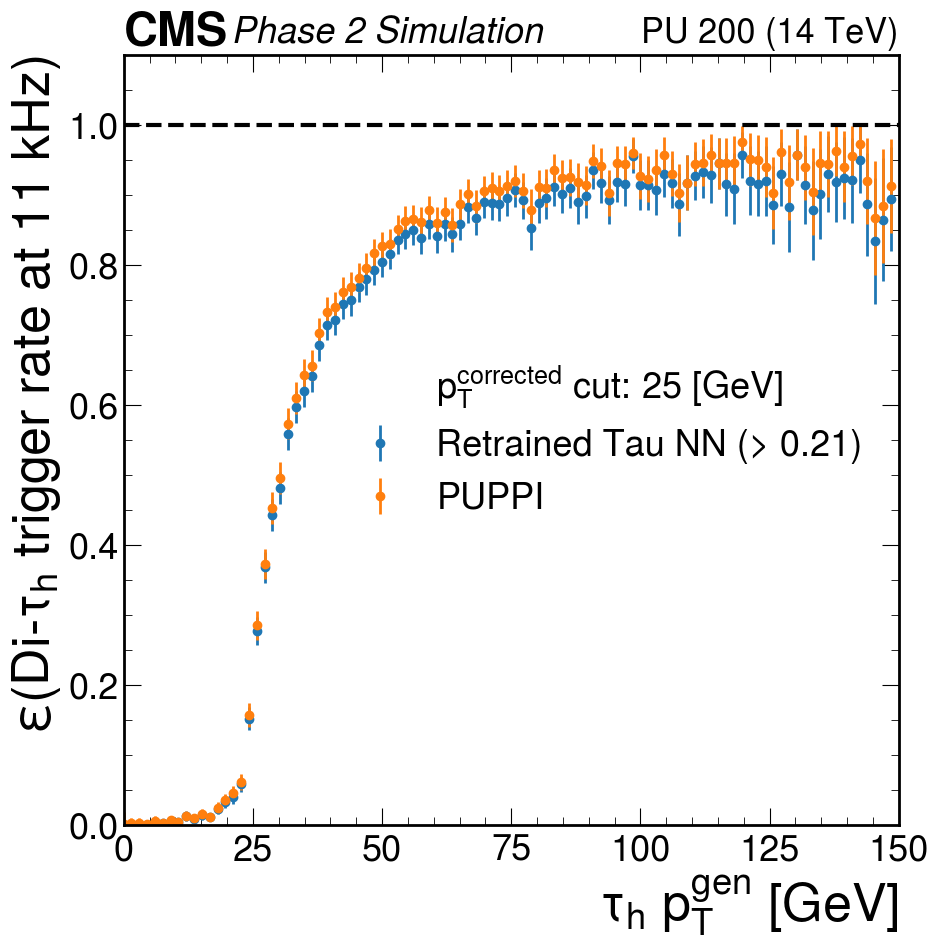

1258/1258 [==============================] - 1s 1ms/step


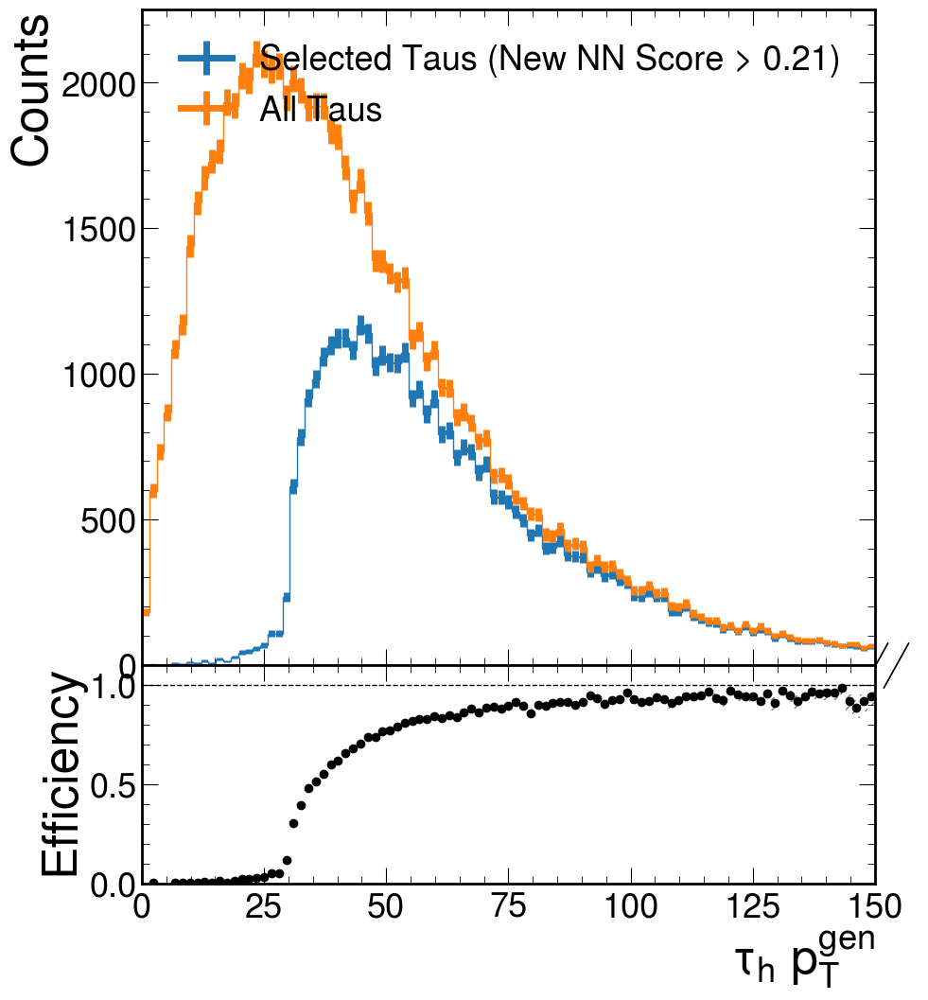

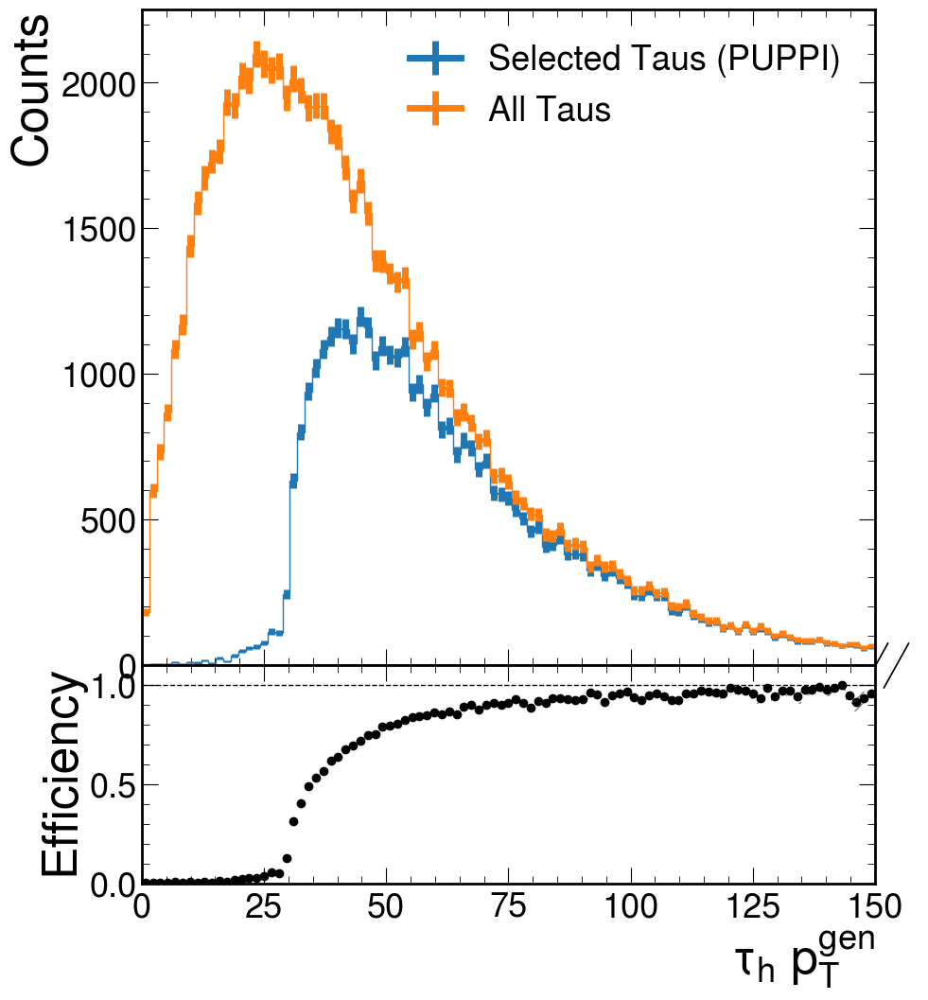

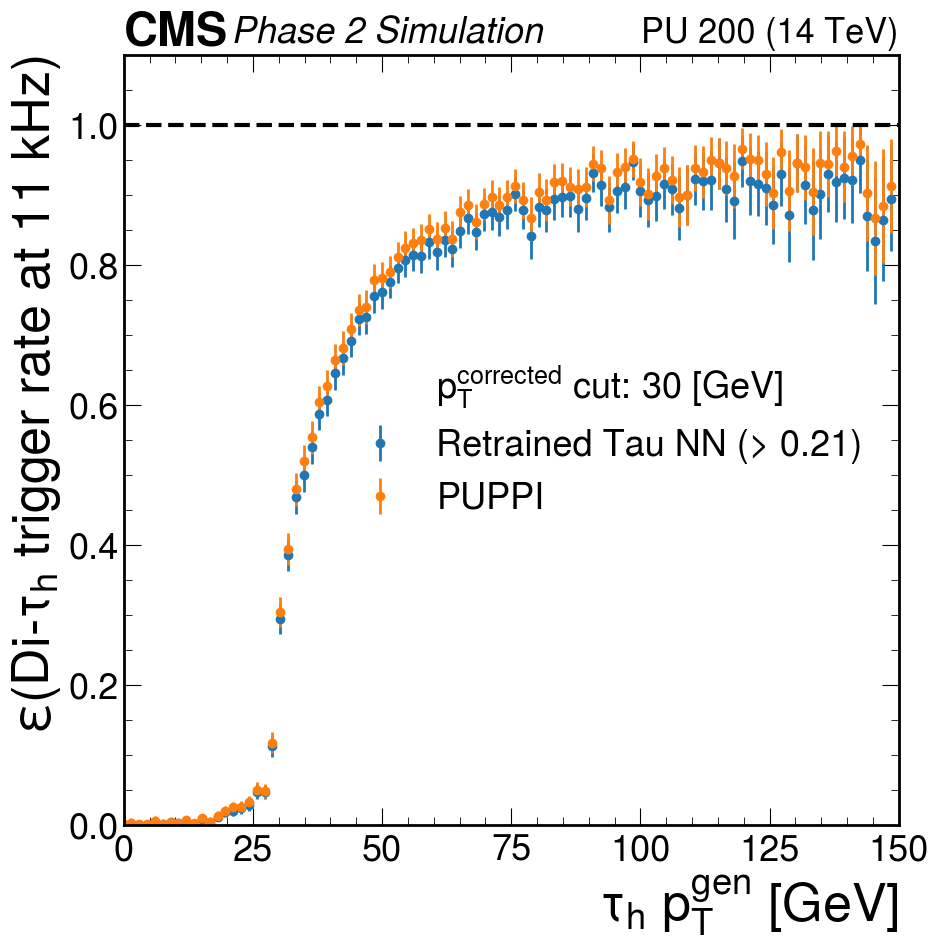

1092/1092 [==============================] - 1s 1ms/step


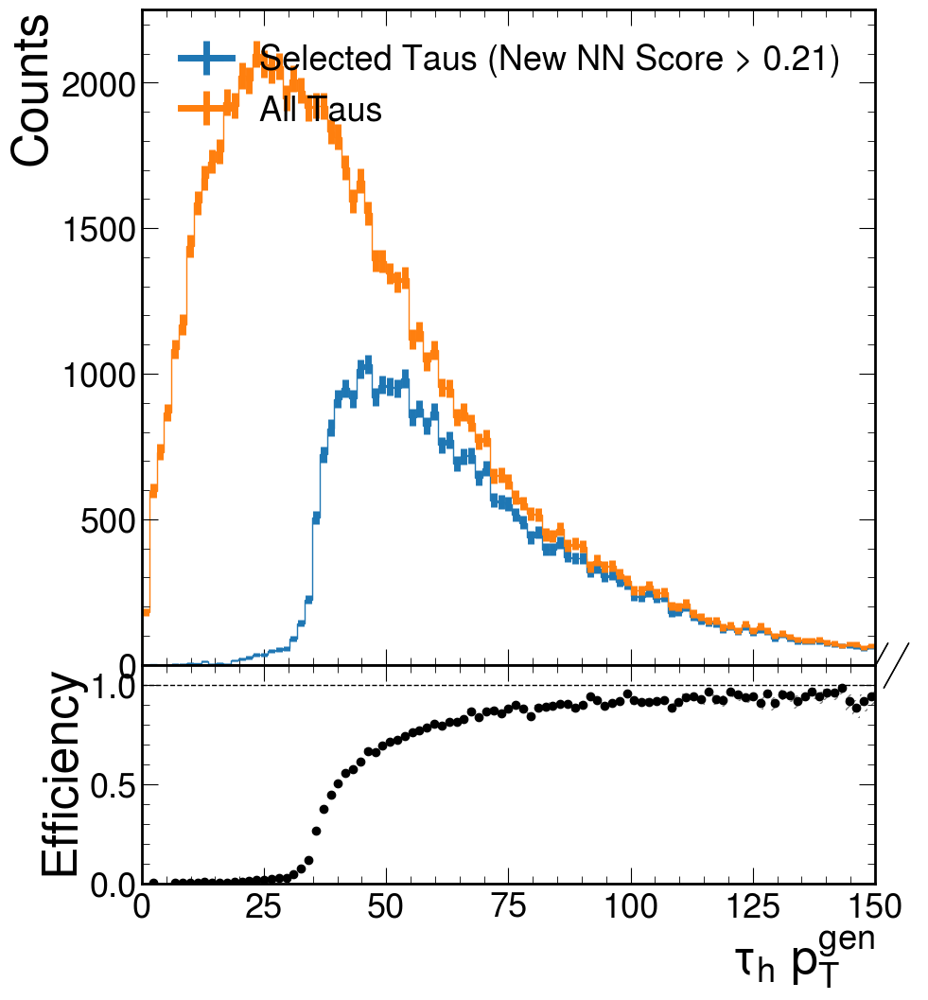

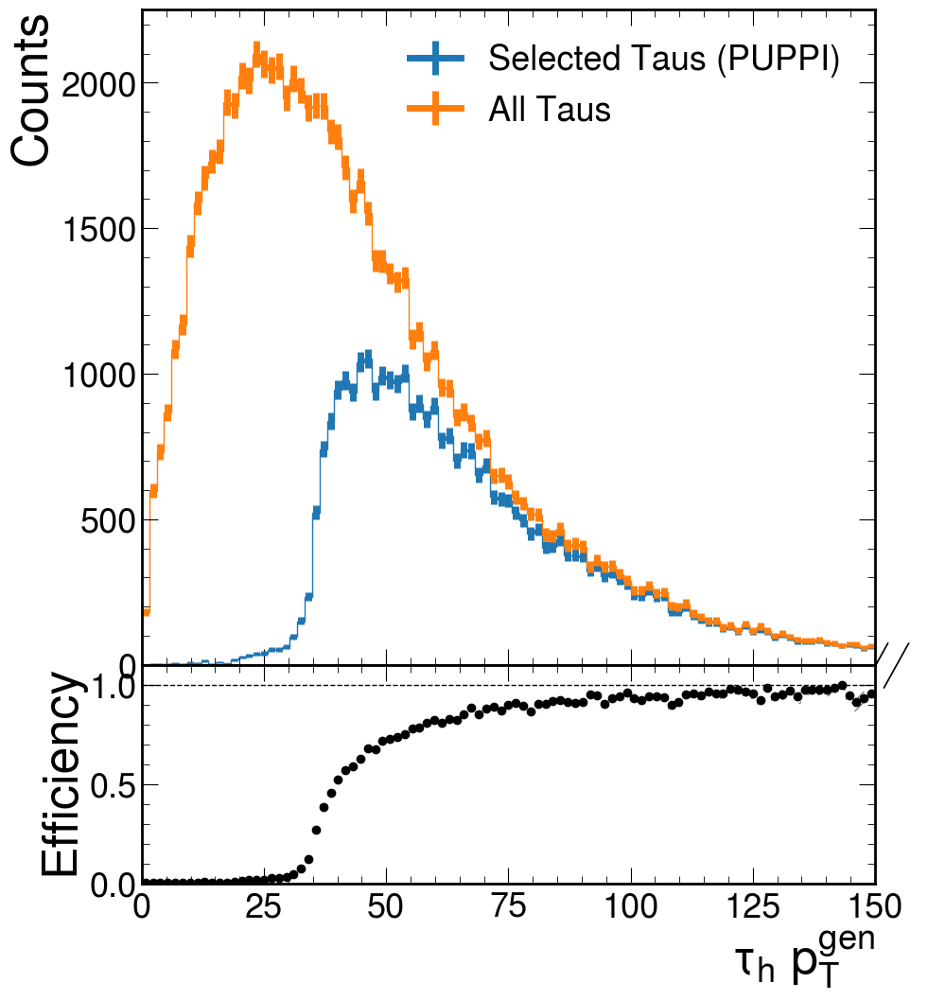

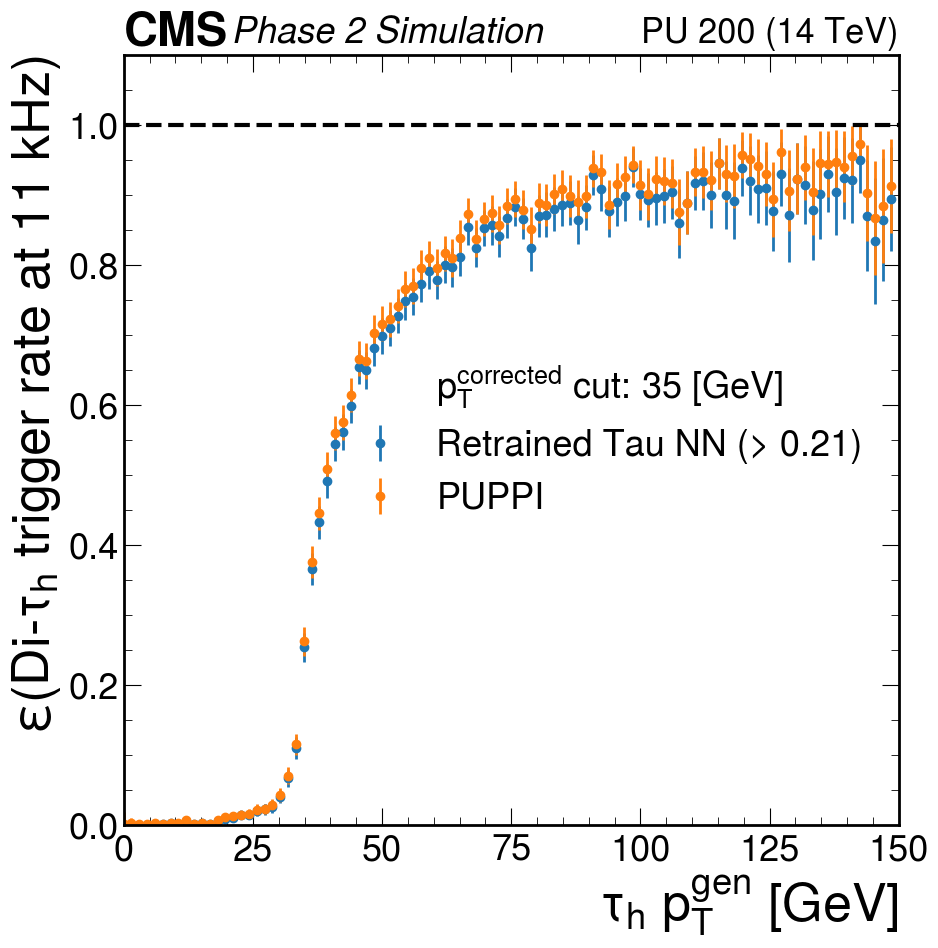

943/943 [==============================] - 1s 1ms/step


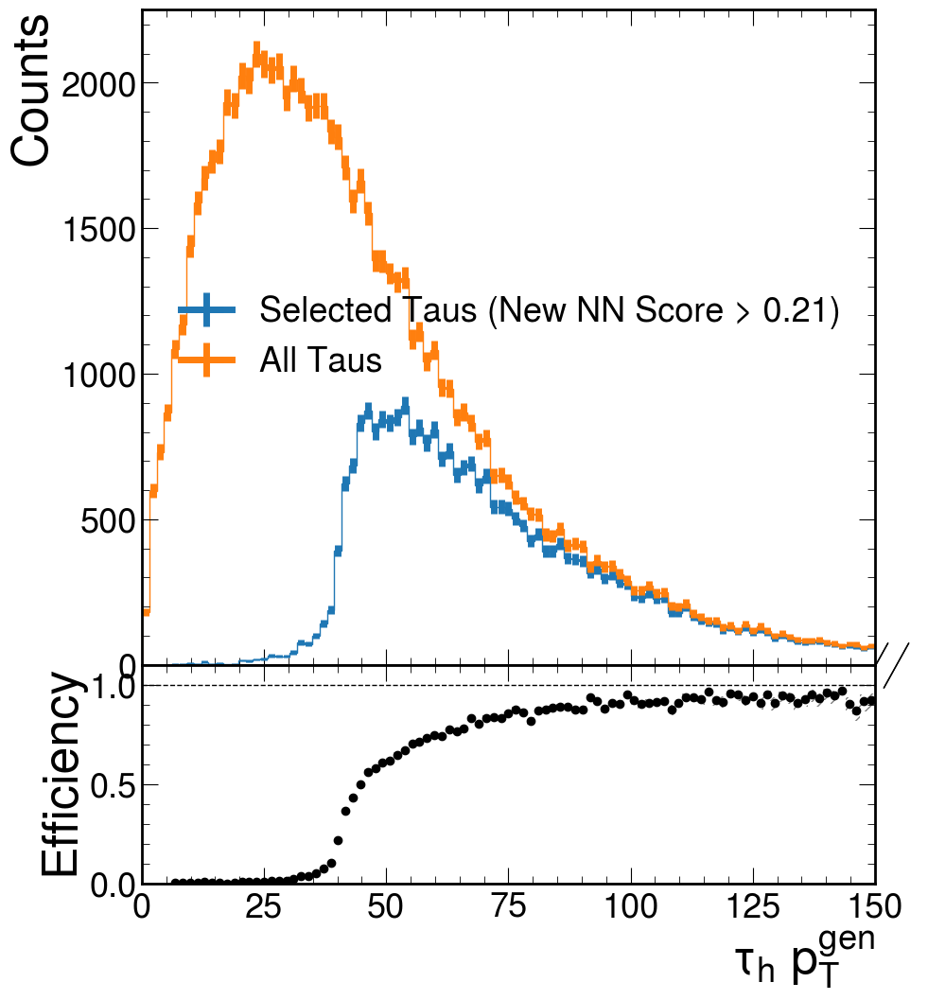

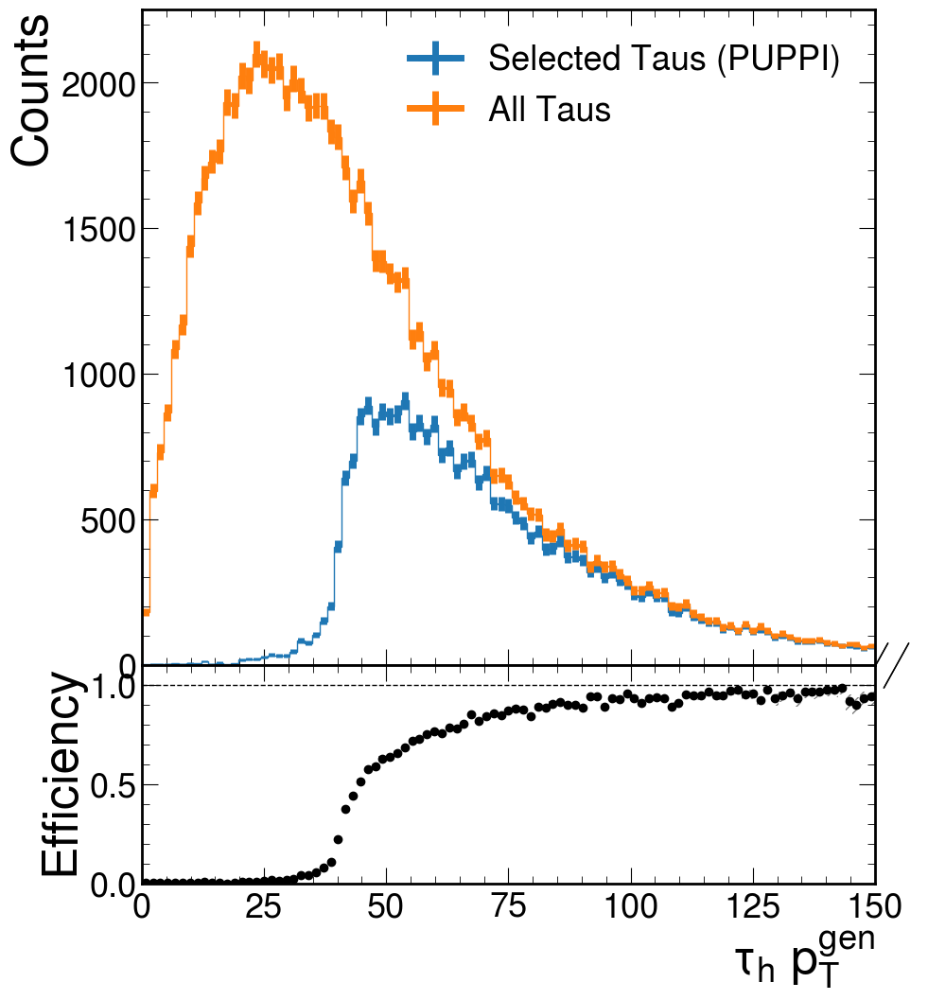

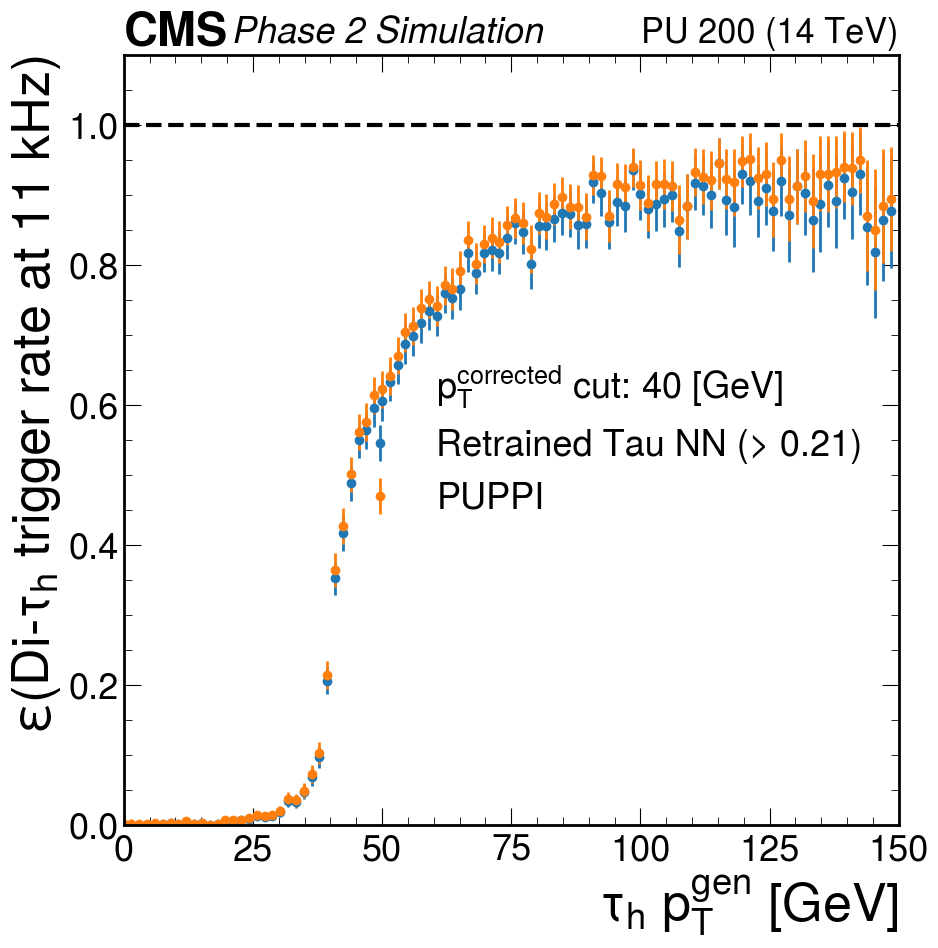

687/687 [==============================] - 1s 1ms/step


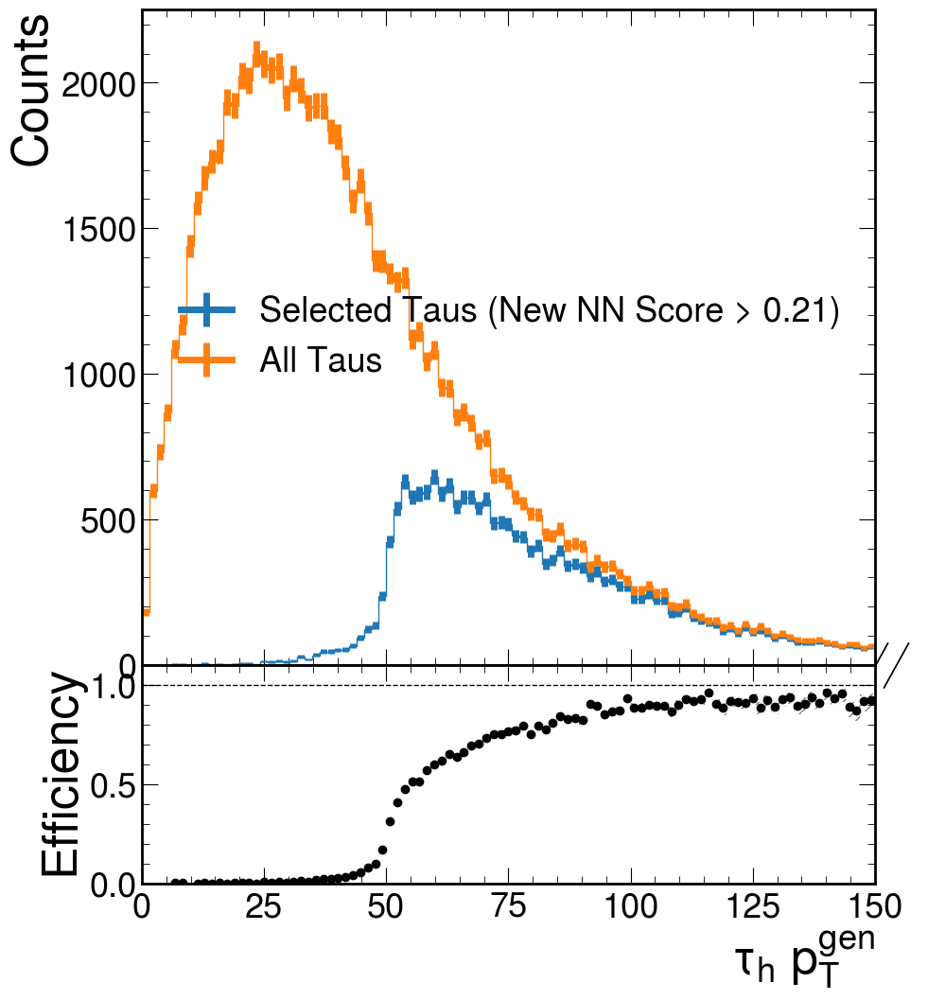

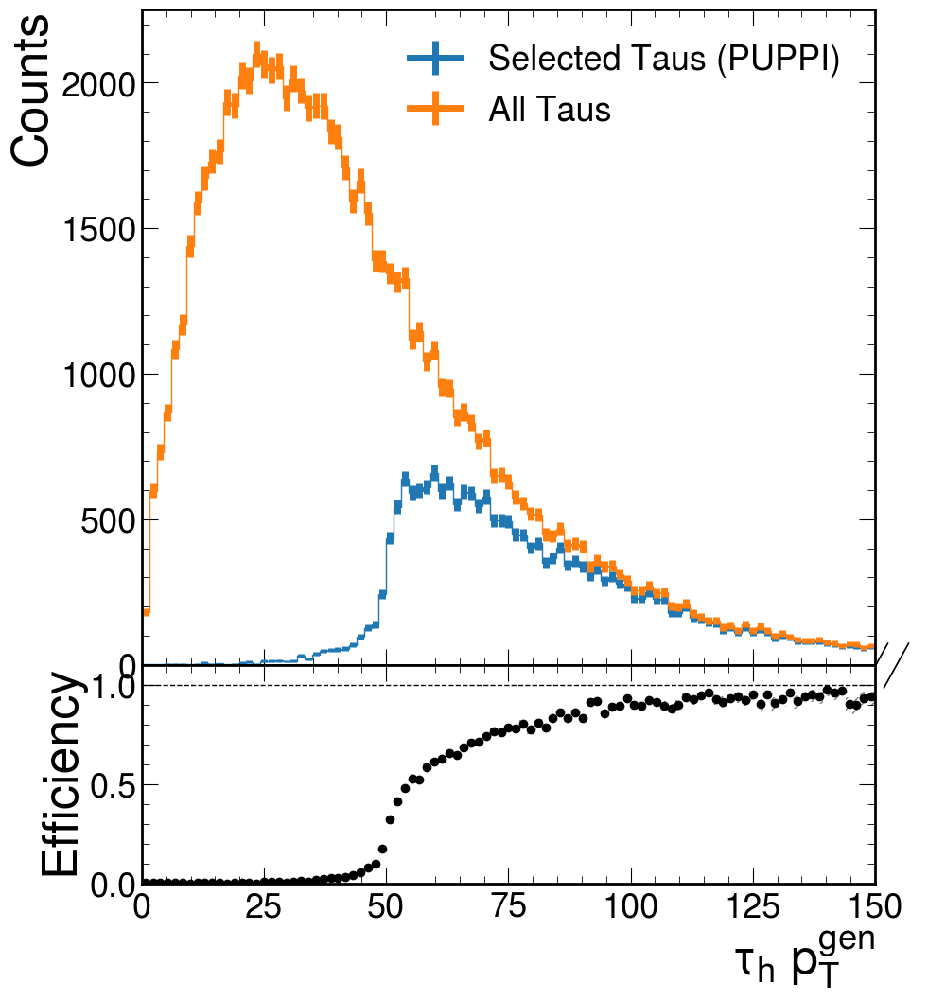

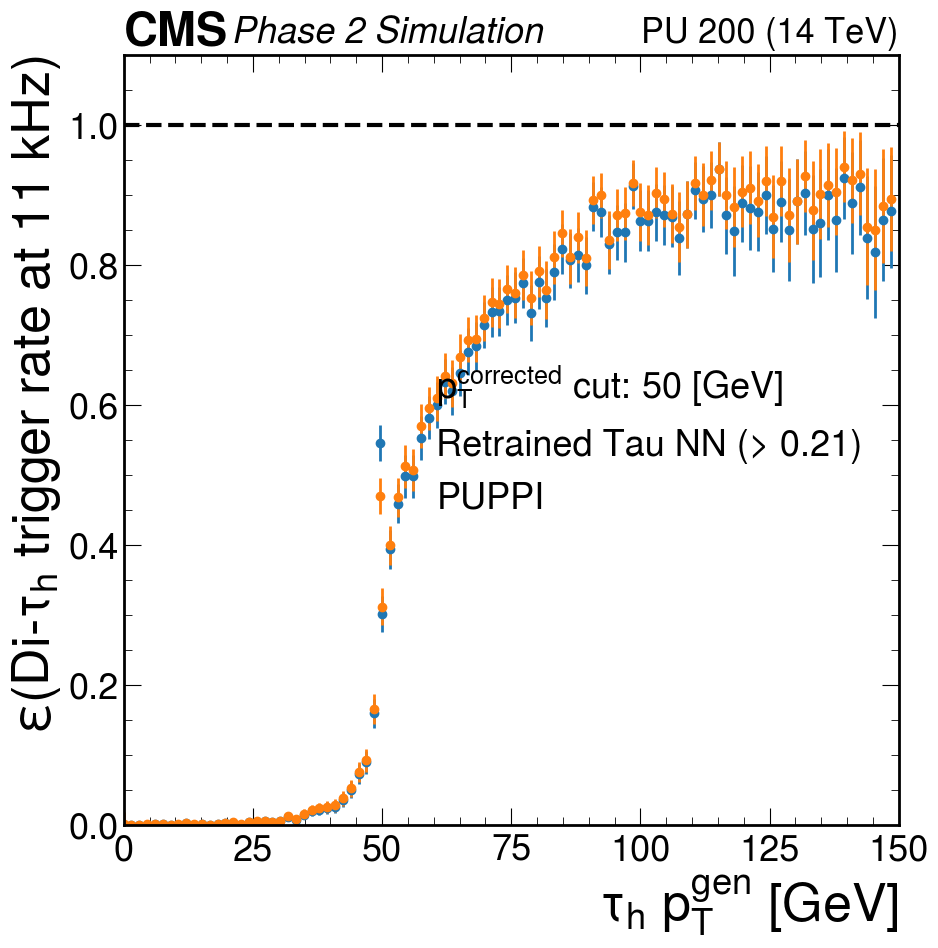

493/493 [==============================] - 1s 1ms/step


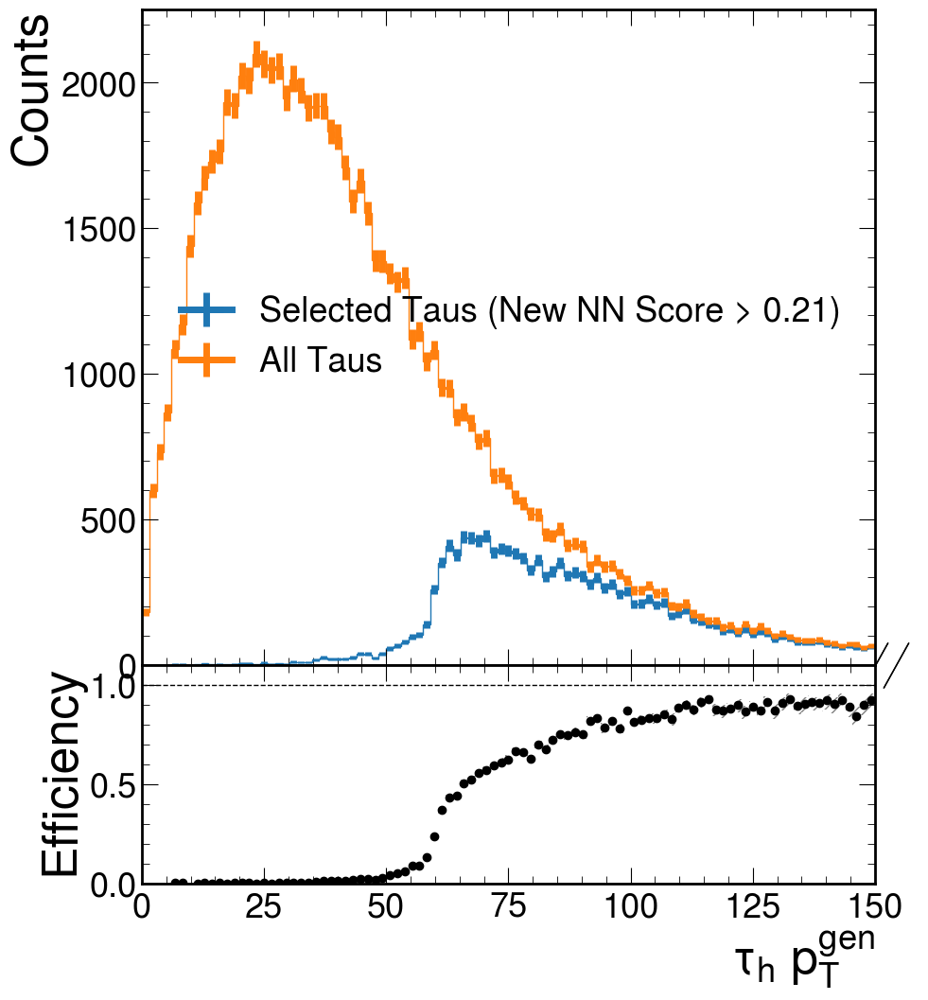

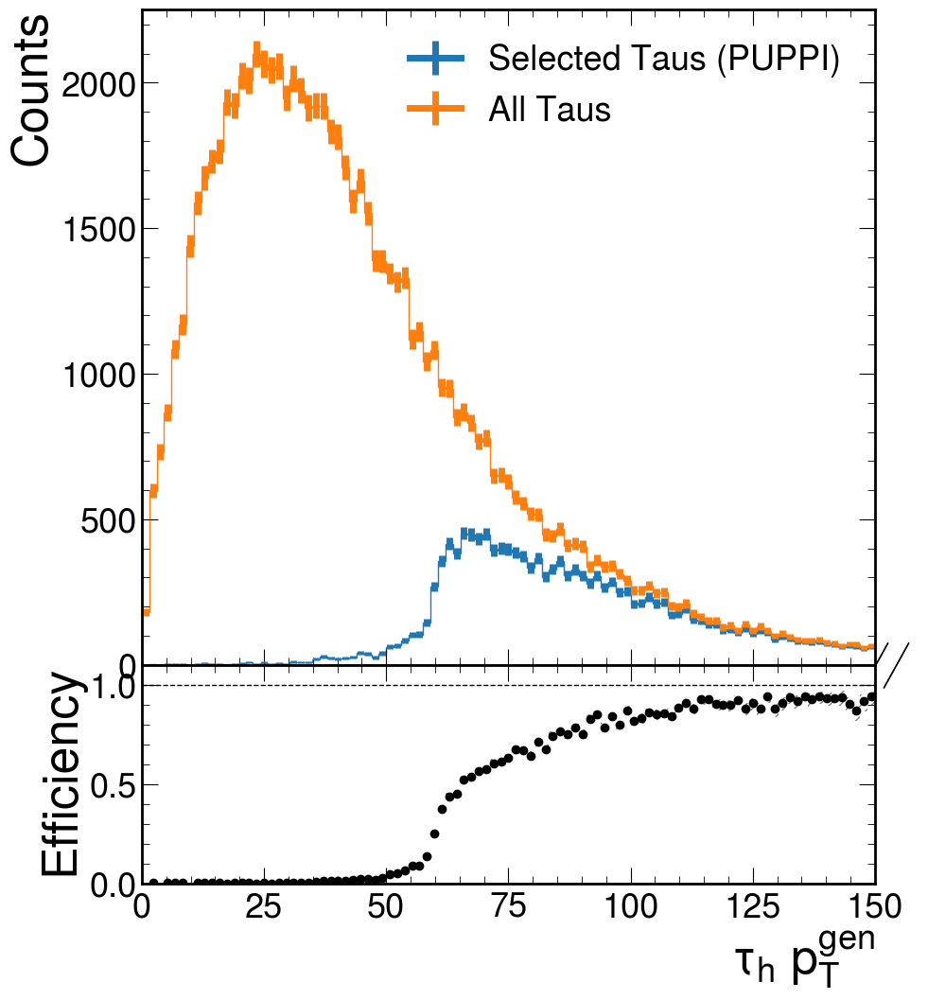

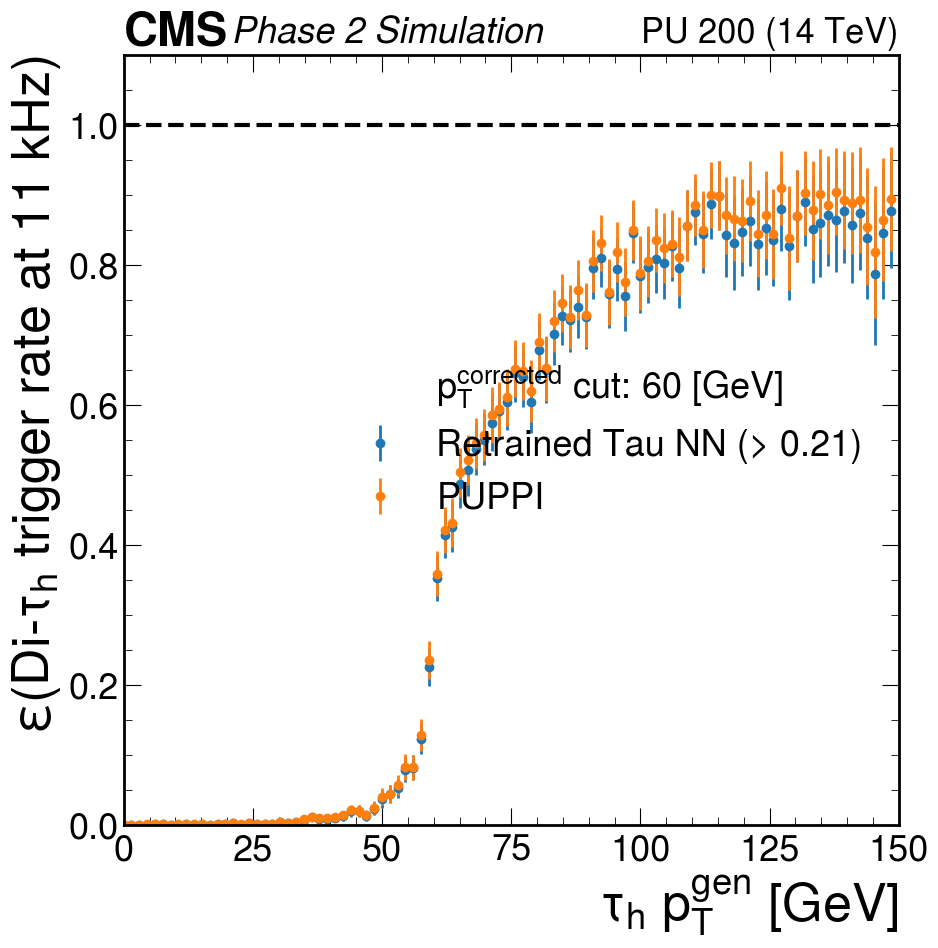

356/356 [==============================] - 0s 1ms/step


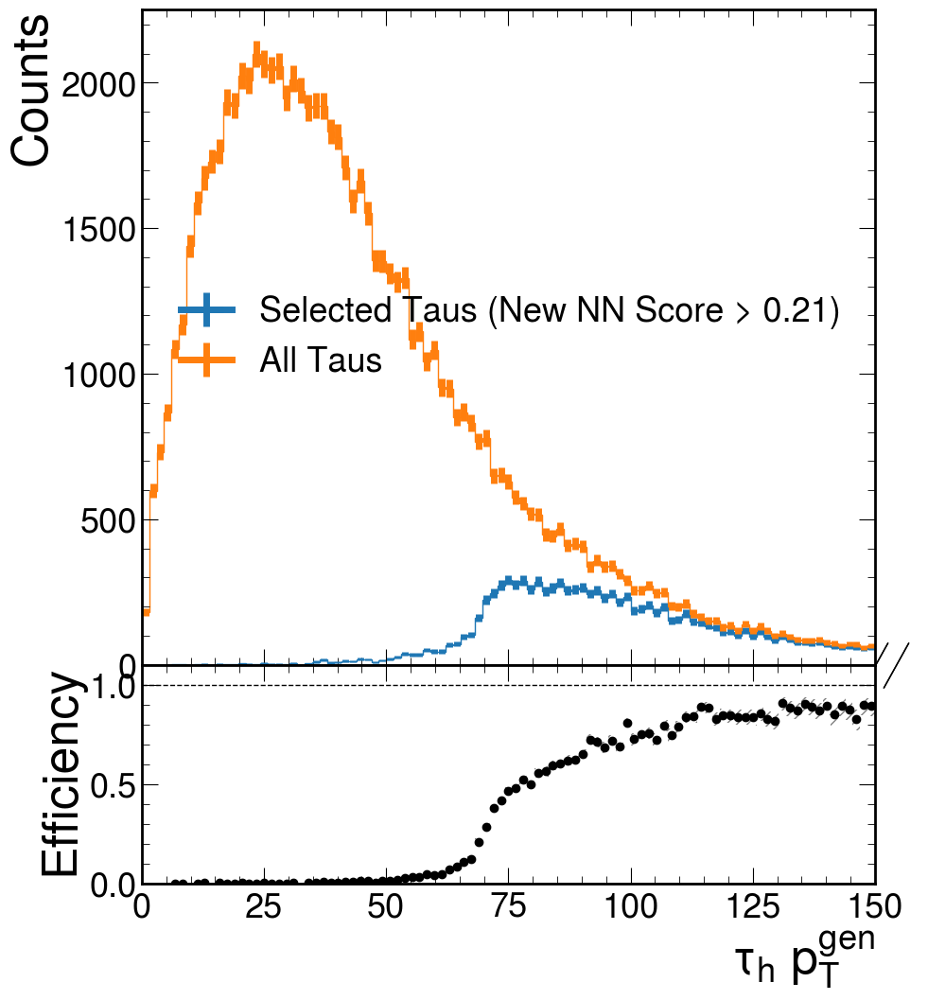

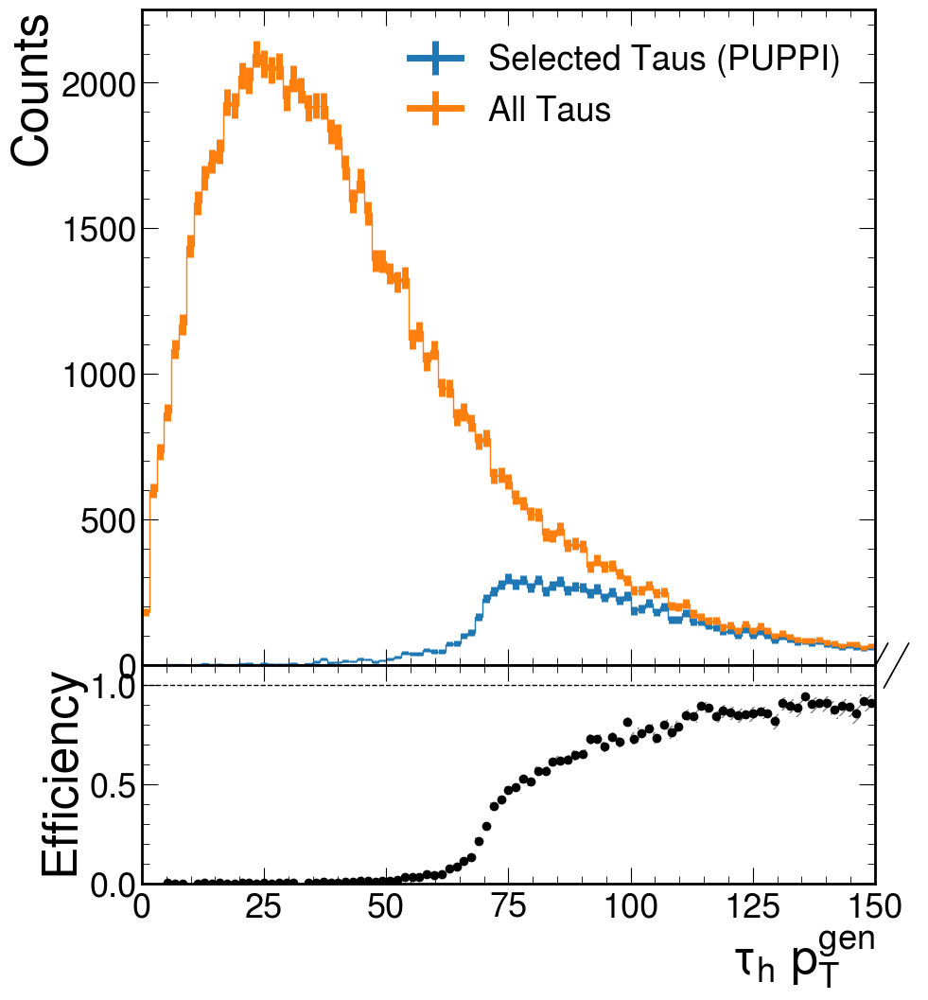

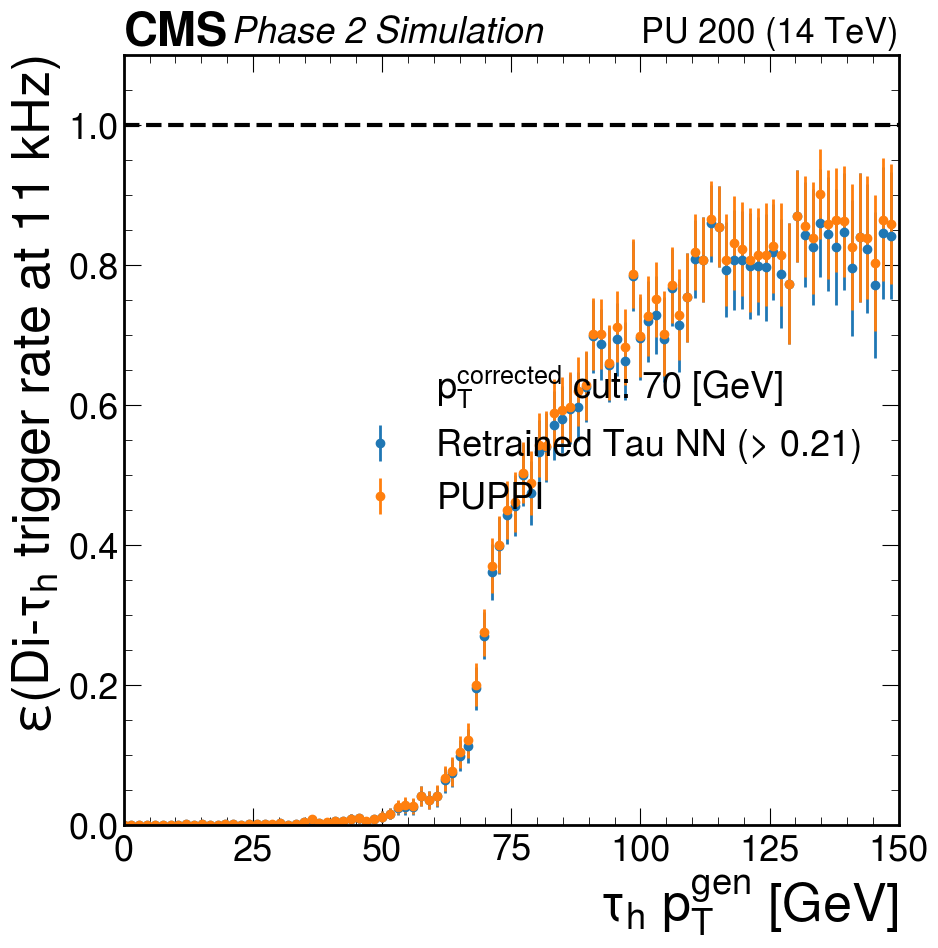

258/258 [==============================] - 0s 1ms/step


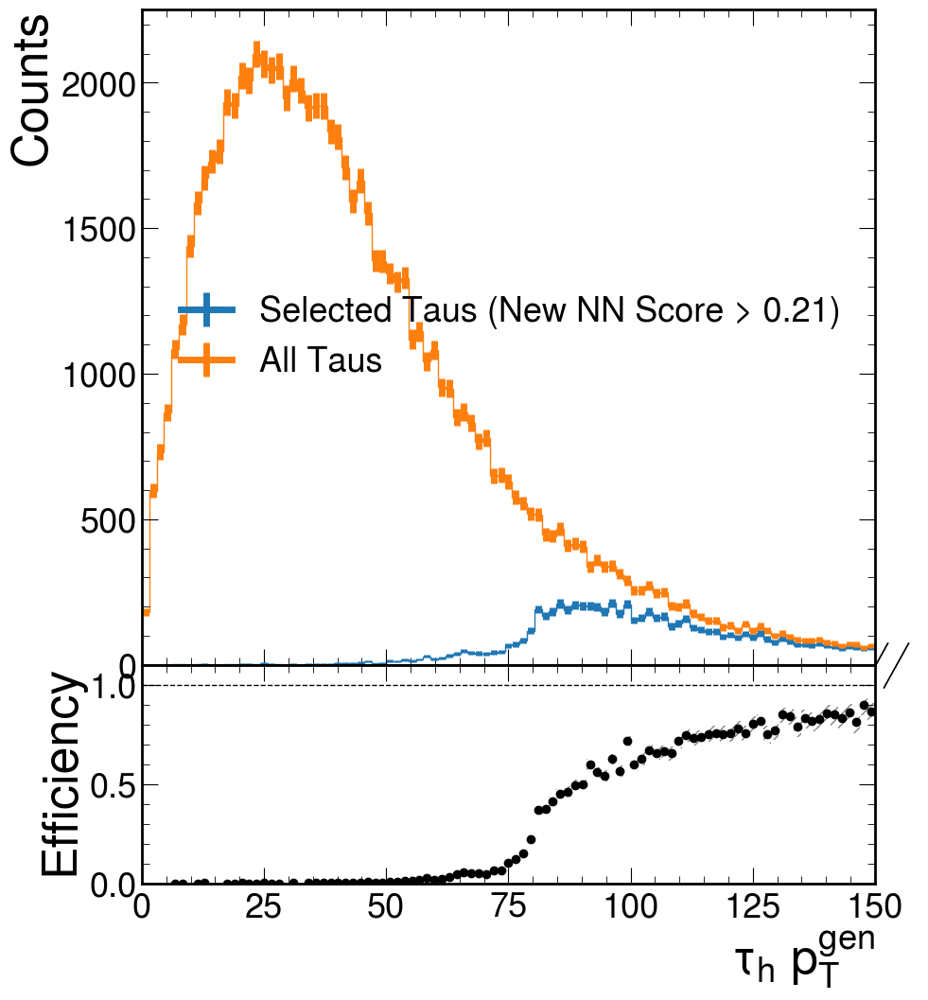

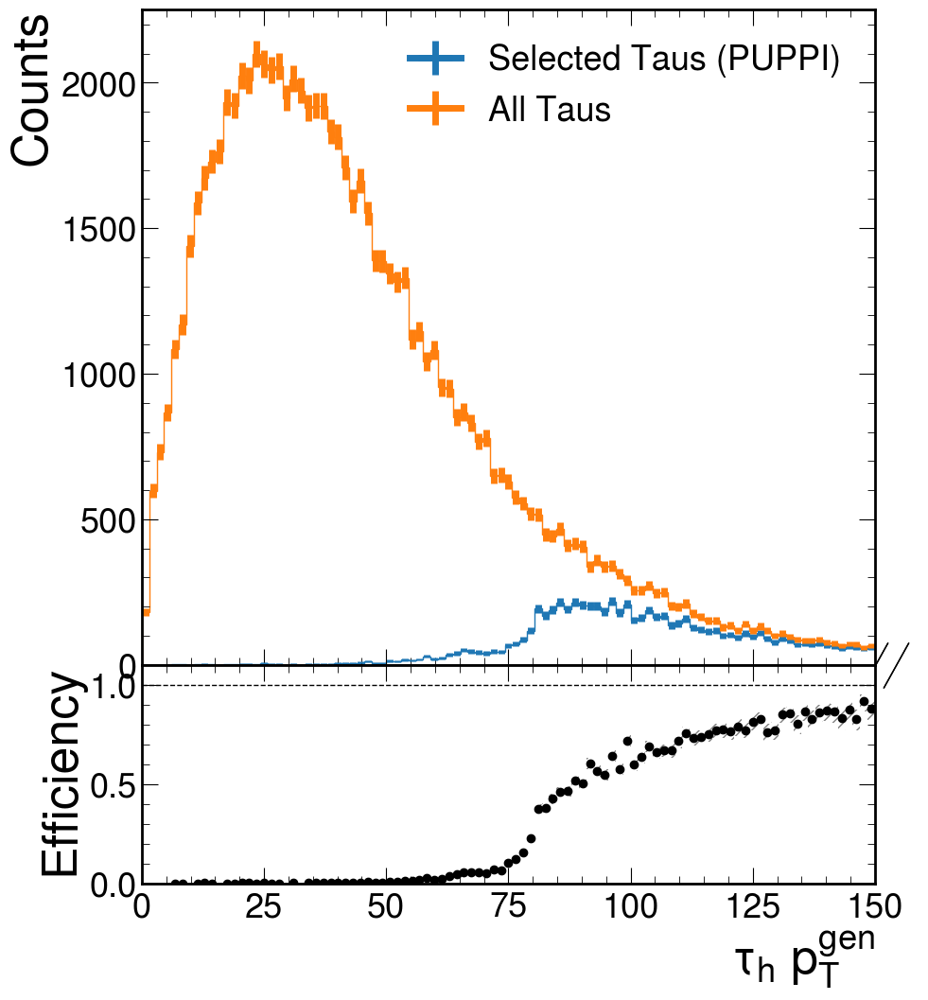

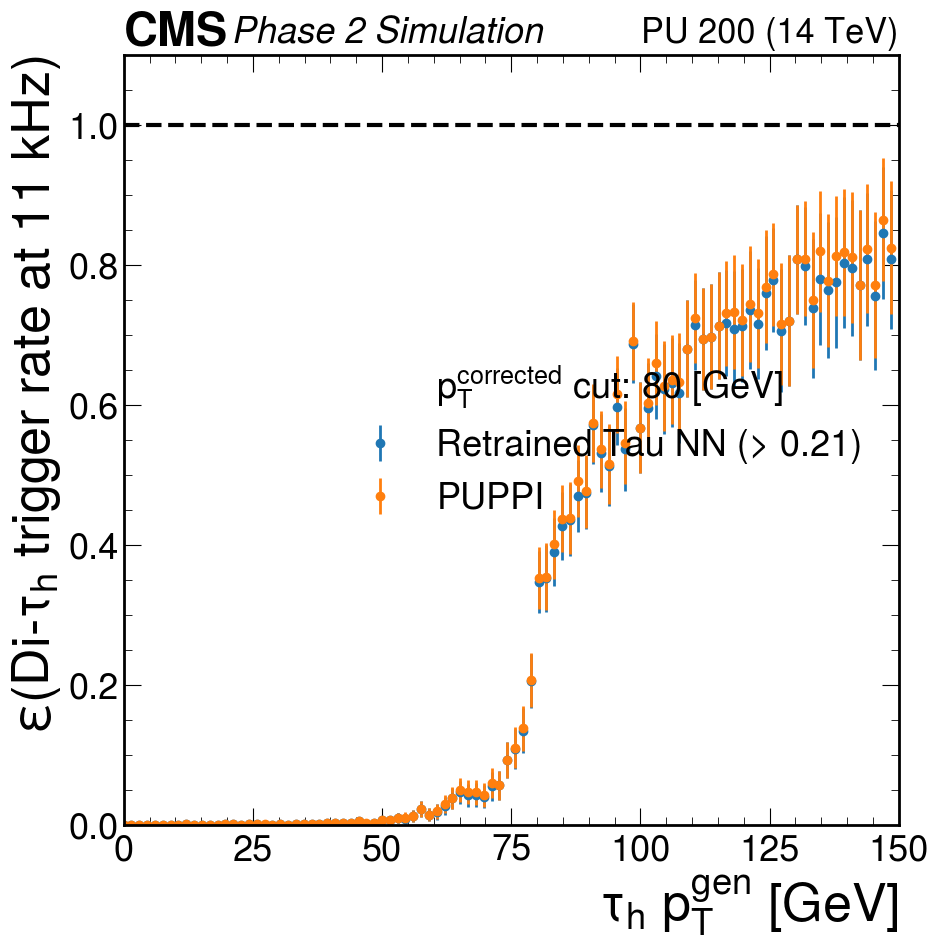

1905/1905 [==============================] - 2s 1ms/step


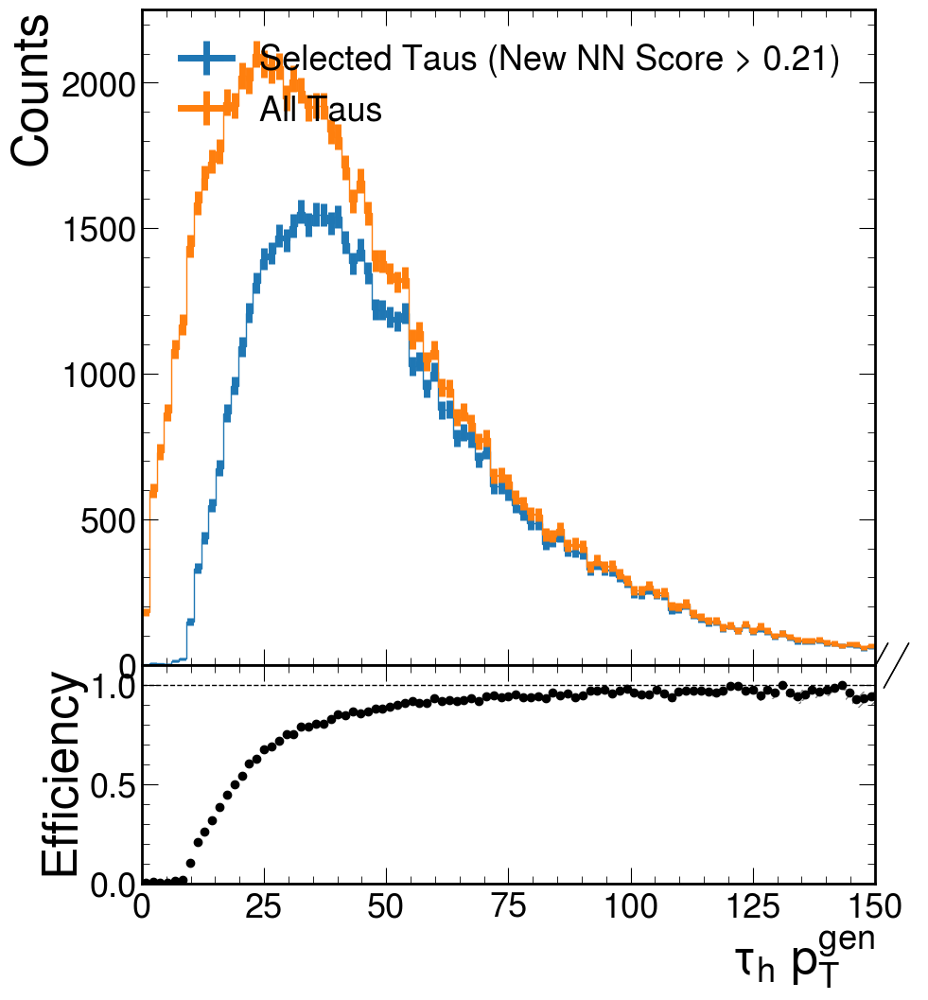

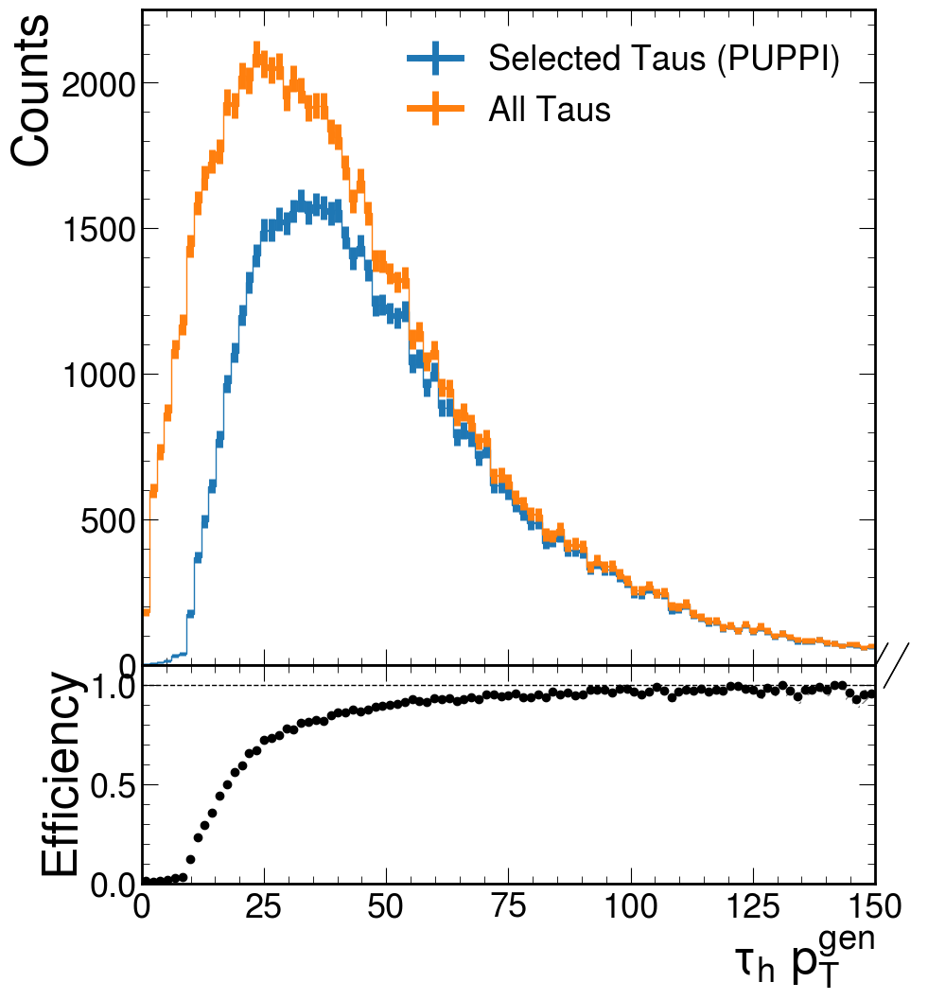

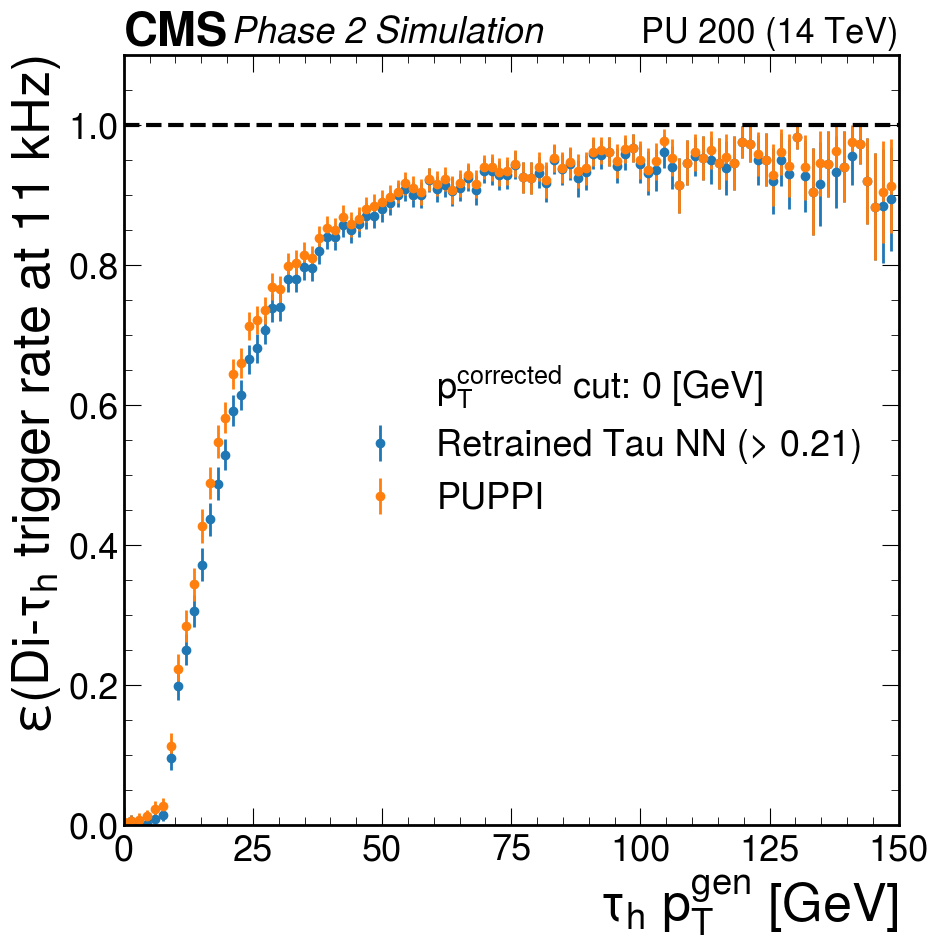

1840/1840 [==============================] - 2s 1ms/step


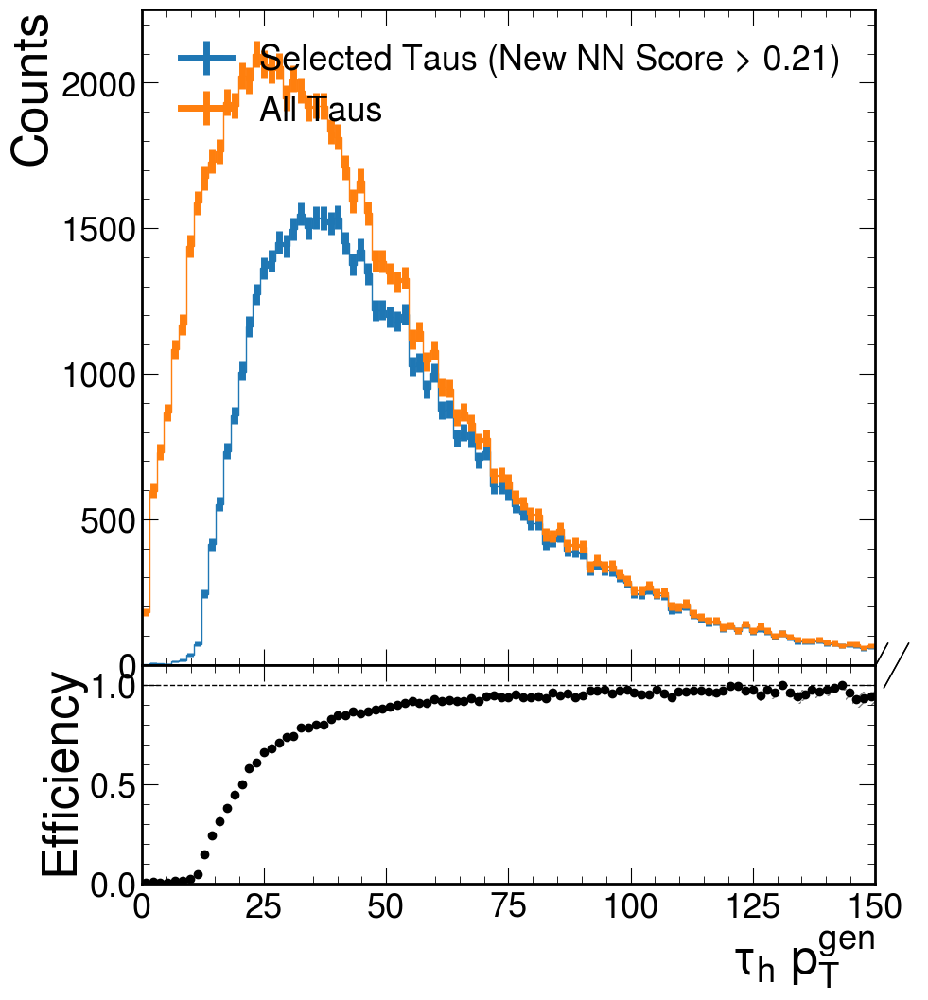

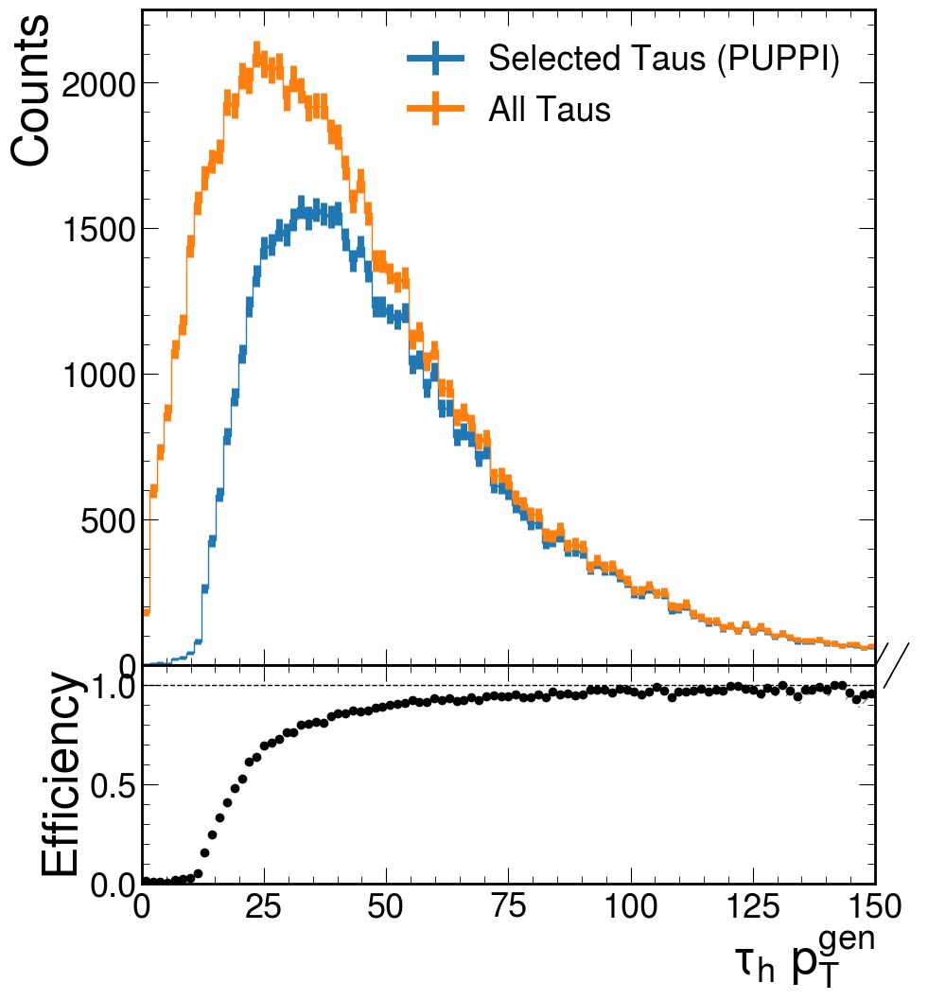

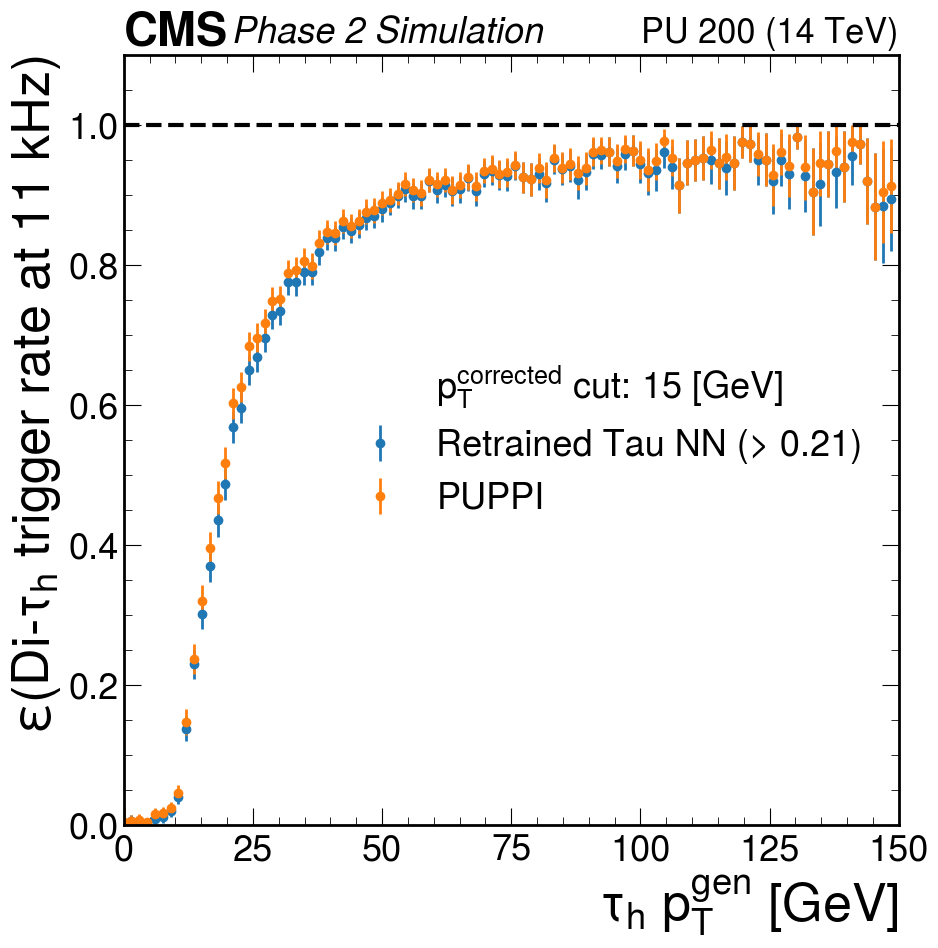

[1.         1.         1.         1.         0.90921031 0.73167571
 0.21231083 0.20179339 0.5491467  0.74956089 0.81229731 0.84642946
 0.89224021 0.92053678 0.96024375 0.9703626  0.97724017 0.98188345
 0.9847091  0.98661877 0.99183677 0.9947194  0.99319551 0.99201916
 0.99267477 0.99864041 0.99865755 0.99786083 0.99624045 0.99927391
 0.99845705 0.99744156 1.         1.         1.         0.99826413
 0.99897214 0.99797983 0.99777845 0.99894572 0.99878944 1.
 1.         0.99734011 1.         0.99848594 0.99560644 1.
 1.         0.99816386 0.99799364 1.         0.99775826 0.99774732
 1.         1.         1.         0.99714754 0.99717836 1.
 1.         1.         1.         1.         1.         0.99579297
 1.         1.         1.         1.         1.         1.
 1.         0.9941563  1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.    

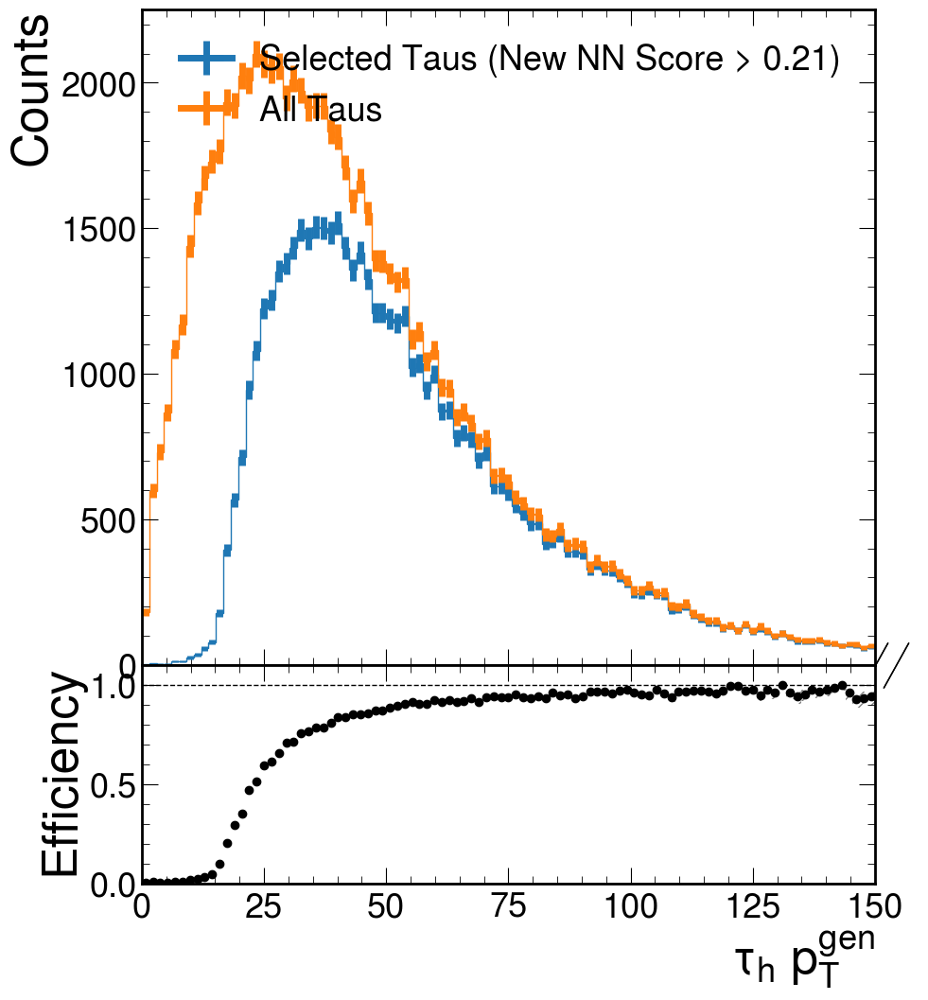

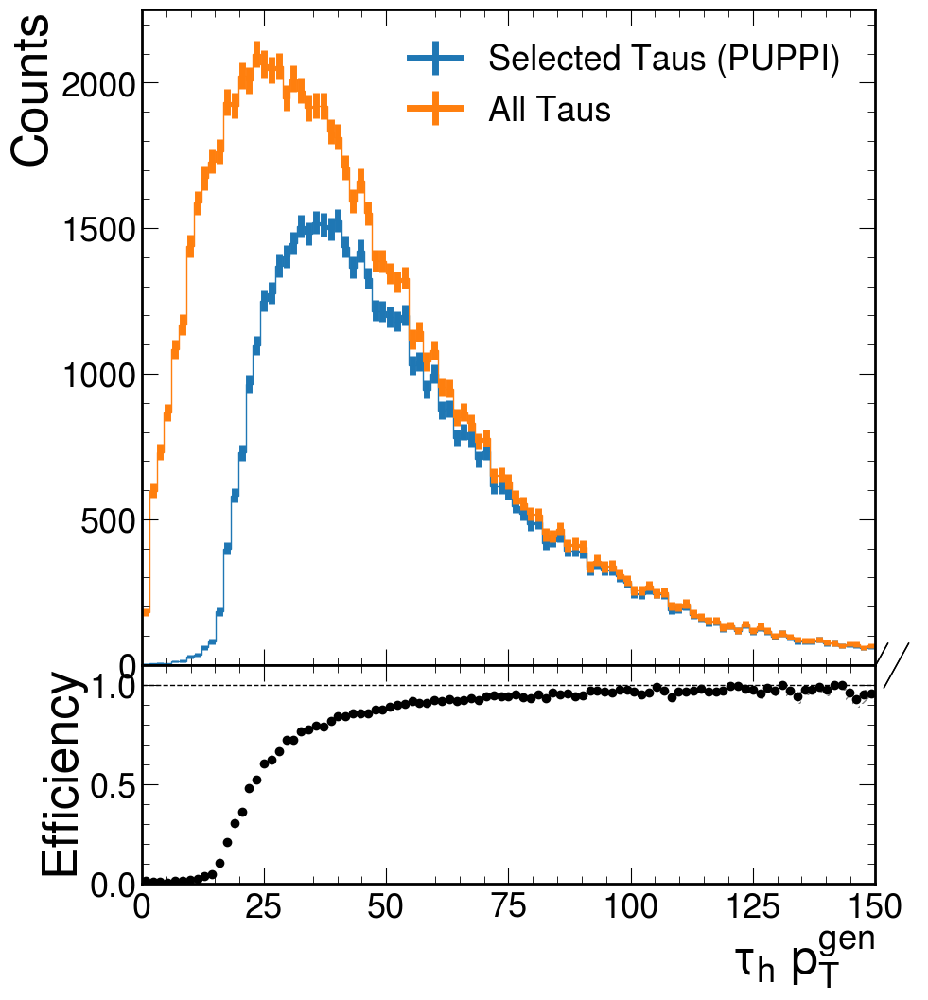

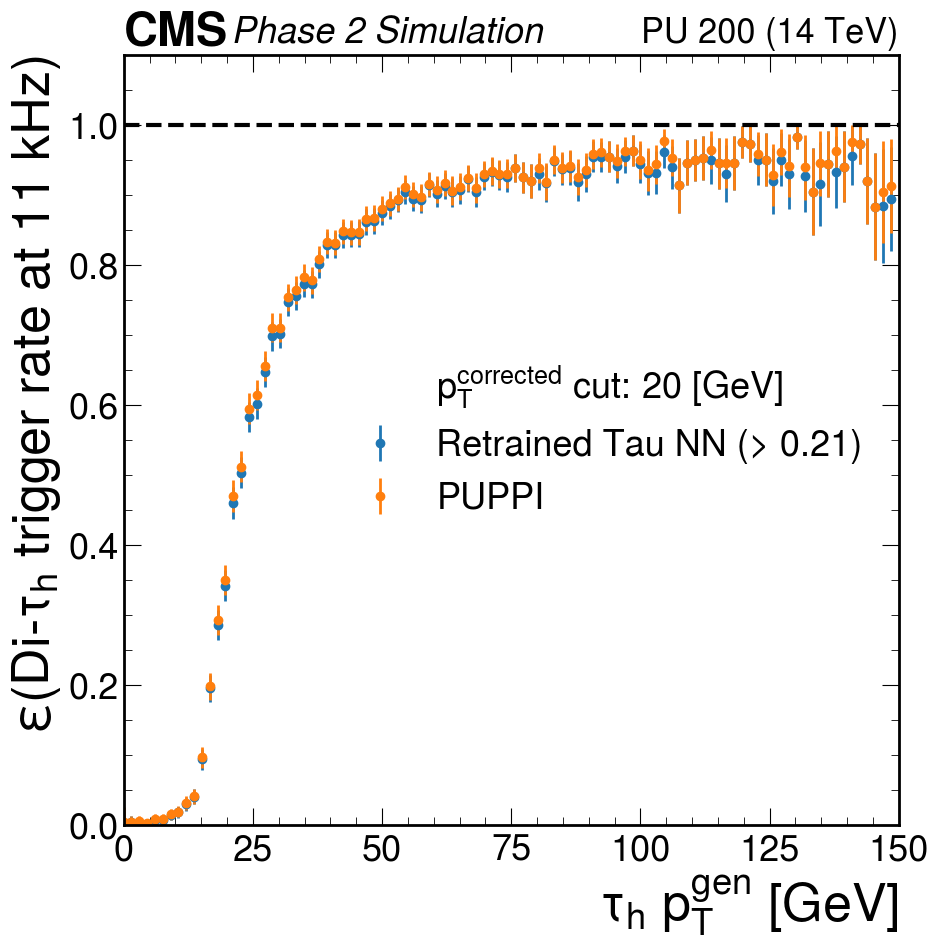

[1.         0.73415643 0.65544255 0.51784426 0.81909653 0.46979769
 0.14605435 0.08948297 0.11640536 0.13125059 0.2522317  0.44629908
 0.58435938 0.64592393 0.77639533 0.81943585 0.87612864 0.88353045
 0.91462706 0.9444175  0.94835219 0.95780122 0.96804336 0.97075778
 0.97072062 0.97690759 0.98591321 0.98645978 0.98272035 0.99274176
 0.98381396 0.9897722  0.99146089 0.9947579  0.99468537 0.99219397
 0.99486377 0.99394253 0.99223018 0.99262841 0.99274341 0.99757999
 0.99863701 0.99601106 0.99861972 0.99697268 0.99122321 0.99822961
 1.         0.99632962 0.99599053 1.         0.99551935 0.99774732
 1.         0.99736262 1.         0.99430305 0.99436167 0.99711405
 0.99647239 0.99669413 0.99292491 1.         0.99615597 0.99579297
 1.         1.         0.99558824 1.         1.         1.
 1.         0.9941563  1.         1.         1.         0.99182001
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.     

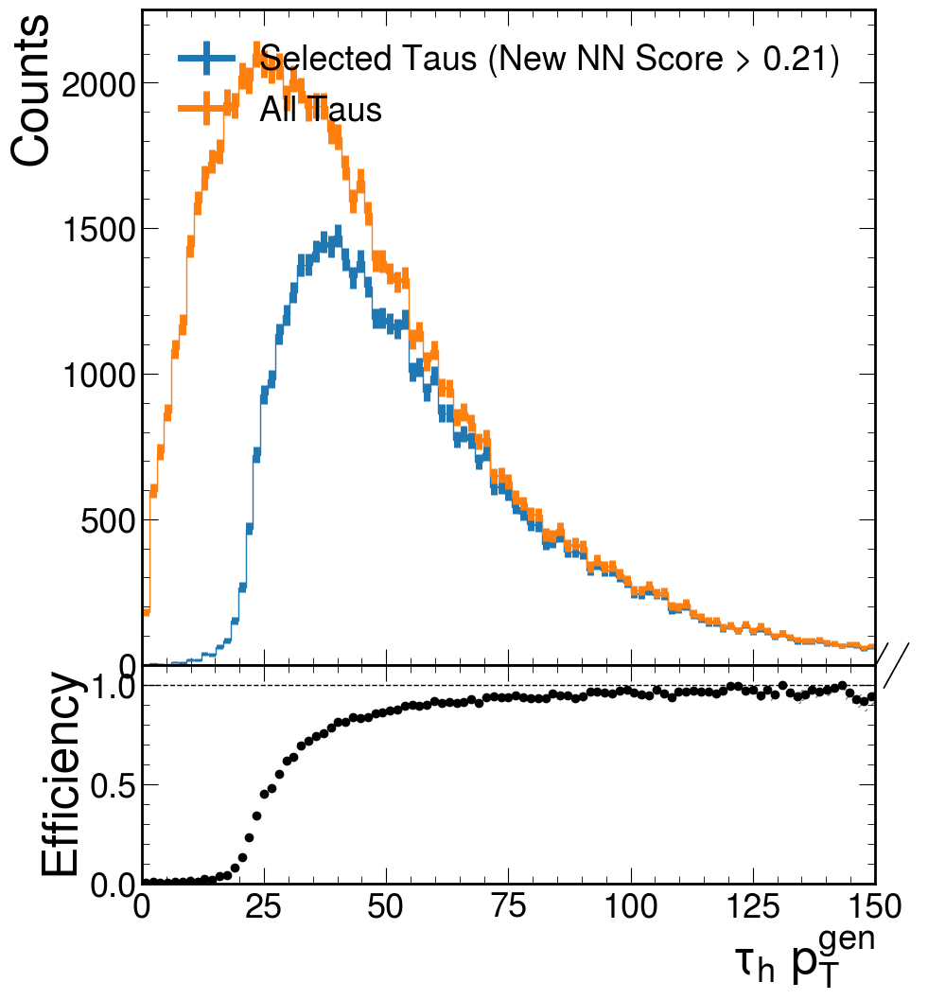

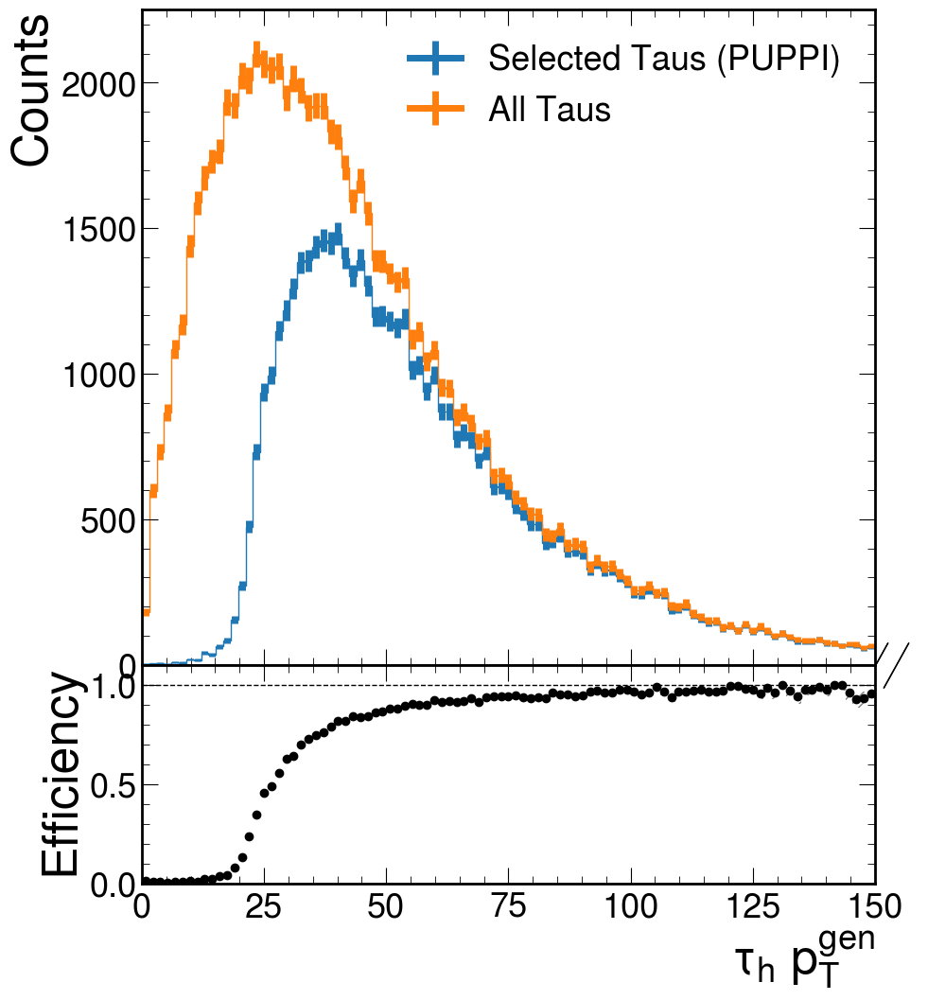

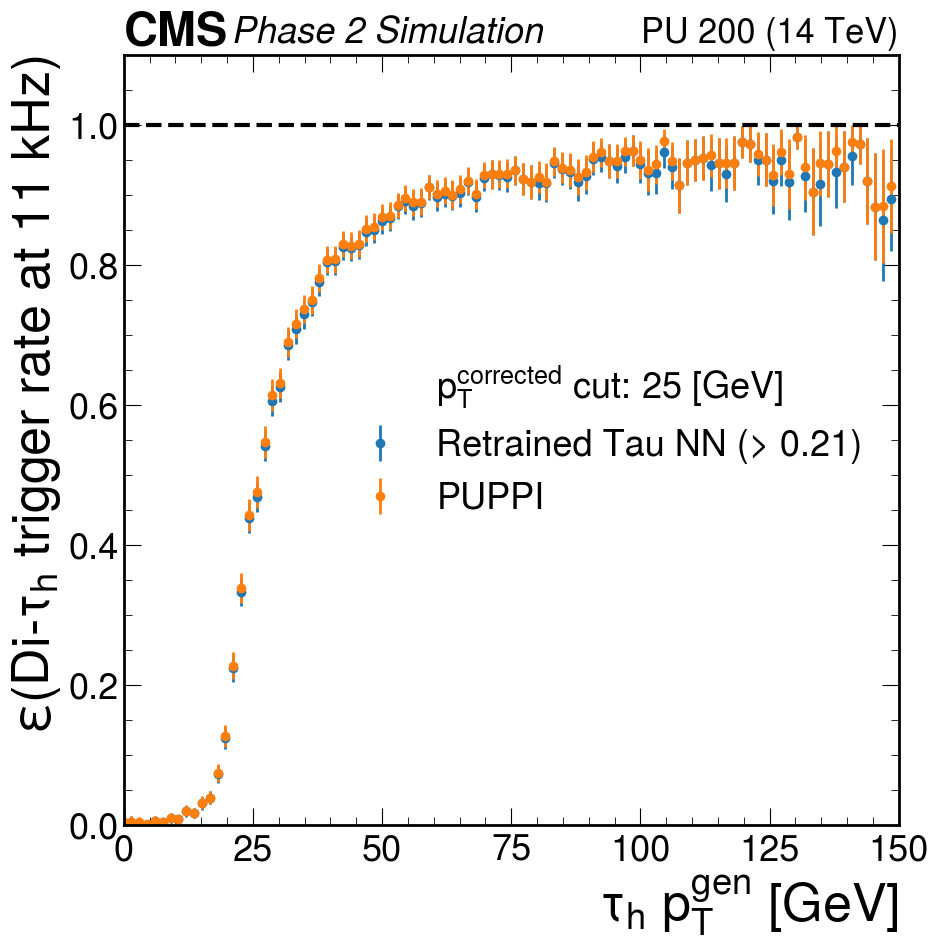

[1.         0.73415643 0.65544255 0.12628835 0.55391457 0.26830762
 0.0941474  0.0381922  0.07638184 0.05344469 0.08280387 0.08901486
 0.14872018 0.23518396 0.37829001 0.54254812 0.65956421 0.68845984
 0.76601277 0.82035421 0.84539306 0.87892946 0.9076844  0.91573814
 0.93884046 0.94572891 0.9571253  0.95943104 0.96322752 0.97100087
 0.96458456 0.97360866 0.97696869 0.98080123 0.97612502 0.98180615
 0.98051973 0.98185321 0.98668948 0.98842436 0.98670805 0.98550882
 0.99319085 0.99202736 0.99448388 0.98941761 0.98976428 0.9946946
 1.         0.99632962 0.99199345 0.99790575 0.99328316 0.98429697
 1.         0.9947331  1.         0.98863584 0.99436167 0.99423437
 0.99296522 0.99669413 0.98593212 1.         0.99615597 0.99579297
 1.         1.         0.99558824 1.         1.         1.
 1.         0.9941563  1.         0.99235507 1.         0.99182001
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 1.         1.         1.         1.
 1.         1.      

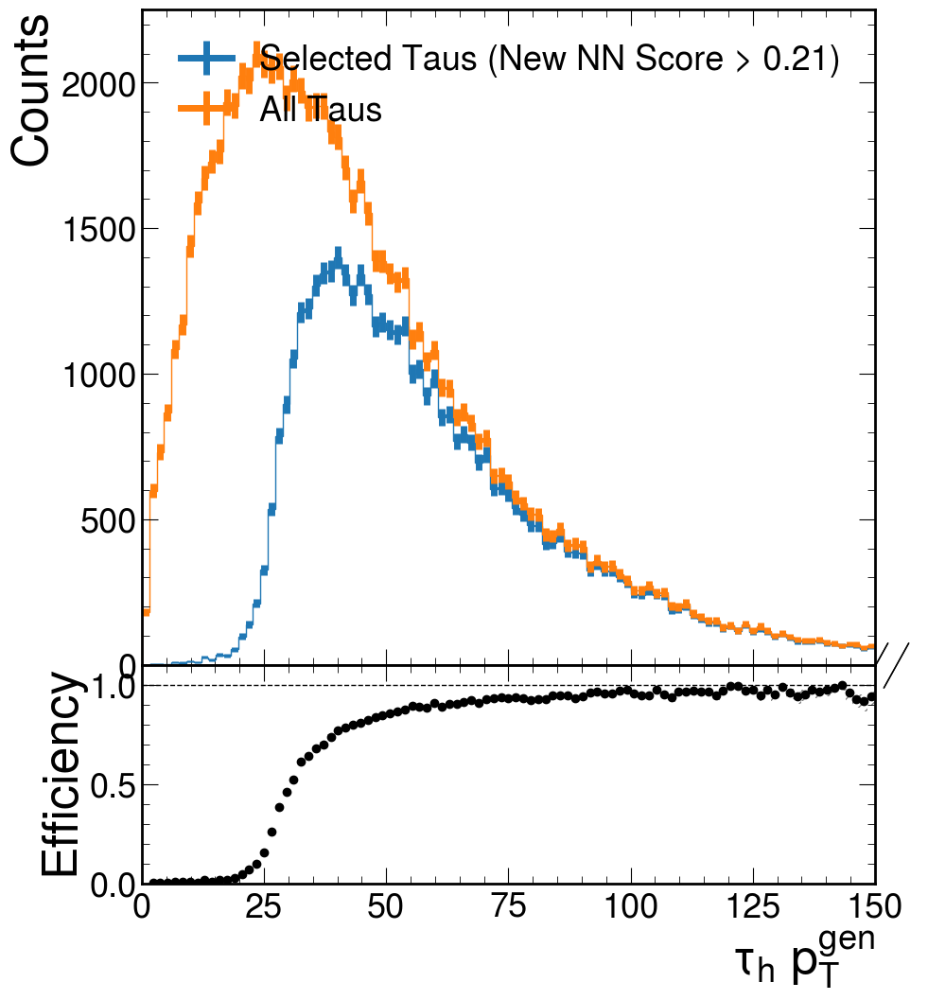

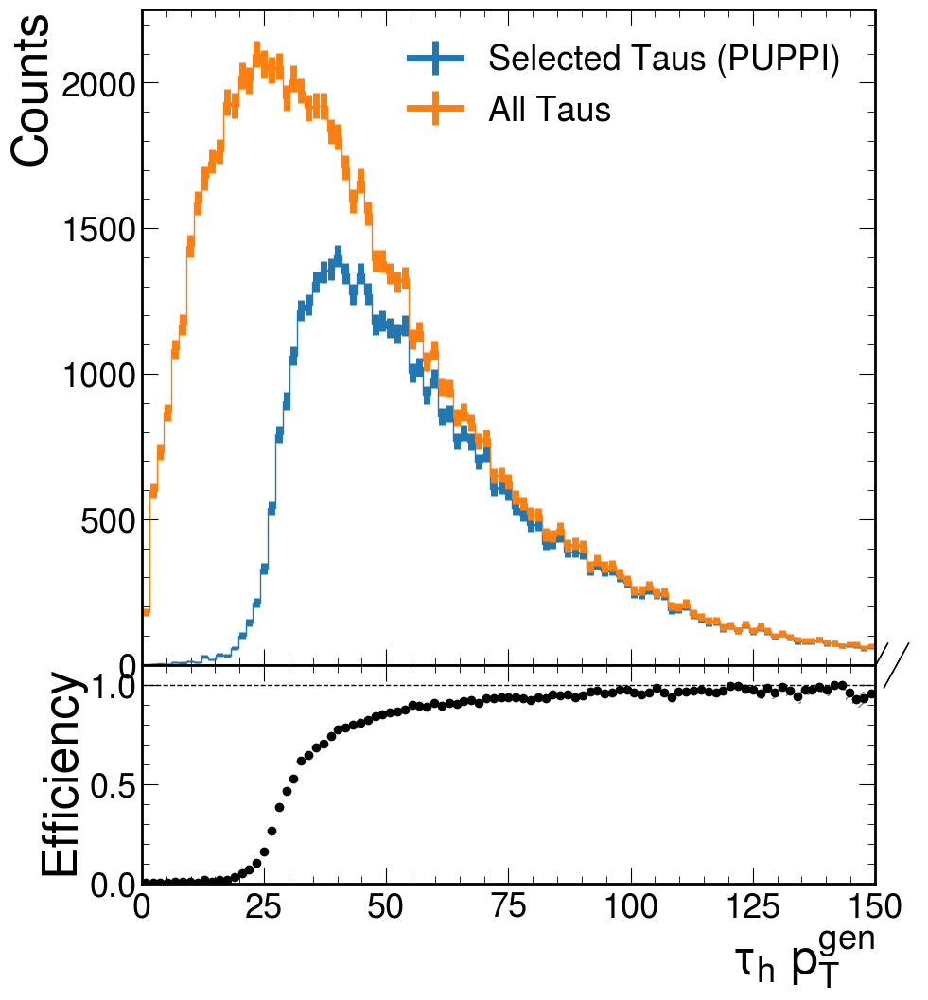

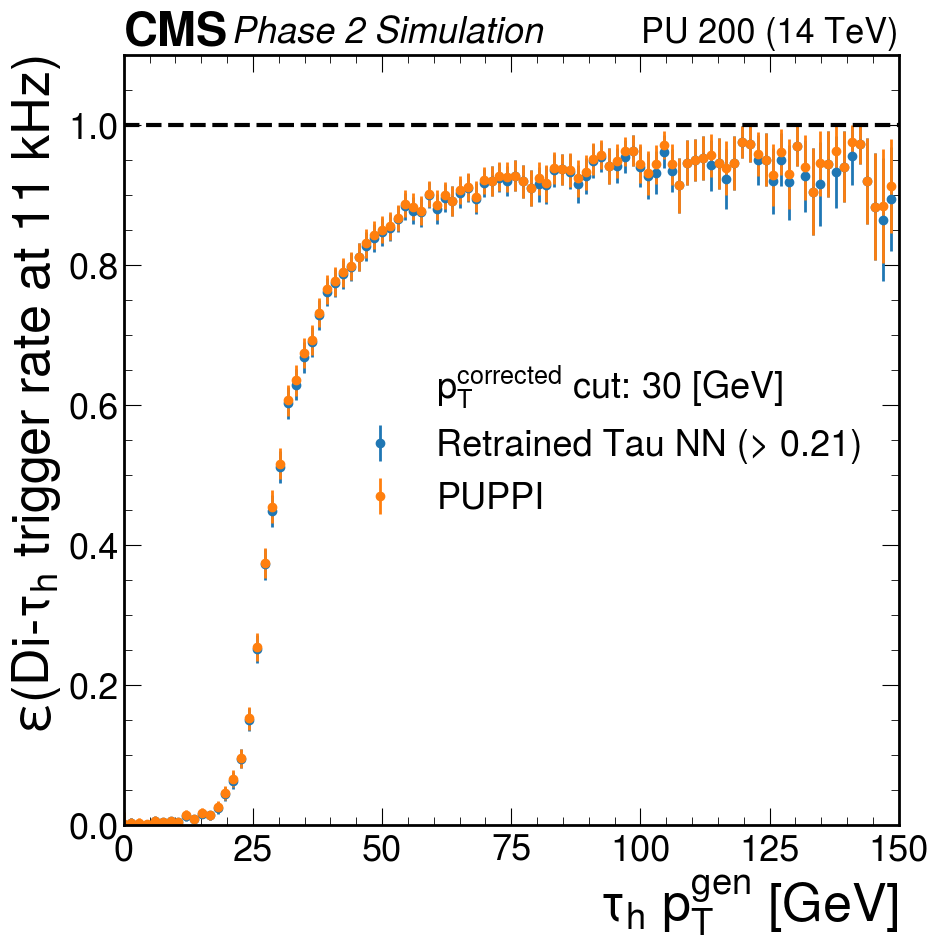

[0.         0.48117675 0.3394046  0.12628835 0.55391457 0.26830762
 0.05635377 0.01920232 0.05016682 0.02447141 0.04309558 0.03133326
 0.04897201 0.08253281 0.10671168 0.15303309 0.22541827 0.36932469
 0.52626394 0.60716179 0.69099958 0.77288362 0.80566677 0.83844539
 0.86731042 0.88895627 0.90640197 0.92183311 0.91763729 0.93775164
 0.9446265  0.94984868 0.96335434 0.9625272  0.96026079 0.96195247
 0.9723452  0.97481545 0.97231587 0.97689091 0.96865844 0.97828703
 0.98503784 0.99070057 0.98486048 0.98640058 0.98103131 0.98413123
 0.99646805 0.99083759 0.98403222 0.99372445 0.98436364 0.98206505
 0.99737341 0.98428326 1.         0.98863584 0.99154969 0.99423437
 0.98947621 0.99669413 0.97900471 1.         0.99615597 0.99579297
 0.99528635 0.99529509 0.99558824 1.         0.99519305 1.
 1.         0.9941563  1.         0.99235507 1.         0.98372892
 1.         1.         1.         1.         1.         1.
 1.         0.98718575 0.98631808 1.         1.         1.
 1.         1.     

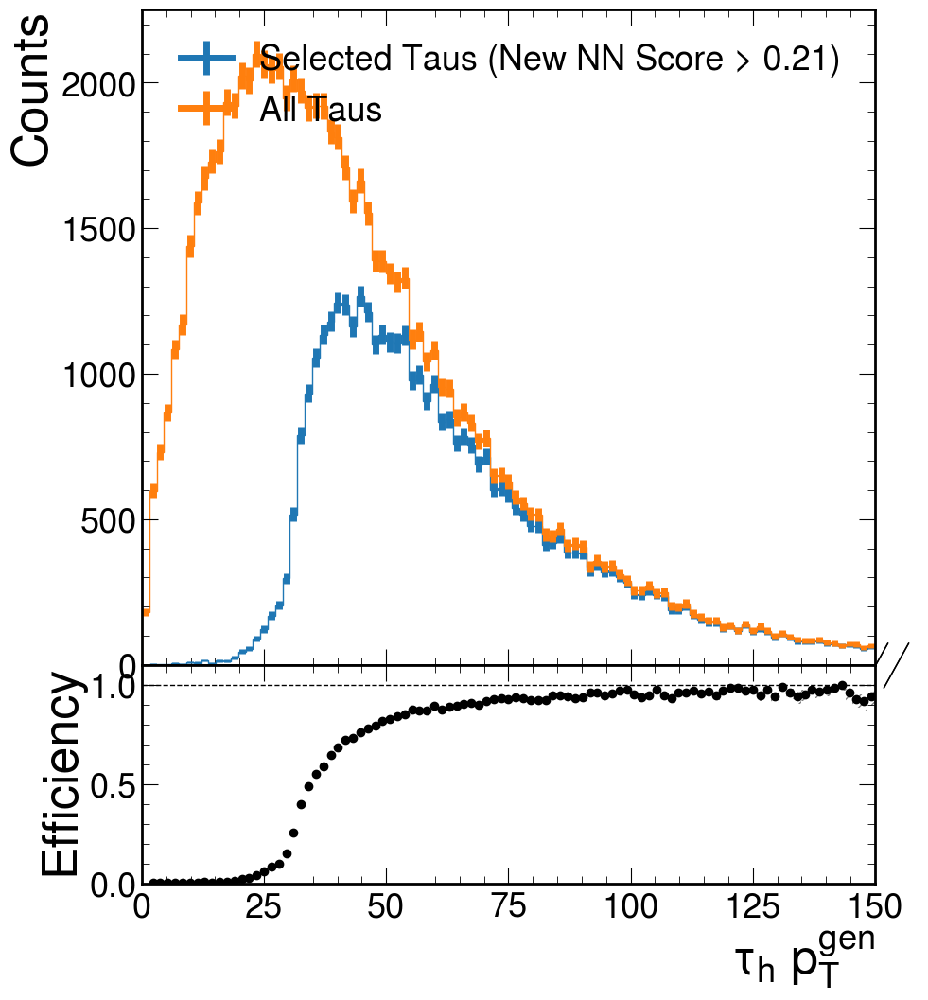

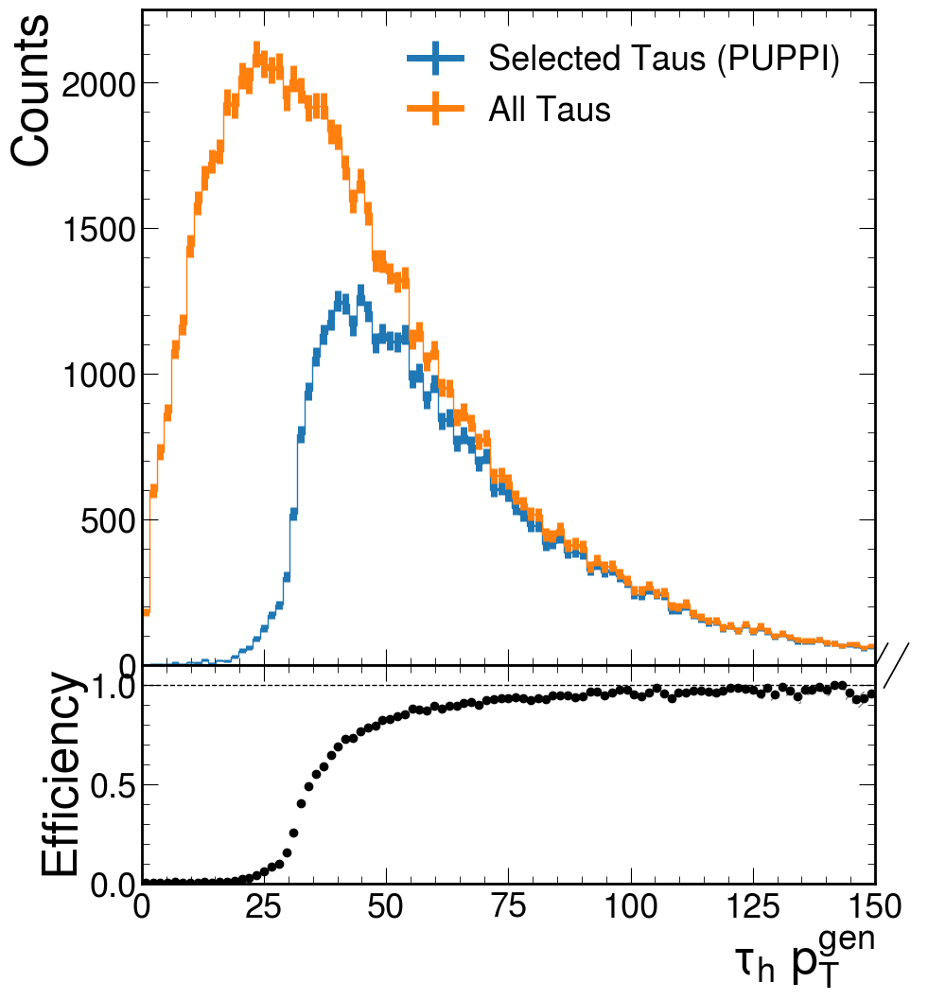

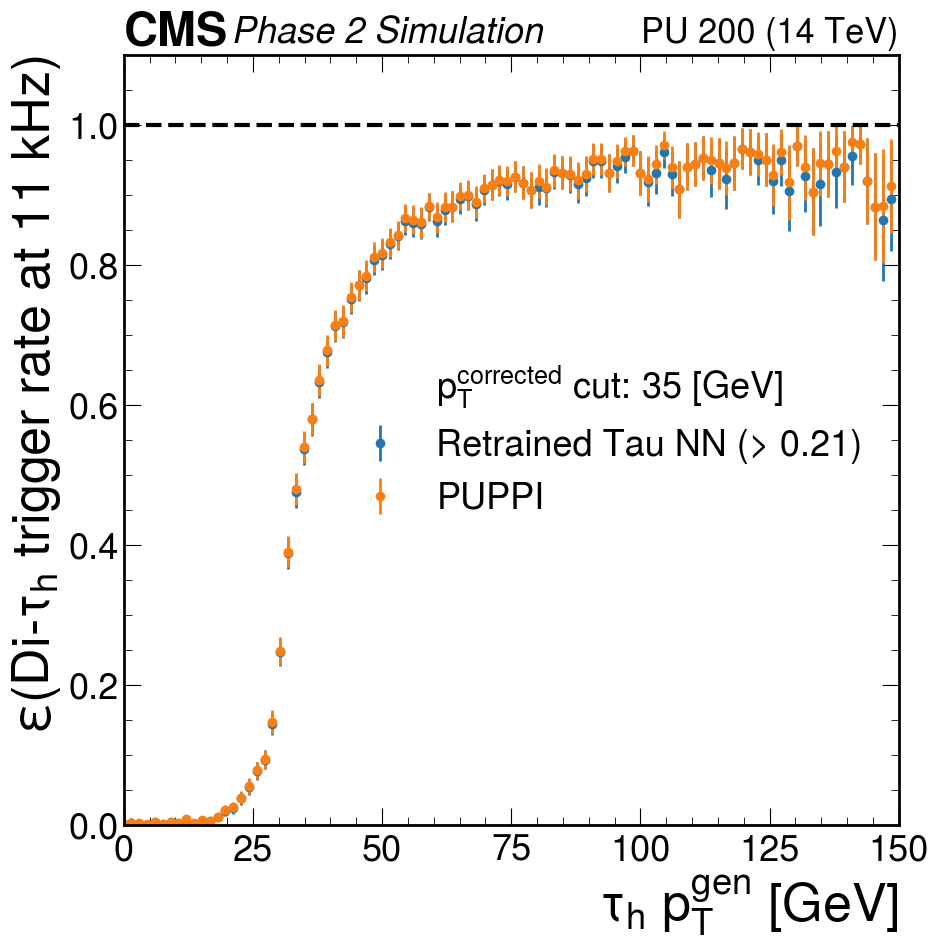

[0.         0.48117675 0.08276753 0.12628835 0.38321787 0.08299286
 0.03811145 0.01400739 0.02675962 0.00537766 0.01573764 0.01121108
 0.02143489 0.03672624 0.04018845 0.0619045  0.08107865 0.11246154
 0.13102424 0.1955278  0.33415065 0.49792583 0.60953209 0.67478857
 0.72756383 0.77189445 0.80344256 0.84833355 0.83805074 0.88516578
 0.89794002 0.8974465  0.92687087 0.92610538 0.93389776 0.93529122
 0.94993539 0.95575979 0.95358121 0.95809315 0.94948525 0.96029118
 0.97554844 0.98142771 0.97253591 0.97736525 0.9708827  0.97887033
 0.99118229 0.98536047 0.98204813 0.99163723 0.98213964 0.97760869
 0.99213106 0.98168575 0.99501139 0.98299471 0.99154969 0.9913606
 0.98947621 0.99013175 0.96871157 1.         0.99615597 0.99579297
 0.98593954 0.98594472 0.99558824 1.         0.99041157 0.99396722
 0.99378425 0.98837452 1.         0.98480971 1.         0.98372892
 1.         0.98997051 0.98850626 1.         1.         1.
 1.         0.97458786 0.98631808 1.         1.         1.
 1.         

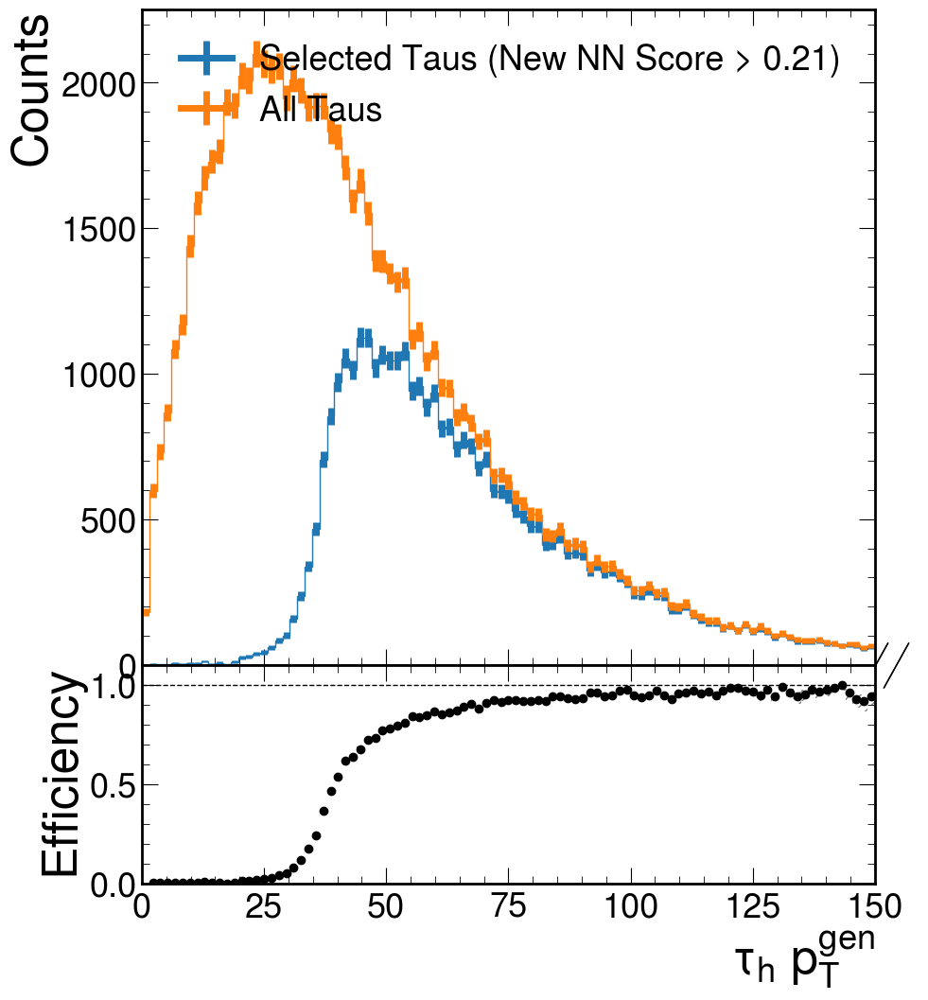

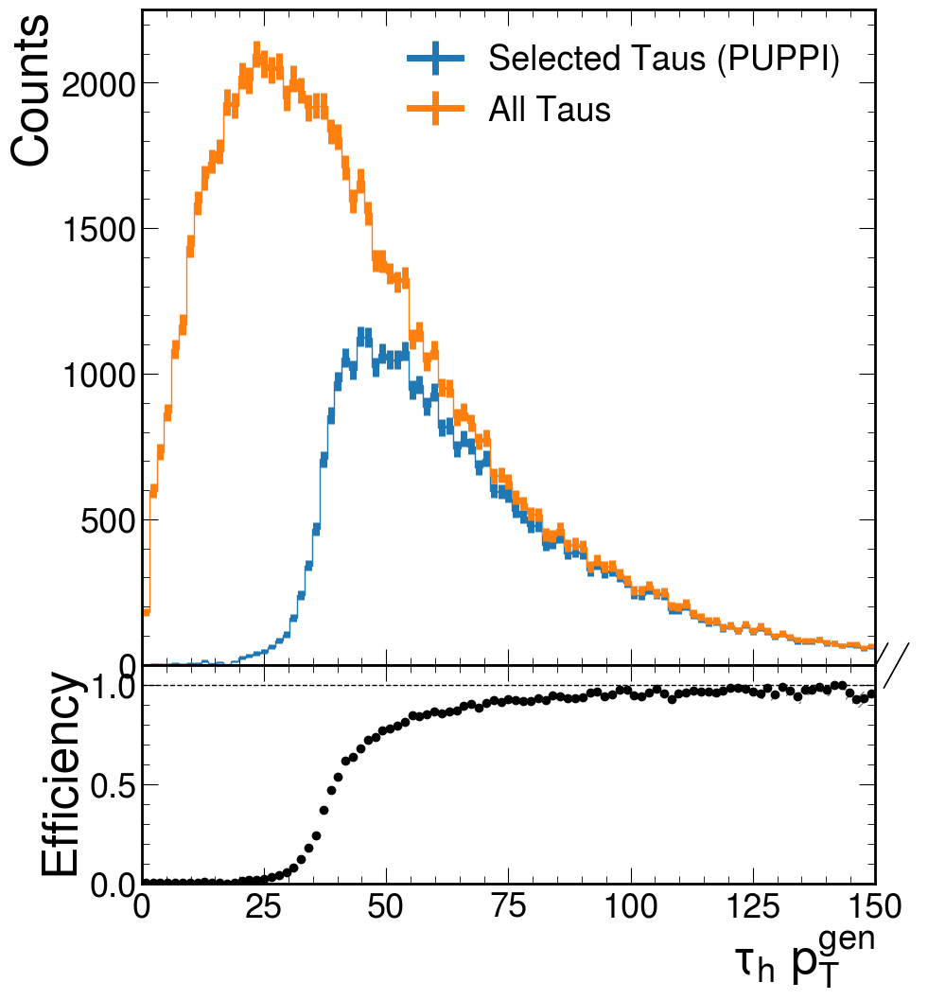

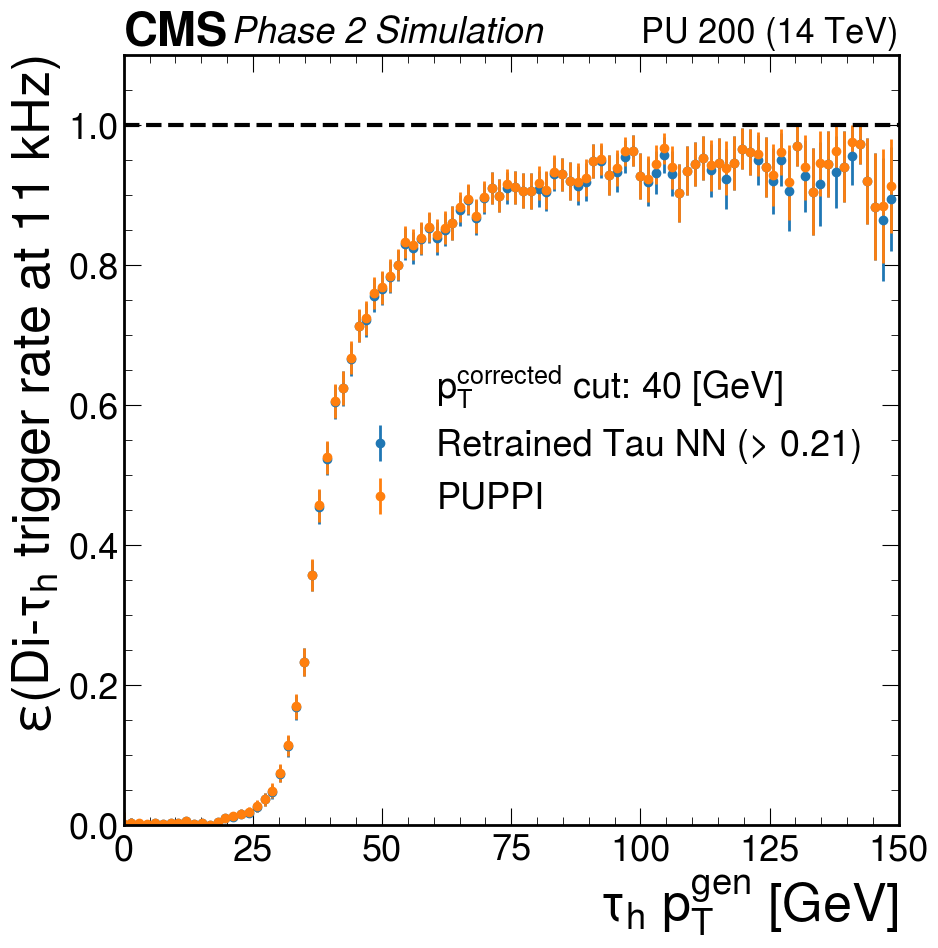

[0.00000000e+00 4.81176746e-01 8.27675299e-02 1.26288353e-01
 3.00642417e-01 8.29928561e-02 2.63680368e-02 9.00300105e-03
 1.85249379e-02 2.58835321e-03 6.74675056e-03 2.04990552e-04
 7.36972052e-03 1.78999690e-02 1.91865628e-02 2.47648175e-02
 2.59410103e-02 3.76322961e-02 5.09721678e-02 6.34474386e-02
 9.86922938e-02 1.43996860e-01 2.15194763e-01 2.92364668e-01
 4.47672337e-01 5.54117755e-01 6.22653280e-01 7.19702629e-01
 7.27106932e-01 7.83370564e-01 8.30108504e-01 8.29327274e-01
 8.68588620e-01 8.70863880e-01 8.80533656e-01 8.88207090e-01
 9.13445681e-01 9.15827793e-01 9.29423667e-01 9.25892265e-01
 9.22041300e-01 9.29261180e-01 9.49895875e-01 9.64267495e-01
 9.65709460e-01 9.56364262e-01 9.57888081e-01 9.73621722e-01
 9.68419227e-01 9.79896937e-01 9.66251537e-01 9.79157270e-01
 9.79917833e-01 9.75384079e-01 9.86902196e-01 9.79093525e-01
 9.92524015e-01 9.74575662e-01 9.88742206e-01 9.85629547e-01
 9.89476212e-01 9.90131751e-01 9.65302563e-01 9.89583829e-01
 9.96155967e-01 9.957929

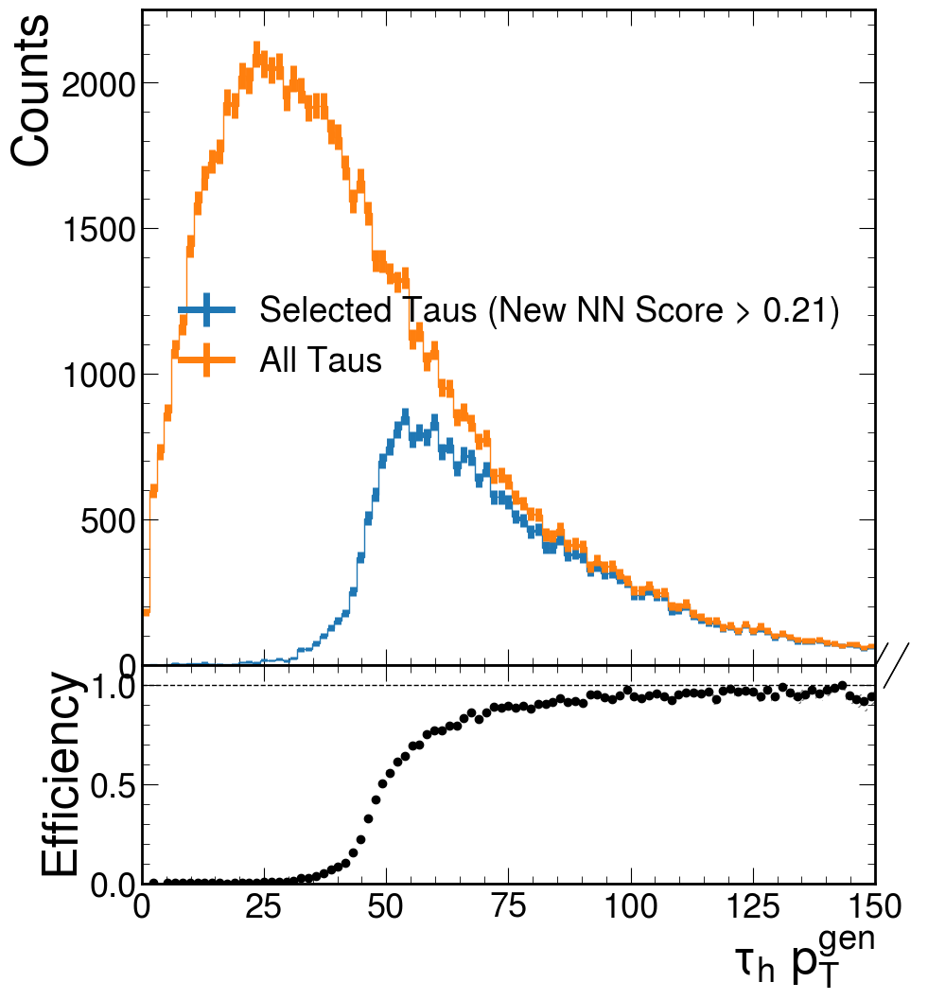

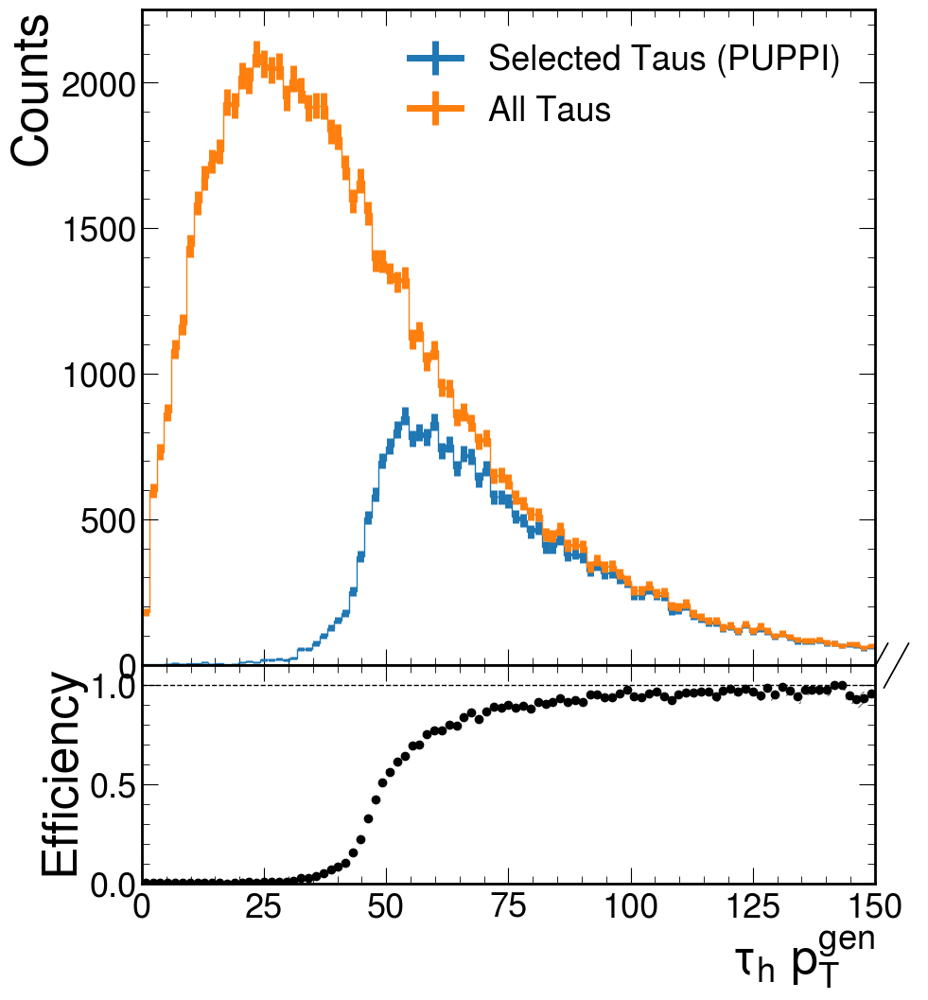

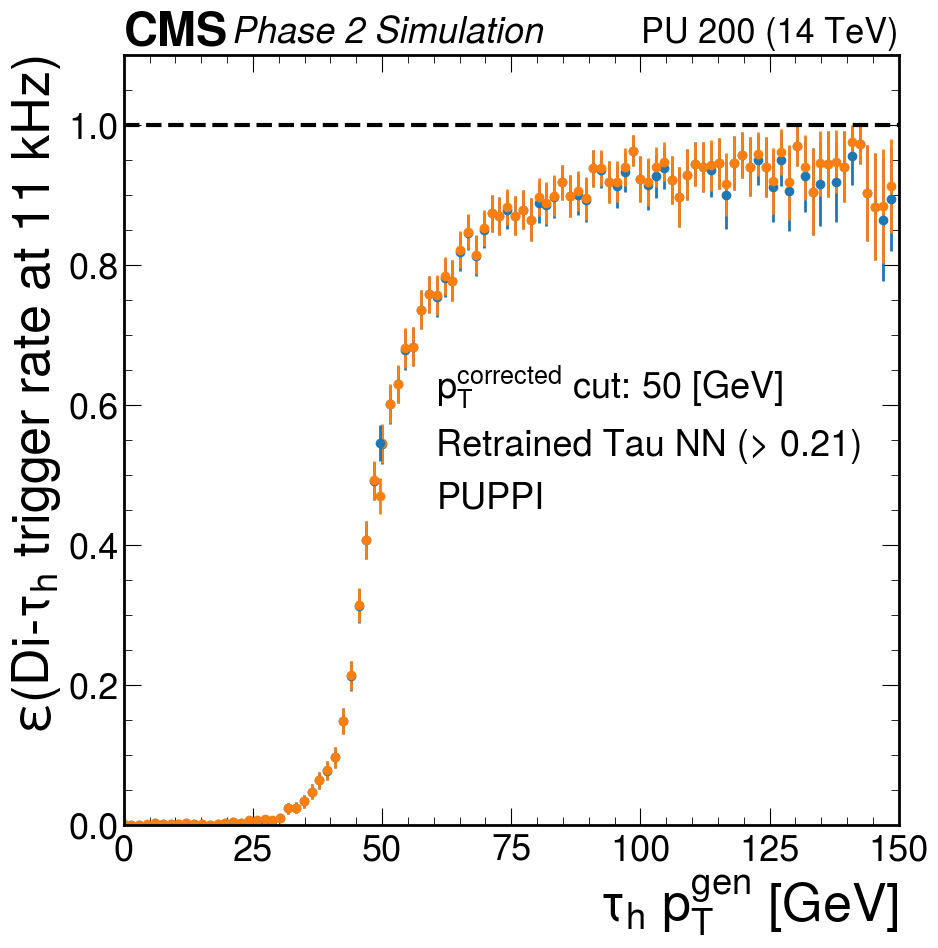

[0.00000000e+00 6.07542925e-02 0.00000000e+00 1.26288353e-01
 3.00642417e-01 8.29928561e-02 1.51891777e-02 6.61046156e-03
 1.05807771e-02 1.34049551e-03 2.08719113e-03 2.04990552e-04
 7.56990875e-04 5.66281342e-03 5.81123353e-03 3.43129319e-03
 8.78307856e-03 8.03376671e-03 1.01122727e-02 7.17455387e-03
 1.22706299e-02 2.97876945e-02 3.13271533e-02 4.22561574e-02
 5.90965467e-02 7.73824281e-02 9.20168616e-02 1.14560035e-01
 1.73183573e-01 2.50073986e-01 3.64635346e-01 4.67891420e-01
 5.64590365e-01 6.18033728e-01 6.76101247e-01 6.99169674e-01
 7.46036668e-01 7.58728365e-01 8.17259120e-01 8.23010841e-01
 8.29718562e-01 8.54686106e-01 8.58978210e-01 8.98814649e-01
 9.15544725e-01 8.95360217e-01 9.09204690e-01 9.35431424e-01
 9.37190752e-01 9.45549518e-01 9.23327651e-01 9.50273067e-01
 9.35857291e-01 9.53251779e-01 9.66103388e-01 9.43233376e-01
 9.80147856e-01 9.52326593e-01 9.74765638e-01 9.57243561e-01
 9.79100789e-01 9.77163972e-01 9.55131159e-01 9.69020038e-01
 9.73533735e-01 9.957929

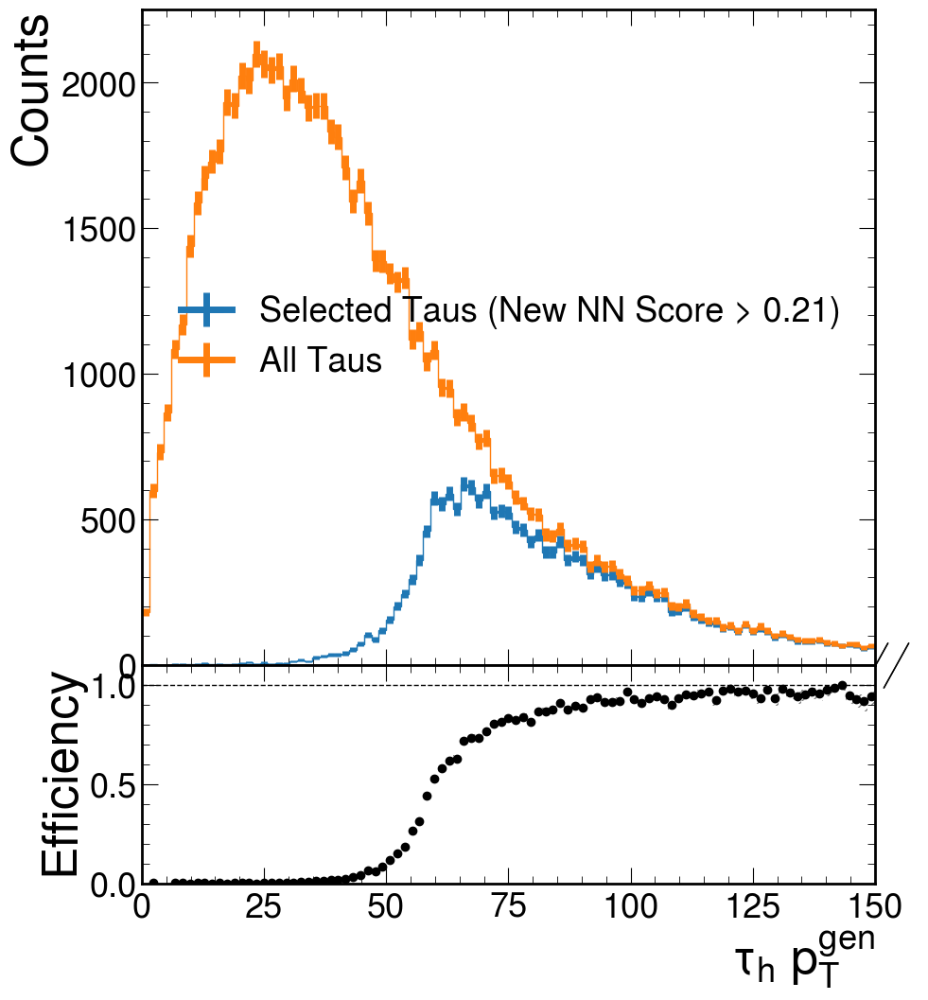

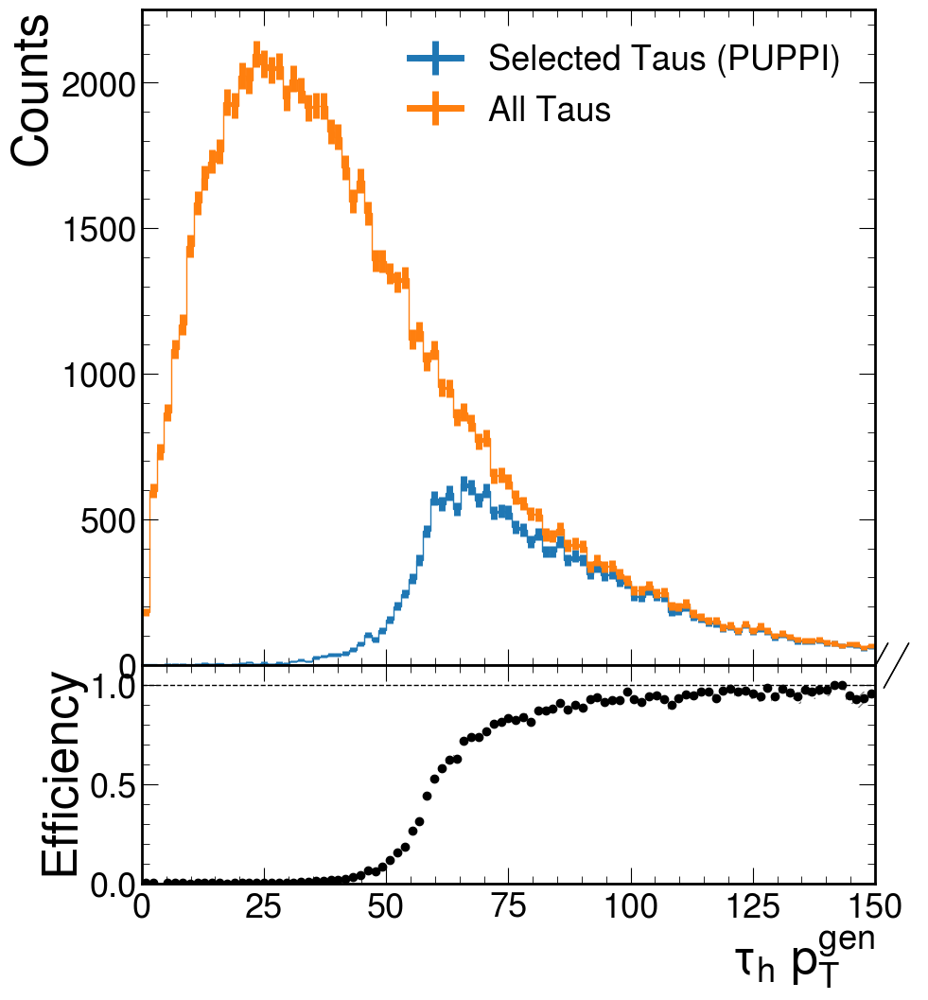

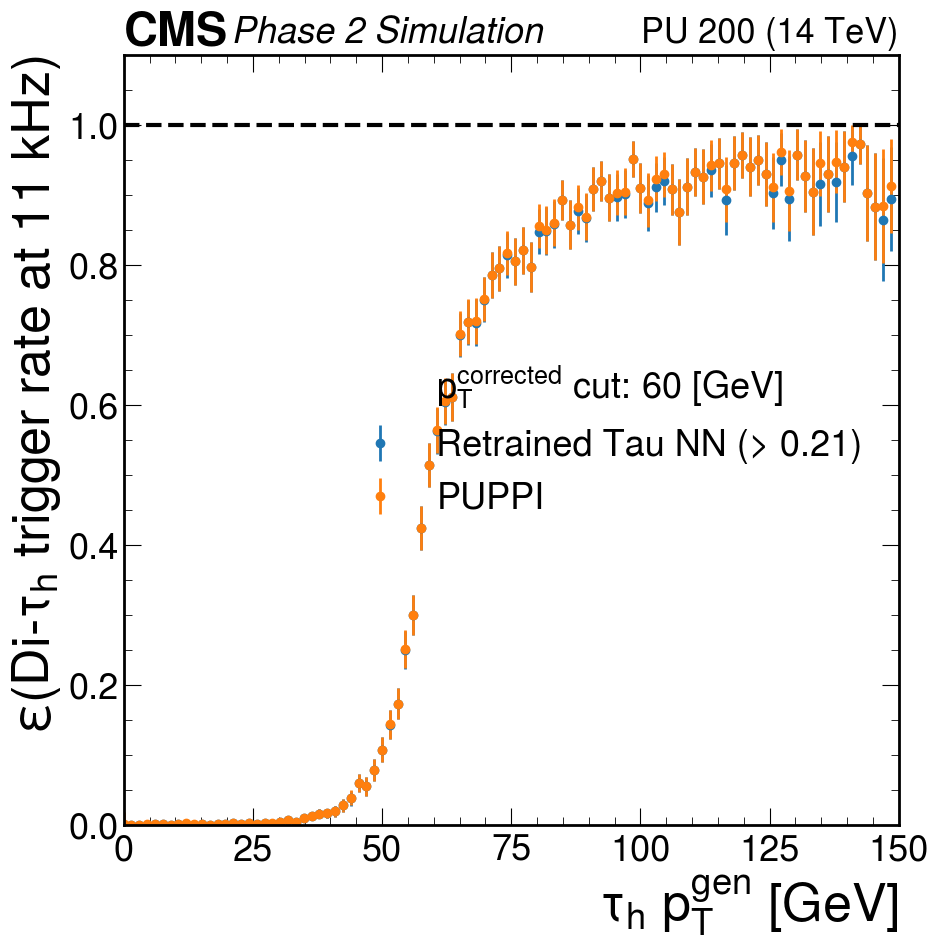

[0.00000000e+00 6.07542925e-02 0.00000000e+00 0.00000000e+00
 1.44690898e-01 4.29795568e-02 1.25763311e-03 4.33323101e-03
 6.80065062e-03 3.26954684e-04 2.08719113e-03 2.04990552e-04
 7.56990875e-04 2.65514979e-03 4.41128948e-03 5.49785665e-04
 3.22161310e-03 9.82811575e-04 2.49252916e-03 1.97698633e-03
 5.20145142e-03 7.83521788e-03 5.75599347e-03 1.25288257e-02
 1.55046232e-02 1.94338334e-02 1.91424200e-02 2.28905416e-02
 3.22213243e-02 4.44645251e-02 6.92776899e-02 6.29383540e-02
 8.91744586e-02 1.22007296e-01 1.60788509e-01 1.92143999e-01
 2.74671526e-01 3.32898604e-01 4.71377881e-01 5.57499457e-01
 6.19443918e-01 6.59563299e-01 6.75742477e-01 7.68262863e-01
 7.76576191e-01 7.90894911e-01 8.03243066e-01 8.41418089e-01
 8.56661067e-01 8.75981779e-01 8.54110030e-01 8.87118088e-01
 8.62067739e-01 9.09461722e-01 9.24938260e-01 9.02919368e-01
 9.53201590e-01 9.08450067e-01 9.49819047e-01 9.29194288e-01
 9.48555638e-01 9.61172294e-01 9.31657990e-01 9.52086683e-01
 9.40476723e-01 9.834076

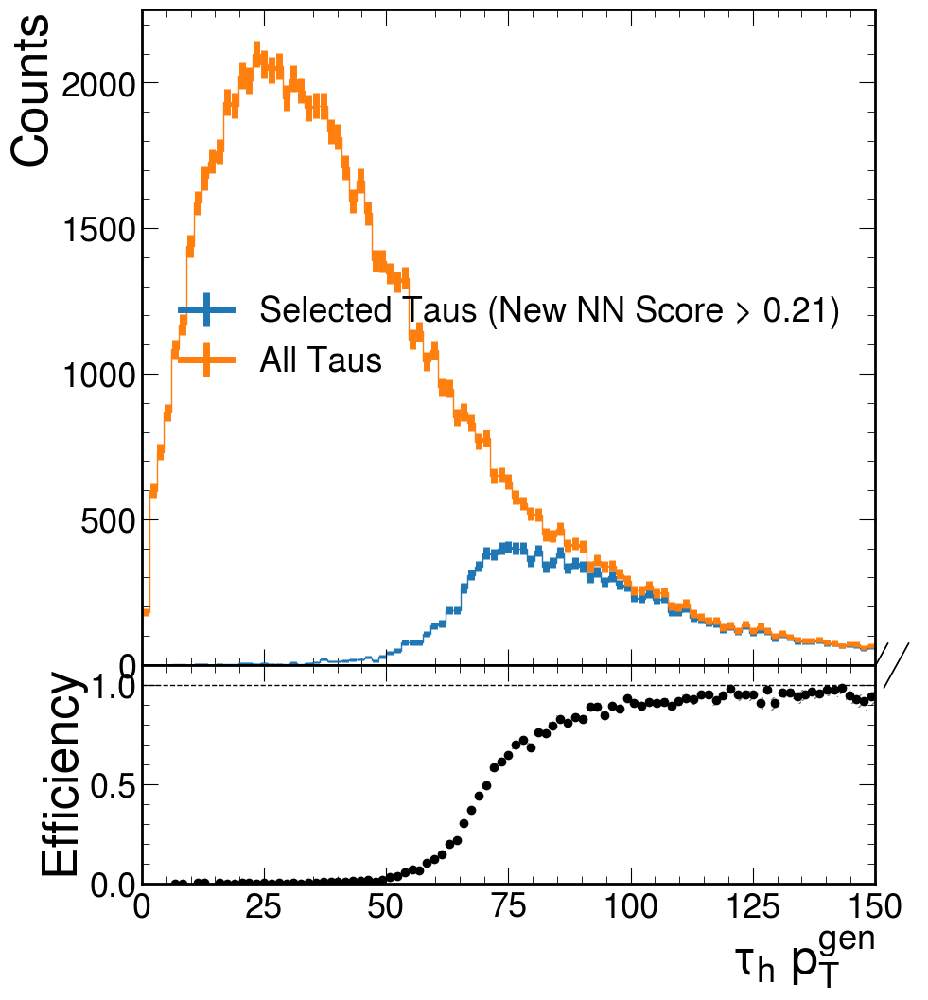

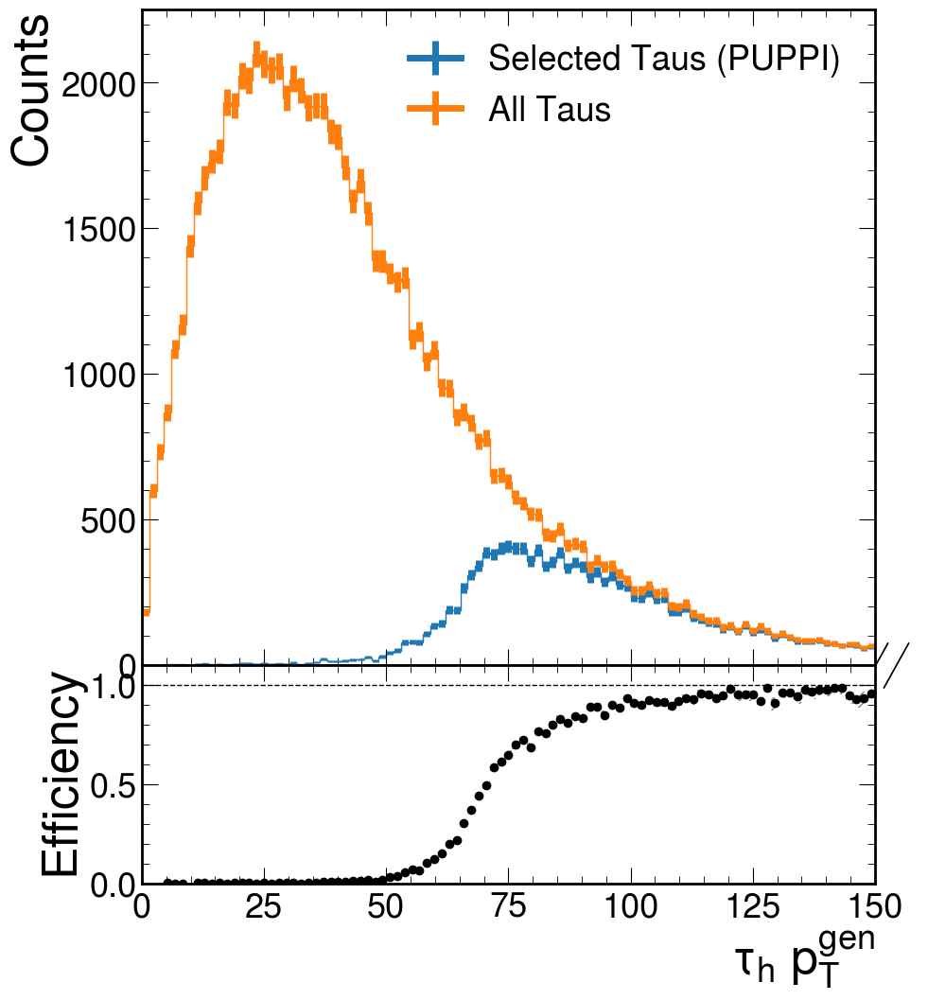

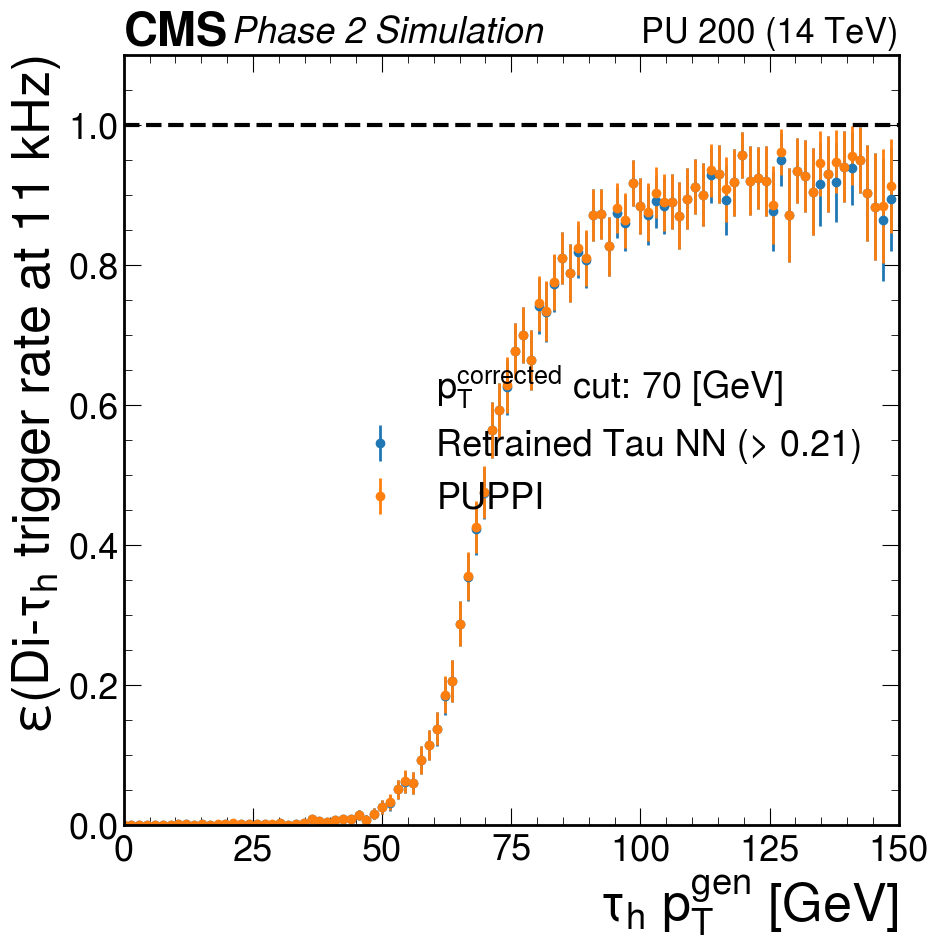

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.82744775e-02 1.04822880e-02 0.00000000e+00 2.24413940e-03
 3.27324628e-03 0.00000000e+00 1.08094823e-03 2.04990552e-04
 1.84636964e-04 2.65514979e-03 2.39458031e-03 5.49785665e-04
 2.07069783e-03 5.09001068e-04 9.41253809e-04 1.20203430e-04
 2.97098505e-03 1.12312343e-04 1.90377700e-03 3.96350168e-03
 9.62285194e-03 5.72680735e-03 5.08195611e-03 7.18923733e-03
 9.47599969e-03 9.78839356e-03 1.57516451e-02 8.53802150e-03
 1.81339035e-02 2.85802738e-02 3.52624944e-02 5.64594329e-02
 6.74160810e-02 6.64632817e-02 1.02426439e-01 1.23599042e-01
 1.50081680e-01 2.01138220e-01 2.26924311e-01 3.15375377e-01
 3.83018813e-01 4.65629433e-01 5.07938802e-01 6.03559723e-01
 6.38047247e-01 6.72962418e-01 7.17833388e-01 7.56816410e-01
 7.19019275e-01 7.95281895e-01 7.98562958e-01 8.13701123e-01
 8.64269224e-01 8.35586279e-01 8.86925218e-01 8.65523364e-01
 9.08665785e-01 9.11006347e-01 8.59380049e-01 9.28608542e-01
 8.97316847e-01 9.474757

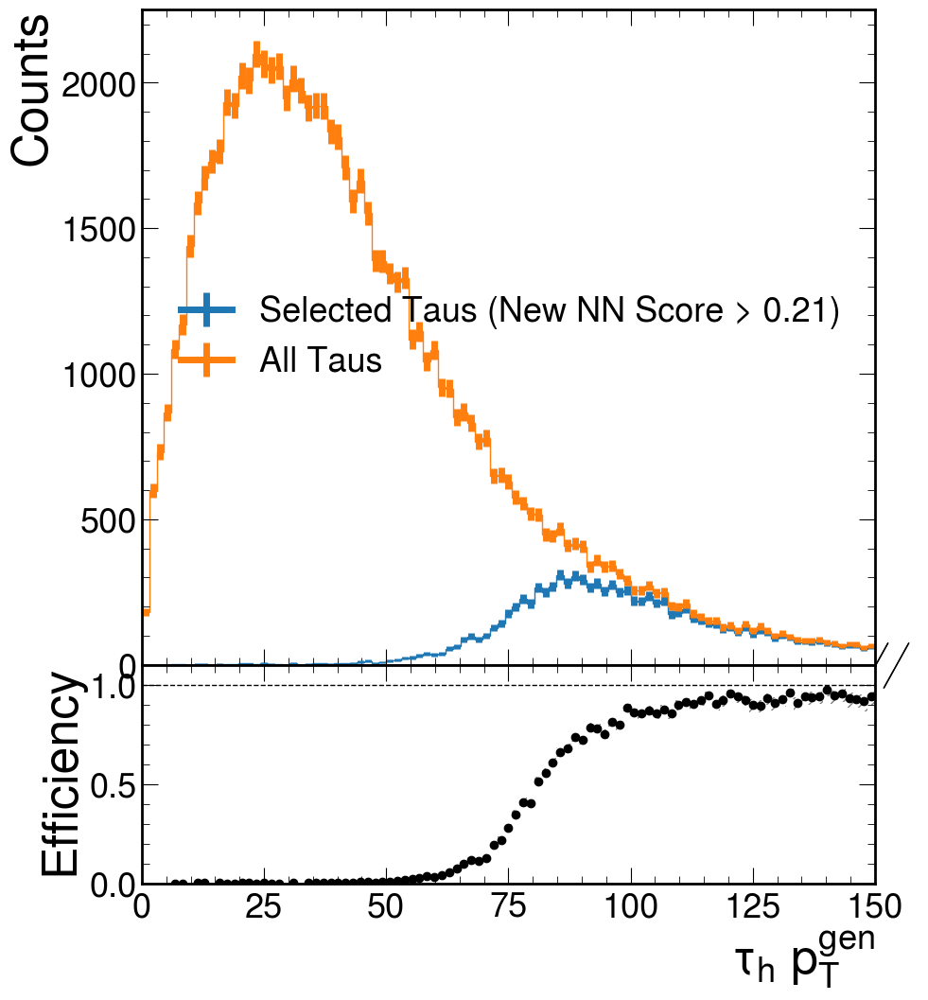

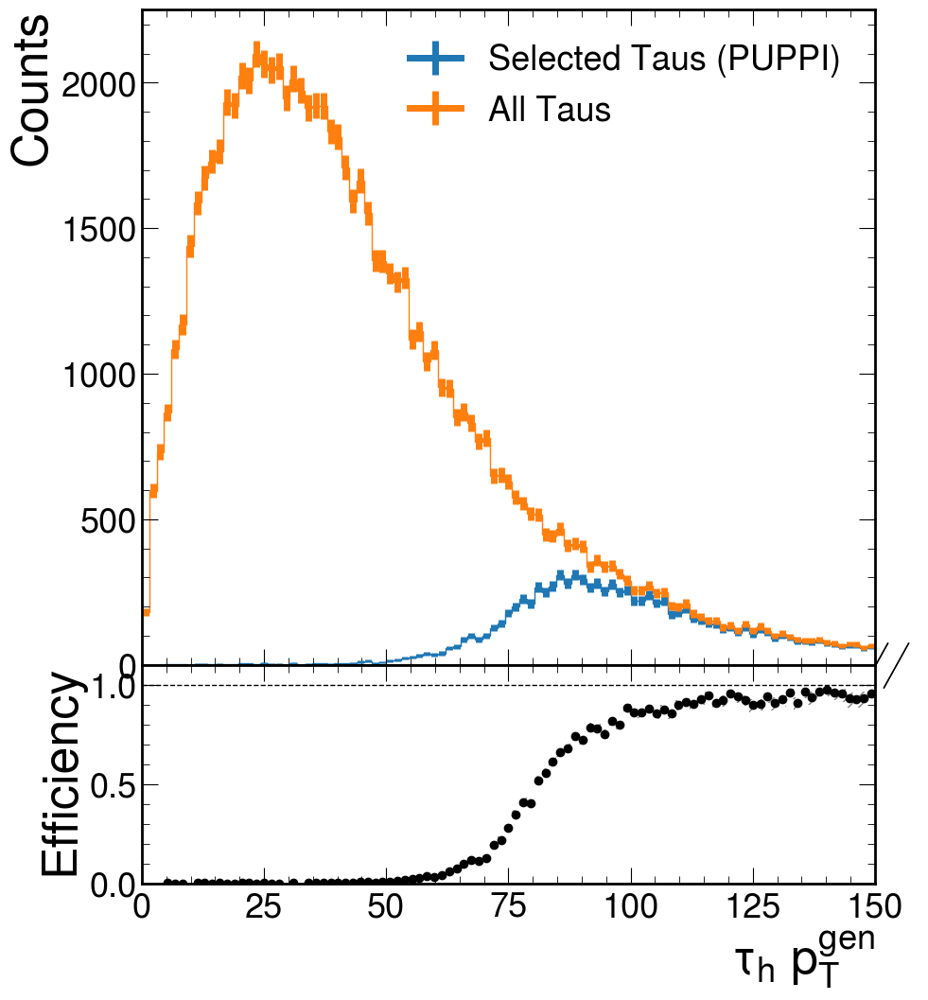

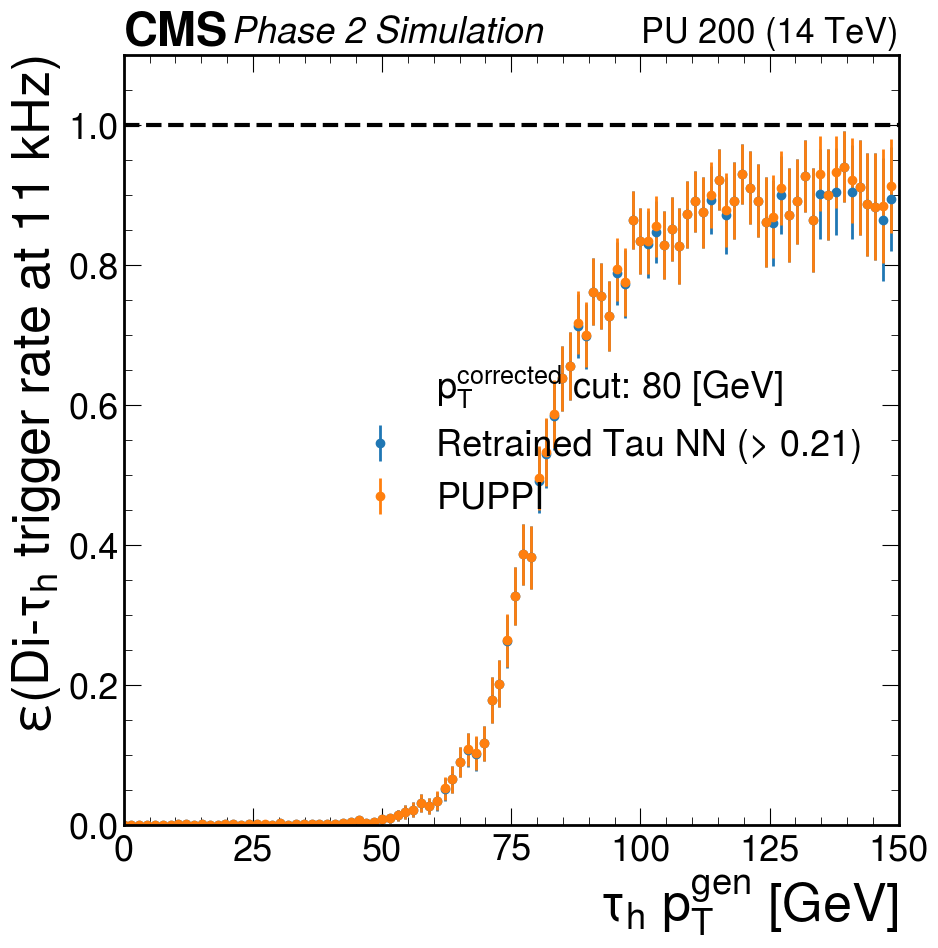

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.82744775e-02 1.04822880e-02 0.00000000e+00 2.24413940e-03
 1.69519259e-03 0.00000000e+00 1.08094823e-03 2.04990552e-04
 1.84636964e-04 1.94957874e-03 1.75825121e-03 1.34099105e-04
 2.07069783e-03 5.09001068e-04 1.18901374e-04 0.00000000e+00
 2.43398394e-03 0.00000000e+00 9.16332184e-04 1.36452523e-03
 1.36632695e-03 9.11666749e-04 1.36988634e-03 1.45450269e-03
 2.65411313e-03 4.88743403e-03 7.10059286e-03 2.35232167e-03
 4.34081050e-03 8.72909396e-03 1.03210555e-02 1.52777466e-02
 1.97559530e-02 2.38770173e-02 3.40238528e-02 2.93067250e-02
 3.69109245e-02 5.50412149e-02 7.18407083e-02 9.88178757e-02
 1.15543590e-01 1.10967423e-01 1.24464147e-01 1.90949025e-01
 2.17001019e-01 2.82110103e-01 3.46200949e-01 4.17805841e-01
 4.13859258e-01 5.27651219e-01 5.78409379e-01 6.14719517e-01
 6.81122450e-01 6.95084269e-01 7.71374244e-01 7.48463945e-01
 7.95108674e-01 7.88977899e-01 7.56530116e-01 8.36404137e-01
 8.05778986e-01 8.933684

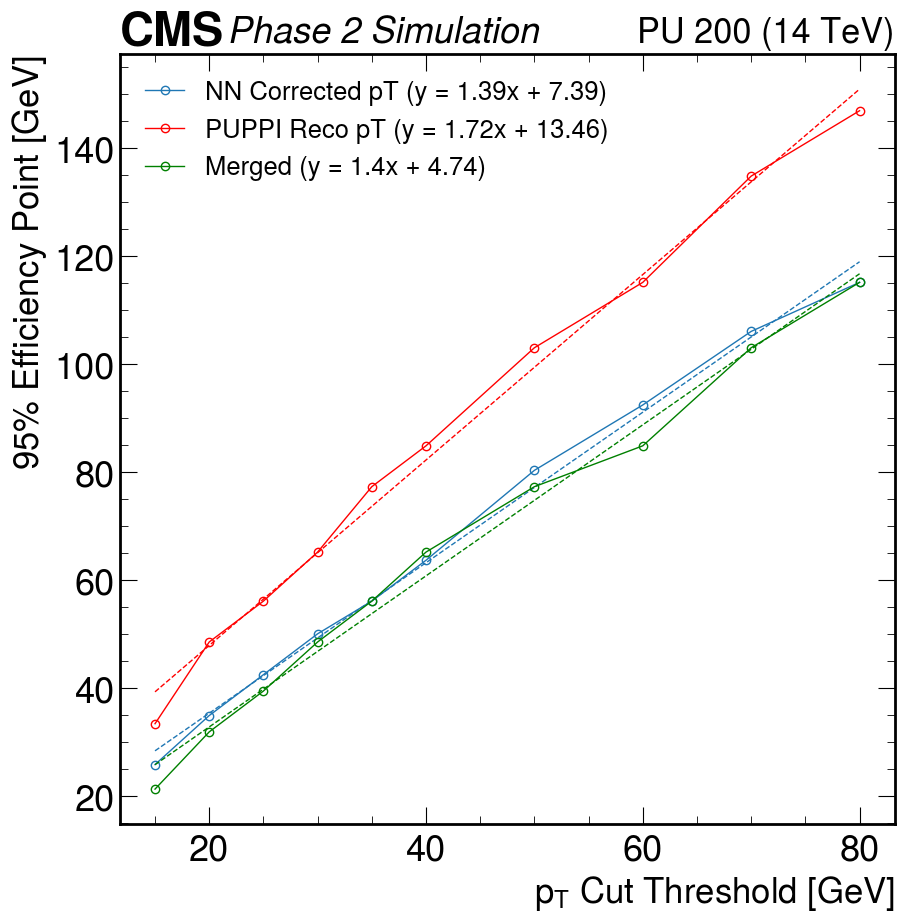

In [9]:
model = load_model("../models/pt_regress_v1_bestest.h5")
plot_95th([15, 20, 25,30,35,40,50,60,70,80], model_id_name,
                               model, '../../ntuples/Jan_25_2023/test_sig_v12_emseed.root')

In [10]:
def bob(dir_path, ModelName, test_index=400000):
    
    #Might have to change the version for other ntuple files
    data = uproot4.open(dir_path+"/test_sig_v12_emseed.root")
    inputs = data['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
    
    truth_pt = data['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    reco_pt = data['ntuplePupSingle']['tree']['pt'].array()[test_index:]
    deltaR = data['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    eta = data['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection = (reco_pt > 0.) & (abs(deltaR) < 0.4) & (abs(eta) < 2.4)
    
    truth_pt_selected = np.asarray(truth_pt[selection])
    reco_pt_selected = np.asarray(reco_pt[selection])
    X_test = np.asarray(inputs[selection])
    
    model = load_model(ModelName)
    if ModelName == '../models/merged_11_gamma33.h5':
        y_pred = model.predict(X_test)[1].flatten()
    elif ModelName == "../models/pt_regress_v1_bestest.h5":
        y_pred = model.predict(X_test).flatten()
    
    pred_pt = np.multiply(reco_pt_selected, y_pred)
    
    residual = pred_pt - truth_pt_selected
    print(min(residual))
    print(max(residual))
    plot_bins = 200
    plot_range = (-125, 75)
    p_guess=[10, 0, 0.01]
    plt.hist(residual,
         bins = plot_bins,
         range = plot_range,
         alpha = 0.5,
         density = True)
    def fit_function(x, A, mu, sig):
        return A*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

    bins = np.linspace(plot_range[0], plot_range[1], plot_bins+1)
    binscenters = np.array([0.5 * (bins[i] + bins[i+1]) for i in range(len(bins)-1)])
    
    data_entries, bin_edges = np.histogram(residual, bins=bins,
                                   range = plot_range,
                                   density = True)
    mask = data_entries!=0
    #Fit the function to the histogram data.
    popt, pcov = curve_fit(fit_function,
                           xdata=binscenters[mask],
                           ydata=data_entries[mask],
                           sigma = np.sqrt(data_entries[mask]),
                           absolute_sigma = False)
    
    #Error for parameter estimations
    perr = np.sqrt(np.diag(pcov))
    print("Error for parameter esimations: ", perr)

    std_fit = np.abs(popt[2])
    mean_fit = popt[1]
    
    print("Standard deviation (fit) is", std_fit)
    print("Mean (fit) is", mean_fit)
    
    if ModelName == '../models/merged_11_gamma33.h5':
    
        #Plot fitted gaussian
        plt.plot(bins,
                 fit_function(bins, *popt),
                 "r-",
                 linewidth=4,
                 color = "blue",
                 label='Best fit (merged)')
    elif ModelName == "../models/pt_regress_v1_bestest.h5":
        #Plot fitted gaussian
        plt.plot(bins,
                 fit_function(bins, *popt),
                 "r-",
                 linewidth=4,
                 color = "orange",
                 label='Best fit (separate)')

    plt.plot([],[], 'none', label=r'$\mu=%.2f$'%popt[1])
    plt.plot([],[], 'none', label=r'$\sigma=%.4f$'%abs(popt[2]))
    
    plt.xlabel("$p_T^{corrected} - p_T^{gen}$ [GeV]", fontsize = 27)
    plt.ylabel('Normalized counts')

    plt.legend()
    #plt.show()

    
def bob_PUPPI(dir_path, test_index=400000):
    
    #Might have to change the version for other ntuple files
    data = uproot4.open(dir_path+"/test_sig_v12_emseed.root")
    inputs = data['ntuplePupSingle']['tree']['m_inputs'].array()[test_index:]
    
    truth_pt = data['ntuplePupSingle']['tree']['genpt1'].array()[test_index:]
    reco_pt = data['ntuplePupSingle']['tree']['pt'].array()[test_index:]
    deltaR = data['ntuplePupSingle']['tree']['gendr1'].array()[test_index:]
    eta = data['ntuplePupSingle']['tree']['geneta1'].array()[test_index:]

    selection = (reco_pt > 0.) & (abs(deltaR) < 0.4) & (abs(eta) < 2.4)
    
    truth_pt_selected = np.asarray(truth_pt[selection])
    reco_pt_selected = np.asarray(reco_pt[selection])
    X_test = np.asarray(inputs[selection])
    
    residual = reco_pt_selected - truth_pt_selected
    print(min(residual))
    print(max(residual))
    plot_bins = 200
    plot_range = (-125, 75)
    p_guess=[10, 0, 0.01]
    plt.hist(residual,
         bins = plot_bins,
         range = plot_range,
         alpha = 0.5,
         density = True)
    def fit_function(x, A, mu, sig):
        return A*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

    bins = np.linspace(plot_range[0], plot_range[1], plot_bins+1)
    binscenters = np.array([0.5 * (bins[i] + bins[i+1]) for i in range(len(bins)-1)])
    
    data_entries, bin_edges = np.histogram(residual, bins=bins,
                                   range = plot_range,
                                   density = True)
    mask = data_entries!=0
    #Fit the function to the histogram data.
    popt, pcov = curve_fit(fit_function,
                           xdata=binscenters[mask],
                           ydata=data_entries[mask],
                           sigma = np.sqrt(data_entries[mask]),
                           absolute_sigma = False)
    
    #Error for parameter estimations
    perr = np.sqrt(np.diag(pcov))
    print("Error for parameter esimations: ", perr)

    std_fit = np.abs(popt[2])
    mean_fit = popt[1]
    
    print("Standard deviation (fit) is", std_fit)
    print("Mean (fit) is", mean_fit)
    
    
    #Plot fitted gaussian
    plt.plot(bins,
             fit_function(bins, *popt),
             "r-",
             linewidth=4,
             color = "green",
             label='Best fit (PUPPI)')

    plt.plot([],[], 'none', label=r'$\mu=%.2f$'%popt[1])
    plt.plot([],[], 'none', label=r'$\sigma=%.4f$'%abs(popt[2]))
    
    plt.xlabel("$p_T^{PUPPI} - p_T^{gen}$ [GeV]", fontsize = 27)
    plt.ylabel('Normalized counts')

    plt.legend()
    plt.show()


2043/2043 [==============================] - 2s 1ms/step
-693.4375
4125.597
Error for parameter esimations:  [0.00168479 0.26036394 0.23112292]
Standard deviation (fit) is 8.344277479908538
Mean (fit) is 0.9555583178997151


/tmp/ipykernel_602695/2530667525.py:67: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r-" (-> color='r'). The keyword argument will take precedence.
  plt.plot(bins,


2043/2043 [==============================] - 2s 858us/step
-738.8678
4544.9214
Error for parameter esimations:  [0.00164242 0.23224095 0.20048455]
Standard deviation (fit) is 7.991776566263976
Mean (fit) is -0.7279981618610768


/tmp/ipykernel_602695/2530667525.py:75: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r-" (-> color='r'). The keyword argument will take precedence.
  plt.plot(bins,


-651.4521
3806.4905
Error for parameter esimations:  [0.00190064 0.44659748 0.39176166]
Standard deviation (fit) is 9.263166631730959
Mean (fit) is -5.565657579045224


/tmp/ipykernel_602695/2530667525.py:149: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r-" (-> color='r'). The keyword argument will take precedence.
  plt.plot(bins,


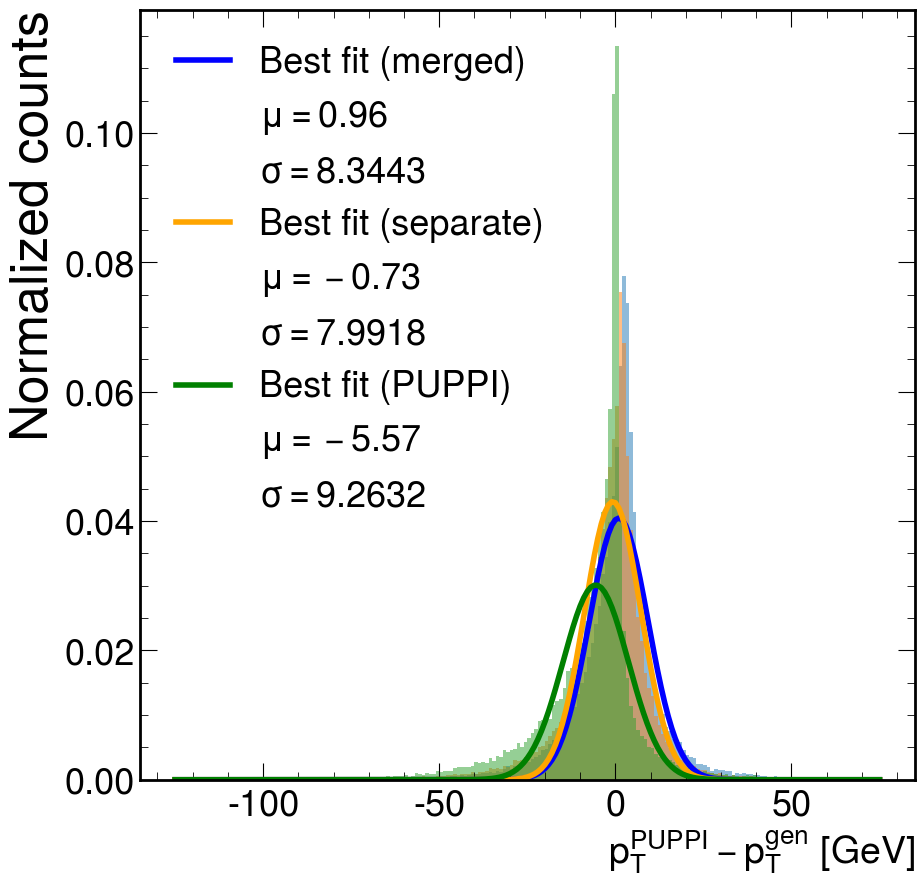

In [11]:
merged_model = load_model('../models/merged_11_gamma33.h5')
model = load_model("../models/pt_regress_v1_bestest.h5")
bob("../../ntuples/Jan_25_2023", '../models/merged_11_gamma33.h5')
bob("../../ntuples/Jan_25_2023", "../models/pt_regress_v1_bestest.h5")
bob_PUPPI("../../ntuples/Jan_25_2023")

-651.4521
3806.4905
Error for parameter esimations:  [0.00190064 0.44659748 0.39176166]
Standard deviation (fit) is 9.263166631730959
Mean (fit) is -5.565657579045224


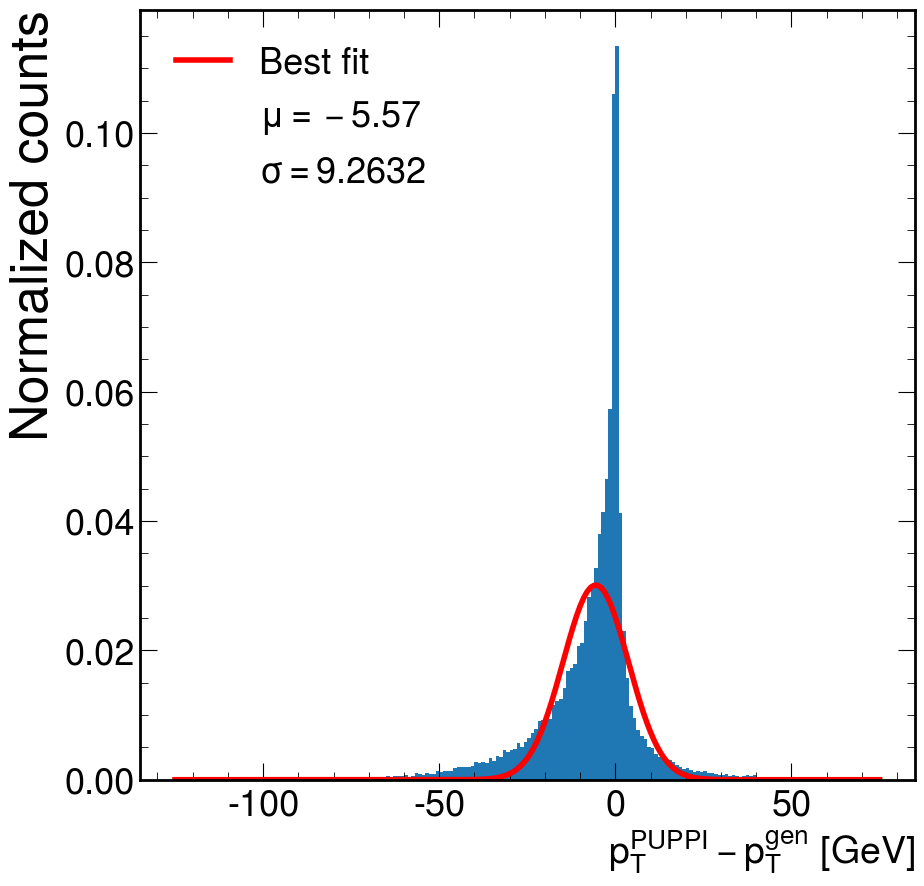

In [32]:
bob_PUPPI("../../ntuples/Jan_25_2023")